In [1]:
#Import tensorflow

import tensorflow as tf
tf.compat.v1.disable_v2_behavior()
gpu_devices = tf.config.experimental.list_physical_devices("GPU")
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
#Test if GPU is found

if tf.test.gpu_device_name():
    print('GPU found')
else:
    print("No GPU found")

GPU found


In [3]:
#Autosaving every 10s

%autosave 10

Autosaving every 10 seconds


In [4]:
#Training & Testing files

xtrain_file = "xtrain.csv"
ytrain_file = "ytrain.csv"
xval_file = "xval.csv"
yval_file = "yval.csv"
xtest_file = "xtest.csv"
ytest_file = "ytest.csv"

In [5]:
import pandas as pd
import numpy as np
import scipy.io
import tensorflow_probability as tfp
import matplotlib as plt
import matplotlib.pyplot as plt
import pickle
import scipy.io as spio
import pickle
from tensorflow.keras import optimizers, regularizers
from tensorflow.keras.models import Sequential, model_from_json, load_model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Masking
tfd = tfp.distributions

In [6]:
# fix random seed for reproducibility

np.random.seed(0)

In [7]:
#load Training & Testing files into Pandas Dataframes

xtrain = pd.read_csv(xtrain_file, index_col=False)
ytrain = pd.read_csv(ytrain_file, index_col=False)
xval = pd.read_csv(xval_file, index_col=False)
yval = pd.read_csv(yval_file, index_col=False)
xtest = pd.read_csv(xtest_file, index_col=False)
ytest = pd.read_csv(ytest_file, index_col=False)

In [8]:
#Load Hyperparameters Obtained by BayesOpt

matlab_file = 'N1_3.mat'
mat = spio.loadmat(matlab_file, squeeze_me=True)
lr = mat['lr']
ep = mat['ep']
epochs = mat['epochs']
batch = mat['batch']
L2 = mat['L2'] 
unit1 = mat['unit'] 
size1 = mat['size']
drop1 = mat['drop']

C:\Users\Asus\anaconda3\lib\site-packages\scipy\io\matlab\mio.py:218: MatReadWarning: Duplicate variable name "None" in stream - replacing previous with new
Consider mio5.varmats_from_mat to split file into single variable files
  matfile_dict = MR.get_variables(variable_names)


In [9]:
#Xtrain to Numpy multidimensional array

xtrain = xtrain.to_numpy()
xtrain = xtrain.reshape(278,24,4)

In [10]:
#Ytrain to Numpy multidimensional array

ytrain = ytrain.to_numpy()
ytrain = ytrain.reshape(278,24,1)

In [11]:
#Xval to Numpy multidimensional array

xval = xval.to_numpy()
xval = xval.reshape(34,24,4)

In [12]:
#Yval to Numpy multidimensional array

yval = yval.to_numpy()
yval = yval.reshape(34,24,1)

In [13]:
#Xtest to Numpy multidimensional array

xtest = xtest.to_numpy()
xtest = xtest.reshape(34,24,4)

In [14]:
#Ground truth to Numpy multidimensional array

ytest = ytest.to_numpy()
ytest = ytest.reshape(34,24,1)

In [15]:
#Ytrain2 to Numpy multidimensional array - for SHAP

ytrain2 = np.zeros((278,1))
for i in range(278):
    ytrain2[i] =  ytrain[i][0]
    
ytrain2=ytrain2.reshape(278,)

In [16]:
#Yval2 to Numpy multidimensional array - for SHAP

yval2 = np.zeros((34,1))
for i in range(34):
    yval2[i] =  yval[i][0]
    
yval2 =yval2.reshape(34,)

In [17]:
#Set ytrain, yval for 3 outputs

x_train = xtrain
y_train = [ytrain,ytrain]
x_val = xval
y_val = [yval,yval]
x_test = xtest

In [18]:
import sklearn
import math
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback,ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Reshape
import warnings
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Lambda, concatenate
from tensorflow.keras.models import Model
from IPython.display import display
from sklearn import metrics

In [19]:
#Define trainable prior

def posterior_mean_field(kernel_size, bias_size=0, dtype=None):
  n = kernel_size + bias_size
  c = np.log(np.expm1(1.))
  return tf.keras.Sequential([
      tfp.layers.VariableLayer(2 * n, dtype=dtype),
      tfp.layers.DistributionLambda(lambda t: tfd.Independent(
          tfd.Normal(loc=t[..., :n],
                     scale=1e-5 + tf.nn.softplus(c + t[..., n:])),
          reinterpreted_batch_ndims=1)),
  ])

# Specify the prior over `keras.layers.Dense` `kernel` and `bias`.
def prior_trainable(kernel_size, bias_size=0, dtype=None):
  n = kernel_size + bias_size
  return tf.keras.Sequential([
      tfp.layers.VariableLayer(n, dtype=dtype),
      tfp.layers.DistributionLambda(lambda t: tfd.Independent(
          tfd.Normal(loc=t, scale=1),
          reinterpreted_batch_ndims=1)),
  ])

In [20]:
#Define probabilistic LSTM, fx

#LSTM layers

inputs = tf.keras.Input(shape=(24,4),dtype='float32')
layer1 = LSTM(unit1,return_sequences = True)(inputs)
layer2 = Dense(size1)(layer1)

#Output 1 = Aleatoric output layer

layer3 = Dense(1+1)(layer2)
layer4 = tfp.layers.DistributionLambda(lambda t: tfd.Normal(loc=t[..., :1],scale=1e-3 + tf.math.softplus(0.05 * t[..., 1:])),name='out1')(layer3) #aleatoric

#Output 2 = Epistemic output layer

layer5 = tfp.layers.DenseVariational(1, posterior_mean_field, prior_trainable)(layer2)
layer6 = tfp.layers.DistributionLambda(lambda t: tfd.Normal(loc=t, scale=1),name = 'out2')(layer5)

model = tf.keras.Model(inputs=inputs, outputs=[layer4,layer6])
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 24, 4)]      0                                            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 24, 890)      3186200     input_1[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 24, 33)       29403       lstm[0][0]                       
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 24, 2)        68          dense[0][0]                      
_______________________________________________________________________________________

In [21]:
#Define directory for best weights checkpoint

import os
checkpoint_path = "C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint/N1-2_ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

#Callback for best weights checkpoint

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True,
    verbose = 1)

In [22]:
#Compile model

optimizers.Adam(learning_rate=lr, beta_1 = 0.9,beta_2 = 0.999, epsilon = ep, amsgrad = False, name = "Adam")
negloglik = lambda y, rv_y: -rv_y.log_prob(y)
model.compile(loss = {'out1': negloglik,'out2': negloglik},loss_weights=[0.5,0.5],optimizer= 'Adam')

In [23]:
# Run training

history = model.fit(x_train, y_train, validation_data = (x_val, y_val), epochs = 5000, batch_size  = batch, verbose = 0, callbacks=[model_checkpoint_callback])

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.

Epoch 00001: val_loss improved from inf to 11405452.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00002: val_loss improved from 11405452.00000 to 9028645.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00003: val_loss improved from 9028645.00000 to 8132163.50000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00004: val_loss improved from 8132163.50000 to 7912546.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00005: val_loss improved from 7912546.00000 to 7895639.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00006: val_loss improved from 7895639.00000 to 7346098.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N


Epoch 00108: val_loss did not improve from 1442280.25000

Epoch 00109: val_loss did not improve from 1442280.25000

Epoch 00110: val_loss did not improve from 1442280.25000

Epoch 00111: val_loss did not improve from 1442280.25000

Epoch 00112: val_loss did not improve from 1442280.25000

Epoch 00113: val_loss did not improve from 1442280.25000

Epoch 00114: val_loss did not improve from 1442280.25000

Epoch 00115: val_loss did not improve from 1442280.25000

Epoch 00116: val_loss improved from 1442280.25000 to 1387144.25000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00117: val_loss did not improve from 1387144.25000

Epoch 00118: val_loss did not improve from 1387144.25000

Epoch 00119: val_loss improved from 1387144.25000 to 908857.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00120: val_loss did not improve from 908857.00000

Epoch 00121: val_loss did not improve from 908857.00000

Epoch 


Epoch 00233: val_loss did not improve from 215602.45312

Epoch 00234: val_loss did not improve from 215602.45312

Epoch 00235: val_loss did not improve from 215602.45312

Epoch 00236: val_loss did not improve from 215602.45312

Epoch 00237: val_loss did not improve from 215602.45312

Epoch 00238: val_loss did not improve from 215602.45312

Epoch 00239: val_loss did not improve from 215602.45312

Epoch 00240: val_loss did not improve from 215602.45312

Epoch 00241: val_loss did not improve from 215602.45312

Epoch 00242: val_loss did not improve from 215602.45312

Epoch 00243: val_loss did not improve from 215602.45312

Epoch 00244: val_loss did not improve from 215602.45312

Epoch 00245: val_loss did not improve from 215602.45312

Epoch 00246: val_loss did not improve from 215602.45312

Epoch 00247: val_loss did not improve from 215602.45312

Epoch 00248: val_loss did not improve from 215602.45312

Epoch 00249: val_loss improved from 215602.45312 to 211097.62500, saving model to C:/Us


Epoch 00356: val_loss did not improve from 174861.93750

Epoch 00357: val_loss did not improve from 174861.93750

Epoch 00358: val_loss did not improve from 174861.93750

Epoch 00359: val_loss did not improve from 174861.93750

Epoch 00360: val_loss did not improve from 174861.93750

Epoch 00361: val_loss improved from 174861.93750 to 174833.81250, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00362: val_loss did not improve from 174833.81250

Epoch 00363: val_loss improved from 174833.81250 to 172547.93750, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00364: val_loss did not improve from 172547.93750

Epoch 00365: val_loss did not improve from 172547.93750

Epoch 00366: val_loss did not improve from 172547.93750

Epoch 00367: val_loss did not improve from 172547.93750

Epoch 00368: val_loss did not improve from 172547.93750

Epoch 00369: val_loss did not improve from 172547.93750

Epoch 00370: val_lo


Epoch 00484: val_loss improved from 141491.32812 to 138230.59375, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00485: val_loss improved from 138230.59375 to 135514.00000, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00486: val_loss did not improve from 135514.00000

Epoch 00487: val_loss did not improve from 135514.00000

Epoch 00488: val_loss did not improve from 135514.00000

Epoch 00489: val_loss did not improve from 135514.00000

Epoch 00490: val_loss did not improve from 135514.00000

Epoch 00491: val_loss did not improve from 135514.00000

Epoch 00492: val_loss did not improve from 135514.00000

Epoch 00493: val_loss did not improve from 135514.00000

Epoch 00494: val_loss did not improve from 135514.00000

Epoch 00495: val_loss did not improve from 135514.00000

Epoch 00496: val_loss did not improve from 135514.00000

Epoch 00497: val_loss did not improve from 135514.00000

Epoch 00498: val_lo


Epoch 00611: val_loss improved from 107472.38281 to 104601.80469, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00612: val_loss did not improve from 104601.80469

Epoch 00613: val_loss did not improve from 104601.80469

Epoch 00614: val_loss did not improve from 104601.80469

Epoch 00615: val_loss did not improve from 104601.80469

Epoch 00616: val_loss did not improve from 104601.80469

Epoch 00617: val_loss did not improve from 104601.80469

Epoch 00618: val_loss did not improve from 104601.80469

Epoch 00619: val_loss did not improve from 104601.80469

Epoch 00620: val_loss did not improve from 104601.80469

Epoch 00621: val_loss did not improve from 104601.80469

Epoch 00622: val_loss did not improve from 104601.80469

Epoch 00623: val_loss did not improve from 104601.80469

Epoch 00624: val_loss did not improve from 104601.80469

Epoch 00625: val_loss did not improve from 104601.80469

Epoch 00626: val_loss did not improve from 104601.804


Epoch 00735: val_loss did not improve from 79826.01562

Epoch 00736: val_loss improved from 79826.01562 to 79328.14844, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00737: val_loss did not improve from 79328.14844

Epoch 00738: val_loss did not improve from 79328.14844

Epoch 00739: val_loss did not improve from 79328.14844

Epoch 00740: val_loss did not improve from 79328.14844

Epoch 00741: val_loss did not improve from 79328.14844

Epoch 00742: val_loss did not improve from 79328.14844

Epoch 00743: val_loss did not improve from 79328.14844

Epoch 00744: val_loss did not improve from 79328.14844

Epoch 00745: val_loss did not improve from 79328.14844

Epoch 00746: val_loss did not improve from 79328.14844

Epoch 00747: val_loss did not improve from 79328.14844

Epoch 00748: val_loss improved from 79328.14844 to 75204.39062, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 00749: val_loss did not impro


Epoch 00863: val_loss did not improve from 54342.85547

Epoch 00864: val_loss did not improve from 54342.85547

Epoch 00865: val_loss did not improve from 54342.85547

Epoch 00866: val_loss did not improve from 54342.85547

Epoch 00867: val_loss did not improve from 54342.85547

Epoch 00868: val_loss did not improve from 54342.85547

Epoch 00869: val_loss did not improve from 54342.85547

Epoch 00870: val_loss did not improve from 54342.85547

Epoch 00871: val_loss did not improve from 54342.85547

Epoch 00872: val_loss did not improve from 54342.85547

Epoch 00873: val_loss did not improve from 54342.85547

Epoch 00874: val_loss did not improve from 54342.85547

Epoch 00875: val_loss did not improve from 54342.85547

Epoch 00876: val_loss did not improve from 54342.85547

Epoch 00877: val_loss did not improve from 54342.85547

Epoch 00878: val_loss did not improve from 54342.85547

Epoch 00879: val_loss did not improve from 54342.85547

Epoch 00880: val_loss did not improve from 5434


Epoch 00992: val_loss did not improve from 32665.88477

Epoch 00993: val_loss did not improve from 32665.88477

Epoch 00994: val_loss did not improve from 32665.88477

Epoch 00995: val_loss did not improve from 32665.88477

Epoch 00996: val_loss did not improve from 32665.88477

Epoch 00997: val_loss did not improve from 32665.88477

Epoch 00998: val_loss did not improve from 32665.88477

Epoch 00999: val_loss did not improve from 32665.88477

Epoch 01000: val_loss did not improve from 32665.88477

Epoch 01001: val_loss did not improve from 32665.88477

Epoch 01002: val_loss did not improve from 32665.88477

Epoch 01003: val_loss did not improve from 32665.88477

Epoch 01004: val_loss did not improve from 32665.88477

Epoch 01005: val_loss did not improve from 32665.88477

Epoch 01006: val_loss did not improve from 32665.88477

Epoch 01007: val_loss did not improve from 32665.88477

Epoch 01008: val_loss improved from 32665.88477 to 30689.08984, saving model to C:/Users/Asus/Desktop/B


Epoch 01118: val_loss did not improve from 15788.19043

Epoch 01119: val_loss did not improve from 15788.19043

Epoch 01120: val_loss did not improve from 15788.19043

Epoch 01121: val_loss did not improve from 15788.19043

Epoch 01122: val_loss did not improve from 15788.19043

Epoch 01123: val_loss did not improve from 15788.19043

Epoch 01124: val_loss did not improve from 15788.19043

Epoch 01125: val_loss did not improve from 15788.19043

Epoch 01126: val_loss did not improve from 15788.19043

Epoch 01127: val_loss did not improve from 15788.19043

Epoch 01128: val_loss improved from 15788.19043 to 14493.07910, saving model to C:/Users/Asus/Desktop/Bayes_Lstm_N1-2/model checkpoint\N1-2_ckpt

Epoch 01129: val_loss did not improve from 14493.07910

Epoch 01130: val_loss did not improve from 14493.07910

Epoch 01131: val_loss did not improve from 14493.07910

Epoch 01132: val_loss did not improve from 14493.07910

Epoch 01133: val_loss did not improve from 14493.07910

Epoch 01134: 


Epoch 01250: val_loss did not improve from 4731.76514

Epoch 01251: val_loss did not improve from 4731.76514

Epoch 01252: val_loss did not improve from 4731.76514

Epoch 01253: val_loss did not improve from 4731.76514

Epoch 01254: val_loss did not improve from 4731.76514

Epoch 01255: val_loss did not improve from 4731.76514

Epoch 01256: val_loss did not improve from 4731.76514

Epoch 01257: val_loss did not improve from 4731.76514

Epoch 01258: val_loss did not improve from 4731.76514

Epoch 01259: val_loss did not improve from 4731.76514

Epoch 01260: val_loss did not improve from 4731.76514

Epoch 01261: val_loss did not improve from 4731.76514

Epoch 01262: val_loss did not improve from 4731.76514

Epoch 01263: val_loss did not improve from 4731.76514

Epoch 01264: val_loss did not improve from 4731.76514

Epoch 01265: val_loss did not improve from 4731.76514

Epoch 01266: val_loss did not improve from 4731.76514

Epoch 01267: val_loss did not improve from 4731.76514

Epoch 012


Epoch 01387: val_loss did not improve from 1166.67554

Epoch 01388: val_loss did not improve from 1166.67554

Epoch 01389: val_loss did not improve from 1166.67554

Epoch 01390: val_loss did not improve from 1166.67554

Epoch 01391: val_loss did not improve from 1166.67554

Epoch 01392: val_loss did not improve from 1166.67554

Epoch 01393: val_loss did not improve from 1166.67554

Epoch 01394: val_loss did not improve from 1166.67554

Epoch 01395: val_loss did not improve from 1166.67554

Epoch 01396: val_loss did not improve from 1166.67554

Epoch 01397: val_loss did not improve from 1166.67554

Epoch 01398: val_loss did not improve from 1166.67554

Epoch 01399: val_loss did not improve from 1166.67554

Epoch 01400: val_loss did not improve from 1166.67554

Epoch 01401: val_loss did not improve from 1166.67554

Epoch 01402: val_loss did not improve from 1166.67554

Epoch 01403: val_loss did not improve from 1166.67554

Epoch 01404: val_loss did not improve from 1166.67554

Epoch 014


Epoch 01536: val_loss did not improve from 1166.67554

Epoch 01537: val_loss did not improve from 1166.67554

Epoch 01538: val_loss did not improve from 1166.67554

Epoch 01539: val_loss did not improve from 1166.67554

Epoch 01540: val_loss did not improve from 1166.67554

Epoch 01541: val_loss did not improve from 1166.67554

Epoch 01542: val_loss did not improve from 1166.67554

Epoch 01543: val_loss did not improve from 1166.67554

Epoch 01544: val_loss did not improve from 1166.67554

Epoch 01545: val_loss did not improve from 1166.67554

Epoch 01546: val_loss did not improve from 1166.67554

Epoch 01547: val_loss did not improve from 1166.67554

Epoch 01548: val_loss did not improve from 1166.67554

Epoch 01549: val_loss did not improve from 1166.67554

Epoch 01550: val_loss did not improve from 1166.67554

Epoch 01551: val_loss did not improve from 1166.67554

Epoch 01552: val_loss did not improve from 1166.67554

Epoch 01553: val_loss did not improve from 1166.67554

Epoch 015


Epoch 01685: val_loss did not improve from 1166.67554

Epoch 01686: val_loss did not improve from 1166.67554

Epoch 01687: val_loss did not improve from 1166.67554

Epoch 01688: val_loss did not improve from 1166.67554

Epoch 01689: val_loss did not improve from 1166.67554

Epoch 01690: val_loss did not improve from 1166.67554

Epoch 01691: val_loss did not improve from 1166.67554

Epoch 01692: val_loss did not improve from 1166.67554

Epoch 01693: val_loss did not improve from 1166.67554

Epoch 01694: val_loss did not improve from 1166.67554

Epoch 01695: val_loss did not improve from 1166.67554

Epoch 01696: val_loss did not improve from 1166.67554

Epoch 01697: val_loss did not improve from 1166.67554

Epoch 01698: val_loss did not improve from 1166.67554

Epoch 01699: val_loss did not improve from 1166.67554

Epoch 01700: val_loss did not improve from 1166.67554

Epoch 01701: val_loss did not improve from 1166.67554

Epoch 01702: val_loss did not improve from 1166.67554

Epoch 017


Epoch 01834: val_loss did not improve from 1166.67554

Epoch 01835: val_loss did not improve from 1166.67554

Epoch 01836: val_loss did not improve from 1166.67554

Epoch 01837: val_loss did not improve from 1166.67554

Epoch 01838: val_loss did not improve from 1166.67554

Epoch 01839: val_loss did not improve from 1166.67554

Epoch 01840: val_loss did not improve from 1166.67554

Epoch 01841: val_loss did not improve from 1166.67554

Epoch 01842: val_loss did not improve from 1166.67554

Epoch 01843: val_loss did not improve from 1166.67554

Epoch 01844: val_loss did not improve from 1166.67554

Epoch 01845: val_loss did not improve from 1166.67554

Epoch 01846: val_loss did not improve from 1166.67554

Epoch 01847: val_loss did not improve from 1166.67554

Epoch 01848: val_loss did not improve from 1166.67554

Epoch 01849: val_loss did not improve from 1166.67554

Epoch 01850: val_loss did not improve from 1166.67554

Epoch 01851: val_loss did not improve from 1166.67554

Epoch 018


Epoch 01980: val_loss did not improve from 1089.00659

Epoch 01981: val_loss did not improve from 1089.00659

Epoch 01982: val_loss did not improve from 1089.00659

Epoch 01983: val_loss did not improve from 1089.00659

Epoch 01984: val_loss did not improve from 1089.00659

Epoch 01985: val_loss did not improve from 1089.00659

Epoch 01986: val_loss did not improve from 1089.00659

Epoch 01987: val_loss did not improve from 1089.00659

Epoch 01988: val_loss did not improve from 1089.00659

Epoch 01989: val_loss did not improve from 1089.00659

Epoch 01990: val_loss did not improve from 1089.00659

Epoch 01991: val_loss did not improve from 1089.00659

Epoch 01992: val_loss did not improve from 1089.00659

Epoch 01993: val_loss did not improve from 1089.00659

Epoch 01994: val_loss did not improve from 1089.00659

Epoch 01995: val_loss did not improve from 1089.00659

Epoch 01996: val_loss did not improve from 1089.00659

Epoch 01997: val_loss did not improve from 1089.00659

Epoch 019


Epoch 02126: val_loss did not improve from 1017.42725

Epoch 02127: val_loss did not improve from 1017.42725

Epoch 02128: val_loss did not improve from 1017.42725

Epoch 02129: val_loss did not improve from 1017.42725

Epoch 02130: val_loss did not improve from 1017.42725

Epoch 02131: val_loss did not improve from 1017.42725

Epoch 02132: val_loss did not improve from 1017.42725

Epoch 02133: val_loss did not improve from 1017.42725

Epoch 02134: val_loss did not improve from 1017.42725

Epoch 02135: val_loss did not improve from 1017.42725

Epoch 02136: val_loss did not improve from 1017.42725

Epoch 02137: val_loss did not improve from 1017.42725

Epoch 02138: val_loss did not improve from 1017.42725

Epoch 02139: val_loss did not improve from 1017.42725

Epoch 02140: val_loss did not improve from 1017.42725

Epoch 02141: val_loss did not improve from 1017.42725

Epoch 02142: val_loss did not improve from 1017.42725

Epoch 02143: val_loss did not improve from 1017.42725

Epoch 021


Epoch 02275: val_loss did not improve from 1017.42725

Epoch 02276: val_loss did not improve from 1017.42725

Epoch 02277: val_loss did not improve from 1017.42725

Epoch 02278: val_loss did not improve from 1017.42725

Epoch 02279: val_loss did not improve from 1017.42725

Epoch 02280: val_loss did not improve from 1017.42725

Epoch 02281: val_loss did not improve from 1017.42725

Epoch 02282: val_loss did not improve from 1017.42725

Epoch 02283: val_loss did not improve from 1017.42725

Epoch 02284: val_loss did not improve from 1017.42725

Epoch 02285: val_loss did not improve from 1017.42725

Epoch 02286: val_loss did not improve from 1017.42725

Epoch 02287: val_loss did not improve from 1017.42725

Epoch 02288: val_loss did not improve from 1017.42725

Epoch 02289: val_loss did not improve from 1017.42725

Epoch 02290: val_loss did not improve from 1017.42725

Epoch 02291: val_loss did not improve from 1017.42725

Epoch 02292: val_loss did not improve from 1017.42725

Epoch 022


Epoch 02424: val_loss did not improve from 1017.42725

Epoch 02425: val_loss did not improve from 1017.42725

Epoch 02426: val_loss did not improve from 1017.42725

Epoch 02427: val_loss did not improve from 1017.42725

Epoch 02428: val_loss did not improve from 1017.42725

Epoch 02429: val_loss did not improve from 1017.42725

Epoch 02430: val_loss did not improve from 1017.42725

Epoch 02431: val_loss did not improve from 1017.42725

Epoch 02432: val_loss did not improve from 1017.42725

Epoch 02433: val_loss did not improve from 1017.42725

Epoch 02434: val_loss did not improve from 1017.42725

Epoch 02435: val_loss did not improve from 1017.42725

Epoch 02436: val_loss did not improve from 1017.42725

Epoch 02437: val_loss did not improve from 1017.42725

Epoch 02438: val_loss did not improve from 1017.42725

Epoch 02439: val_loss did not improve from 1017.42725

Epoch 02440: val_loss did not improve from 1017.42725

Epoch 02441: val_loss did not improve from 1017.42725

Epoch 024


Epoch 02573: val_loss did not improve from 1017.42725

Epoch 02574: val_loss did not improve from 1017.42725

Epoch 02575: val_loss did not improve from 1017.42725

Epoch 02576: val_loss did not improve from 1017.42725

Epoch 02577: val_loss did not improve from 1017.42725

Epoch 02578: val_loss did not improve from 1017.42725

Epoch 02579: val_loss did not improve from 1017.42725

Epoch 02580: val_loss did not improve from 1017.42725

Epoch 02581: val_loss did not improve from 1017.42725

Epoch 02582: val_loss did not improve from 1017.42725

Epoch 02583: val_loss did not improve from 1017.42725

Epoch 02584: val_loss did not improve from 1017.42725

Epoch 02585: val_loss did not improve from 1017.42725

Epoch 02586: val_loss did not improve from 1017.42725

Epoch 02587: val_loss did not improve from 1017.42725

Epoch 02588: val_loss did not improve from 1017.42725

Epoch 02589: val_loss did not improve from 1017.42725

Epoch 02590: val_loss did not improve from 1017.42725

Epoch 025


Epoch 02722: val_loss did not improve from 985.05975

Epoch 02723: val_loss did not improve from 985.05975

Epoch 02724: val_loss did not improve from 985.05975

Epoch 02725: val_loss did not improve from 985.05975

Epoch 02726: val_loss did not improve from 985.05975

Epoch 02727: val_loss did not improve from 985.05975

Epoch 02728: val_loss did not improve from 985.05975

Epoch 02729: val_loss did not improve from 985.05975

Epoch 02730: val_loss did not improve from 985.05975

Epoch 02731: val_loss did not improve from 985.05975

Epoch 02732: val_loss did not improve from 985.05975

Epoch 02733: val_loss did not improve from 985.05975

Epoch 02734: val_loss did not improve from 985.05975

Epoch 02735: val_loss did not improve from 985.05975

Epoch 02736: val_loss did not improve from 985.05975

Epoch 02737: val_loss did not improve from 985.05975

Epoch 02738: val_loss did not improve from 985.05975

Epoch 02739: val_loss did not improve from 985.05975

Epoch 02740: val_loss did n


Epoch 02874: val_loss did not improve from 985.05975

Epoch 02875: val_loss did not improve from 985.05975

Epoch 02876: val_loss did not improve from 985.05975

Epoch 02877: val_loss did not improve from 985.05975

Epoch 02878: val_loss did not improve from 985.05975

Epoch 02879: val_loss did not improve from 985.05975

Epoch 02880: val_loss did not improve from 985.05975

Epoch 02881: val_loss did not improve from 985.05975

Epoch 02882: val_loss did not improve from 985.05975

Epoch 02883: val_loss did not improve from 985.05975

Epoch 02884: val_loss did not improve from 985.05975

Epoch 02885: val_loss did not improve from 985.05975

Epoch 02886: val_loss did not improve from 985.05975

Epoch 02887: val_loss did not improve from 985.05975

Epoch 02888: val_loss did not improve from 985.05975

Epoch 02889: val_loss did not improve from 985.05975

Epoch 02890: val_loss did not improve from 985.05975

Epoch 02891: val_loss did not improve from 985.05975

Epoch 02892: val_loss did n


Epoch 03025: val_loss did not improve from 973.16663

Epoch 03026: val_loss did not improve from 973.16663

Epoch 03027: val_loss did not improve from 973.16663

Epoch 03028: val_loss did not improve from 973.16663

Epoch 03029: val_loss did not improve from 973.16663

Epoch 03030: val_loss did not improve from 973.16663

Epoch 03031: val_loss did not improve from 973.16663

Epoch 03032: val_loss did not improve from 973.16663

Epoch 03033: val_loss did not improve from 973.16663

Epoch 03034: val_loss did not improve from 973.16663

Epoch 03035: val_loss did not improve from 973.16663

Epoch 03036: val_loss did not improve from 973.16663

Epoch 03037: val_loss did not improve from 973.16663

Epoch 03038: val_loss did not improve from 973.16663

Epoch 03039: val_loss did not improve from 973.16663

Epoch 03040: val_loss did not improve from 973.16663

Epoch 03041: val_loss did not improve from 973.16663

Epoch 03042: val_loss did not improve from 973.16663

Epoch 03043: val_loss did n


Epoch 03177: val_loss did not improve from 973.16663

Epoch 03178: val_loss did not improve from 973.16663

Epoch 03179: val_loss did not improve from 973.16663

Epoch 03180: val_loss did not improve from 973.16663

Epoch 03181: val_loss did not improve from 973.16663

Epoch 03182: val_loss did not improve from 973.16663

Epoch 03183: val_loss did not improve from 973.16663

Epoch 03184: val_loss did not improve from 973.16663

Epoch 03185: val_loss did not improve from 973.16663

Epoch 03186: val_loss did not improve from 973.16663

Epoch 03187: val_loss did not improve from 973.16663

Epoch 03188: val_loss did not improve from 973.16663

Epoch 03189: val_loss did not improve from 973.16663

Epoch 03190: val_loss did not improve from 973.16663

Epoch 03191: val_loss did not improve from 973.16663

Epoch 03192: val_loss did not improve from 973.16663

Epoch 03193: val_loss did not improve from 973.16663

Epoch 03194: val_loss did not improve from 973.16663

Epoch 03195: val_loss did n


Epoch 03329: val_loss did not improve from 973.16663

Epoch 03330: val_loss did not improve from 973.16663

Epoch 03331: val_loss did not improve from 973.16663

Epoch 03332: val_loss did not improve from 973.16663

Epoch 03333: val_loss did not improve from 973.16663

Epoch 03334: val_loss did not improve from 973.16663

Epoch 03335: val_loss did not improve from 973.16663

Epoch 03336: val_loss did not improve from 973.16663

Epoch 03337: val_loss did not improve from 973.16663

Epoch 03338: val_loss did not improve from 973.16663

Epoch 03339: val_loss did not improve from 973.16663

Epoch 03340: val_loss did not improve from 973.16663

Epoch 03341: val_loss did not improve from 973.16663

Epoch 03342: val_loss did not improve from 973.16663

Epoch 03343: val_loss did not improve from 973.16663

Epoch 03344: val_loss did not improve from 973.16663

Epoch 03345: val_loss did not improve from 973.16663

Epoch 03346: val_loss did not improve from 973.16663

Epoch 03347: val_loss did n


Epoch 03480: val_loss did not improve from 962.52991

Epoch 03481: val_loss did not improve from 962.52991

Epoch 03482: val_loss did not improve from 962.52991

Epoch 03483: val_loss did not improve from 962.52991

Epoch 03484: val_loss did not improve from 962.52991

Epoch 03485: val_loss did not improve from 962.52991

Epoch 03486: val_loss did not improve from 962.52991

Epoch 03487: val_loss did not improve from 962.52991

Epoch 03488: val_loss did not improve from 962.52991

Epoch 03489: val_loss did not improve from 962.52991

Epoch 03490: val_loss did not improve from 962.52991

Epoch 03491: val_loss did not improve from 962.52991

Epoch 03492: val_loss did not improve from 962.52991

Epoch 03493: val_loss did not improve from 962.52991

Epoch 03494: val_loss did not improve from 962.52991

Epoch 03495: val_loss did not improve from 962.52991

Epoch 03496: val_loss did not improve from 962.52991

Epoch 03497: val_loss did not improve from 962.52991

Epoch 03498: val_loss did n


Epoch 03631: val_loss did not improve from 944.10431

Epoch 03632: val_loss did not improve from 944.10431

Epoch 03633: val_loss did not improve from 944.10431

Epoch 03634: val_loss did not improve from 944.10431

Epoch 03635: val_loss did not improve from 944.10431

Epoch 03636: val_loss did not improve from 944.10431

Epoch 03637: val_loss did not improve from 944.10431

Epoch 03638: val_loss did not improve from 944.10431

Epoch 03639: val_loss did not improve from 944.10431

Epoch 03640: val_loss did not improve from 944.10431

Epoch 03641: val_loss did not improve from 944.10431

Epoch 03642: val_loss did not improve from 944.10431

Epoch 03643: val_loss did not improve from 944.10431

Epoch 03644: val_loss did not improve from 944.10431

Epoch 03645: val_loss did not improve from 944.10431

Epoch 03646: val_loss did not improve from 944.10431

Epoch 03647: val_loss did not improve from 944.10431

Epoch 03648: val_loss did not improve from 944.10431

Epoch 03649: val_loss did n


Epoch 03783: val_loss did not improve from 944.10431

Epoch 03784: val_loss did not improve from 944.10431

Epoch 03785: val_loss did not improve from 944.10431

Epoch 03786: val_loss did not improve from 944.10431

Epoch 03787: val_loss did not improve from 944.10431

Epoch 03788: val_loss did not improve from 944.10431

Epoch 03789: val_loss did not improve from 944.10431

Epoch 03790: val_loss did not improve from 944.10431

Epoch 03791: val_loss did not improve from 944.10431

Epoch 03792: val_loss did not improve from 944.10431

Epoch 03793: val_loss did not improve from 944.10431

Epoch 03794: val_loss did not improve from 944.10431

Epoch 03795: val_loss did not improve from 944.10431

Epoch 03796: val_loss did not improve from 944.10431

Epoch 03797: val_loss did not improve from 944.10431

Epoch 03798: val_loss did not improve from 944.10431

Epoch 03799: val_loss did not improve from 944.10431

Epoch 03800: val_loss did not improve from 944.10431

Epoch 03801: val_loss did n


Epoch 03935: val_loss did not improve from 944.10431

Epoch 03936: val_loss did not improve from 944.10431

Epoch 03937: val_loss did not improve from 944.10431

Epoch 03938: val_loss did not improve from 944.10431

Epoch 03939: val_loss did not improve from 944.10431

Epoch 03940: val_loss did not improve from 944.10431

Epoch 03941: val_loss did not improve from 944.10431

Epoch 03942: val_loss did not improve from 944.10431

Epoch 03943: val_loss did not improve from 944.10431

Epoch 03944: val_loss did not improve from 944.10431

Epoch 03945: val_loss did not improve from 944.10431

Epoch 03946: val_loss did not improve from 944.10431

Epoch 03947: val_loss did not improve from 944.10431

Epoch 03948: val_loss did not improve from 944.10431

Epoch 03949: val_loss did not improve from 944.10431

Epoch 03950: val_loss did not improve from 944.10431

Epoch 03951: val_loss did not improve from 944.10431

Epoch 03952: val_loss did not improve from 944.10431

Epoch 03953: val_loss did n


Epoch 04086: val_loss did not improve from 940.21692

Epoch 04087: val_loss did not improve from 940.21692

Epoch 04088: val_loss did not improve from 940.21692

Epoch 04089: val_loss did not improve from 940.21692

Epoch 04090: val_loss did not improve from 940.21692

Epoch 04091: val_loss did not improve from 940.21692

Epoch 04092: val_loss did not improve from 940.21692

Epoch 04093: val_loss did not improve from 940.21692

Epoch 04094: val_loss did not improve from 940.21692

Epoch 04095: val_loss did not improve from 940.21692

Epoch 04096: val_loss did not improve from 940.21692

Epoch 04097: val_loss did not improve from 940.21692

Epoch 04098: val_loss did not improve from 940.21692

Epoch 04099: val_loss did not improve from 940.21692

Epoch 04100: val_loss did not improve from 940.21692

Epoch 04101: val_loss did not improve from 940.21692

Epoch 04102: val_loss did not improve from 940.21692

Epoch 04103: val_loss did not improve from 940.21692

Epoch 04104: val_loss did n


Epoch 04235: val_loss did not improve from 936.27209

Epoch 04236: val_loss did not improve from 936.27209

Epoch 04237: val_loss did not improve from 936.27209

Epoch 04238: val_loss did not improve from 936.27209

Epoch 04239: val_loss did not improve from 936.27209

Epoch 04240: val_loss did not improve from 936.27209

Epoch 04241: val_loss did not improve from 936.27209

Epoch 04242: val_loss did not improve from 936.27209

Epoch 04243: val_loss did not improve from 936.27209

Epoch 04244: val_loss did not improve from 936.27209

Epoch 04245: val_loss did not improve from 936.27209

Epoch 04246: val_loss did not improve from 936.27209

Epoch 04247: val_loss did not improve from 936.27209

Epoch 04248: val_loss did not improve from 936.27209

Epoch 04249: val_loss did not improve from 936.27209

Epoch 04250: val_loss did not improve from 936.27209

Epoch 04251: val_loss did not improve from 936.27209

Epoch 04252: val_loss did not improve from 936.27209

Epoch 04253: val_loss did n


Epoch 04387: val_loss did not improve from 936.27209

Epoch 04388: val_loss did not improve from 936.27209

Epoch 04389: val_loss did not improve from 936.27209

Epoch 04390: val_loss did not improve from 936.27209

Epoch 04391: val_loss did not improve from 936.27209

Epoch 04392: val_loss did not improve from 936.27209

Epoch 04393: val_loss did not improve from 936.27209

Epoch 04394: val_loss did not improve from 936.27209

Epoch 04395: val_loss did not improve from 936.27209

Epoch 04396: val_loss did not improve from 936.27209

Epoch 04397: val_loss did not improve from 936.27209

Epoch 04398: val_loss did not improve from 936.27209

Epoch 04399: val_loss did not improve from 936.27209

Epoch 04400: val_loss did not improve from 936.27209

Epoch 04401: val_loss did not improve from 936.27209

Epoch 04402: val_loss did not improve from 936.27209

Epoch 04403: val_loss did not improve from 936.27209

Epoch 04404: val_loss did not improve from 936.27209

Epoch 04405: val_loss did n


Epoch 04538: val_loss did not improve from 927.94446

Epoch 04539: val_loss did not improve from 927.94446

Epoch 04540: val_loss did not improve from 927.94446

Epoch 04541: val_loss did not improve from 927.94446

Epoch 04542: val_loss did not improve from 927.94446

Epoch 04543: val_loss did not improve from 927.94446

Epoch 04544: val_loss did not improve from 927.94446

Epoch 04545: val_loss did not improve from 927.94446

Epoch 04546: val_loss did not improve from 927.94446

Epoch 04547: val_loss did not improve from 927.94446

Epoch 04548: val_loss did not improve from 927.94446

Epoch 04549: val_loss did not improve from 927.94446

Epoch 04550: val_loss did not improve from 927.94446

Epoch 04551: val_loss did not improve from 927.94446

Epoch 04552: val_loss did not improve from 927.94446

Epoch 04553: val_loss did not improve from 927.94446

Epoch 04554: val_loss did not improve from 927.94446

Epoch 04555: val_loss did not improve from 927.94446

Epoch 04556: val_loss did n


Epoch 04687: val_loss did not improve from 920.41553

Epoch 04688: val_loss did not improve from 920.41553

Epoch 04689: val_loss did not improve from 920.41553

Epoch 04690: val_loss did not improve from 920.41553

Epoch 04691: val_loss did not improve from 920.41553

Epoch 04692: val_loss did not improve from 920.41553

Epoch 04693: val_loss did not improve from 920.41553

Epoch 04694: val_loss did not improve from 920.41553

Epoch 04695: val_loss did not improve from 920.41553

Epoch 04696: val_loss did not improve from 920.41553

Epoch 04697: val_loss did not improve from 920.41553

Epoch 04698: val_loss did not improve from 920.41553

Epoch 04699: val_loss did not improve from 920.41553

Epoch 04700: val_loss did not improve from 920.41553

Epoch 04701: val_loss did not improve from 920.41553

Epoch 04702: val_loss did not improve from 920.41553

Epoch 04703: val_loss did not improve from 920.41553

Epoch 04704: val_loss did not improve from 920.41553

Epoch 04705: val_loss did n


Epoch 04838: val_loss did not improve from 913.42969

Epoch 04839: val_loss did not improve from 913.42969

Epoch 04840: val_loss did not improve from 913.42969

Epoch 04841: val_loss did not improve from 913.42969

Epoch 04842: val_loss did not improve from 913.42969

Epoch 04843: val_loss did not improve from 913.42969

Epoch 04844: val_loss did not improve from 913.42969

Epoch 04845: val_loss did not improve from 913.42969

Epoch 04846: val_loss did not improve from 913.42969

Epoch 04847: val_loss did not improve from 913.42969

Epoch 04848: val_loss did not improve from 913.42969

Epoch 04849: val_loss did not improve from 913.42969

Epoch 04850: val_loss did not improve from 913.42969

Epoch 04851: val_loss did not improve from 913.42969

Epoch 04852: val_loss did not improve from 913.42969

Epoch 04853: val_loss did not improve from 913.42969

Epoch 04854: val_loss did not improve from 913.42969

Epoch 04855: val_loss did not improve from 913.42969

Epoch 04856: val_loss did n


Epoch 04989: val_loss did not improve from 912.89240

Epoch 04990: val_loss did not improve from 912.89240

Epoch 04991: val_loss did not improve from 912.89240

Epoch 04992: val_loss did not improve from 912.89240

Epoch 04993: val_loss did not improve from 912.89240

Epoch 04994: val_loss did not improve from 912.89240

Epoch 04995: val_loss did not improve from 912.89240

Epoch 04996: val_loss did not improve from 912.89240

Epoch 04997: val_loss did not improve from 912.89240

Epoch 04998: val_loss did not improve from 912.89240

Epoch 04999: val_loss did not improve from 912.89240

Epoch 05000: val_loss did not improve from 912.89240


In [24]:
#Load best weights into model

import os
os.listdir(checkpoint_dir)
model.load_weights(checkpoint_path)

In [25]:
#SHAP cannot be used with model with probabilistic layers. So, define non probabilistic f'x

inputs = tf.keras.Input(shape=(24,4),dtype='float32')
layer1 = LSTM(unit1,return_sequences = True)(inputs)
layer2 = Dense(size1)(layer1)
layer3 = Dense(1)(layer2)
layer4 = Lambda(lambda t: t[:,-1],name='out2')(layer3)
model2 = tf.keras.Model(inputs=inputs, outputs=layer4)
model2.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 24, 4)]           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 24, 890)           3186200   
_________________________________________________________________
dense_2 (Dense)              (None, 24, 33)            29403     
_________________________________________________________________
dense_3 (Dense)              (None, 24, 1)             34        
_________________________________________________________________
out2 (Lambda)                (None, 1)                 0         
Total params: 3,215,637
Trainable params: 3,215,637
Non-trainable params: 0
_________________________________________________________________


In [26]:
#Extract only "Mean" weights, exclude "Standard Deviation" weights

a = model.layers[3].get_weights()

b = np.zeros((len(a[0]),1))
for x in range(len(a[0])):
    b[x] = a[0][x][0]
    
d = np.zeros(1)
for x in range(1):
    d[x] = a[1][x]
    
c = [b,d]

In [27]:
#Transfer weights from fx to f'x

model2.layers[0].set_weights(model.layers[0].get_weights())
model2.layers[1].set_weights(model.layers[1].get_weights())
model2.layers[2].set_weights(model.layers[2].get_weights())
model2.layers[3].set_weights(c)

In [28]:
#Import SHAP & initialized JS for f'x explanation

import seaborn as sns
import shap
shap.initjs()

In [29]:
#Define f''x

inputs = tf.keras.Input(shape=(24,3),dtype='float32')
layer1 = LSTM(unit1,return_sequences = True)(inputs)
layer2 = Dense(size1)(layer1)
layer3 = Dense(1)(layer2)
layer4 = Lambda(lambda t: t[:,-1],name='out2')(layer3)
model3 = tf.keras.Model(inputs=inputs, outputs=layer4)
model3.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 24, 3)]           0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 24, 890)           3182640   
_________________________________________________________________
dense_4 (Dense)              (None, 24, 33)            29403     
_________________________________________________________________
dense_5 (Dense)              (None, 24, 1)             34        
_________________________________________________________________
out2 (Lambda)                (None, 1)                 0         
Total params: 3,212,077
Trainable params: 3,212,077
Non-trainable params: 0
_________________________________________________________________


In [30]:
#Extract only weights for 3 variables excluding mf

a = model2.layers[1].get_weights()[0][0:3]
a = [a,model2.layers[1].get_weights()[1],model2.layers[1].get_weights()[2]]

In [31]:
#Transfer weights from f'x to f''x

model3.layers[0].set_weights(model2.layers[0].get_weights())
model3.layers[1].set_weights(a)
model3.layers[2].set_weights(model2.layers[2].get_weights())
model3.layers[3].set_weights(model2.layers[3].get_weights())
model3.layers[4].set_weights(model2.layers[4].get_weights())

In [32]:
#Load xtest and delete mf

xtrain_file = "xtrain.csv"
xtrain = pd.read_csv(xtrain_file, index_col=False)
xtrain = xtrain.drop(['MF'],axis=1)

#Load xtest and delete mf

xtest_file = "xtest.csv"
xtest = pd.read_csv(xtest_file, index_col=False)
xtest = xtest.drop(['MF'],axis=1)

#Xtest to Numpy multidimensional array

xtrain = xtrain.to_numpy()
xtrain = xtrain.reshape(278,24,3)

xtest = xtest.to_numpy()
xtest = xtest.reshape(34,24,3)

In [33]:
#Prediction with features excluding mf

preds3 = model3(xtest)
y4 = preds3
y4 = tf.keras.backend.get_value(y4)
tens_draw4 = y4

In [34]:
#Extract Feature Names

features = pd.read_csv(xtrain_file, index_col=False)
features = features.drop(['MF'],axis=1)
features = np.array(list(features.columns))
features

array(['P1', 'T1', 'N2'], dtype='<U2')

Contribution: [ -0.29332033 -19.32564782  32.88509643]


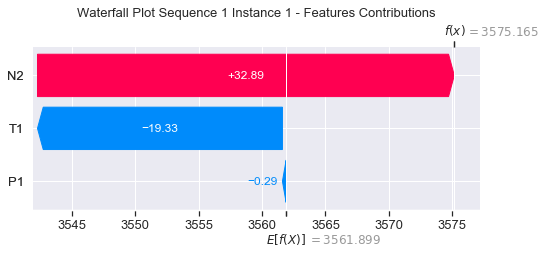

None

Contribution: [ 0.04627442 -1.0758185   1.17194799]


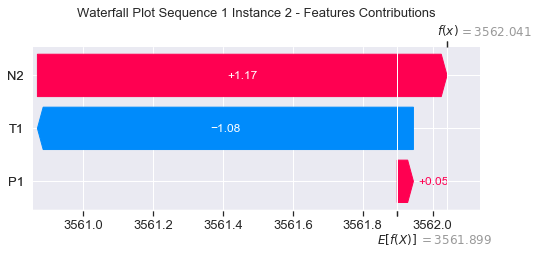

None

Contribution: [ 0.03875955 -0.06800755  0.28065126]


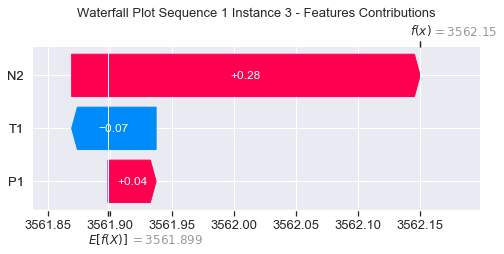

None

Contribution: [ 0.01748054 -0.00239856  0.10694557]


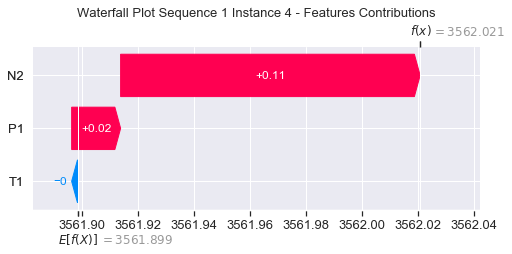

None

Contribution: [0.03438305 0.05151169 0.14134831]


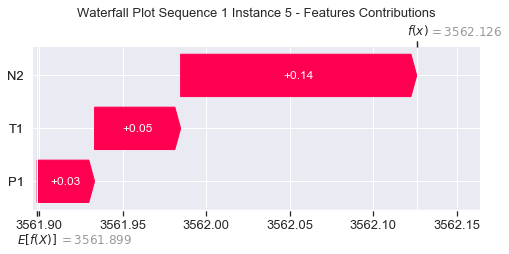

None

Contribution: [0.0364063  0.06960868 0.12786108]


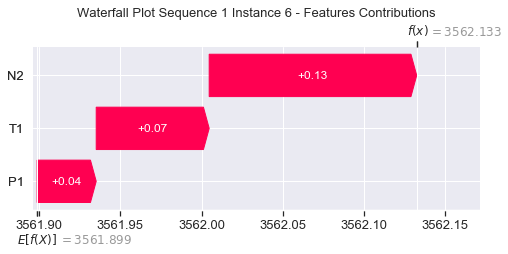

None

Contribution: [0.04082994 0.08428365 0.12905201]


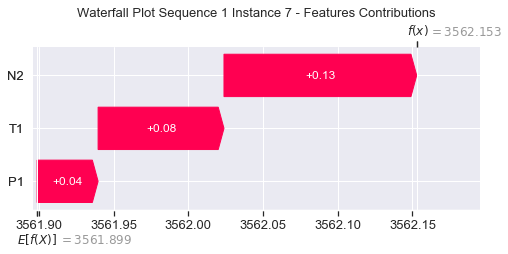

None

Contribution: [0.03890186 0.06543533 0.14476671]


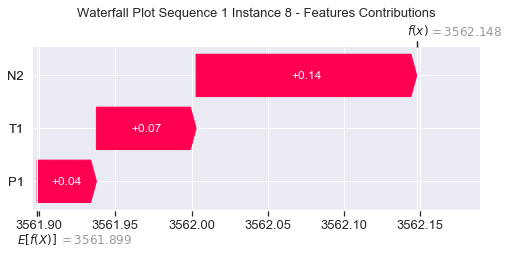

None

Contribution: [0.03769264 0.05849731 0.16239282]


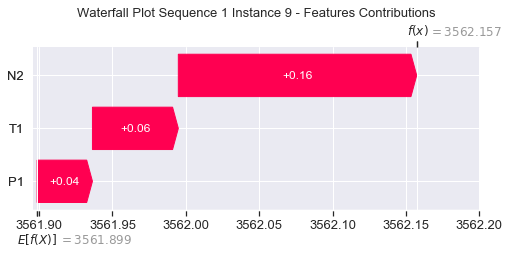

None

Contribution: [0.03817579 0.05758219 0.17807668]


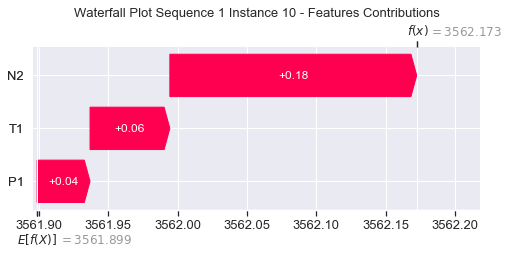

None

Contribution: [0.04820725 0.06470521 0.20281659]


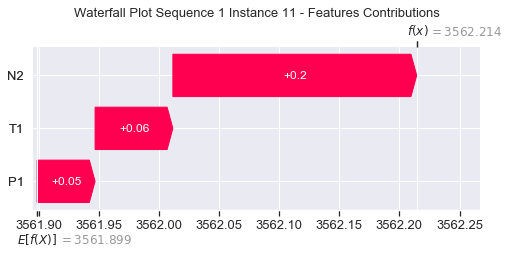

None

Contribution: [0.04814509 0.05429522 0.22781078]


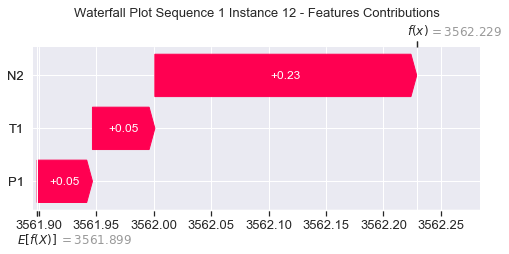

None

Contribution: [0.0552818  0.06078308 0.2623781 ]


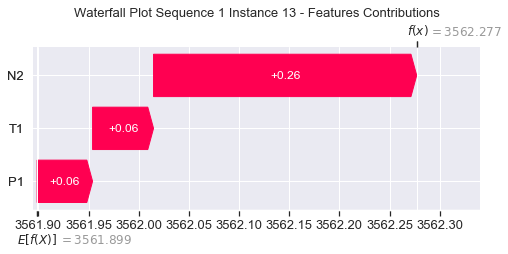

None

Contribution: [0.07388475 0.05103365 0.30382778]


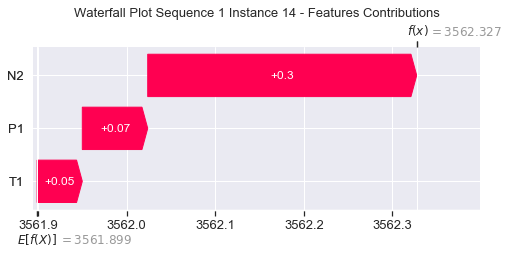

None

Contribution: [0.07346563 0.0510841  0.3565588 ]


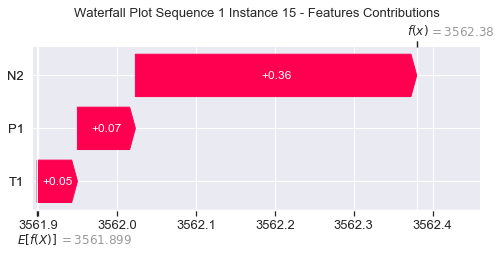

None

Contribution: [0.07479291 0.06127583 0.42486303]


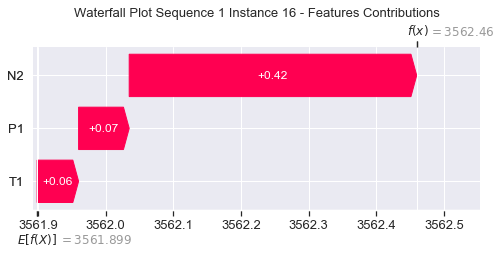

None

Contribution: [0.10342268 0.06962322 0.50009766]


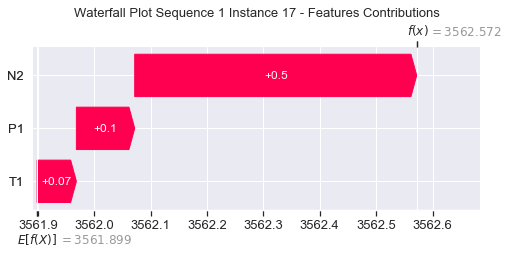

None

Contribution: [0.12386676 0.07759475 0.5946215 ]


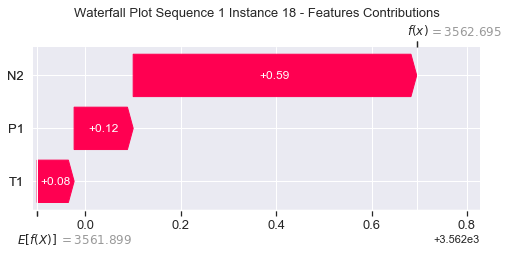

None

Contribution: [0.11282272 0.08817407 0.71287931]


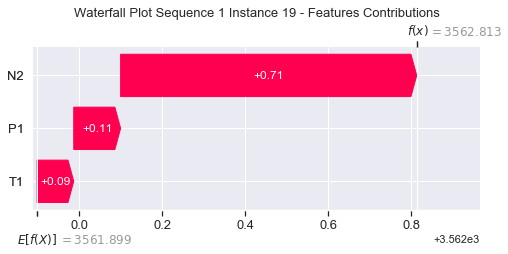

None

Contribution: [0.1718911  0.14911262 0.86912019]


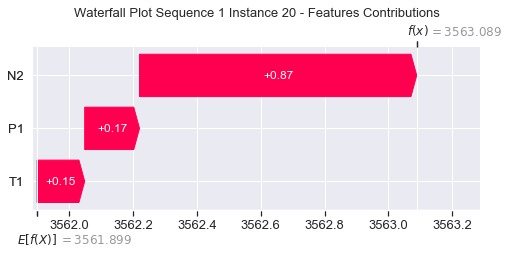

None

Contribution: [0.20723267 0.20679013 1.18120286]


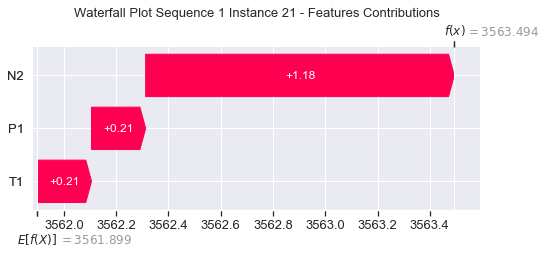

None

Contribution: [0.21367924 0.02178141 1.9656695 ]


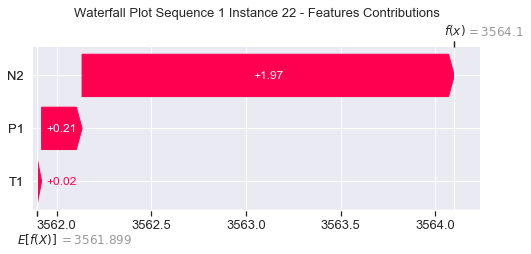

None

Contribution: [-0.10284309 -1.42379458  3.76143076]


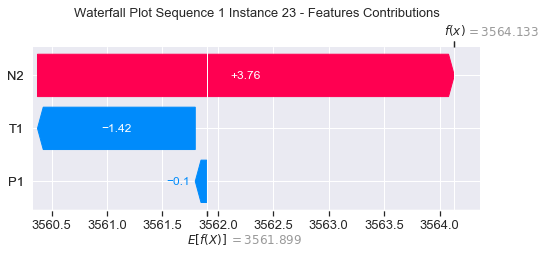

None

Contribution: [-0.24882417 -4.75996471  5.93137442]


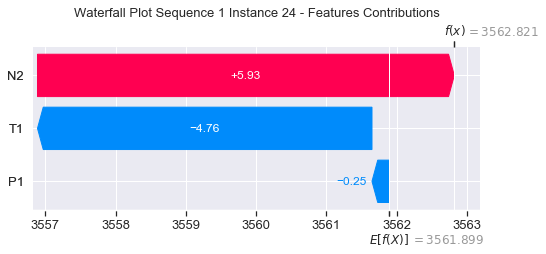

None

Contribution: [  1.25866079 -14.6337155   28.8259023 ]


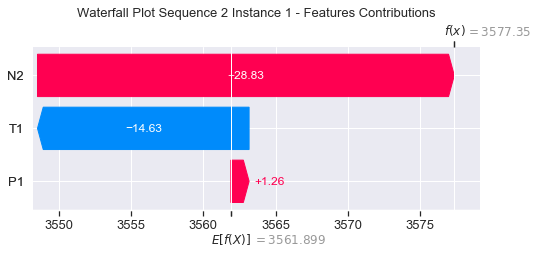

None

Contribution: [-0.07822191 -0.68336826  1.00385798]


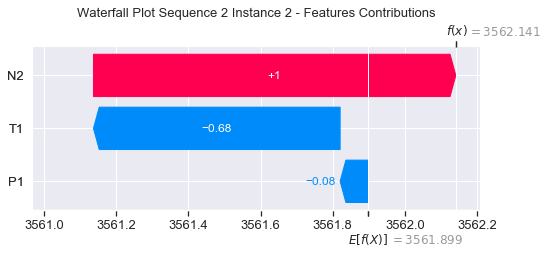

None

Contribution: [ 0.03758949 -0.07328529  0.26776406]


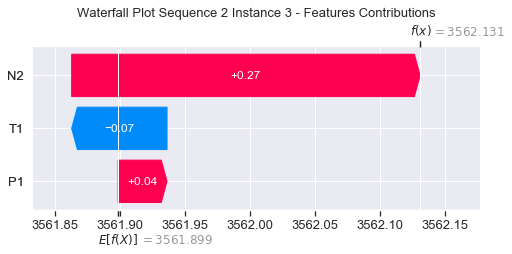

None

Contribution: [ 0.0128649  -0.00822282  0.10376726]


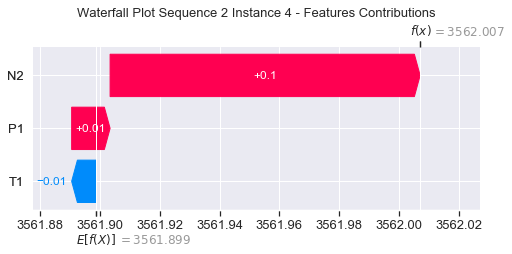

None

Contribution: [0.03158146 0.02339655 0.14412665]


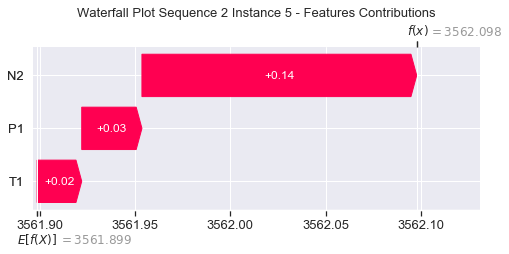

None

Contribution: [0.03339954 0.06440123 0.13000577]


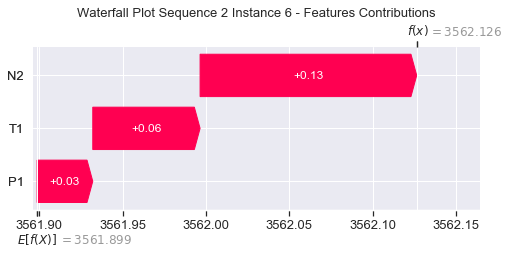

None

Contribution: [0.03984373 0.10988686 0.13189468]


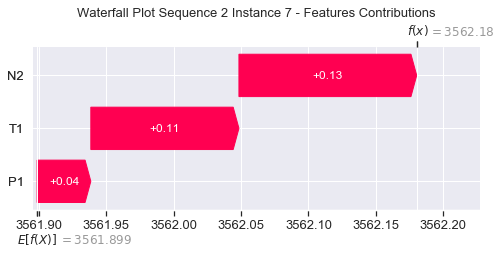

None

Contribution: [0.03548829 0.06155915 0.14797122]


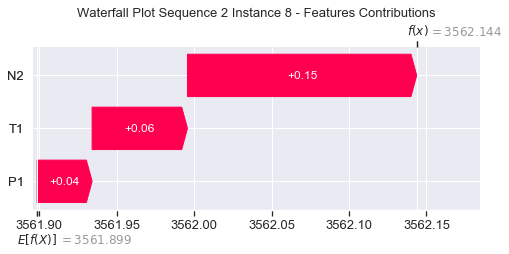

None

Contribution: [0.03260199 0.02645638 0.16856437]


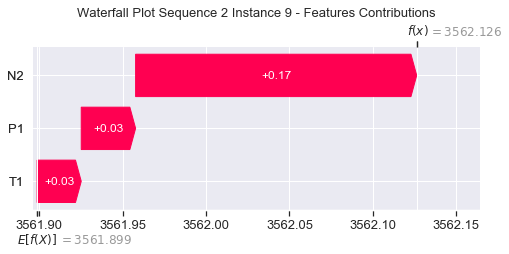

None

Contribution: [0.03345273 0.02088217 0.18788425]


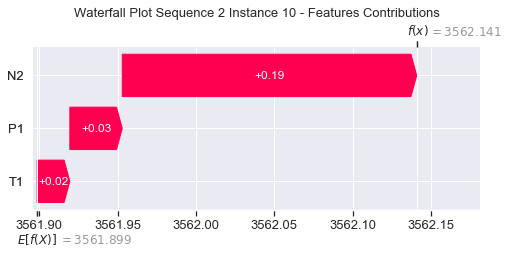

None

Contribution: [0.03932006 0.02443601 0.2100406 ]


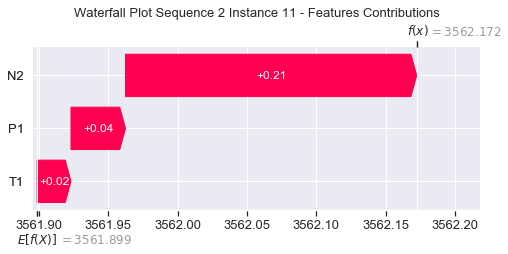

None

Contribution: [0.04565353 0.00983348 0.23539332]


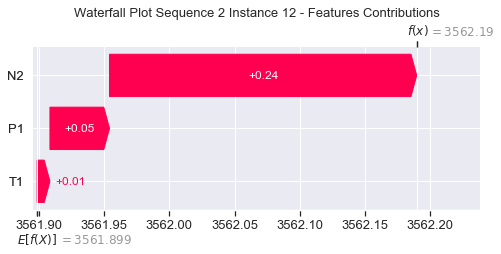

None

Contribution: [0.05392799 0.00559584 0.27279872]


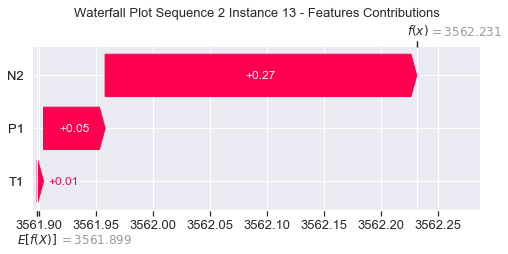

None

Contribution: [ 0.06220311 -0.0192565   0.31613791]


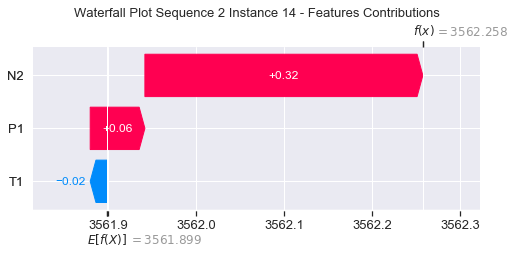

None

Contribution: [ 0.07069639 -0.03482324  0.37144147]


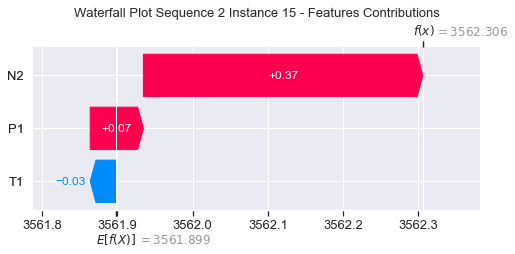

None

Contribution: [ 0.07351787 -0.04380938  0.4433523 ]


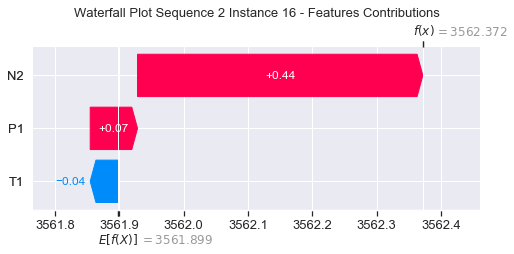

None

Contribution: [ 0.10265179 -0.06600911  0.52213676]


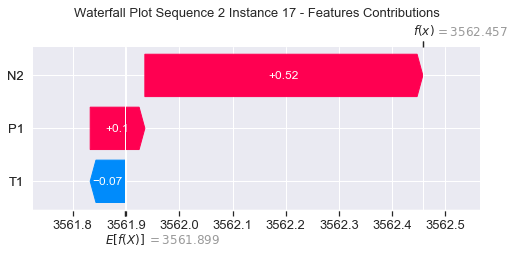

None

Contribution: [ 0.12179667 -0.08338446  0.61937639]


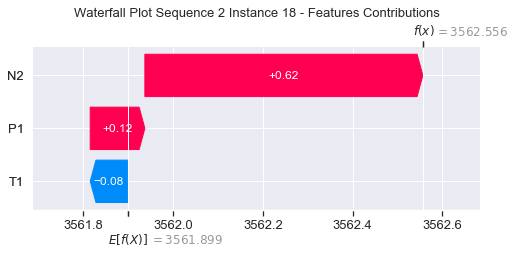

None

Contribution: [ 0.13012627 -0.10602883  0.73998113]


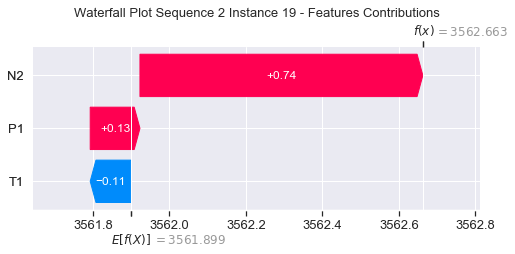

None

Contribution: [ 0.17009684 -0.17314461  0.90696509]


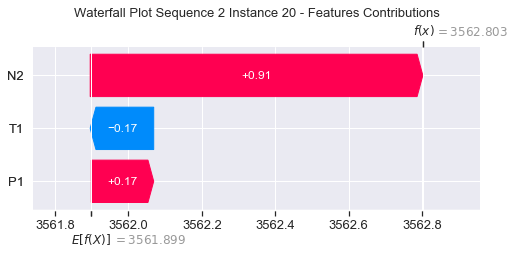

None

Contribution: [ 0.19246066 -0.49186087  1.22566537]


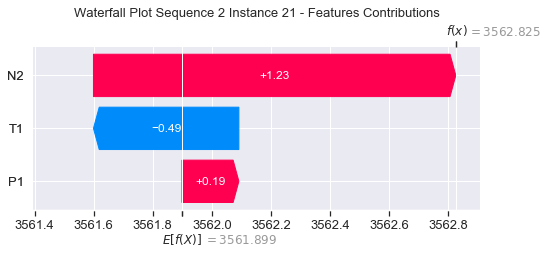

None

Contribution: [ 0.14446178 -1.92630352  2.00962772]


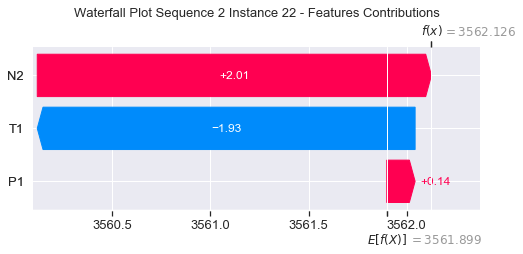

None

Contribution: [-0.37204721 -7.29147289  3.77599581]


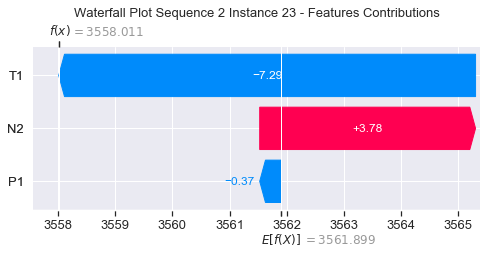

None

Contribution: [ -1.16267311 -17.13961003   5.91247932]


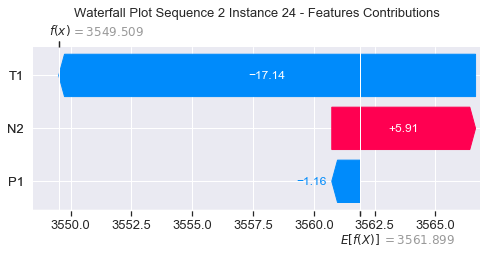

None

Contribution: [ -8.40187282 -63.38398884  29.2736798 ]


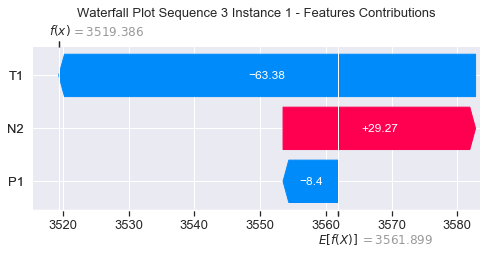

None

Contribution: [-0.13741254 -3.46561795  1.05246381]


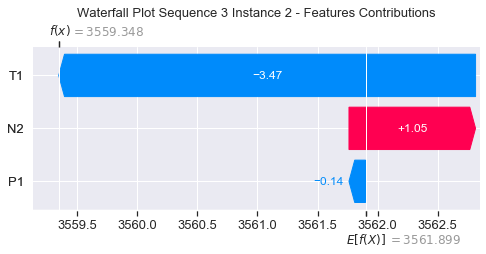

None

Contribution: [ 0.0192131  -0.32758269  0.2670646 ]


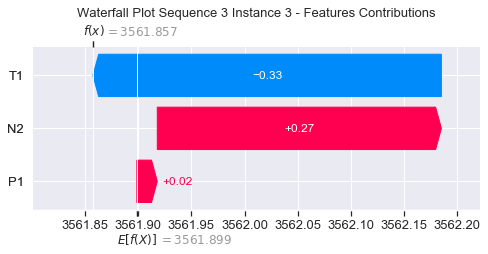

None

Contribution: [ 0.01181591 -0.10381162  0.09392487]


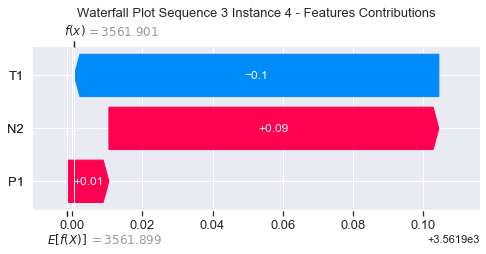

None

Contribution: [ 0.02504455 -0.0320793   0.1315611 ]


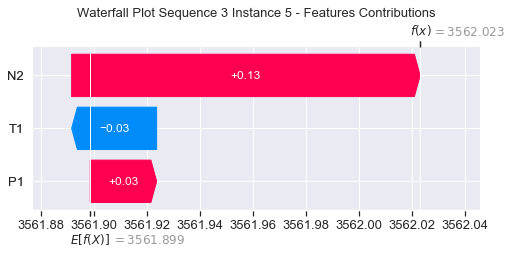

None

Contribution: [0.02693153 0.02423085 0.12154367]


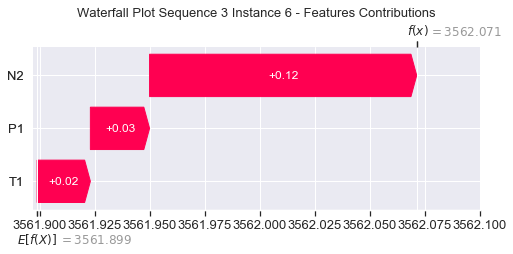

None

Contribution: [0.03398399 0.08240185 0.1242766 ]


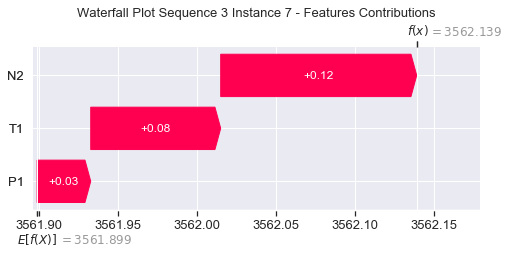

None

Contribution: [0.031253   0.04000941 0.13897879]


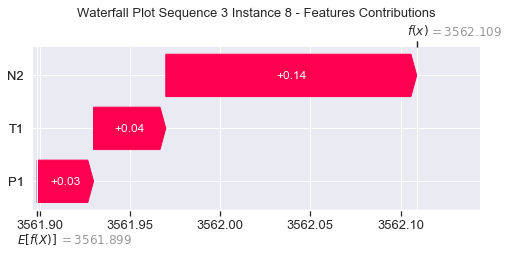

None

Contribution: [0.02540941 0.00713985 0.15754571]


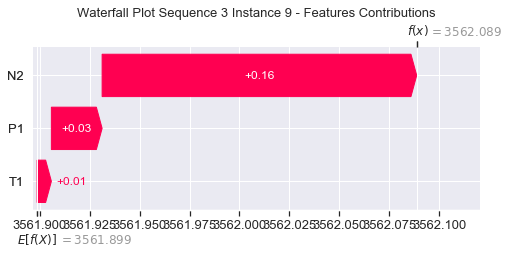

None

Contribution: [0.03021434 0.00805406 0.17979883]


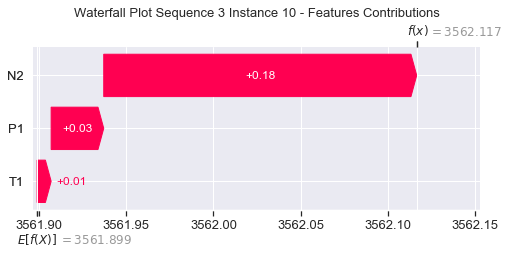

None

Contribution: [0.03710133 0.00940514 0.20344722]


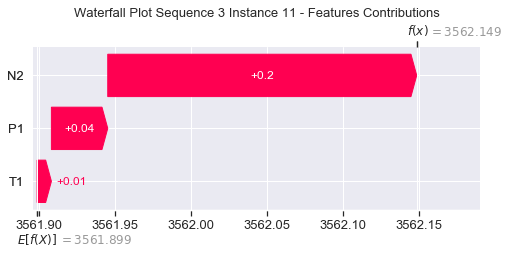

None

Contribution: [ 0.04645131 -0.00715243  0.23116997]


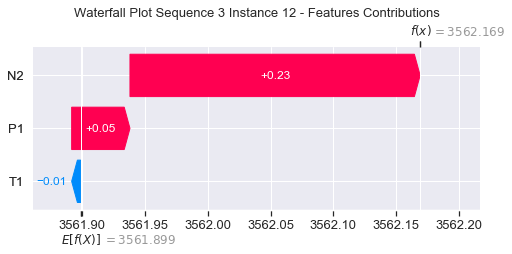

None

Contribution: [ 0.05435497 -0.00798897  0.2679938 ]


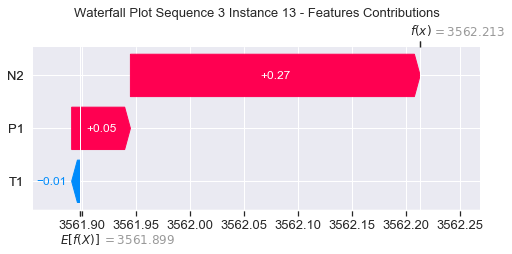

None

Contribution: [ 0.05336723 -0.01749109  0.31367853]


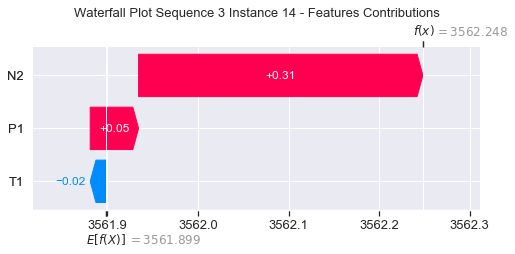

None

Contribution: [ 0.0712373  -0.0362135   0.36741444]


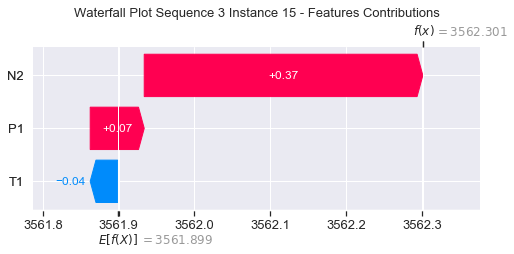

None

Contribution: [ 0.08710696 -0.042109    0.44253026]


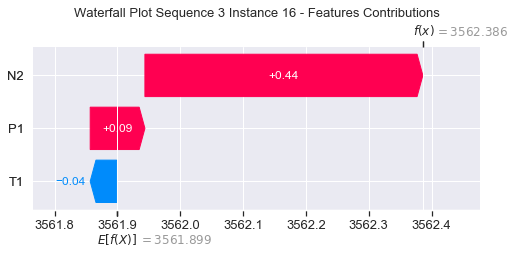

None

Contribution: [ 0.1031203  -0.05611667  0.51745088]


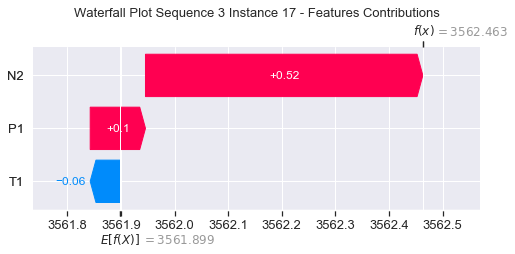

None

Contribution: [ 0.12290585 -0.0742617   0.61583357]


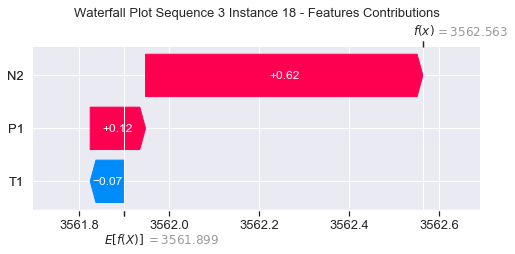

None

Contribution: [ 0.13929396 -0.13492505  0.74027929]


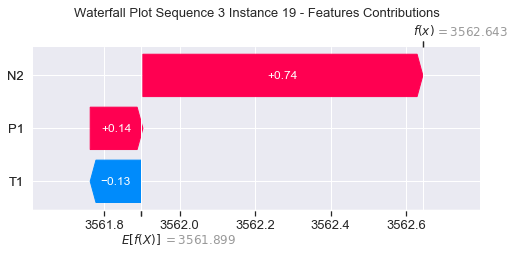

None

Contribution: [ 0.16399635 -0.23572474  0.89698723]


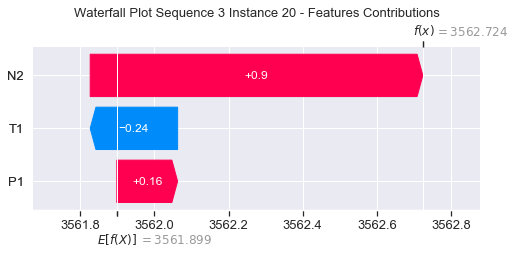

None

Contribution: [ 0.18168922 -0.65869471  1.20627176]


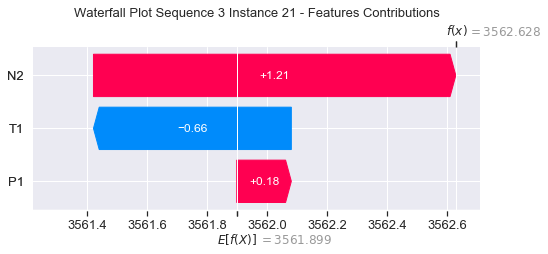

None

Contribution: [ 0.14157195 -2.30632937  1.97805384]


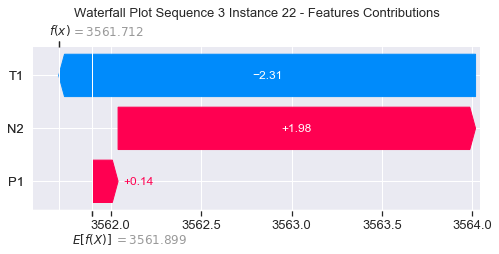

None

Contribution: [-0.28258051 -7.66492715  3.82504362]


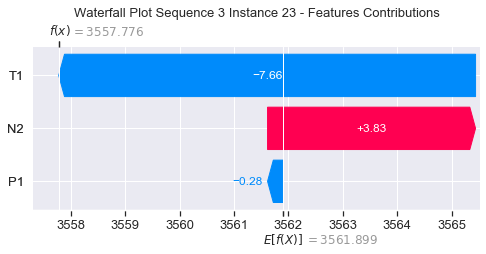

None

Contribution: [ -0.76581117 -18.64667778   6.0505916 ]


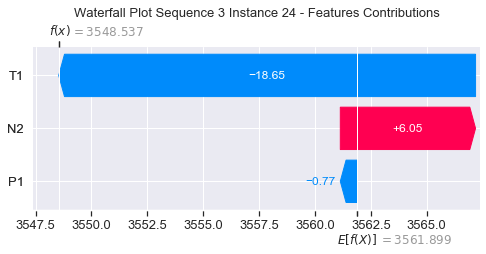

None

Contribution: [ -2.44250339 -69.5736021   29.07944957]


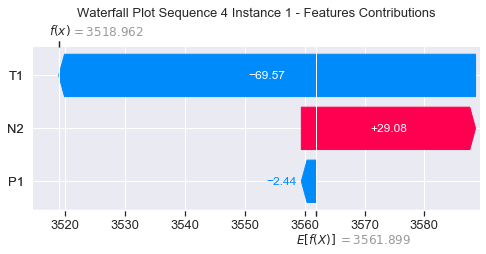

None

Contribution: [-0.04347903 -3.63749991  1.12964136]


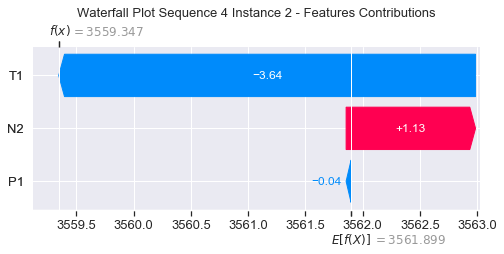

None

Contribution: [ 0.00879395 -0.31883307  0.26990105]


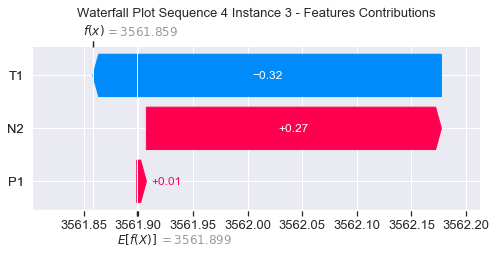

None

Contribution: [ 0.01425136 -0.09666141  0.09465161]


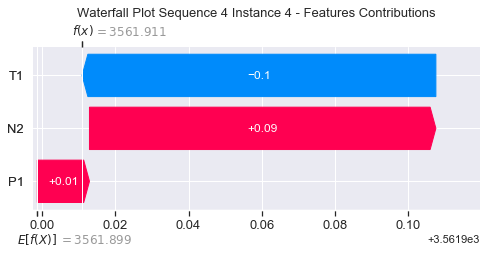

None

Contribution: [ 0.0267105  -0.03732804  0.13272935]


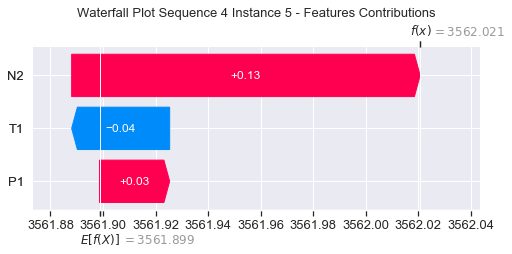

None

Contribution: [0.02895469 0.01938212 0.12231063]


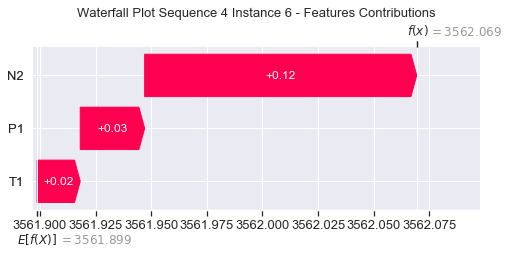

None

Contribution: [0.03483338 0.08233894 0.12456816]


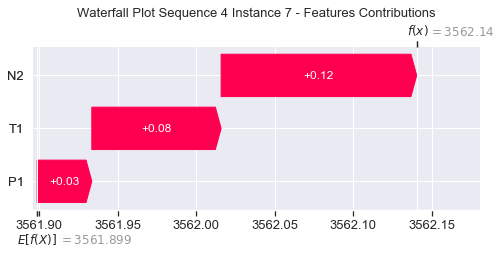

None

Contribution: [0.03250431 0.03487194 0.1398895 ]


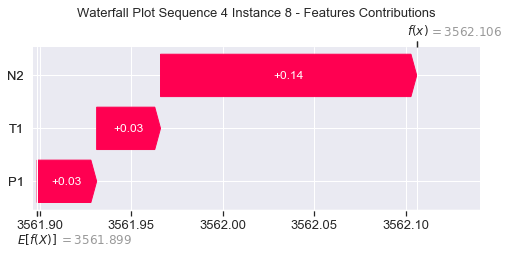

None

Contribution: [ 0.0237199  -0.00353142  0.15963667]


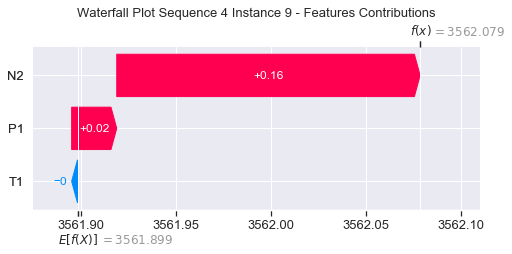

None

Contribution: [ 0.03322863 -0.01258532  0.17943174]


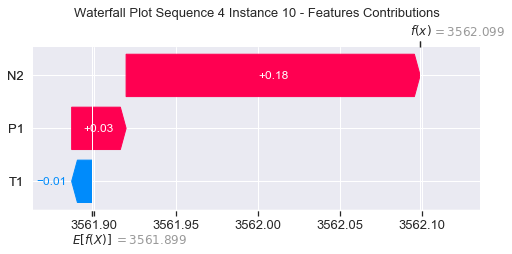

None

Contribution: [ 0.03180943 -0.00440126  0.20465951]


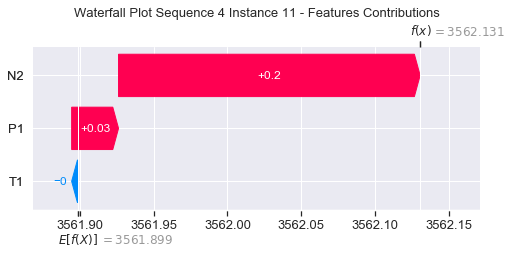

None

Contribution: [ 0.04587165 -0.01684702  0.23205154]


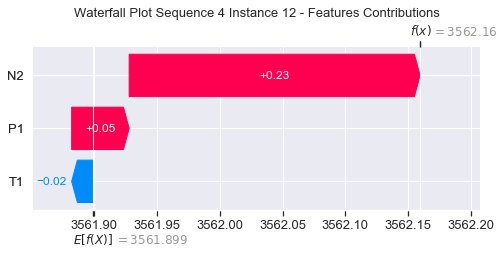

None

Contribution: [ 0.05475454 -0.01709064  0.26937452]


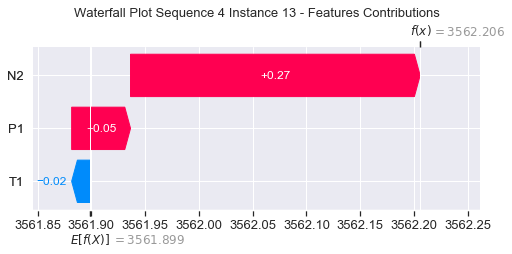

None

Contribution: [ 0.05958859 -0.02989868  0.31757546]


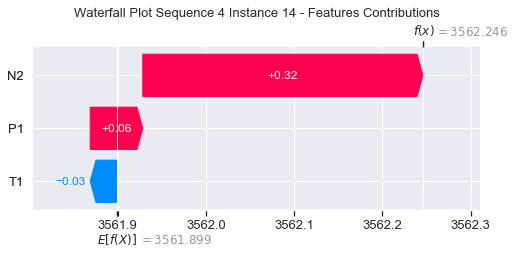

None

Contribution: [ 0.0732434  -0.04843592  0.36968429]


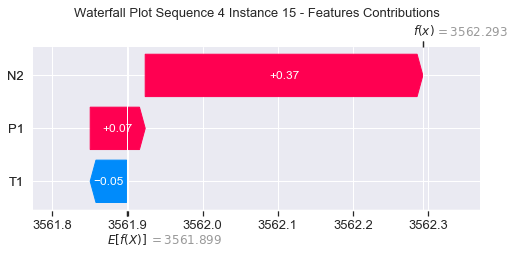

None

Contribution: [ 0.07654732 -0.05299365  0.44049211]


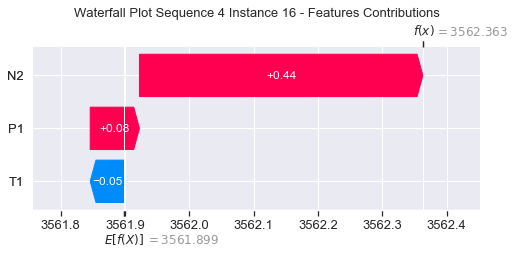

None

Contribution: [ 0.10675249 -0.07148256  0.52046182]


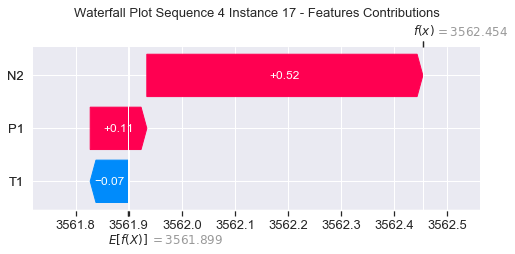

None

Contribution: [ 0.12694418 -0.09321271  0.61914066]


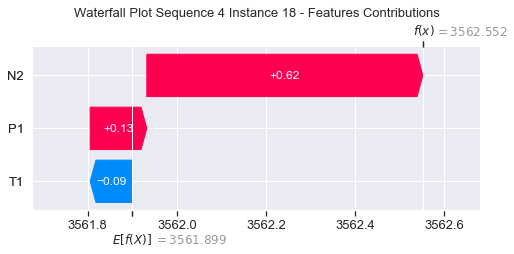

None

Contribution: [ 0.14341589 -0.13354005  0.73891924]


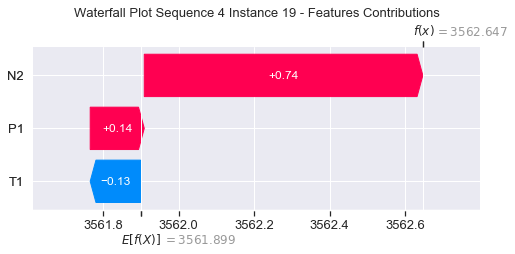

None

Contribution: [ 0.17190012 -0.2657694   0.90301792]


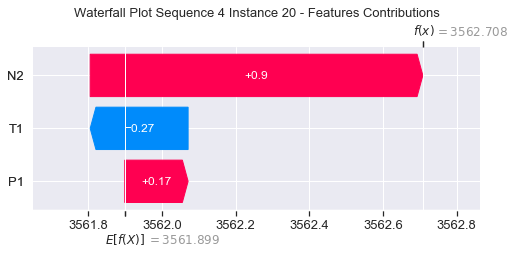

None

Contribution: [ 0.18855452 -0.72222002  1.21480232]


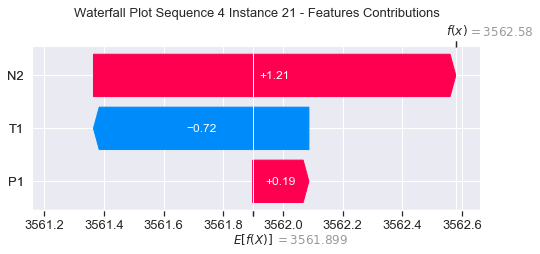

None

Contribution: [ 0.13722599 -2.48637573  1.98885067]


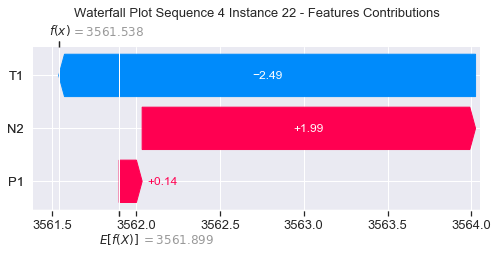

None

Contribution: [-0.29979841 -8.32505418  3.84890668]


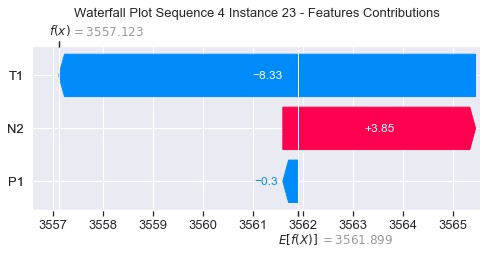

None

Contribution: [ -0.96609996 -19.92035592   6.19105127]


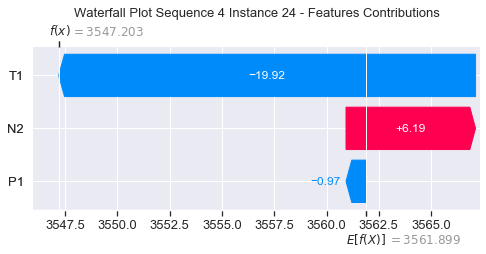

None

Contribution: [ -7.55679686 -72.12898301  31.31717592]


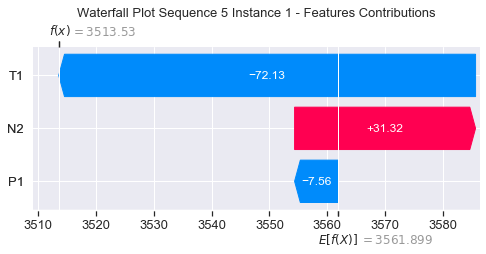

None

Contribution: [-0.12361128 -3.77340333  1.12020203]


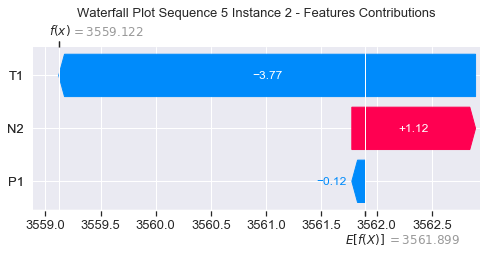

None

Contribution: [ 0.00723155 -0.33193304  0.2654463 ]


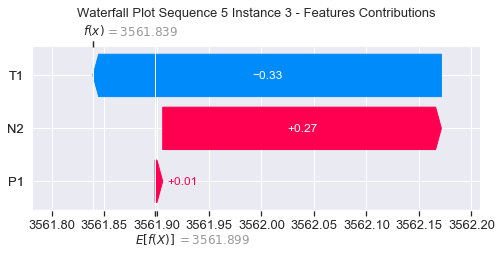

None

Contribution: [ 0.00726361 -0.096881    0.09306165]


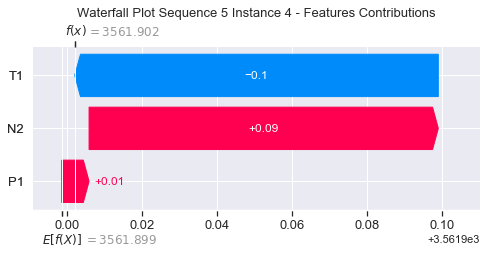

None

Contribution: [ 0.02090825 -0.03641467  0.13109275]


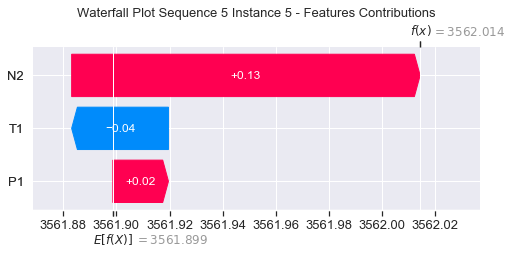

None

Contribution: [0.02534811 0.02030182 0.12096049]


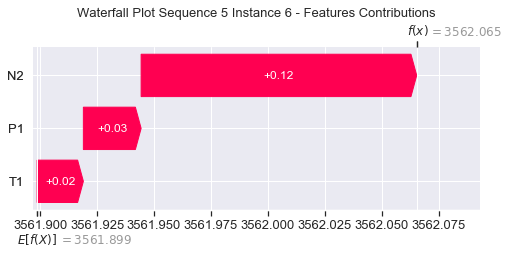

None

Contribution: [0.03296222 0.07978272 0.1233832 ]


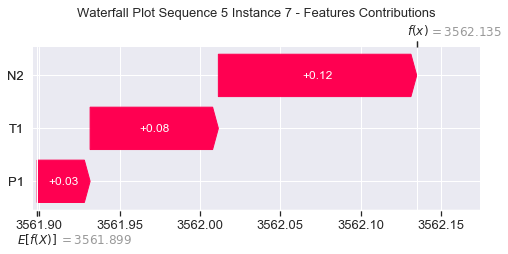

None

Contribution: [0.029555   0.03628284 0.13821781]


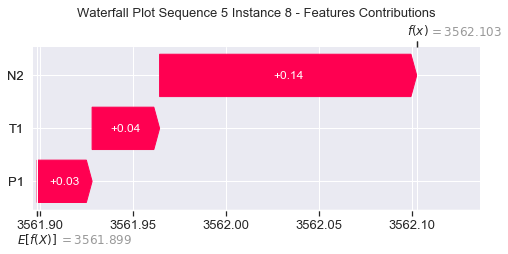

None

Contribution: [0.02368973 0.00099354 0.15630154]


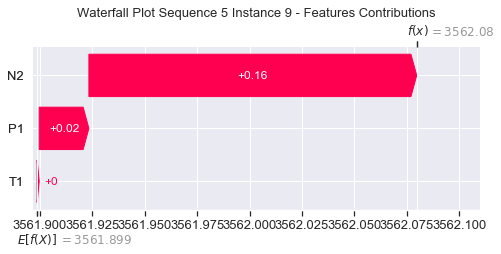

None

Contribution: [ 0.020724   -0.00191042  0.17572853]


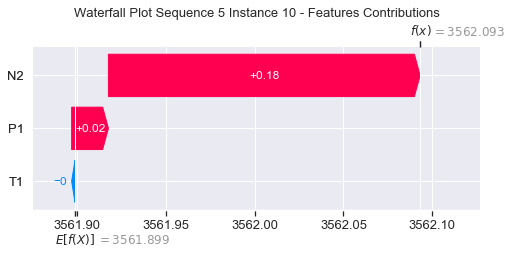

None

Contribution: [0.03227915 0.0048987  0.20193545]


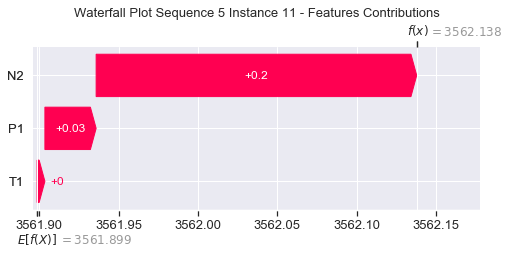

None

Contribution: [ 0.04108054 -0.00874431  0.229734  ]


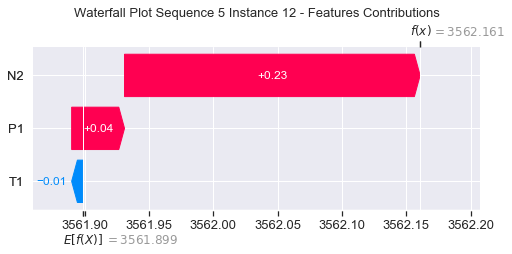

None

Contribution: [ 0.04983111 -0.00837257  0.26638222]


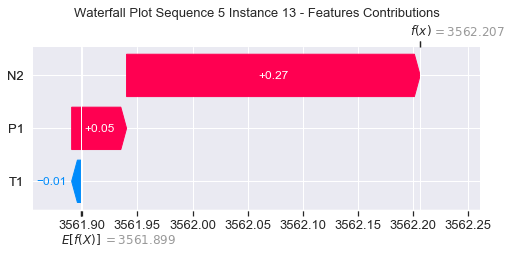

None

Contribution: [ 0.06281449 -0.02337321  0.31569558]


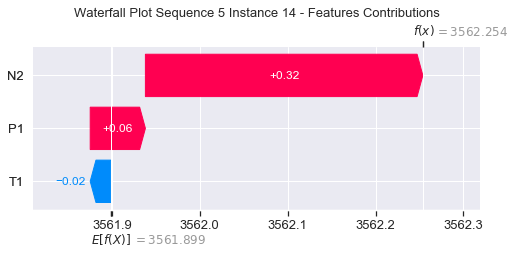

None

Contribution: [ 0.0692363  -0.0335848   0.36613689]


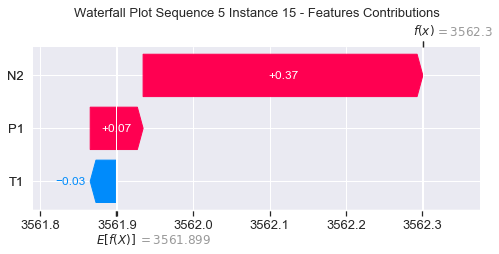

None

Contribution: [ 0.08705363 -0.04504966  0.44430937]


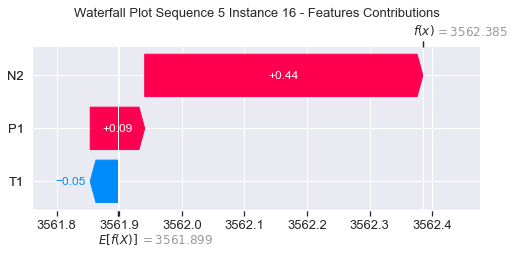

None

Contribution: [ 0.10342784 -0.05126025  0.51534441]


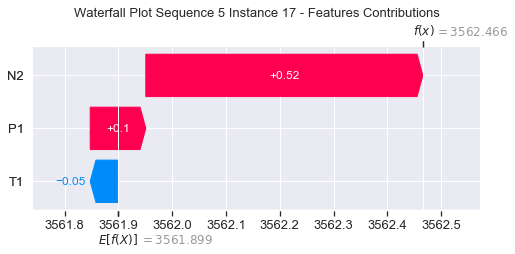

None

Contribution: [ 0.12471936 -0.06730761  0.61361498]


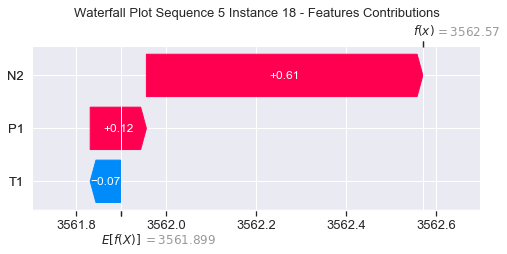

None

Contribution: [ 0.13449591 -0.12604385  0.72635708]


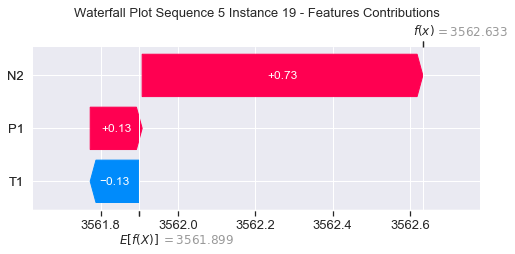

None

Contribution: [ 0.17135746 -0.22042382  0.89307775]


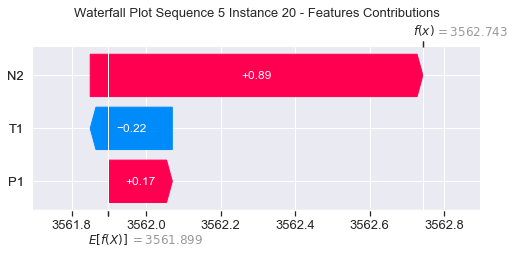

None

Contribution: [ 0.19285842 -0.6134219   1.20200852]


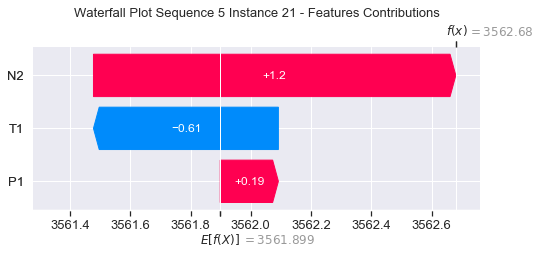

None

Contribution: [ 0.16254878 -2.11953153  1.976273  ]


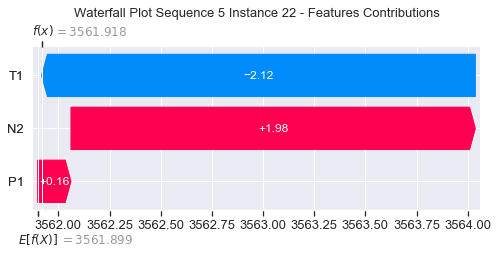

None

Contribution: [-0.18507022 -7.05571896  3.83278767]


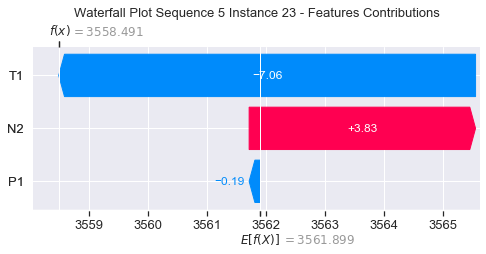

None

Contribution: [ -0.49807864 -17.18883793   6.1843444 ]


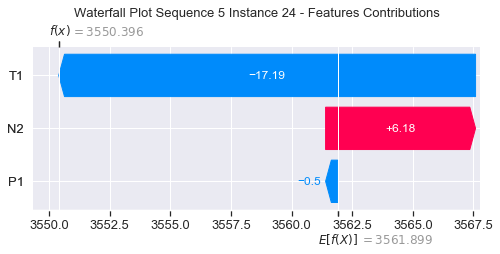

None

Contribution: [ -1.30663104 -63.7257167   30.88226854]


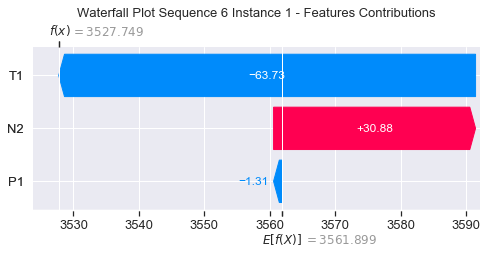

None

Contribution: [-0.06203126 -3.2509274   1.13238922]


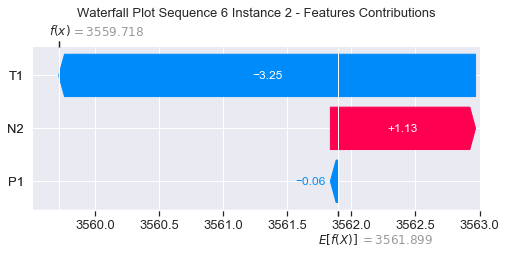

None

Contribution: [ 0.01651684 -0.26562148  0.27712228]


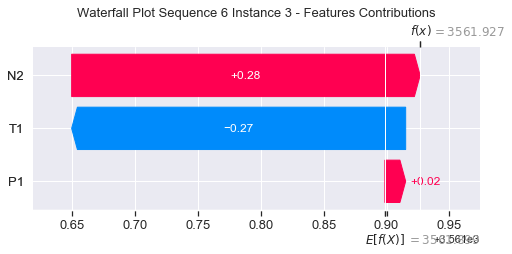

None

Contribution: [ 0.01199807 -0.08540868  0.09784496]


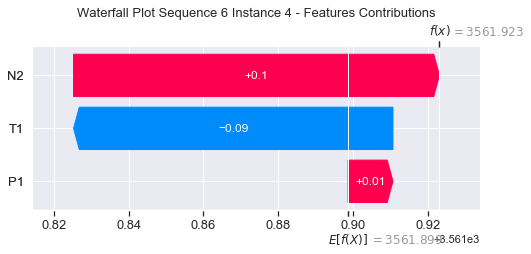

None

Contribution: [ 0.0264715  -0.01979289  0.13615805]


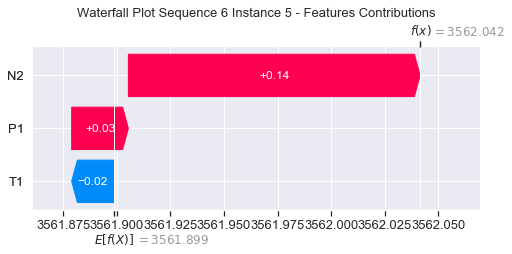

None

Contribution: [0.02902054 0.02726593 0.12440978]


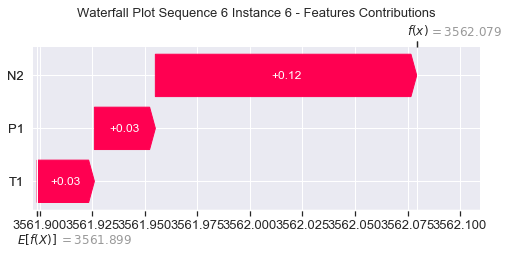

None

Contribution: [0.03531227 0.08320315 0.12664158]


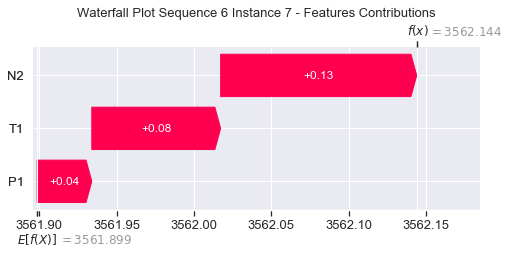

None

Contribution: [0.03254237 0.03701326 0.14231235]


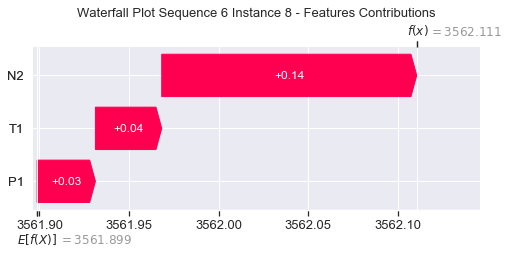

None

Contribution: [ 0.02804117 -0.00156273  0.16057837]


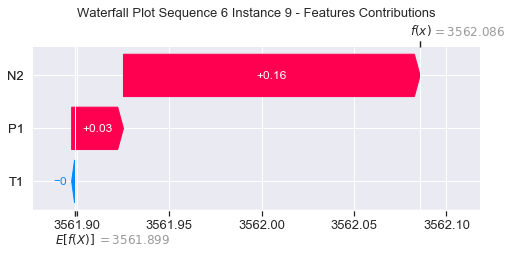

None

Contribution: [ 0.02647224 -0.00461796  0.18148741]


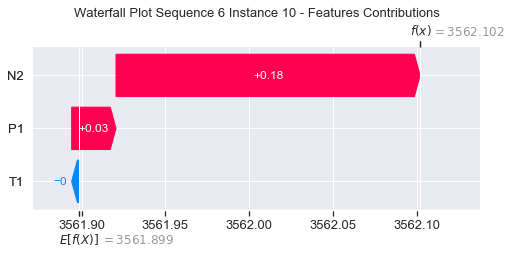

None

Contribution: [ 0.03582592 -0.00333321  0.20648533]


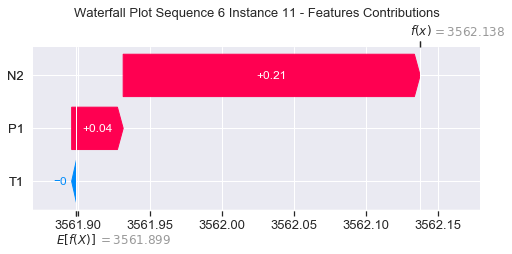

None

Contribution: [ 0.04549776 -0.01609091  0.23215092]


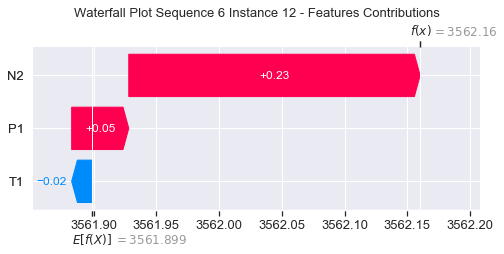

None

Contribution: [ 0.05422997 -0.01818148  0.27000554]


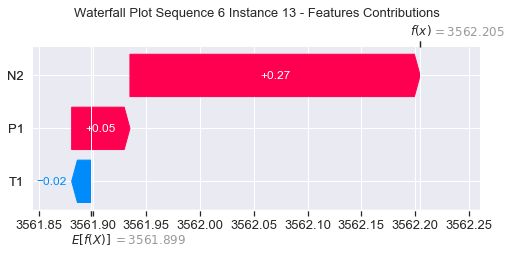

None

Contribution: [ 0.06215207 -0.03086618  0.31498808]


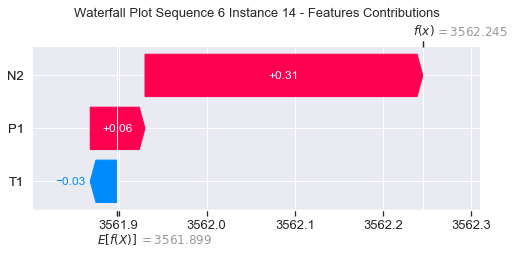

None

Contribution: [ 0.07292315 -0.05434727  0.3718603 ]


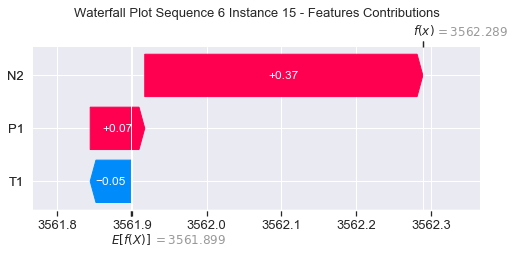

None

Contribution: [ 0.08207966 -0.07559366  0.44133319]


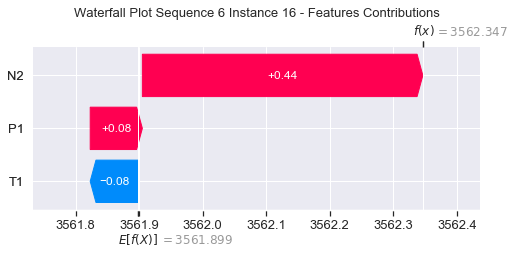

None

Contribution: [ 0.10623841 -0.08885126  0.52364203]


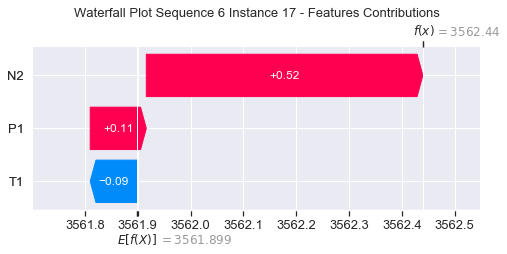

None

Contribution: [ 0.12613802 -0.11640631  0.62408269]


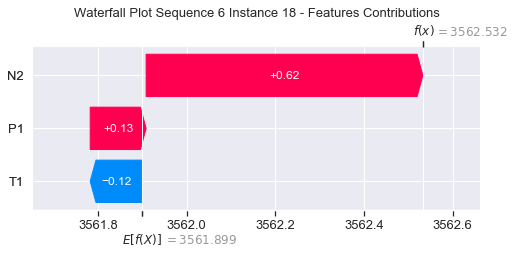

None

Contribution: [ 0.13860606 -0.18433754  0.75246869]


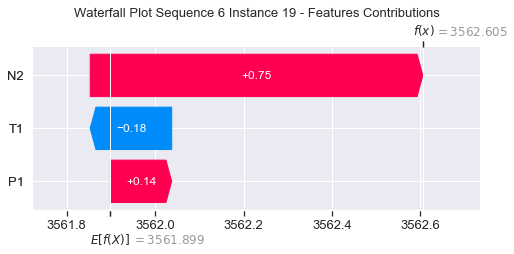

None

Contribution: [ 0.16991957 -0.32069317  0.91518583]


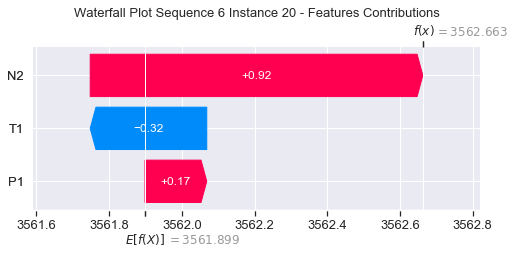

None

Contribution: [ 0.18330012 -0.86323263  1.23125855]


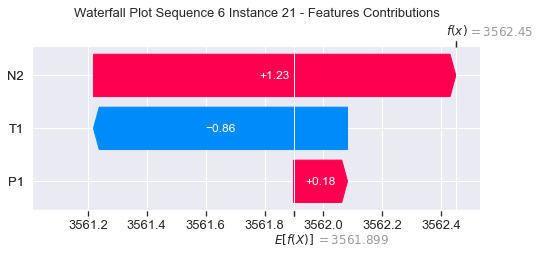

None

Contribution: [ 0.11540788 -2.92719983  2.02573664]


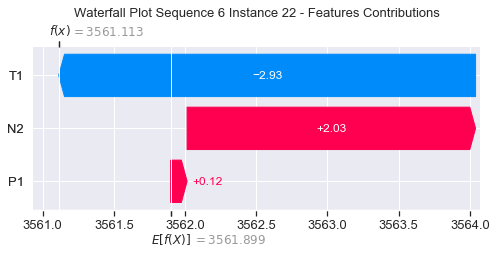

None

Contribution: [-0.3860251  -9.89979966  3.923753  ]


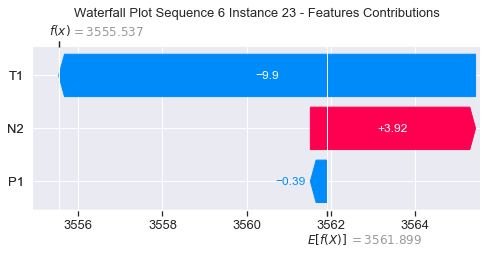

None

Contribution: [ -1.07762493 -23.3683705    6.44156303]


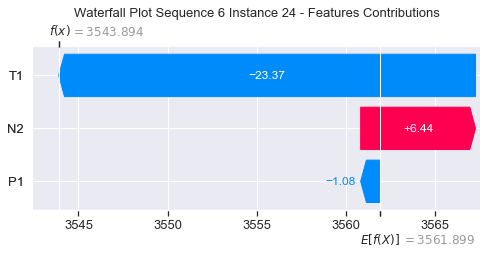

None

Contribution: [ -6.02574114 -89.87302003  31.39802767]


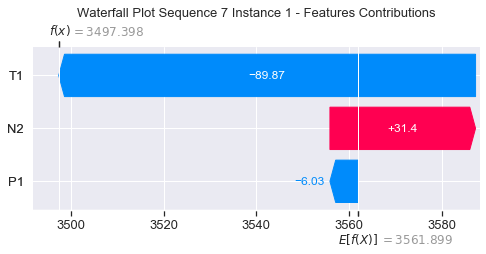

None

Contribution: [-0.16103156 -4.7012698   1.12485873]


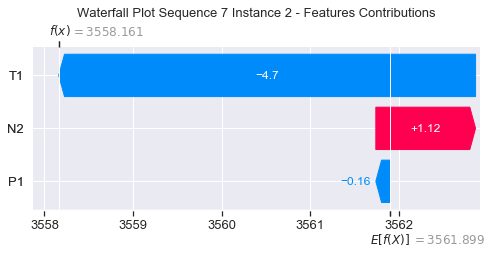

None

Contribution: [ 0.01425548 -0.36660745  0.26365364]


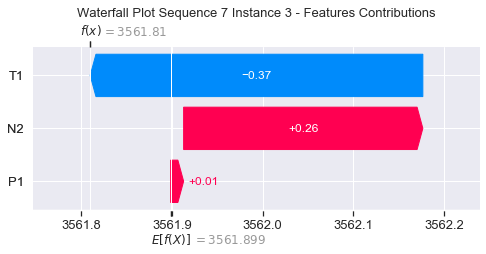

None

Contribution: [ 0.00984835 -0.1317926   0.09231282]


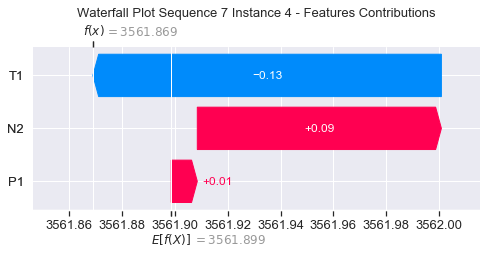

None

Contribution: [ 0.02386281 -0.06918414  0.12977071]


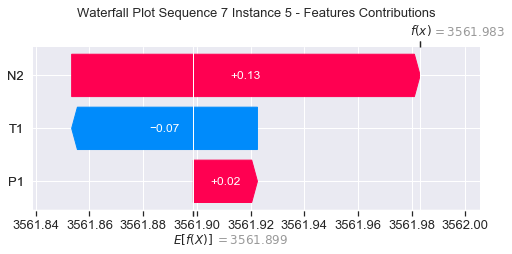

None

Contribution: [ 0.02433094 -0.00591391  0.11856555]


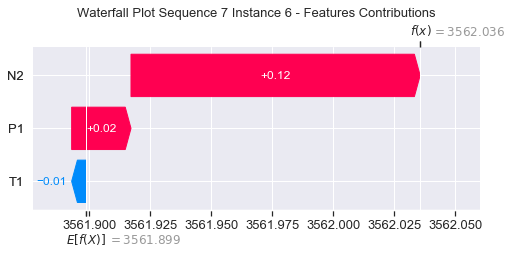

None

Contribution: [0.03098579 0.06822269 0.12150548]


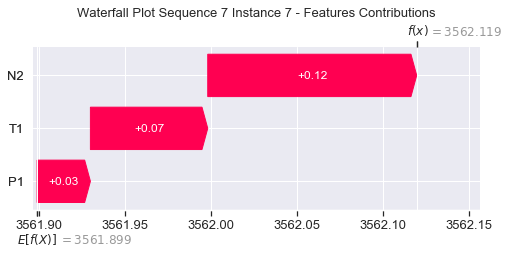

None

Contribution: [0.02854614 0.01833076 0.13621227]


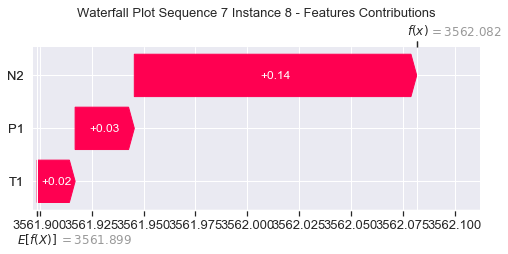

None

Contribution: [ 0.02107817 -0.02558691  0.15435187]


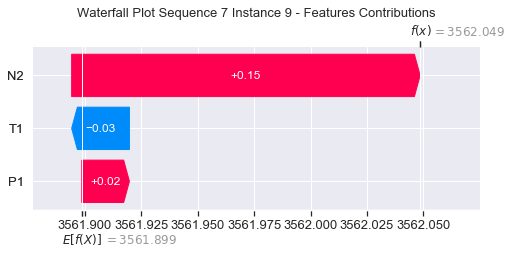

None

Contribution: [ 0.02693961 -0.03207353  0.17698884]


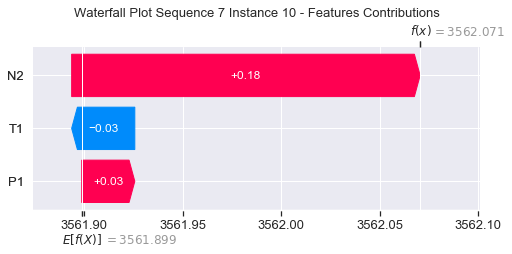

None

Contribution: [ 0.03262213 -0.03117958  0.19946196]


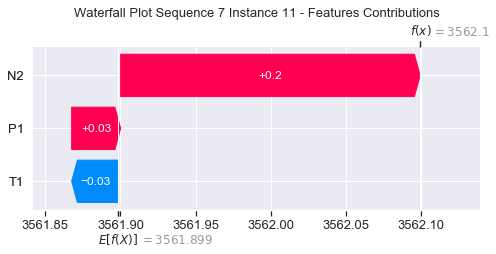

None

Contribution: [ 0.0393381  -0.04384325  0.22990492]


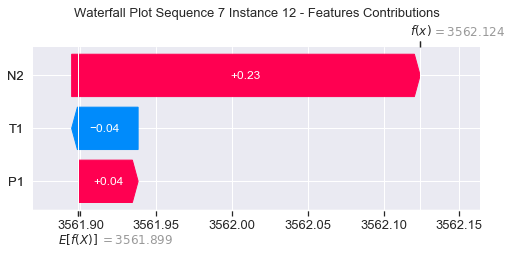

None

Contribution: [ 0.04780841 -0.0432287   0.2679106 ]


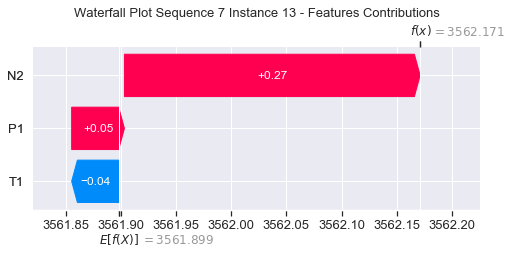

None

Contribution: [ 0.05404459 -0.04897466  0.31472454]


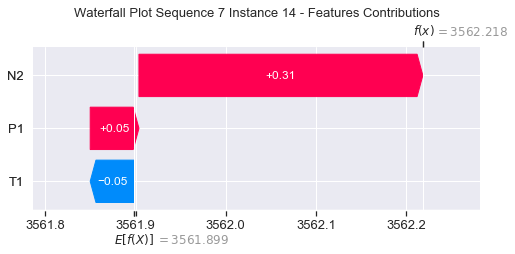

None

Contribution: [ 0.06660962 -0.07318788  0.36941536]


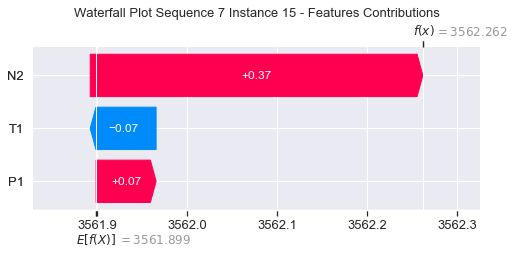

None

Contribution: [ 0.08665313 -0.0892337   0.44480749]


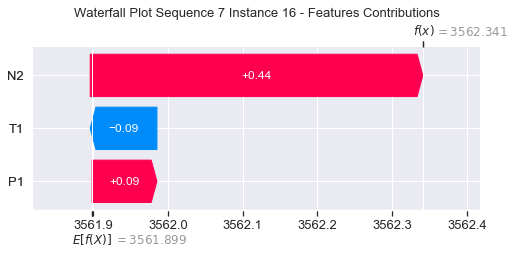

None

Contribution: [ 0.09722394 -0.0946408   0.52077422]


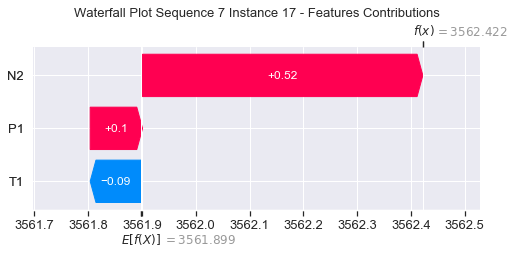

None

Contribution: [ 0.11712248 -0.11845441  0.61971673]


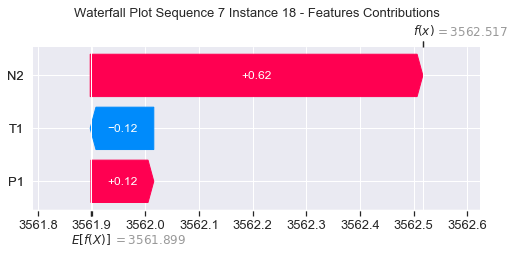

None

Contribution: [ 0.14460686 -0.19556666  0.74929259]


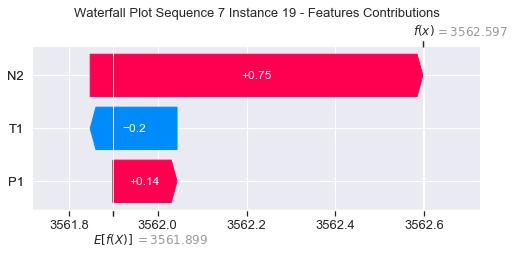

None

Contribution: [ 0.15549797 -0.3293782   0.90502001]


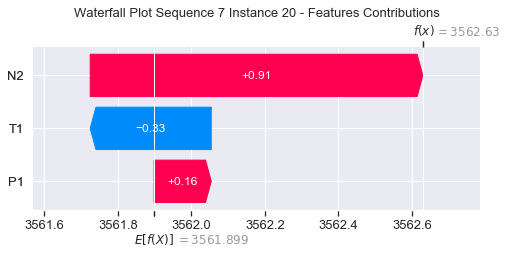

None

Contribution: [ 0.15679145 -0.88608176  1.21328172]


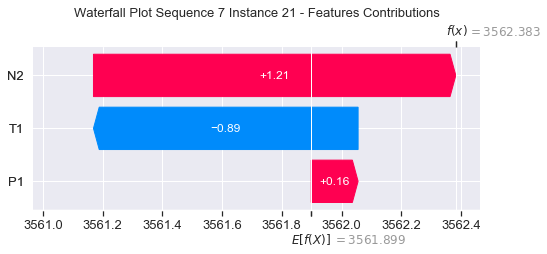

None

Contribution: [ 0.07443602 -2.95104511  1.98339885]


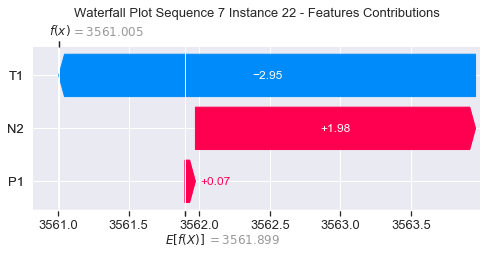

None

Contribution: [-0.48118915 -9.62813335  3.81100039]


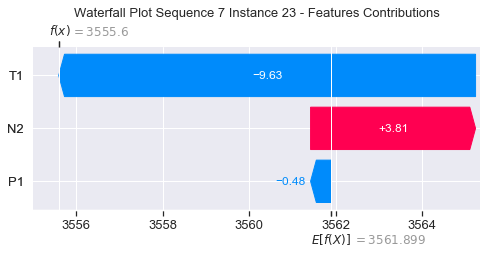

None

Contribution: [ -1.16140032 -23.13089471   6.18793602]


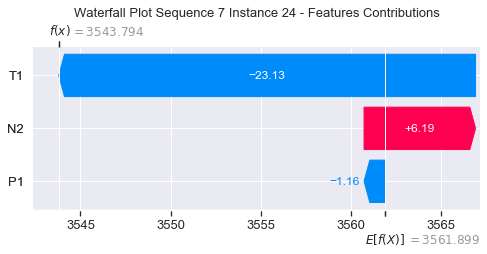

None

Contribution: [ -7.42568146 -89.83956151  31.01624312]


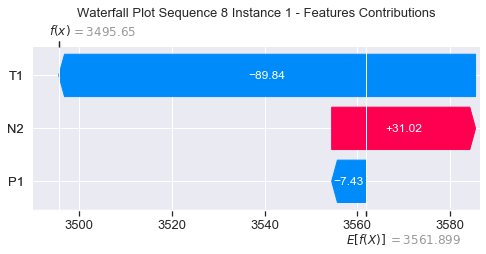

None

Contribution: [-0.17102996 -4.35589375  1.16298613]


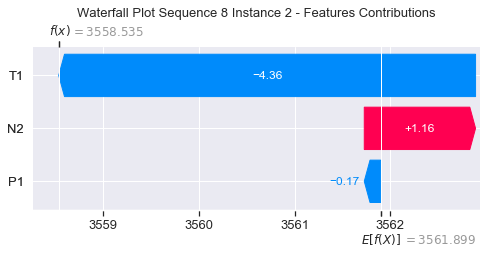

None

Contribution: [ 0.00824365 -0.40920831  0.27731952]


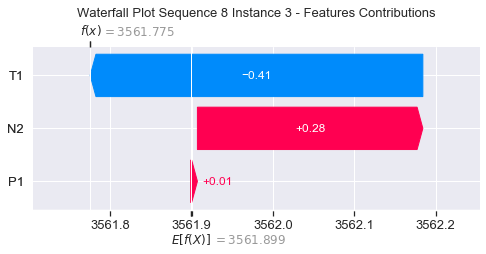

None

Contribution: [ 0.00460777 -0.13035523  0.09157071]


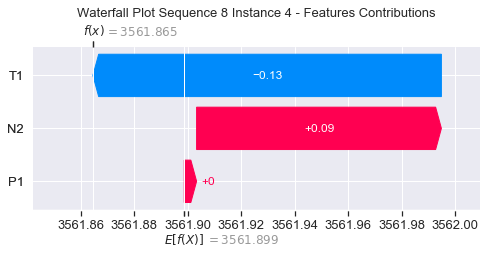

None

Contribution: [ 0.00416066 -0.06356335  0.12253883]


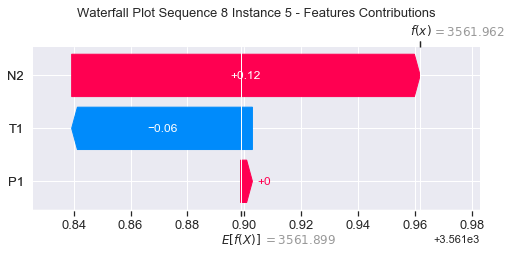

None

Contribution: [0.02114354 0.0040315  0.11746976]


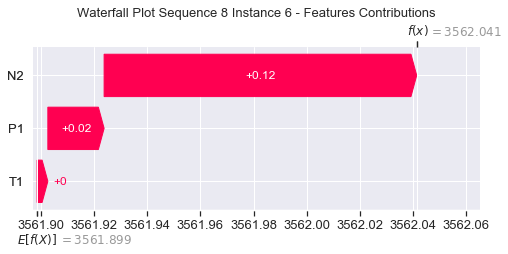

None

Contribution: [0.02978864 0.07231346 0.11988311]


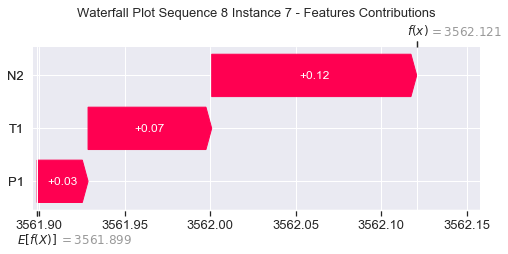

None

Contribution: [0.02550026 0.02684845 0.13467819]


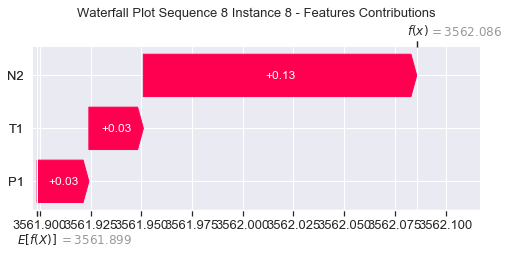

None

Contribution: [ 0.01278885 -0.01627268  0.15589007]


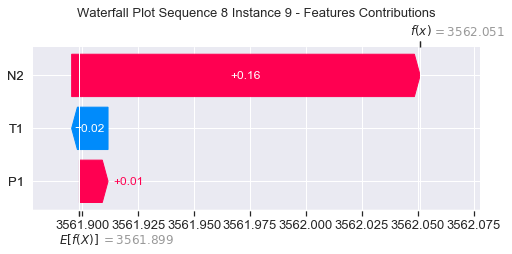

None

Contribution: [-0.00052794 -0.01761799  0.17257424]


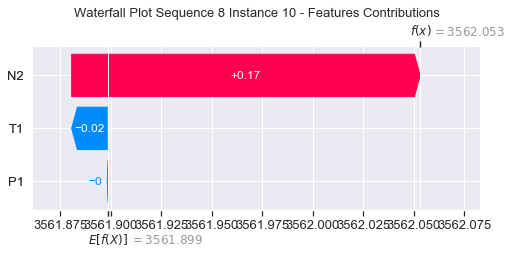

None

Contribution: [ 0.03249481 -0.00591167  0.20392322]


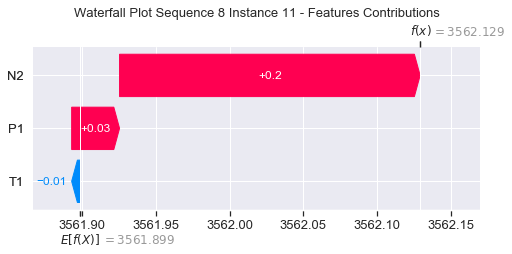

None

Contribution: [ 0.04659785 -0.00773255  0.22971519]


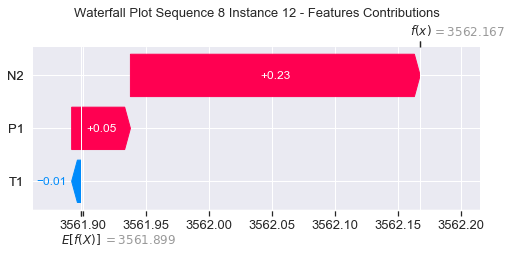

None

Contribution: [ 0.05254939 -0.00545644  0.26551573]


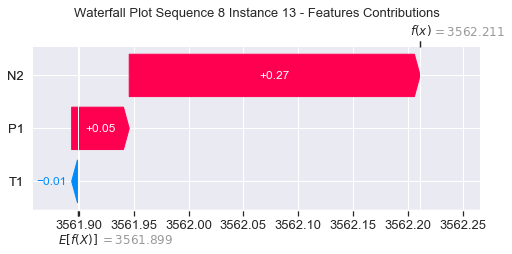

None

Contribution: [ 0.06272454 -0.01798366  0.31249601]


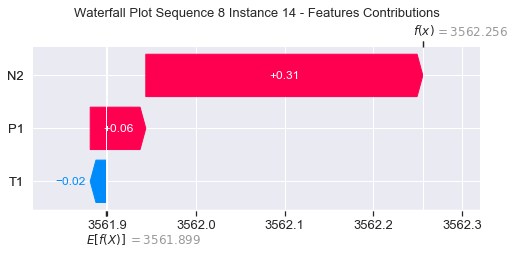

None

Contribution: [ 0.07674012 -0.02590705  0.36619647]


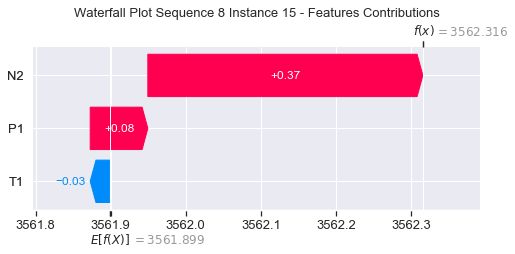

None

Contribution: [ 0.08559521 -0.03480868  0.4387407 ]


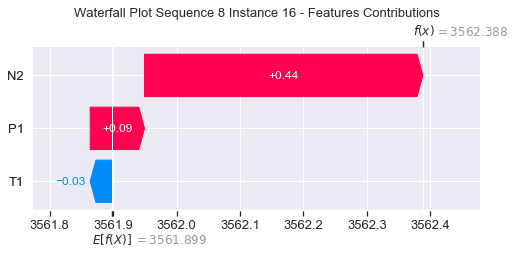

None

Contribution: [ 0.11284094 -0.03346215  0.5165766 ]


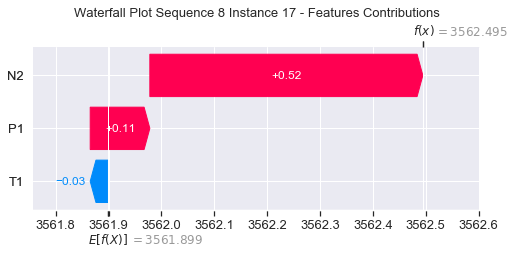

None

Contribution: [ 0.13849362 -0.04118686  0.61604332]


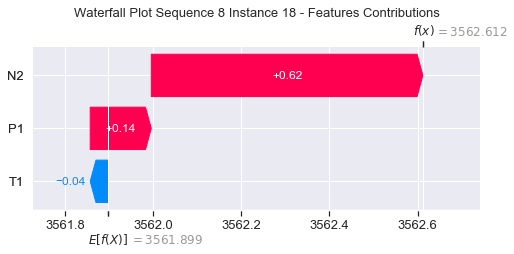

None

Contribution: [ 0.14620559 -0.11848794  0.73645951]


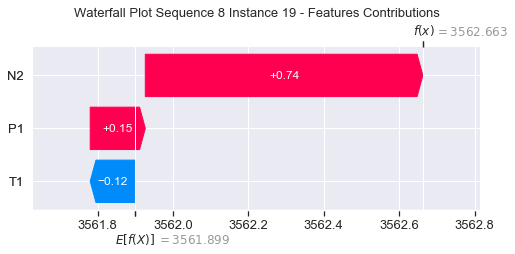

None

Contribution: [ 0.17587411 -0.19431749  0.89527989]


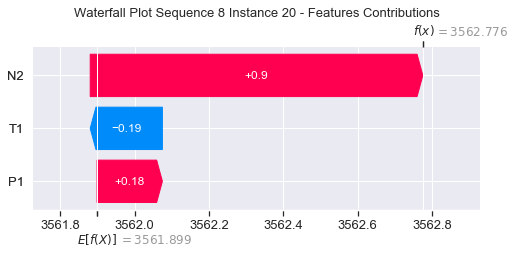

None

Contribution: [ 0.20509526 -0.51641195  1.20945647]


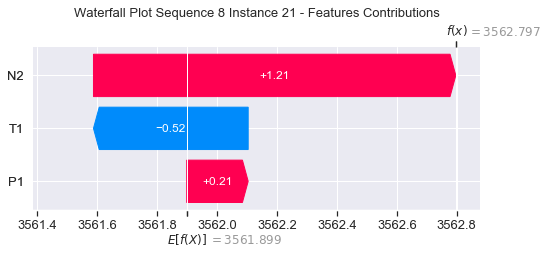

None

Contribution: [ 0.20844146 -1.74121806  1.99946777]


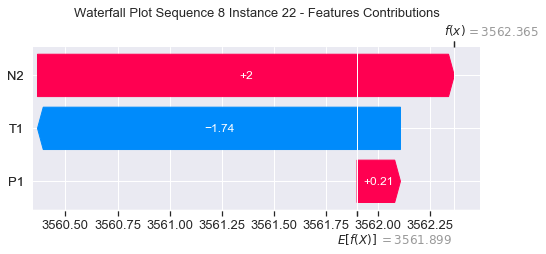

None

Contribution: [ 0.18382021 -5.42287962  4.02041351]


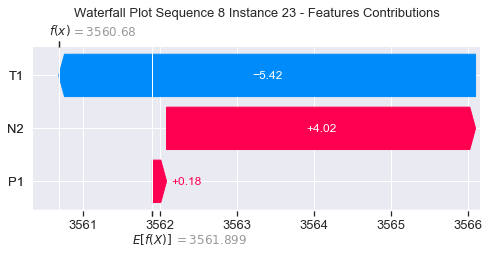

None

Contribution: [ -0.1456322  -14.50371502   6.39410694]


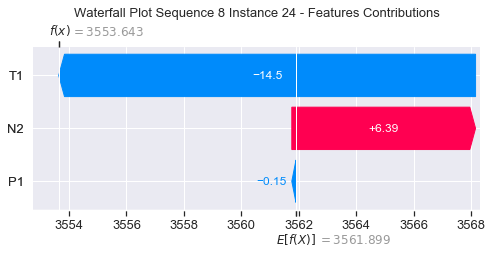

None

Contribution: [ -1.74870391 -54.41713026  31.25826952]


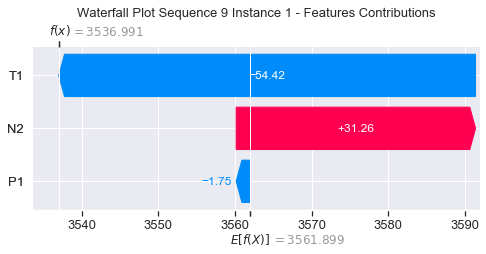

None

Contribution: [ 0.00652877 -2.24001985  1.1691384 ]


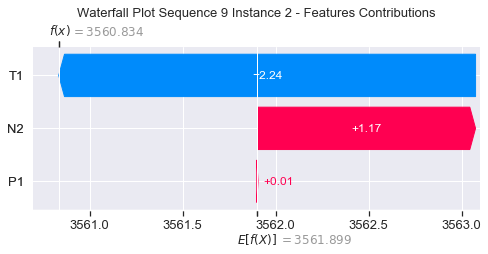

None

Contribution: [ 0.03229361 -0.27998977  0.27804339]


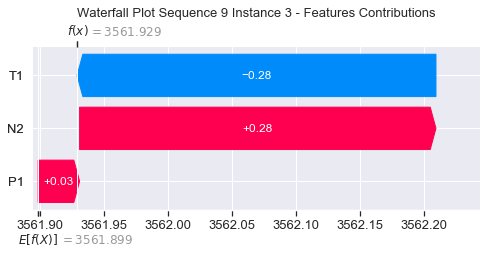

None

Contribution: [ 0.00954403 -0.05179738  0.0958406 ]


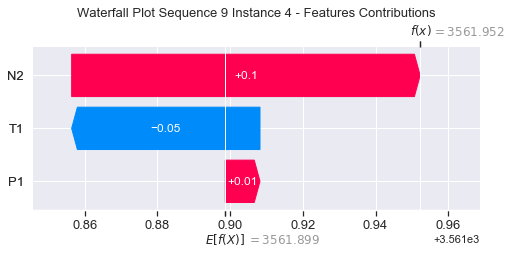

None

Contribution: [ 0.0274235  -0.00058554  0.13600405]


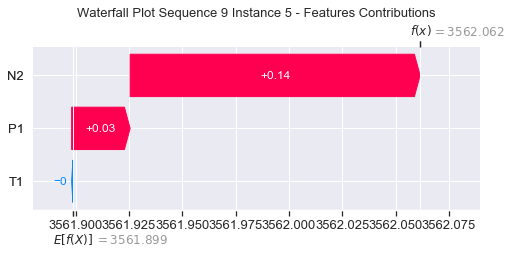

None

Contribution: [0.0295603  0.04265968 0.1243538 ]


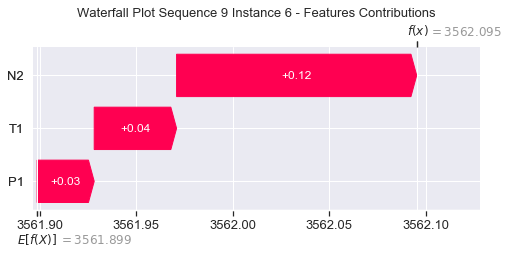

None

Contribution: [0.03640027 0.09054077 0.12657715]


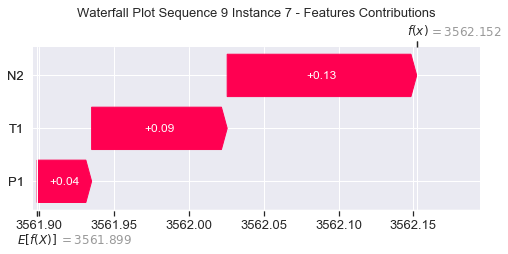

None

Contribution: [0.03416135 0.05066555 0.14176795]


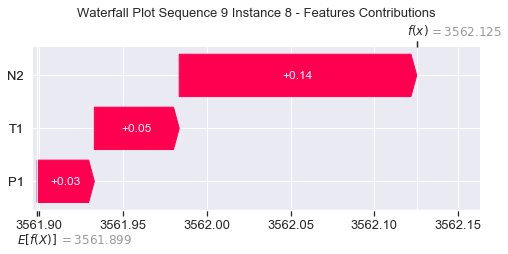

None

Contribution: [0.03564965 0.0212277  0.16048865]


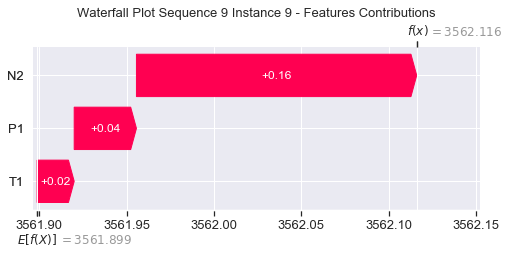

None

Contribution: [0.03400738 0.01941279 0.18098383]


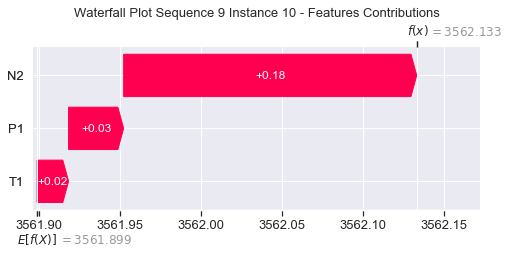

None

Contribution: [0.04458046 0.02345427 0.20540599]


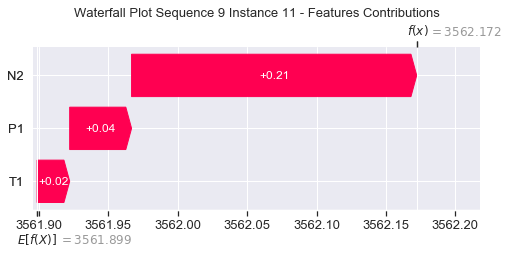

None

Contribution: [0.04874927 0.00932727 0.23269442]


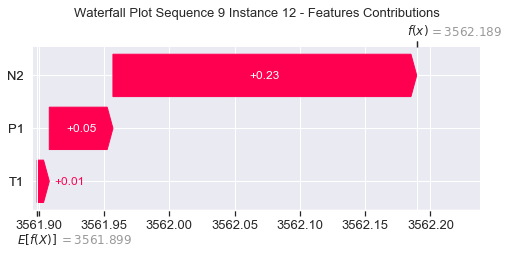

None

Contribution: [0.0581128  0.00856717 0.26949516]


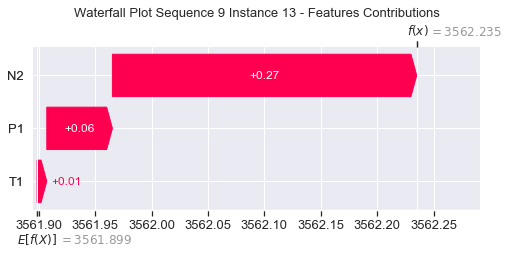

None

Contribution: [ 0.07353619 -0.01316745  0.31822817]


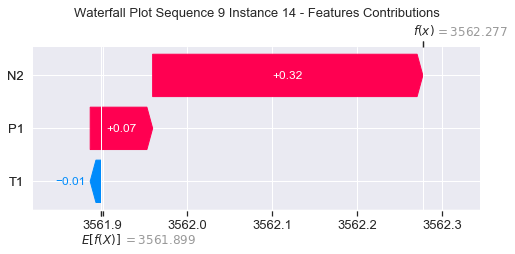

None

Contribution: [ 0.07803928 -0.02305957  0.36905532]


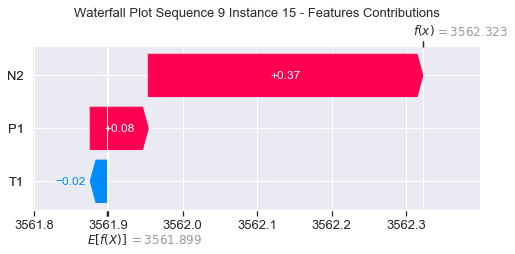

None

Contribution: [ 0.0922379  -0.04860338  0.4425384 ]


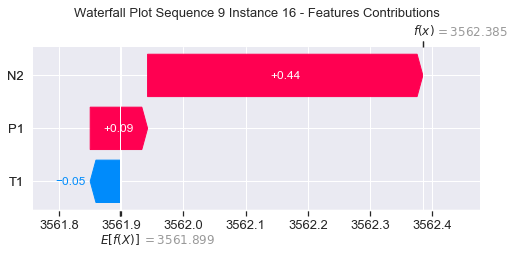

None

Contribution: [ 0.11509841 -0.04641644  0.51872594]


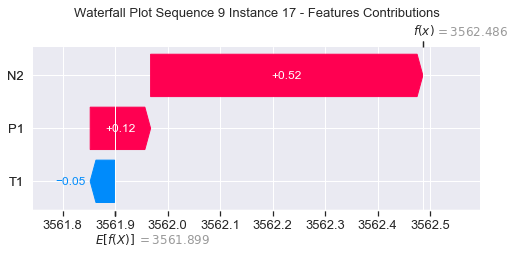

None

Contribution: [ 0.13789426 -0.06669811  0.61747399]


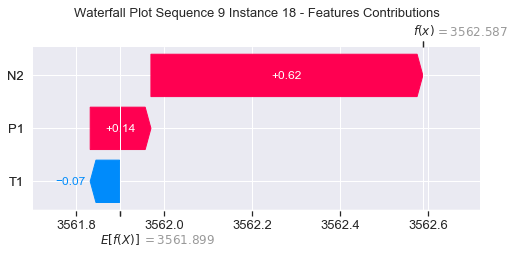

None

Contribution: [ 0.14771025 -0.08928229  0.74469642]


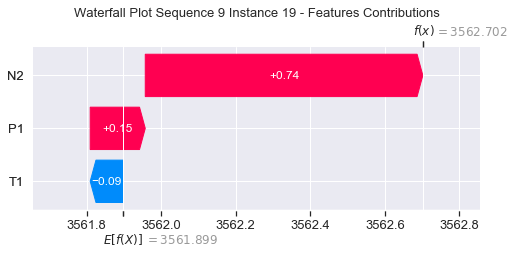

None

Contribution: [ 0.20094846 -0.19567149  0.9053532 ]


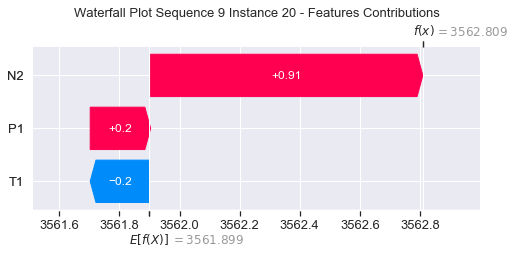

None

Contribution: [ 0.25736528 -0.54894517  1.23246896]


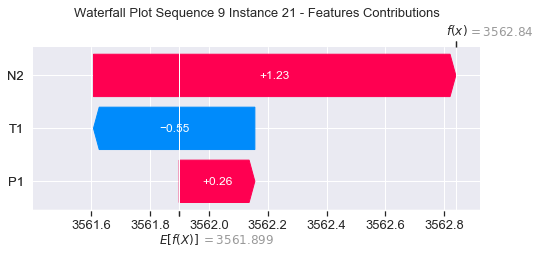

None

Contribution: [ 0.33722214 -1.99306491  2.06633139]


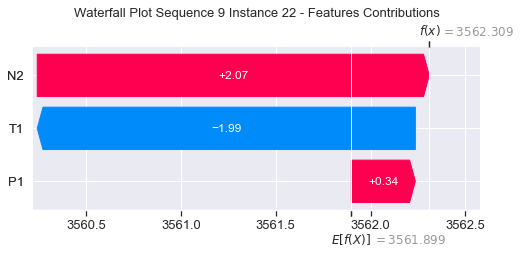

None

Contribution: [ 0.26354152 -7.10093338  4.07269311]


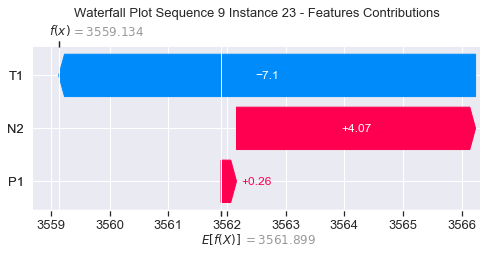

None

Contribution: [  0.46826112 -17.48258227   6.59289296]


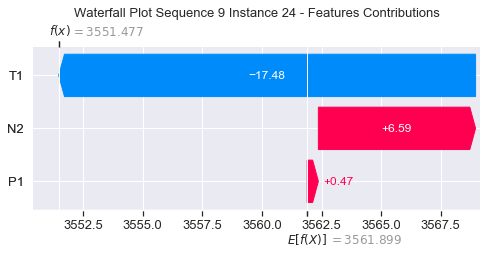

None

Contribution: [  5.05000105 -66.70965889  31.9480035 ]


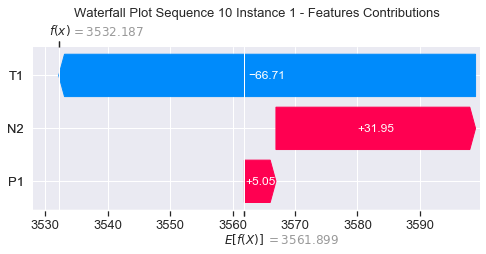

None

Contribution: [ 0.19164391 -3.22710959  1.2230825 ]


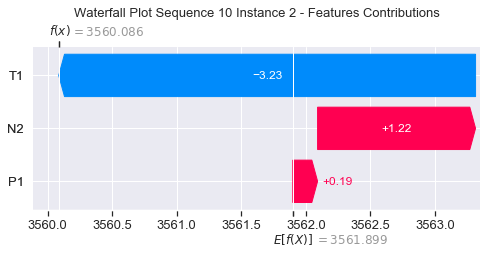

None

Contribution: [ 0.03575342 -0.27667478  0.27882884]


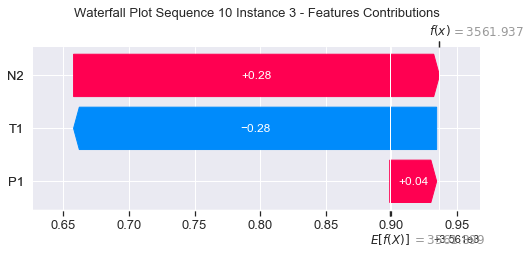

None

Contribution: [ 0.02063128 -0.07843276  0.09912296]


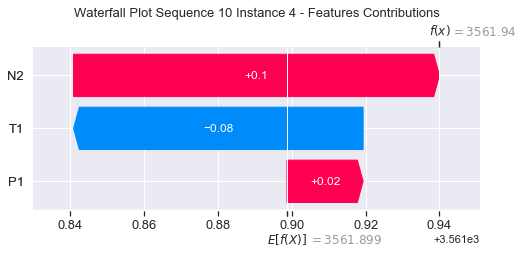

None

Contribution: [ 0.03735221 -0.0003912   0.13769097]


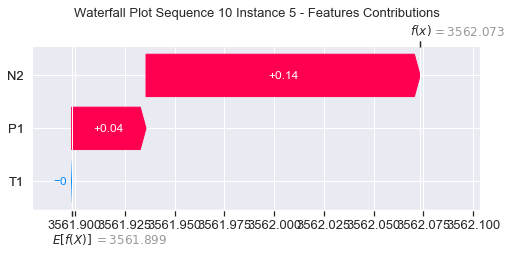

None

Contribution: [0.03920828 0.0344335  0.12607753]


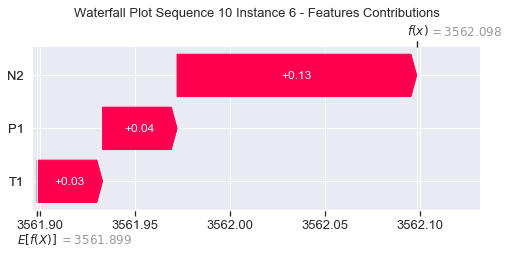

None

Contribution: [0.03908522 0.09639515 0.12620127]


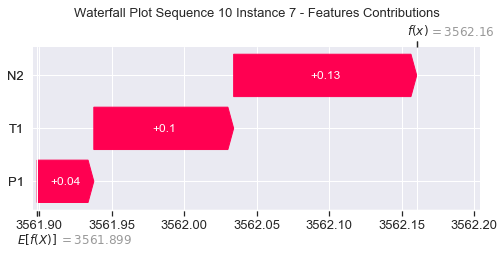

None

Contribution: [0.04483372 0.04595056 0.14349885]


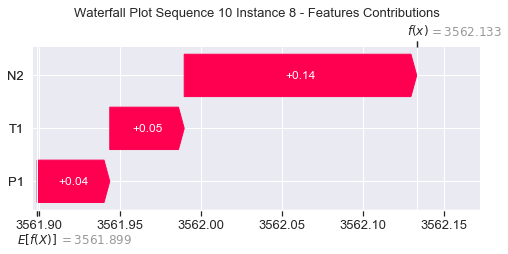

None

Contribution: [0.05791209 0.01529345 0.16385932]


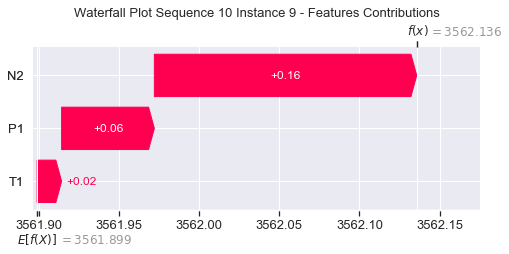

None

Contribution: [0.06050912 0.0172683  0.18590435]


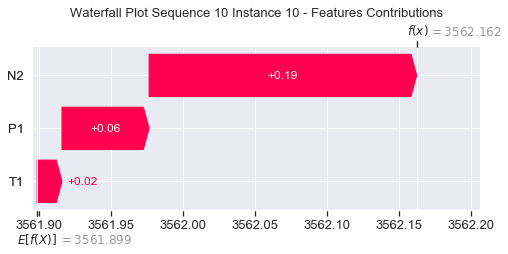

None

Contribution: [0.09004402 0.02527766 0.21824814]


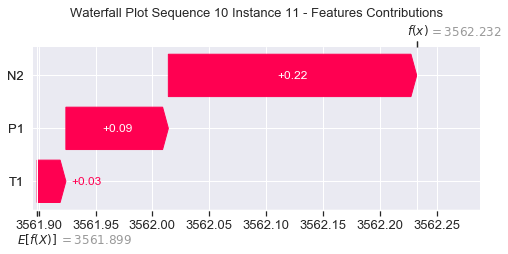

None

Contribution: [ 0.07012982 -0.00566107  0.24167654]


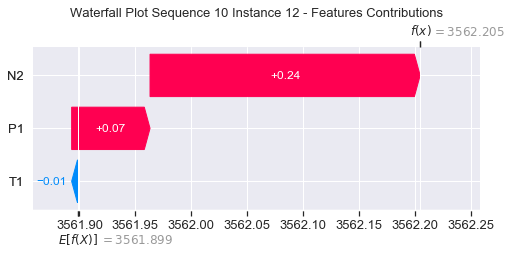

None

Contribution: [ 0.07771426 -0.01100238  0.27836647]


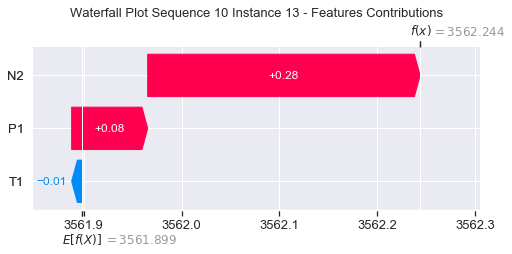

None

Contribution: [ 0.09293375 -0.01368669  0.32622969]


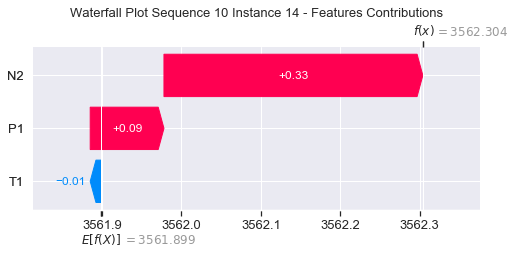

None

Contribution: [ 0.10388852 -0.05899921  0.38259485]


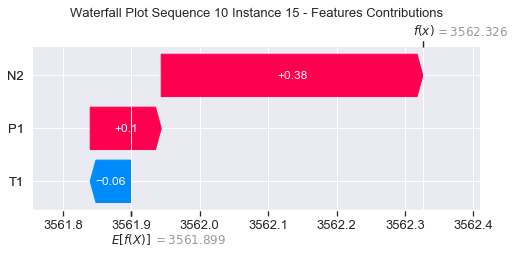

None

Contribution: [ 0.09203595 -0.13253813  0.44739542]


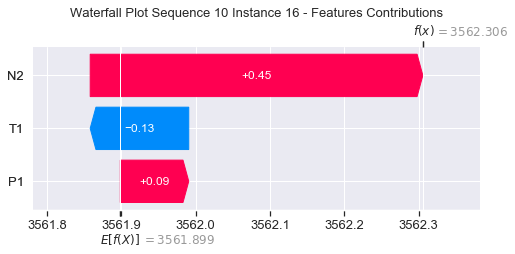

None

Contribution: [ 0.14157    -0.10696649  0.53135558]


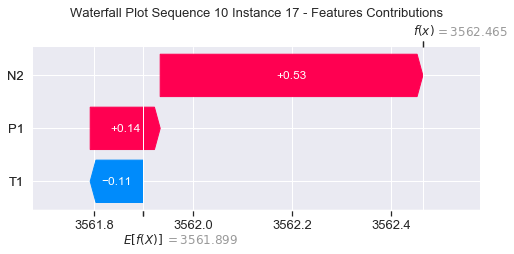

None

Contribution: [ 0.17021477 -0.1409566   0.63204725]


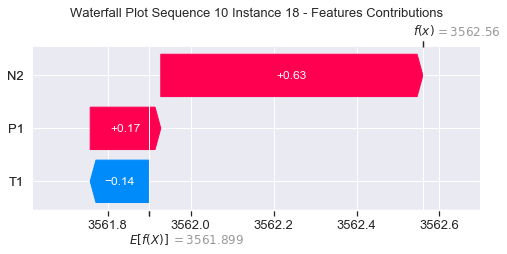

None

Contribution: [ 0.17501932 -0.31234661  0.76389105]


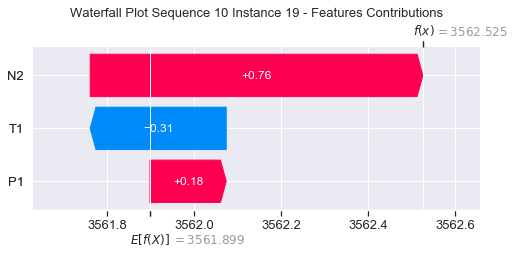

None

Contribution: [ 0.24105532 -0.36998885  0.9136109 ]


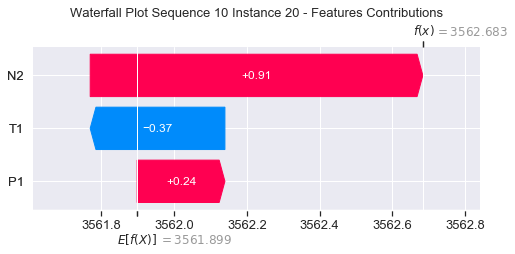

None

Contribution: [ 0.33519566 -0.88979851  1.23654367]


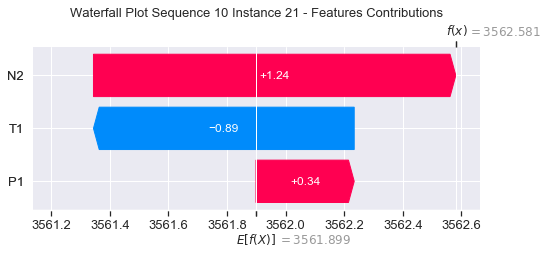

None

Contribution: [ 0.56799447 -2.75095361  2.06403935]


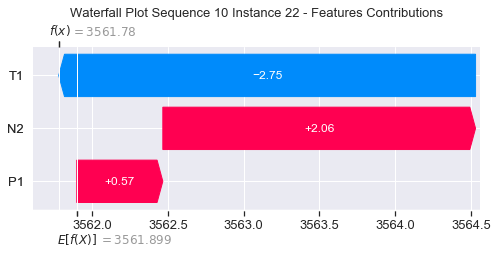

None

Contribution: [ 1.02354066 -9.71336832  4.10508465]


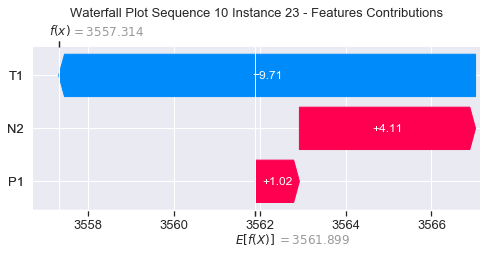

None

Contribution: [  1.71463327 -21.50612941   6.45644764]


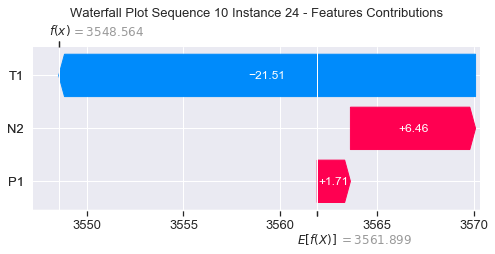

None

Contribution: [  4.56511461 -70.40726159  28.96788155]


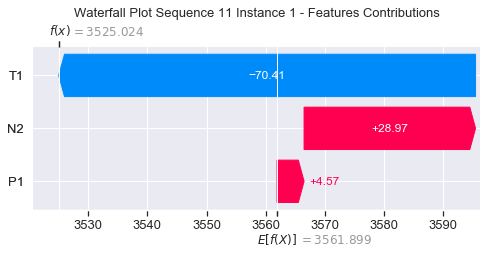

None

Contribution: [ 0.41887359 -3.7984106   1.19199376]


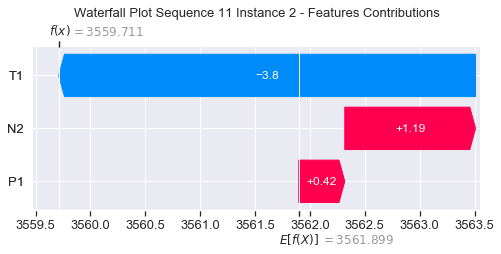

None

Contribution: [ 0.06768967 -0.27167229  0.28024664]


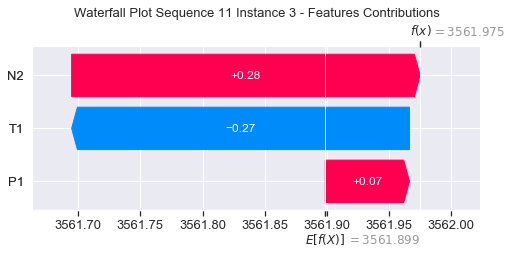

None

Contribution: [ 0.03438718 -0.04587572  0.09754657]


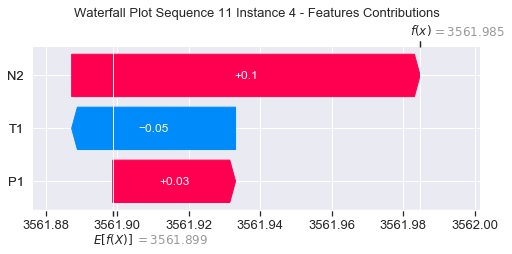

None

Contribution: [0.04767517 0.01275143 0.13628705]


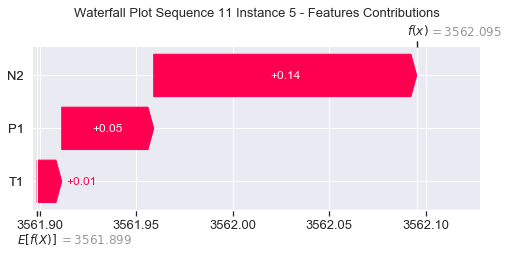

None

Contribution: [0.04450896 0.04870149 0.12348157]


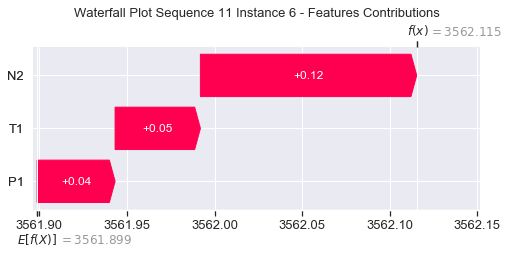

None

Contribution: [0.04033357 0.08311152 0.1231094 ]


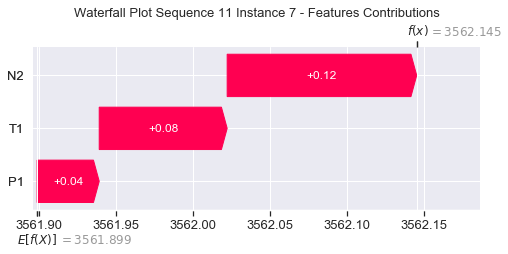

None

Contribution: [0.04883756 0.05364197 0.140121  ]


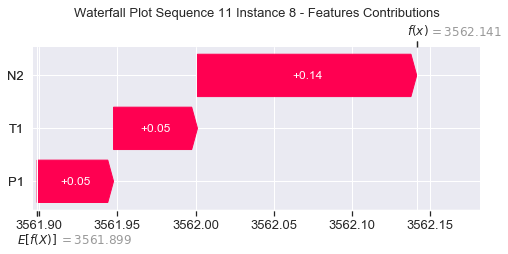

None

Contribution: [0.04550796 0.03519556 0.15742018]


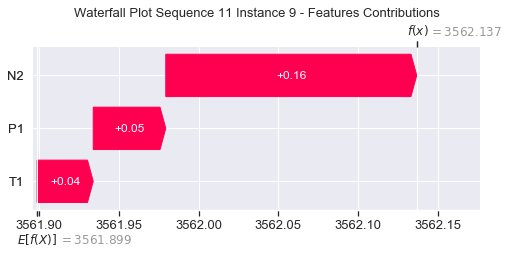

None

Contribution: [0.04691001 0.03456909 0.17694388]


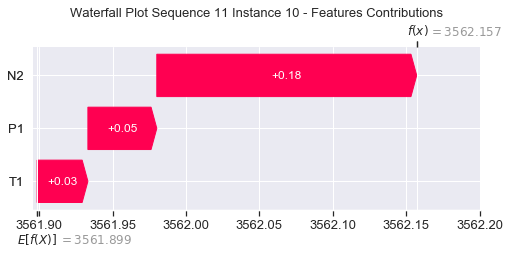

None

Contribution: [0.06784634 0.03813305 0.20180278]


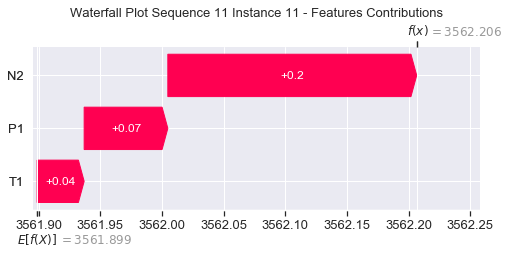

None

Contribution: [0.07785458 0.02981138 0.22890388]


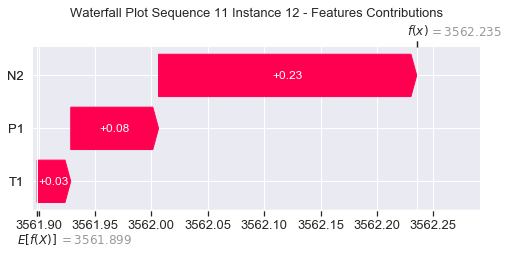

None

Contribution: [0.08635067 0.03436135 0.26384915]


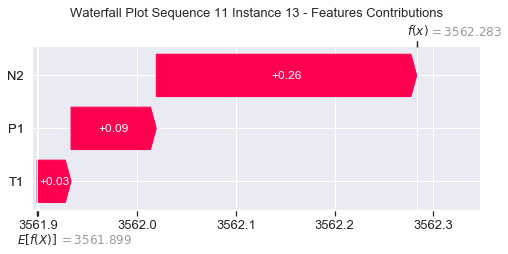

None

Contribution: [0.09781925 0.02727115 0.30793619]


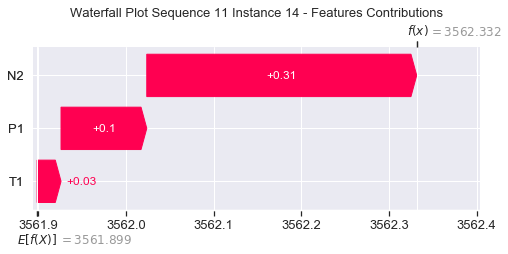

None

Contribution: [0.11310641 0.01872895 0.35934719]


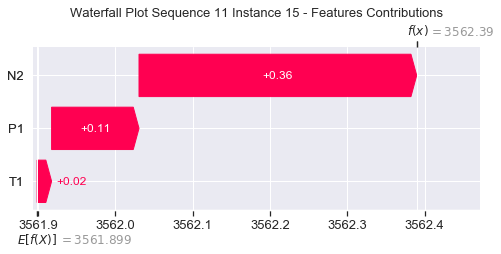

None

Contribution: [0.15502485 0.00188671 0.42864152]


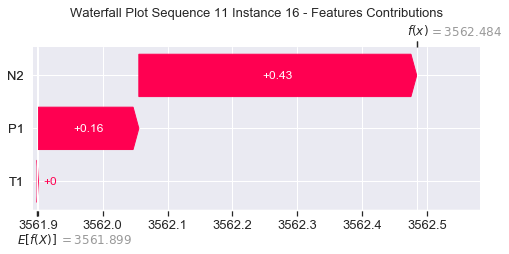

None

Contribution: [0.15233189 0.02277787 0.50316808]


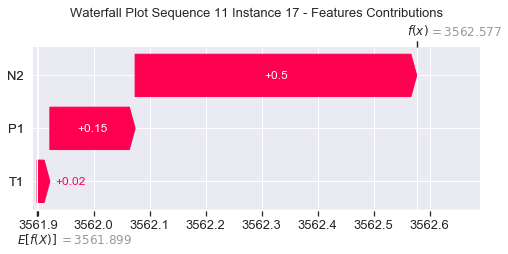

None

Contribution: [0.1821023  0.02075828 0.59861497]


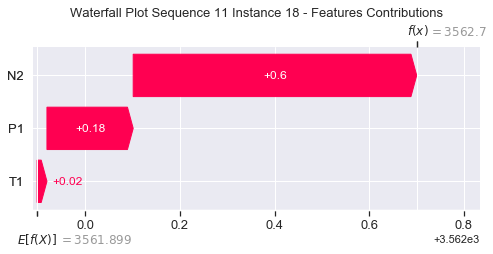

None

Contribution: [0.22513933 0.01272649 0.72519519]


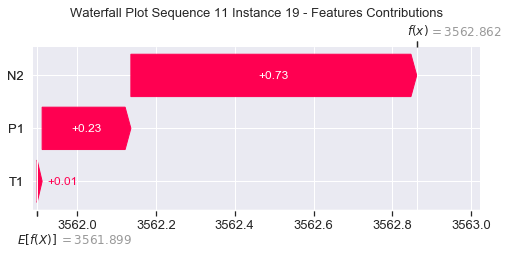

None

Contribution: [ 2.62090651e-01 -7.87463209e-04  8.72819822e-01]


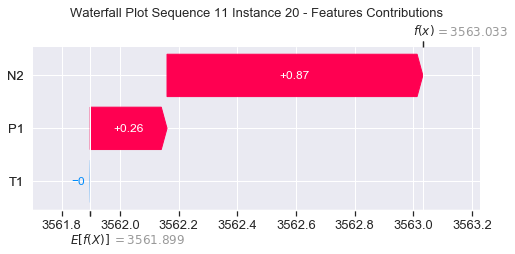

None

Contribution: [ 0.37862844 -0.11260651  1.18627647]


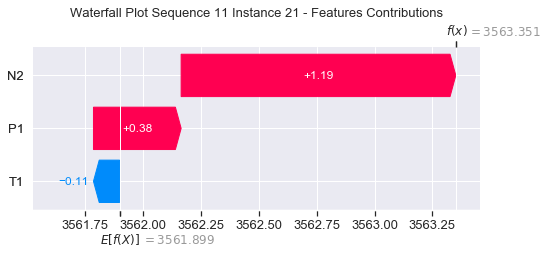

None

Contribution: [ 0.67762105 -0.7416767   1.98545349]


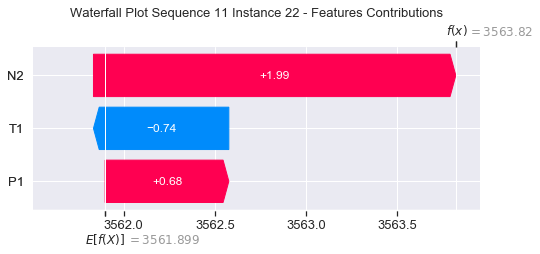

None

Contribution: [ 1.33402369 -3.17048329  3.90698502]


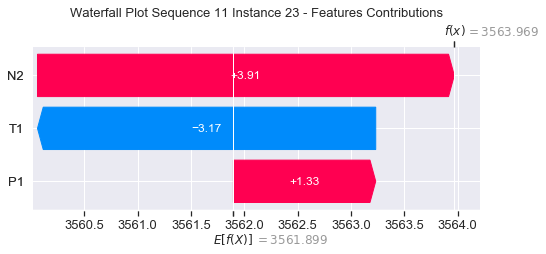

None

Contribution: [ 2.7460315  -8.45949979  6.28596813]


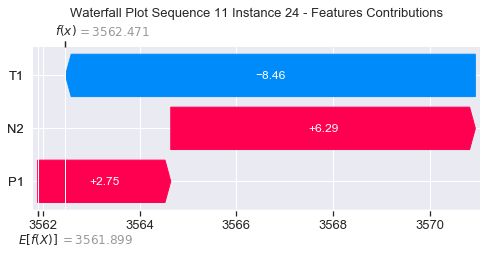

None

Contribution: [ 16.27771188 -29.42638673  30.36973946]


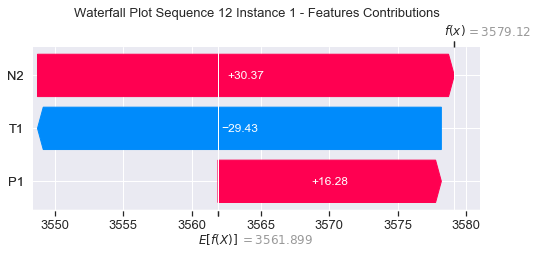

None

Contribution: [ 0.53641454 -1.4446875   1.10310263]


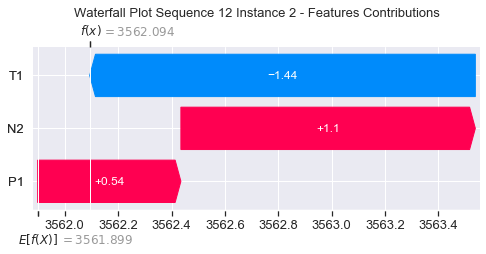

None

Contribution: [ 0.07798569 -0.13302753  0.26566516]


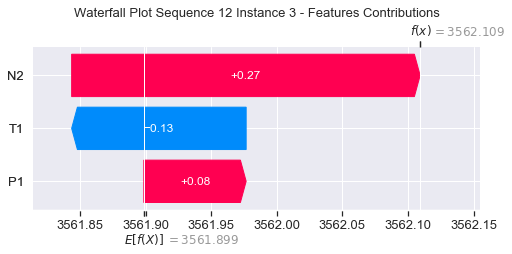

None

Contribution: [ 0.03551724 -0.01256289  0.10410405]


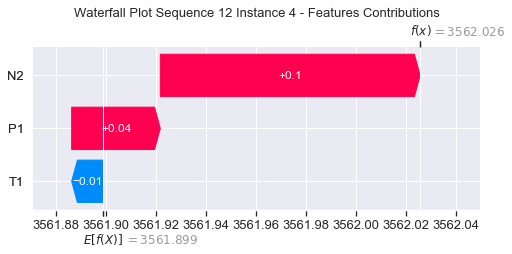

None

Contribution: [0.048185   0.04462125 0.14293857]


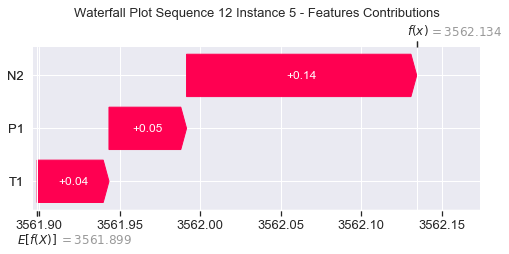

None

Contribution: [0.04321947 0.0719302  0.12923878]


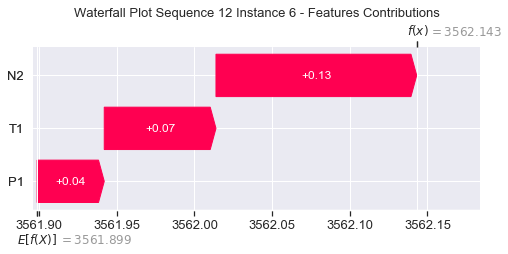

None

Contribution: [0.04107946 0.10259639 0.12998989]


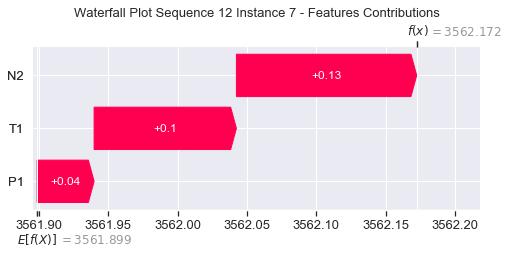

None

Contribution: [0.04900332 0.06788218 0.14675778]


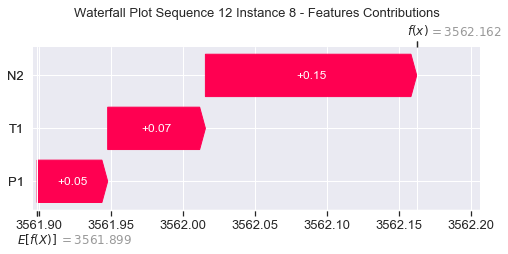

None

Contribution: [0.05309131 0.04640527 0.16356643]


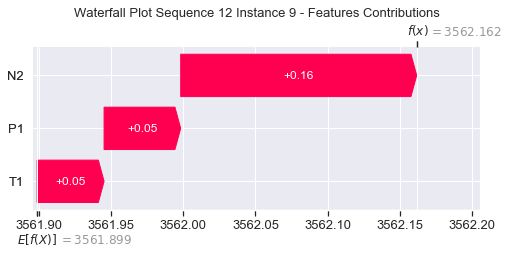

None

Contribution: [0.06592559 0.04176067 0.18487286]


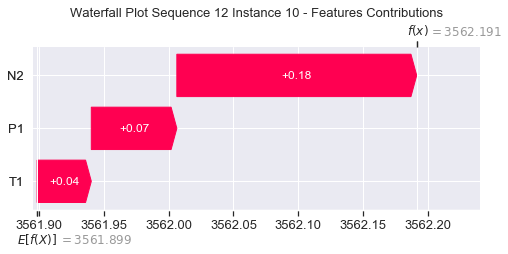

None

Contribution: [0.06333607 0.0483325  0.20632788]


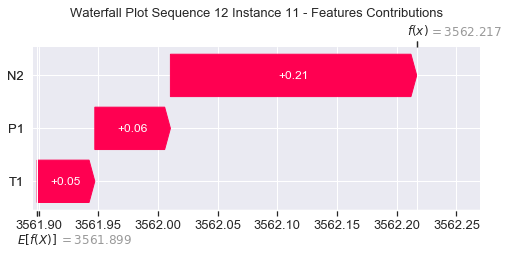

None

Contribution: [0.07114806 0.03351952 0.23293497]


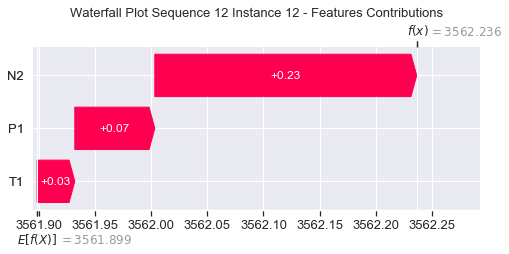

None

Contribution: [0.08236317 0.03218103 0.26879809]


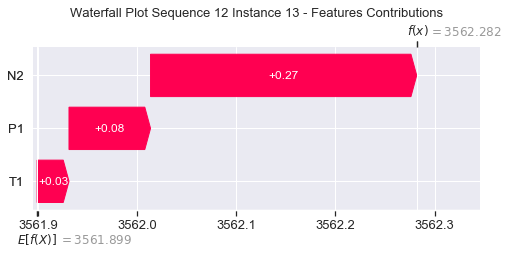

None

Contribution: [0.09705735 0.00840757 0.31271725]


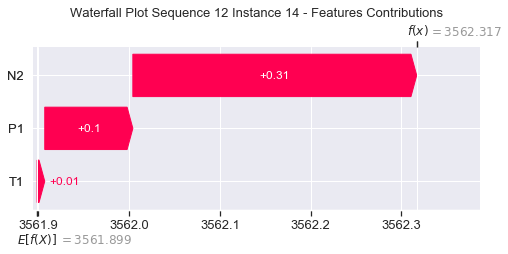

None

Contribution: [0.10785827 0.00210354 0.36652737]


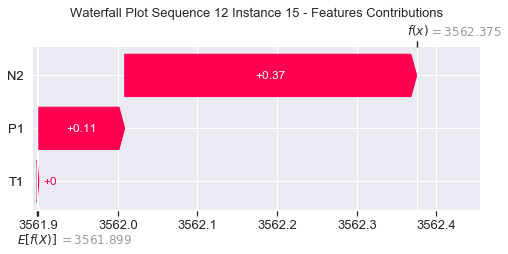

None

Contribution: [ 0.12541607 -0.01916054  0.43763474]


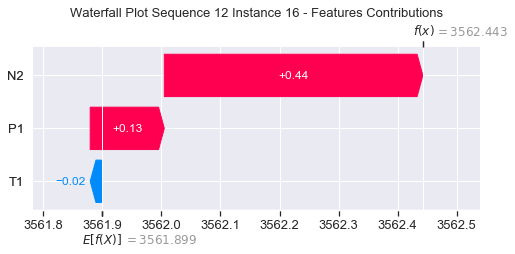

None

Contribution: [ 0.15206922 -0.0158197   0.51572098]


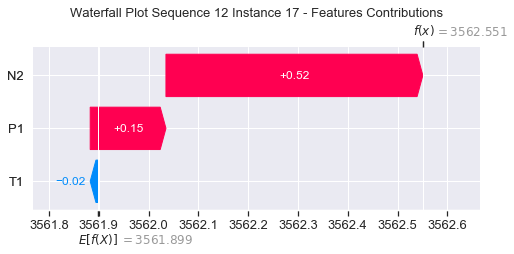

None

Contribution: [ 0.17981145 -0.02496527  0.61456182]


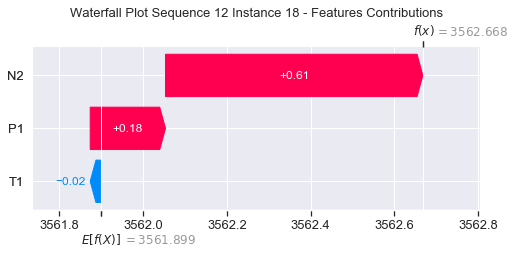

None

Contribution: [ 0.18720917 -0.05956097  0.73500139]


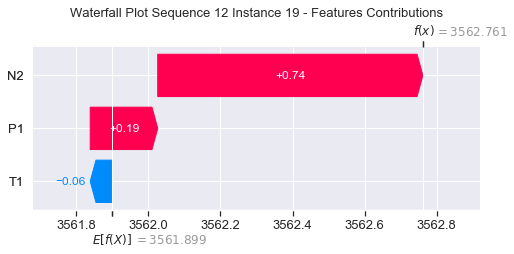

None

Contribution: [ 0.27073026 -0.05380146  0.90371257]


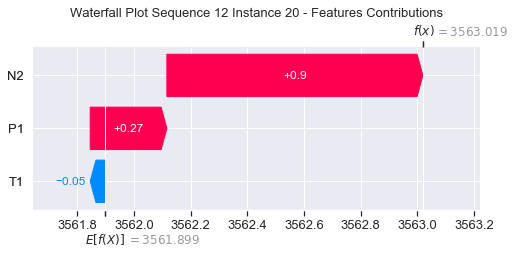

None

Contribution: [ 0.38580027 -0.19862995  1.24126885]


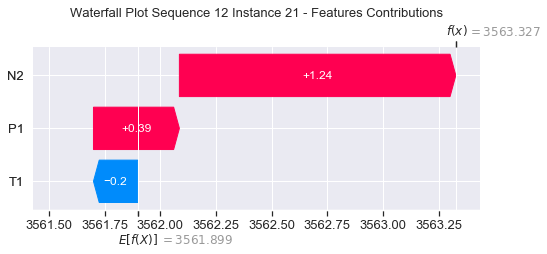

None

Contribution: [ 0.65803964 -1.03145131  2.11085993]


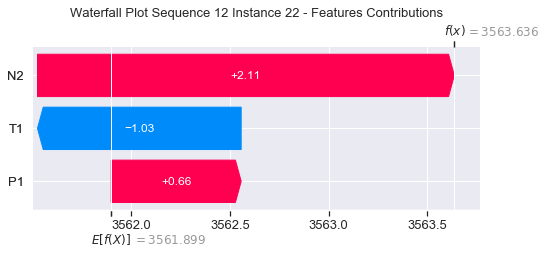

None

Contribution: [ 1.16307841 -4.66580566  4.20830667]


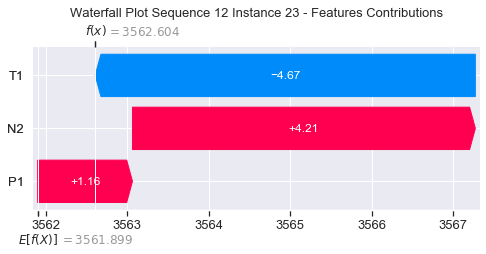

None

Contribution: [  2.3059404  -10.92901996   6.96617654]


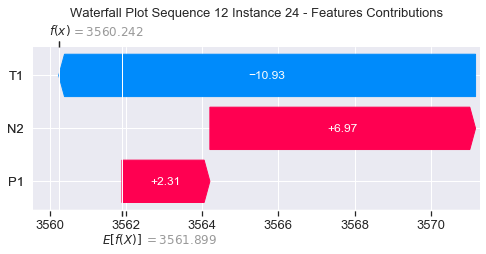

None

Contribution: [ 12.18108008 -33.81356627  34.65955296]


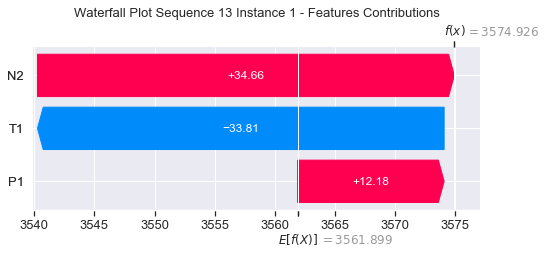

None

Contribution: [ 0.45353551 -2.09983962  1.15240396]


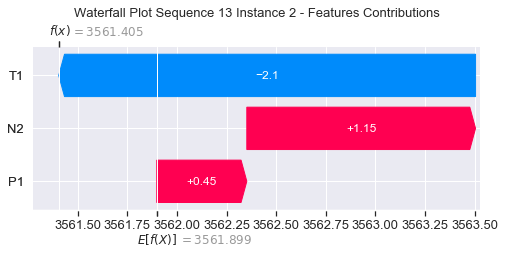

None

Contribution: [ 0.05945542 -0.14361223  0.27078744]


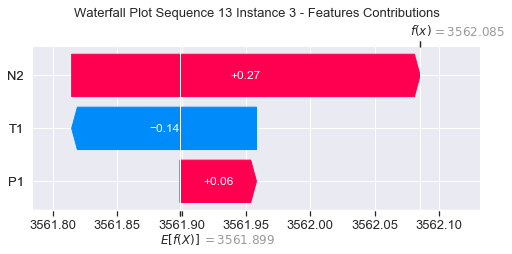

None

Contribution: [ 0.0268634  -0.01253562  0.10443071]


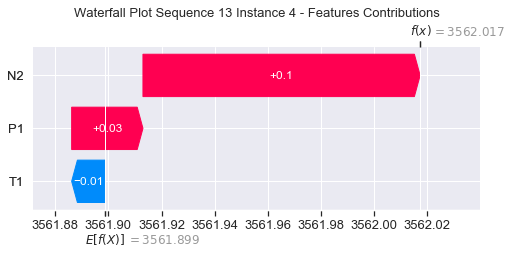

None

Contribution: [0.04279203 0.03895993 0.14159134]


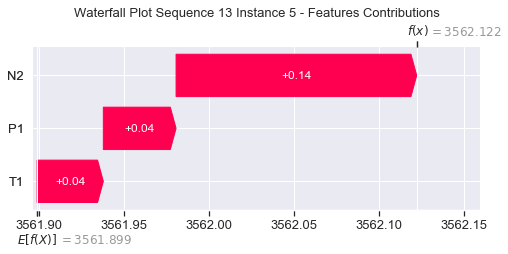

None

Contribution: [0.04002699 0.07149368 0.12796694]


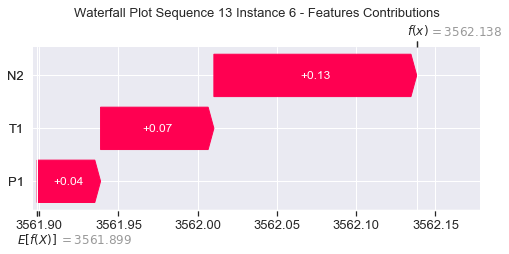

None

Contribution: [0.04065005 0.10346631 0.1286404 ]


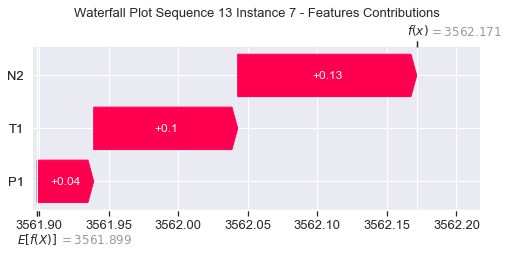

None

Contribution: [0.04466015 0.06810487 0.14516592]


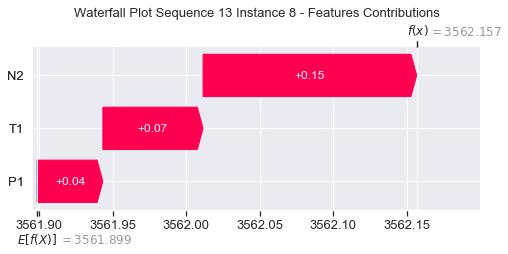

None

Contribution: [0.04949327 0.04559198 0.16376222]


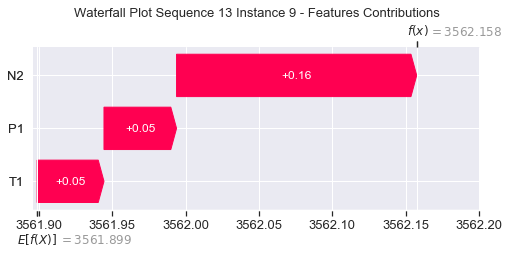

None

Contribution: [0.05016422 0.0411084  0.17934876]


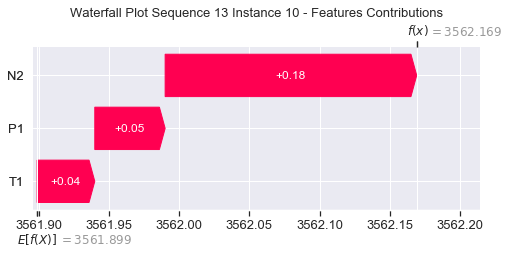

None

Contribution: [0.06003344 0.0498722  0.20656689]


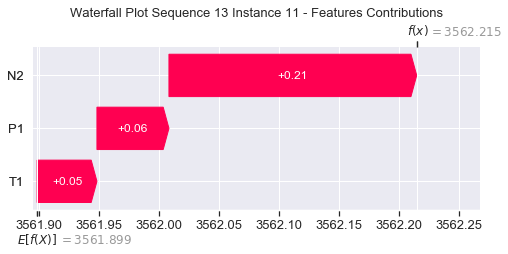

None

Contribution: [0.06500749 0.04134388 0.23309111]


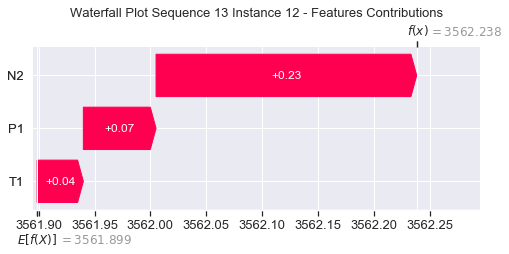

None

Contribution: [0.07452512 0.04294317 0.26849969]


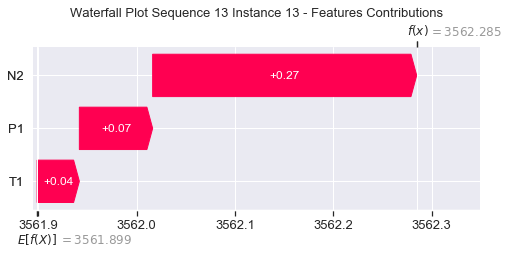

None

Contribution: [0.08751428 0.03617271 0.31396161]


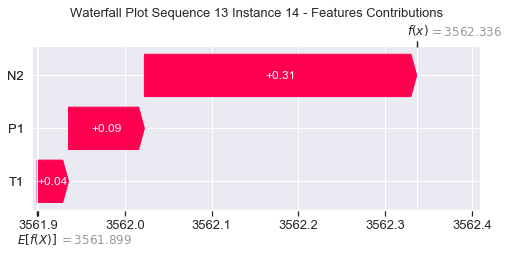

None

Contribution: [0.09580184 0.02346717 0.3658978 ]


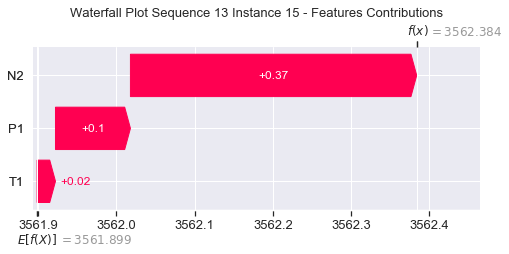

None

Contribution: [0.10430238 0.0176508  0.43501808]


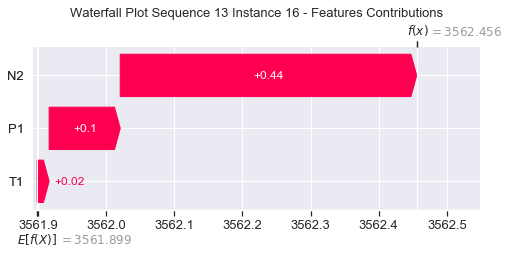

None

Contribution: [0.13456317 0.02117026 0.51399341]


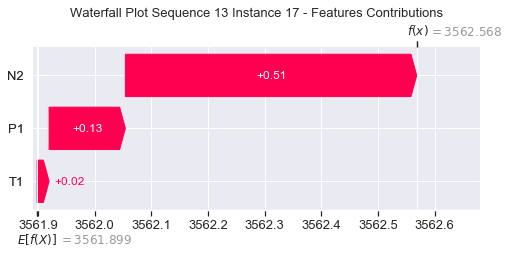

None

Contribution: [0.15820673 0.02121585 0.61167627]


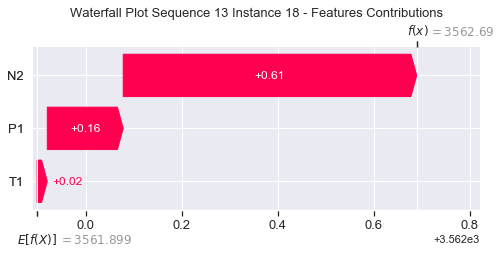

None

Contribution: [ 0.15578258 -0.00519138  0.73444095]


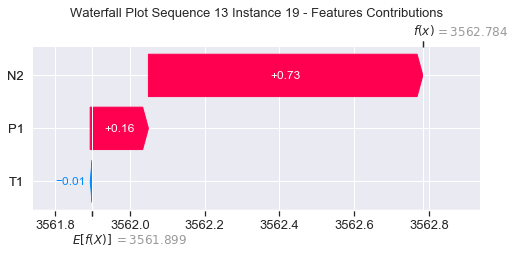

None

Contribution: [0.22950202 0.01973673 0.89687684]


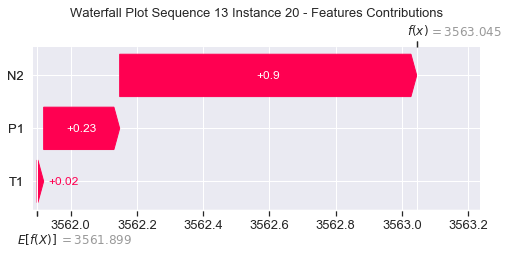

None

Contribution: [ 0.31520041 -0.0265175   1.23561249]


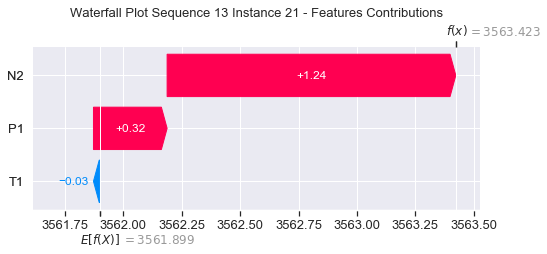

None

Contribution: [ 0.48352095 -0.52138105  2.11294101]


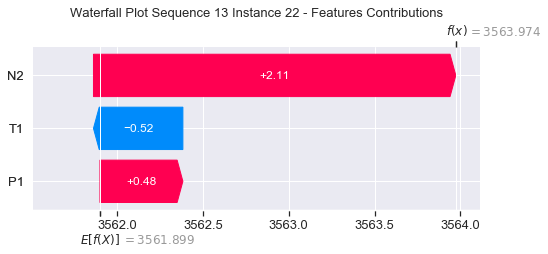

None

Contribution: [ 0.64240034 -2.92588711  4.21611526]


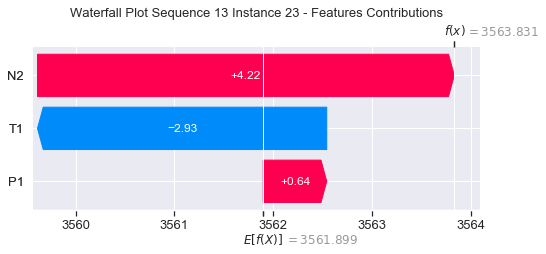

None

Contribution: [ 1.18581897 -7.73602975  6.87019532]


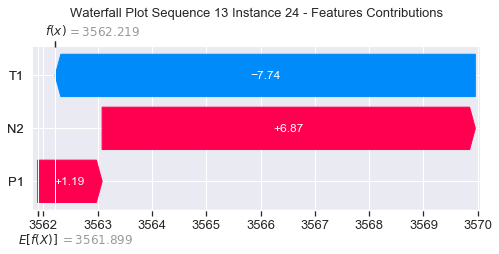

None

Contribution: [  8.59189194 -20.12353287  33.88743565]


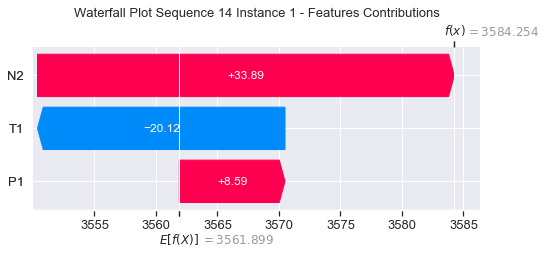

None

Contribution: [ 0.29460999 -1.12766458  1.20562799]


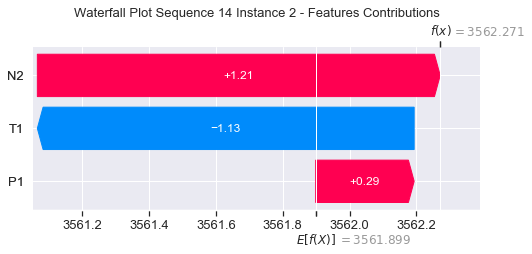

None

Contribution: [ 0.05436934 -0.03636191  0.27826039]


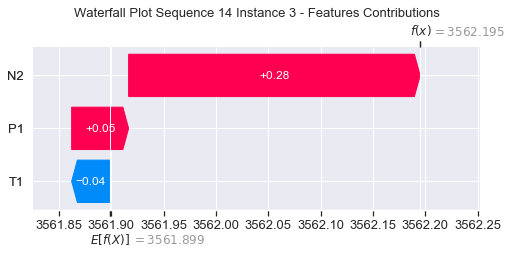

None

Contribution: [0.03299827 0.01169929 0.10886188]


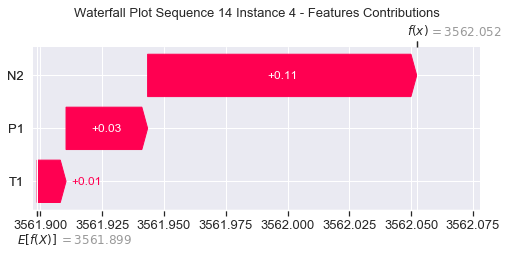

None

Contribution: [0.04491814 0.0569993  0.14319718]


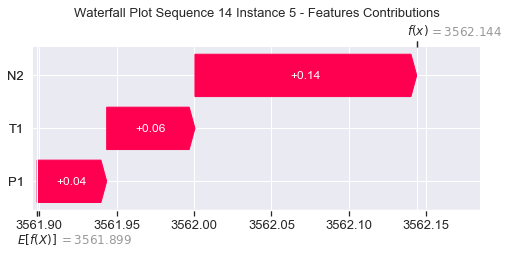

None

Contribution: [0.04066707 0.07251311 0.12912986]


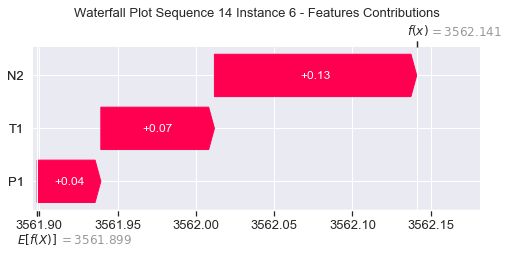

None

Contribution: [0.04107843 0.08861133 0.13017619]


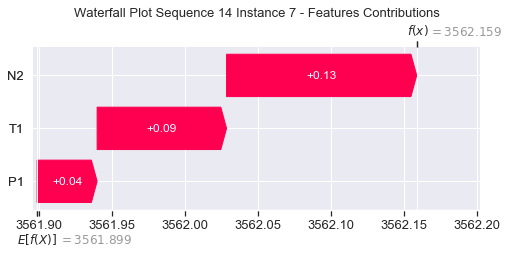

None

Contribution: [0.0454038  0.06729715 0.14646272]


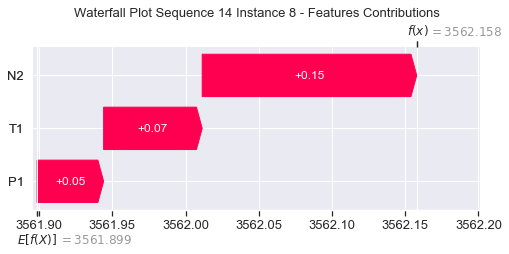

None

Contribution: [0.04985915 0.05676816 0.16464308]


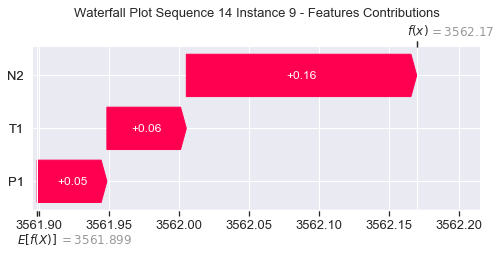

None

Contribution: [0.0536979  0.05678964 0.18315711]


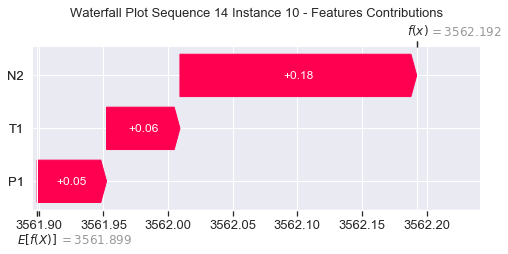

None

Contribution: [0.05796509 0.06339971 0.20673818]


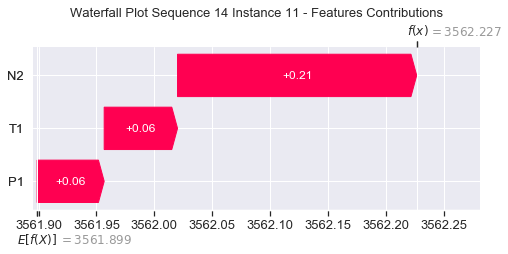

None

Contribution: [0.06409294 0.04952671 0.2325447 ]


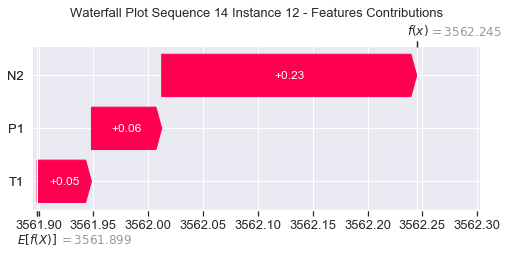

None

Contribution: [0.07424196 0.05249365 0.26796265]


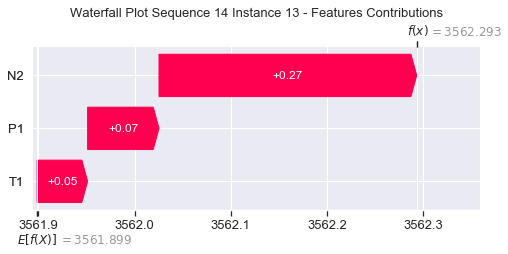

None

Contribution: [0.0846961  0.04090359 0.30967789]


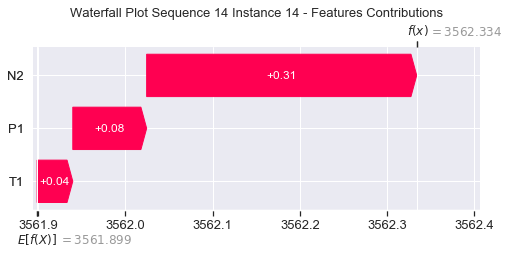

None

Contribution: [0.09614109 0.0329041  0.36477073]


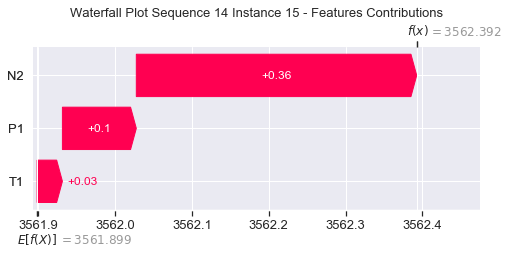

None

Contribution: [0.10396295 0.01308026 0.43441778]


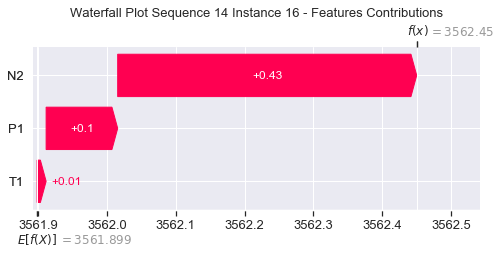

None

Contribution: [0.13487509 0.02936852 0.51253054]


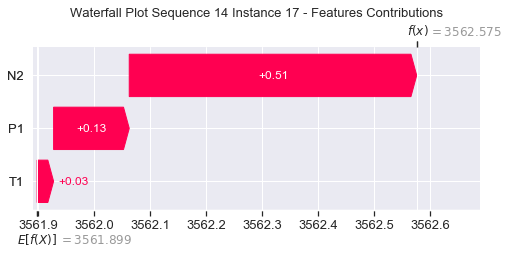

None

Contribution: [0.15838812 0.02561433 0.61007067]


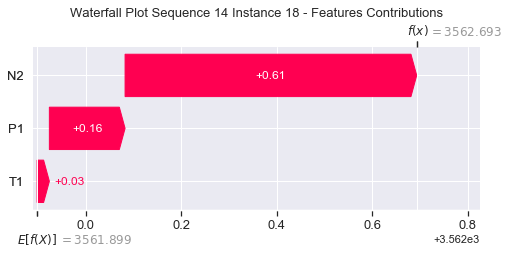

None

Contribution: [ 0.17870183 -0.00575163  0.73936797]


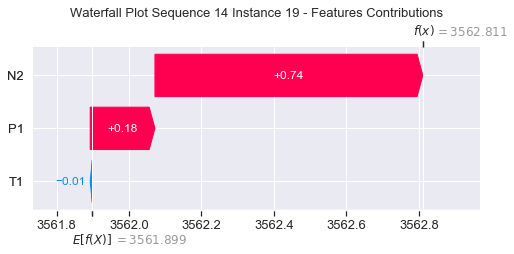

None

Contribution: [0.23525323 0.03645952 0.89739161]


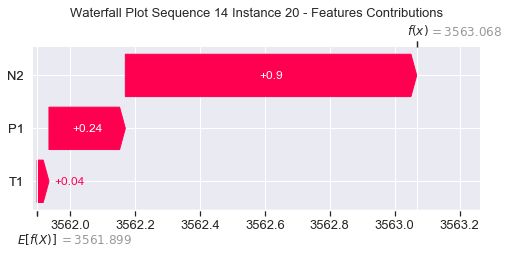

None

Contribution: [ 0.32362276 -0.01455744  1.23593228]


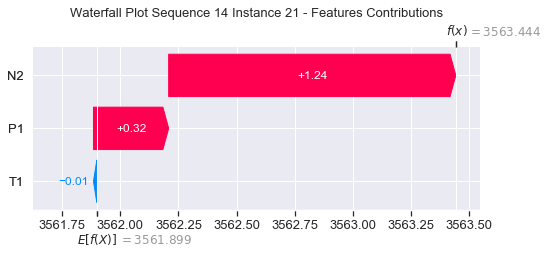

None

Contribution: [ 0.50648585 -0.58391513  2.11197593]


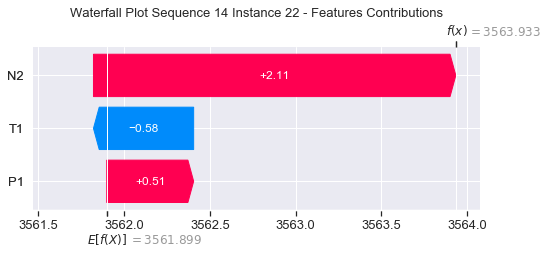

None

Contribution: [ 0.67089468 -3.47987729  4.19959939]


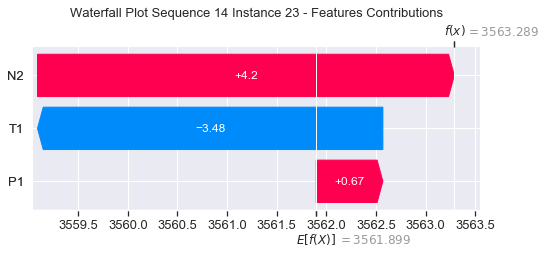

None

Contribution: [ 1.23577548 -8.92351513  6.72111421]


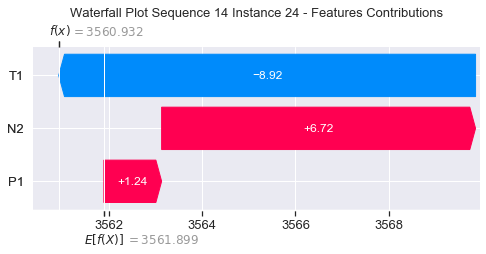

None

Contribution: [  7.59156302 -26.47132178  31.08703263]


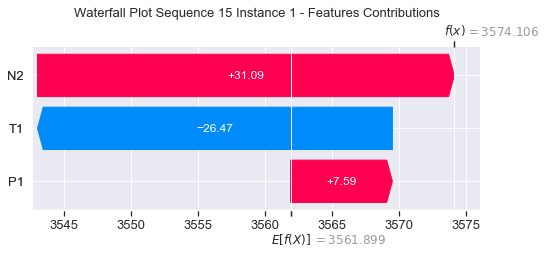

None

Contribution: [ 0.31079128 -1.5493624   1.17969996]


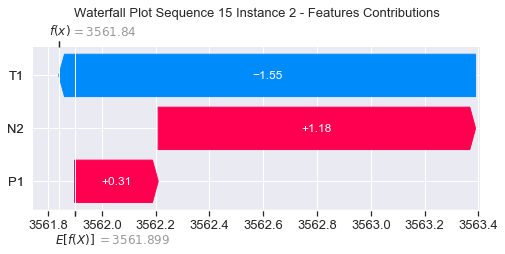

None

Contribution: [ 0.06169881 -0.10381258  0.27512184]


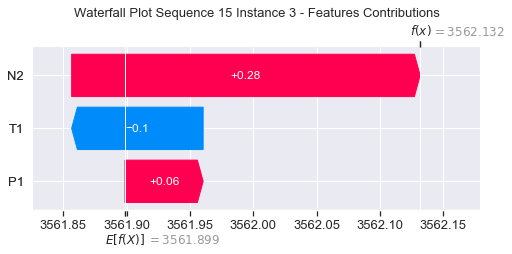

None

Contribution: [ 0.02486333 -0.01582959  0.10427062]


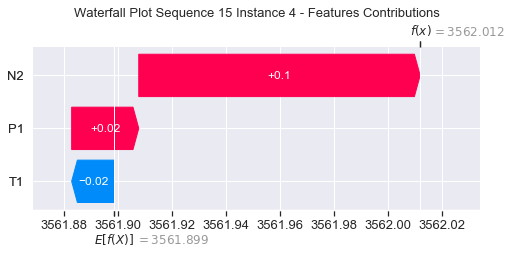

None

Contribution: [0.04353379 0.04555853 0.14196365]


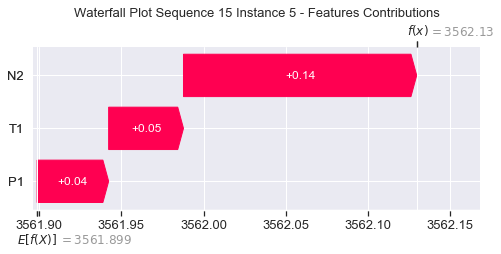

None

Contribution: [0.04082918 0.07094565 0.12802636]


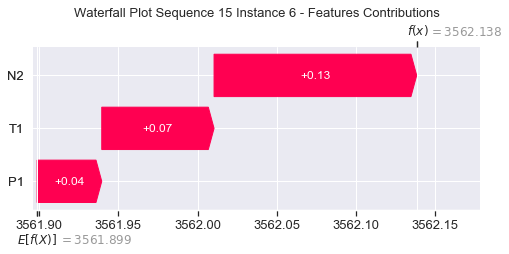

None

Contribution: [0.04068636 0.0955542  0.12812538]


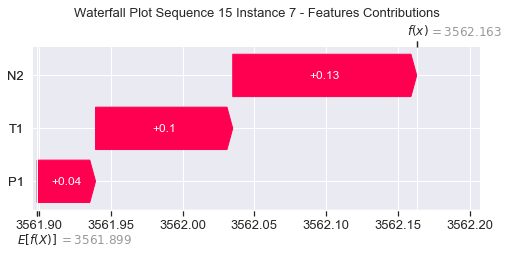

None

Contribution: [0.04518819 0.06739872 0.14533334]


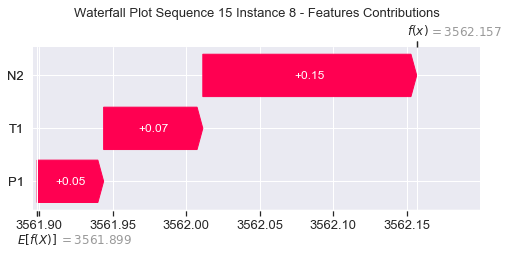

None

Contribution: [0.0455617  0.05060142 0.16344199]


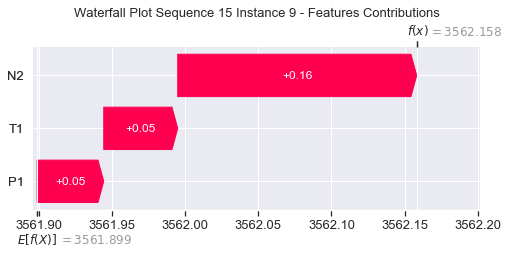

None

Contribution: [0.05286112 0.04865243 0.18254526]


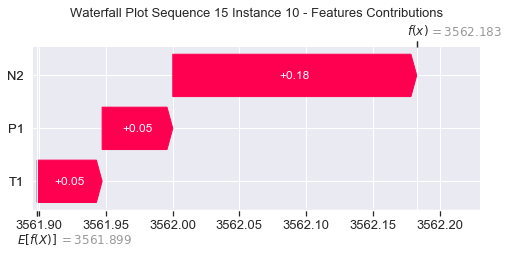

None

Contribution: [0.05322539 0.05416777 0.20441557]


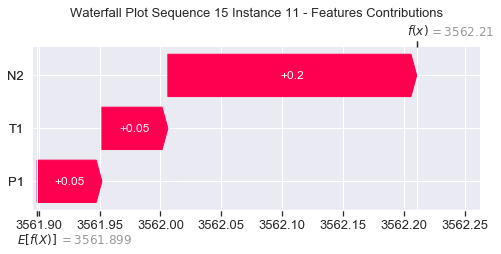

None

Contribution: [0.06331094 0.04567672 0.23194104]


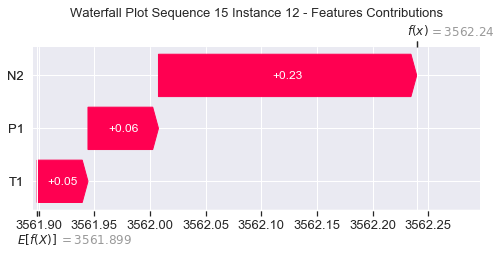

None

Contribution: [0.07335162 0.04877925 0.26761652]


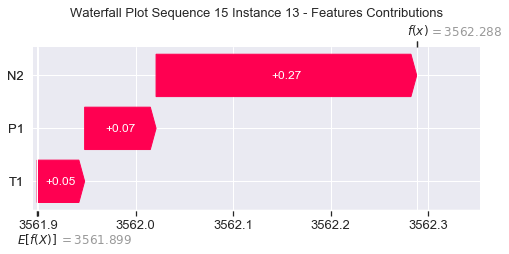

None

Contribution: [0.0896597  0.02736329 0.31320497]


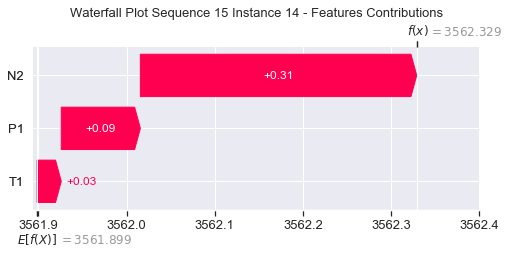

None

Contribution: [0.09500175 0.02845919 0.36461691]


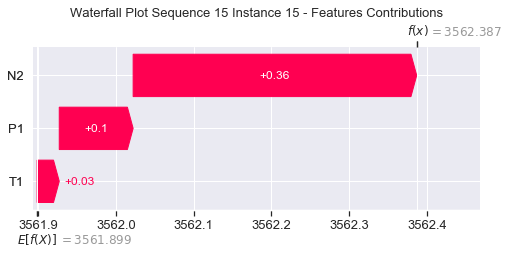

None

Contribution: [0.10811185 0.03331188 0.43533287]


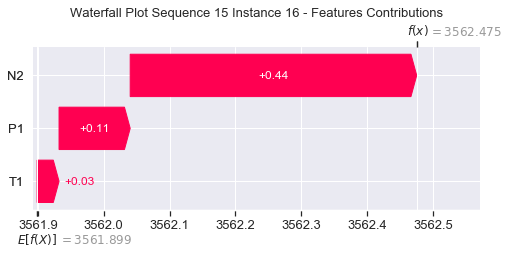

None

Contribution: [0.13469713 0.02812983 0.51335434]


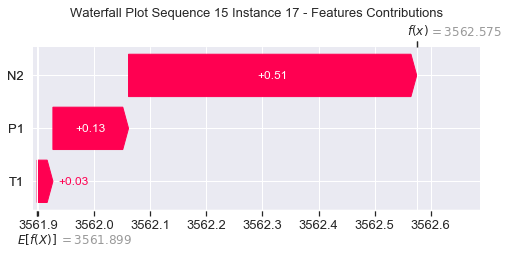

None

Contribution: [0.1590586  0.02414661 0.61099447]


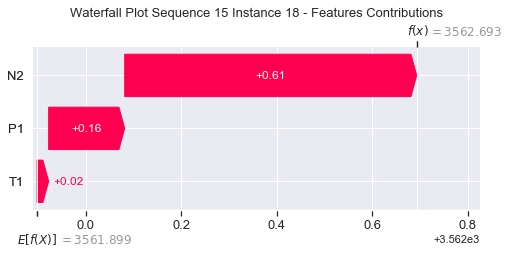

None

Contribution: [0.17908501 0.02688939 0.73406478]


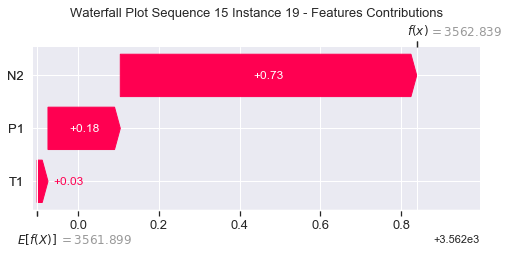

None

Contribution: [0.2326212  0.03378151 0.89852007]


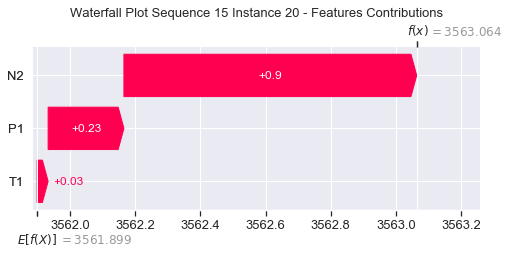

None

Contribution: [ 0.31412657 -0.00949285  1.23505808]


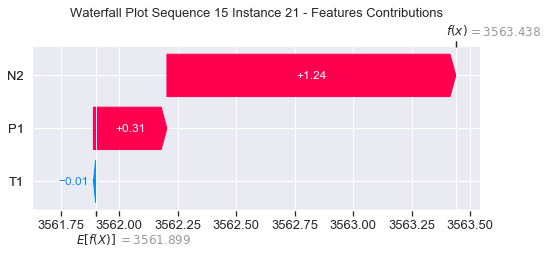

None

Contribution: [ 0.46576112 -0.52454485  2.09940713]


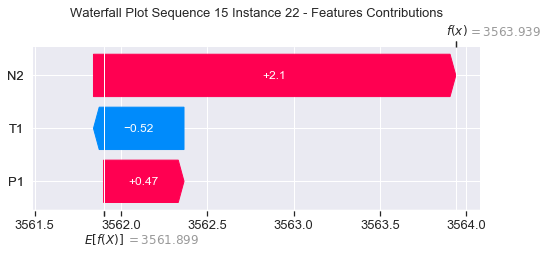

None

Contribution: [ 0.61253543 -3.15121989  4.18024753]


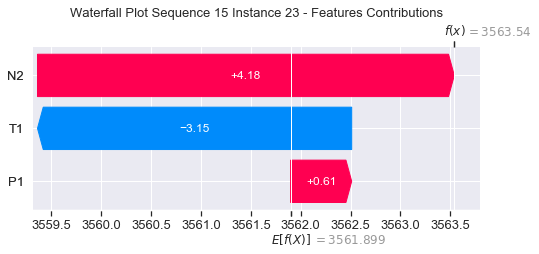

None

Contribution: [ 1.30506782 -8.47282282  6.87664512]


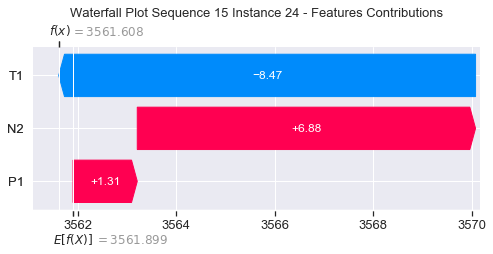

None

Contribution: [ 10.88939235 -24.44471259  34.39257933]


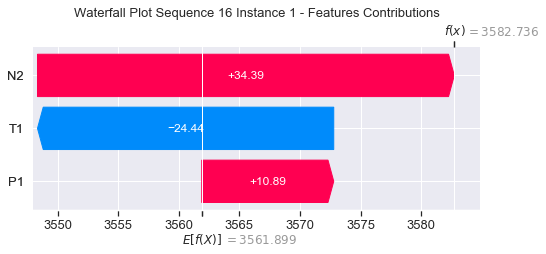

None

Contribution: [ 0.2201436  -1.16840151  1.14371764]


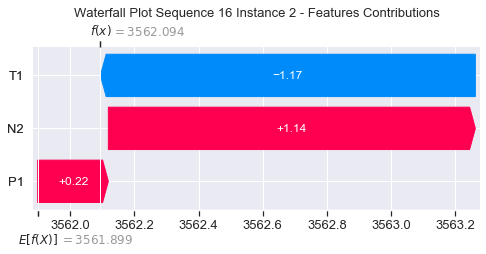

None

Contribution: [ 0.05028858 -0.07319922  0.2776499 ]


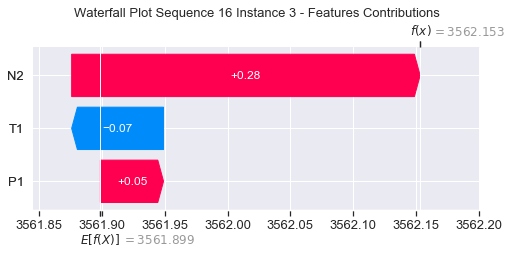

None

Contribution: [0.03033401 0.00146936 0.10712546]


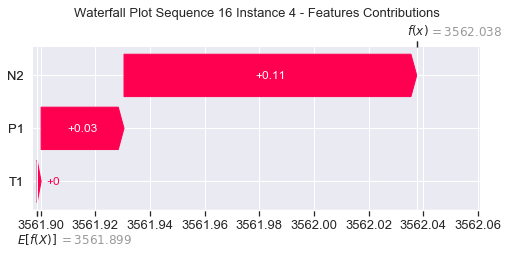

None

Contribution: [0.04553801 0.04668201 0.14365939]


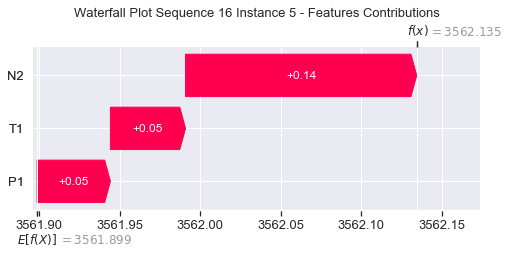

None

Contribution: [0.0415636  0.07384727 0.1293726 ]


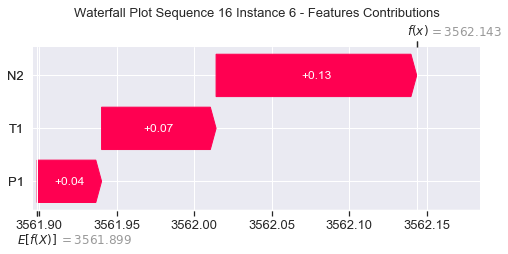

None

Contribution: [0.04112619 0.09950494 0.12980958]


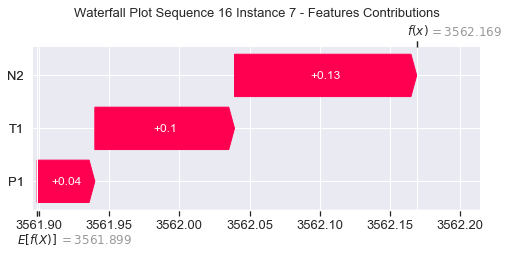

None

Contribution: [0.04613481 0.06883649 0.14700655]


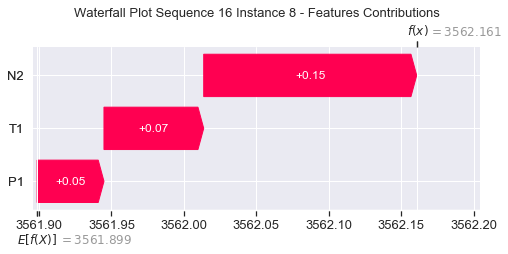

None

Contribution: [0.0476504  0.04764409 0.1647087 ]


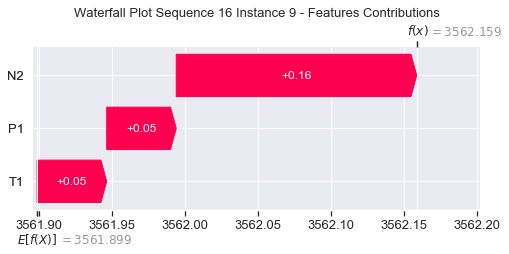

None

Contribution: [0.05155156 0.04673952 0.18411826]


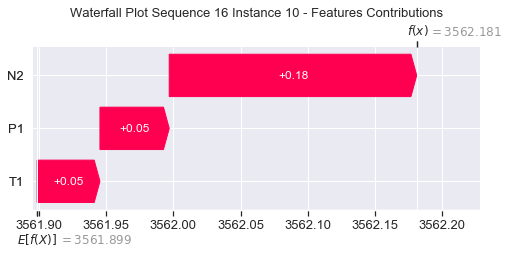

None

Contribution: [0.05789962 0.04608584 0.20689892]


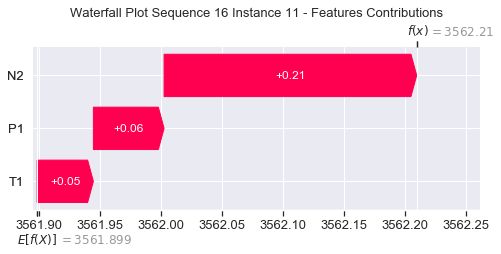

None

Contribution: [0.06416933 0.03916849 0.23494986]


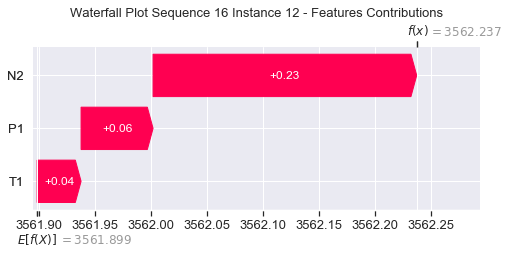

None

Contribution: [0.07373359 0.04080192 0.27068025]


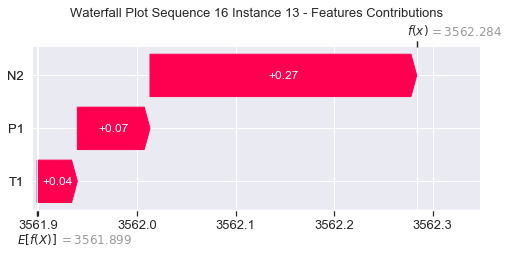

None

Contribution: [0.08093754 0.02528804 0.31289758]


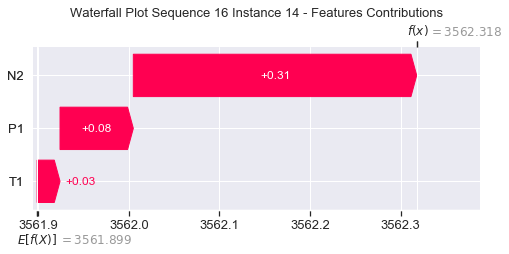

None

Contribution: [0.09613349 0.01508802 0.36815676]


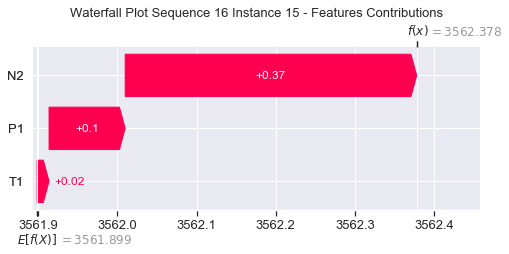

None

Contribution: [9.89551995e-02 1.25247536e-04 4.33110345e-01]


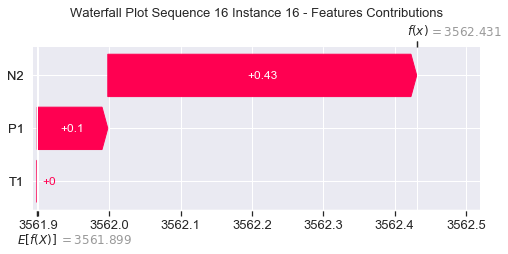

None

Contribution: [0.13368918 0.00992038 0.51620601]


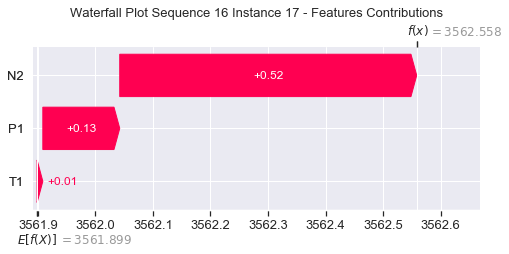

None

Contribution: [0.15778572 0.00339044 0.61352221]


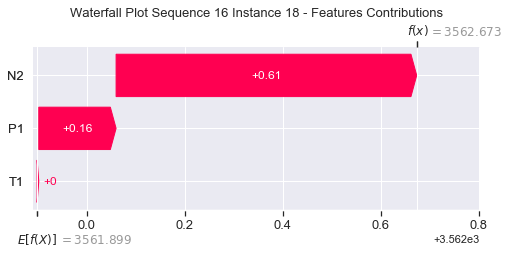

None

Contribution: [ 0.17953539 -0.01959557  0.73628079]


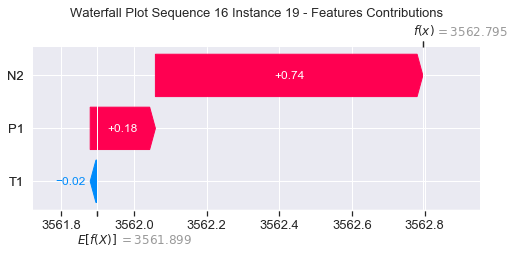

None

Contribution: [ 0.23101149 -0.001471    0.89773051]


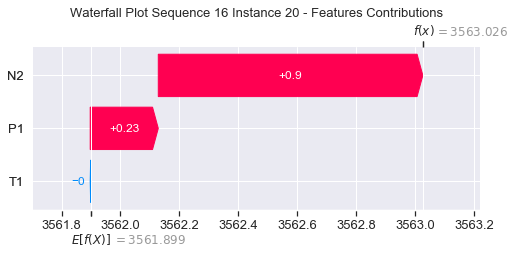

None

Contribution: [ 0.31261173 -0.09651389  1.23206982]


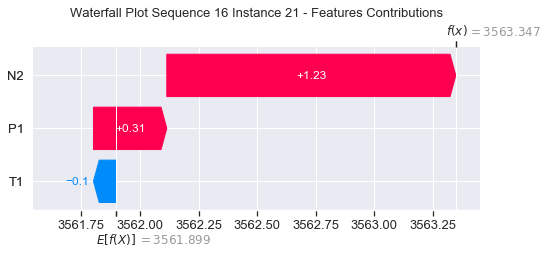

None

Contribution: [ 0.47672675 -0.8359436   2.0858029 ]


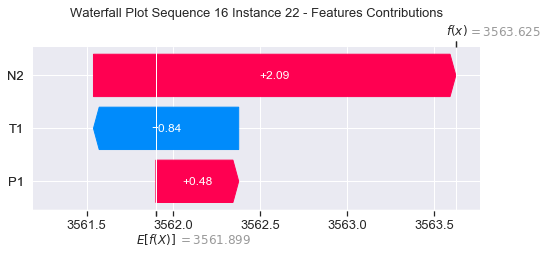

None

Contribution: [ 0.60845413 -4.1399865   4.1079314 ]


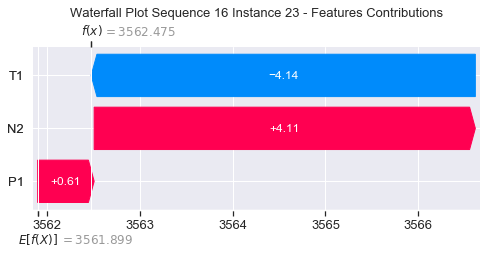

None

Contribution: [  1.31199979 -10.10389457   6.65550694]


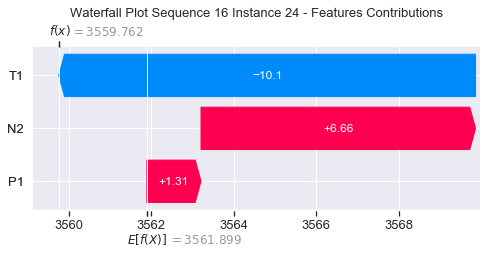

None

Contribution: [ 10.13910288 -26.31995926  33.83246991]


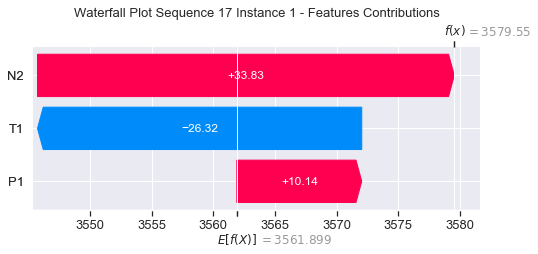

None

Contribution: [ 0.23019324 -1.75003835  1.13468811]


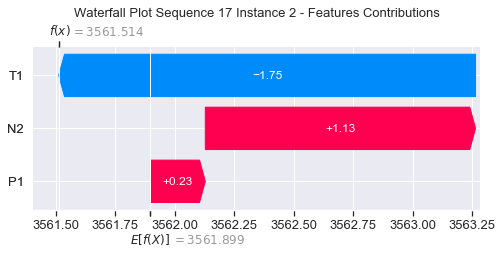

None

Contribution: [ 0.07136095 -0.13595771  0.28023175]


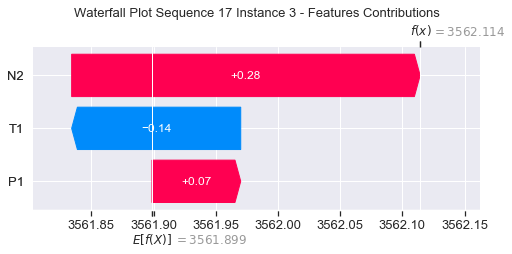

None

Contribution: [ 0.03467169 -0.01887274  0.10905838]


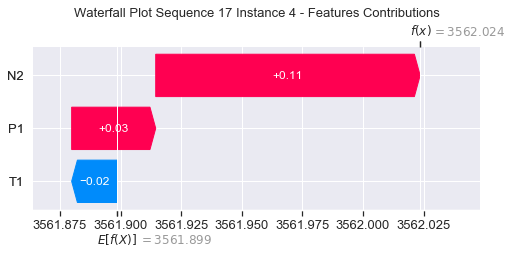

None

Contribution: [0.04525508 0.03704935 0.14272157]


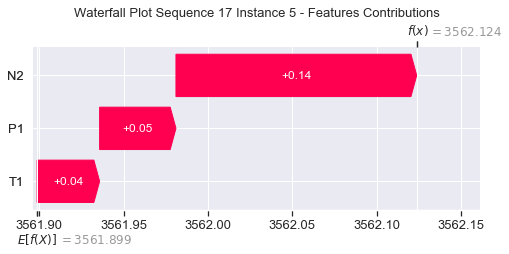

None

Contribution: [0.04062849 0.07260678 0.12885434]


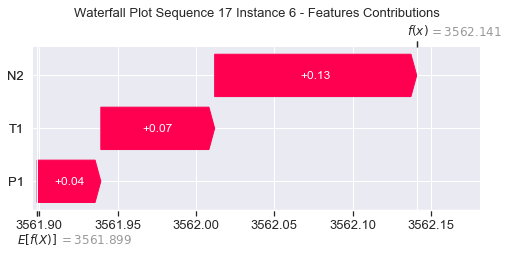

None

Contribution: [0.04096506 0.10814081 0.12981476]


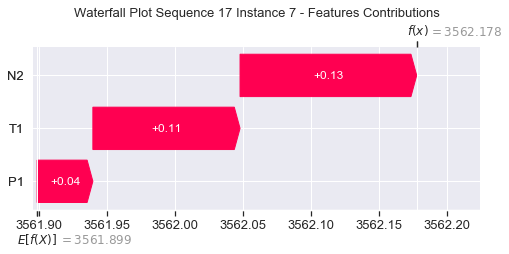

None

Contribution: [0.0451547  0.06901633 0.14619656]


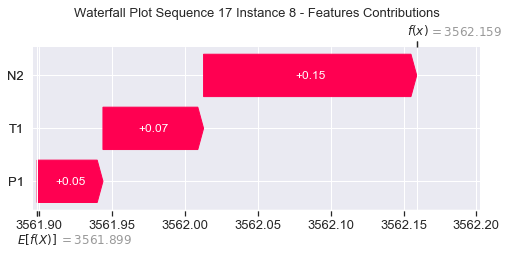

None

Contribution: [0.0473581  0.04353447 0.1630455 ]


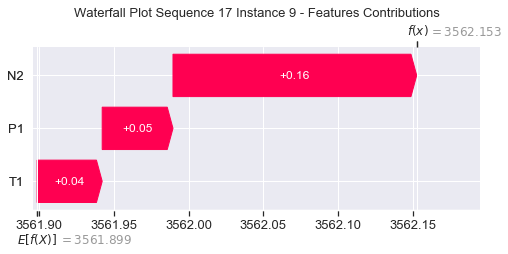

None

Contribution: [0.04950129 0.04097341 0.1848201 ]


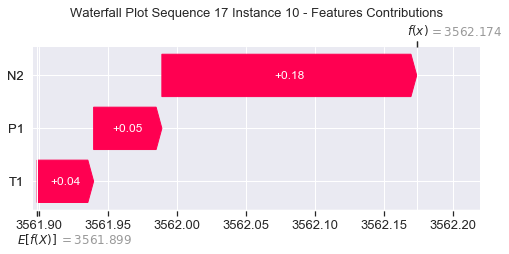

None

Contribution: [0.05574467 0.04436589 0.2055463 ]


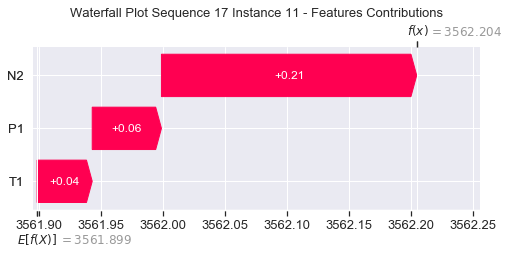

None

Contribution: [0.06449667 0.03207423 0.23418569]


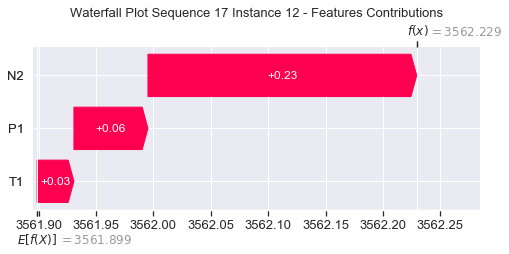

None

Contribution: [0.07452483 0.03099831 0.2701999 ]


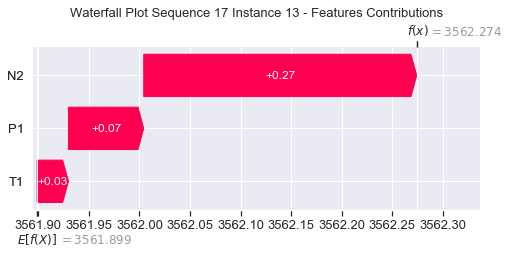

None

Contribution: [0.07624733 0.00998244 0.31204648]


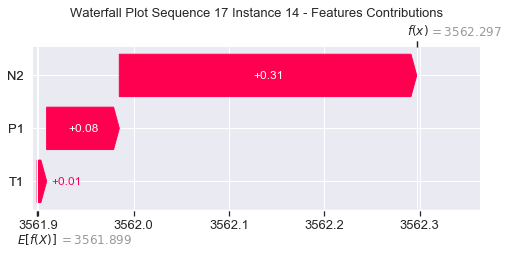

None

Contribution: [0.09661384 0.00189466 0.367792  ]


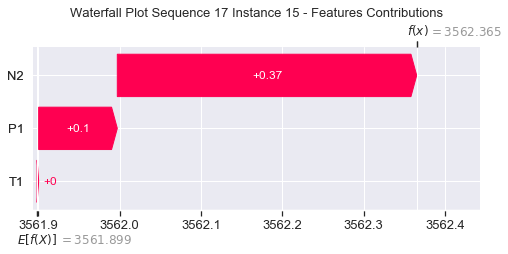

None

Contribution: [0.11734006 0.00212881 0.44164557]


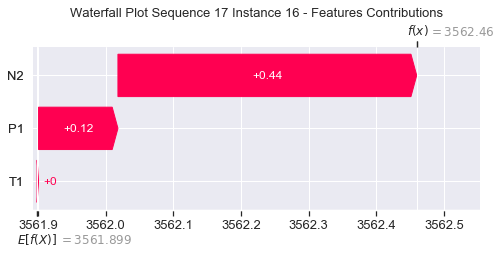

None

Contribution: [ 0.1345042  -0.01291027  0.51731287]


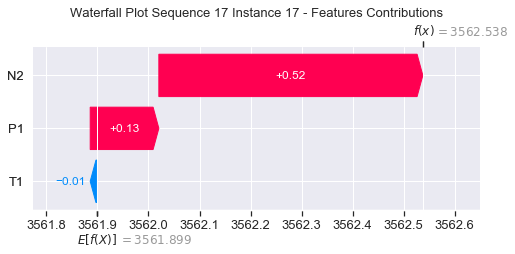

None

Contribution: [ 0.15768078 -0.02119615  0.615487  ]


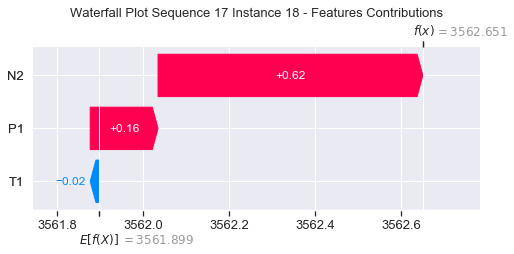

None

Contribution: [ 0.18021263 -0.0119511   0.7430867 ]


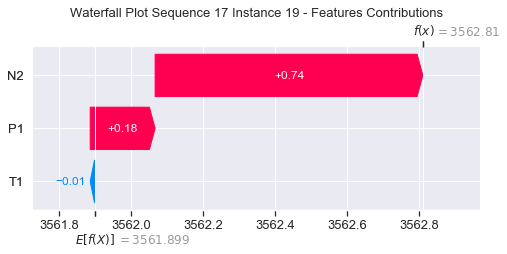

None

Contribution: [ 0.23292785 -0.05389886  0.90509099]


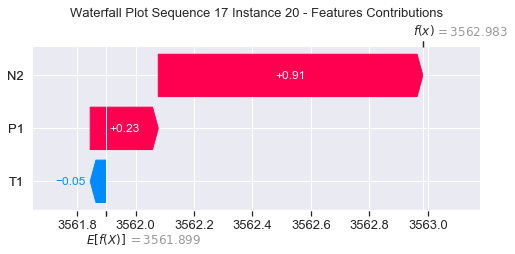

None

Contribution: [ 0.31862571 -0.20011402  1.24494309]


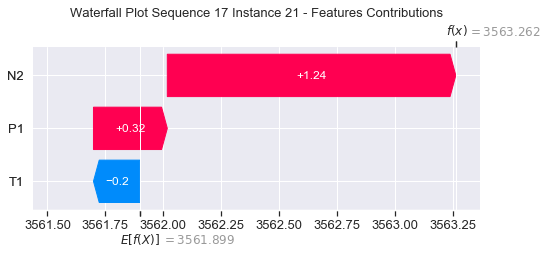

None

Contribution: [ 0.49521407 -1.05320877  2.12120858]


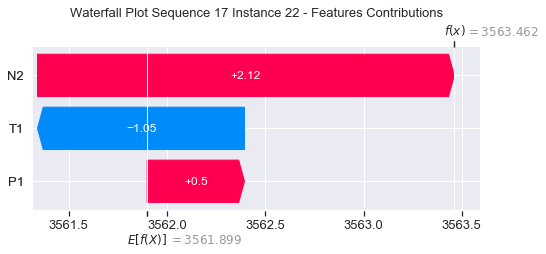

None

Contribution: [ 0.62850111 -4.60295182  4.20792069]


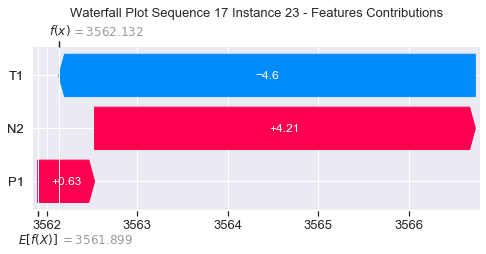

None

Contribution: [  1.49155637 -11.45319696   6.89917817]


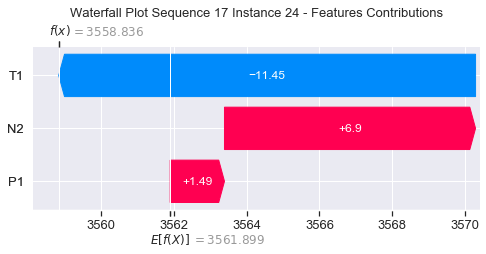

None

Contribution: [ 14.51054112 -36.30572829  34.32242735]


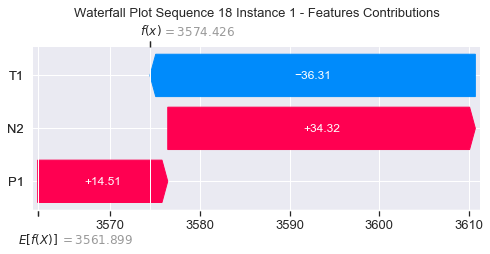

None

Contribution: [ 0.30674587 -1.96972057  1.19630775]


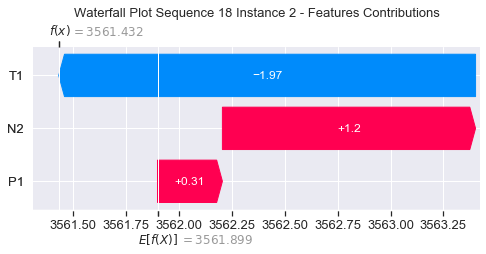

None

Contribution: [ 0.07408204 -0.14259837  0.28282468]


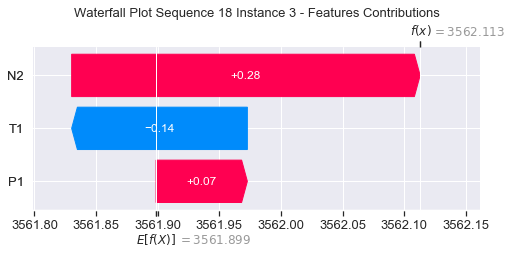

None

Contribution: [ 0.02777107 -0.02744806  0.10530181]


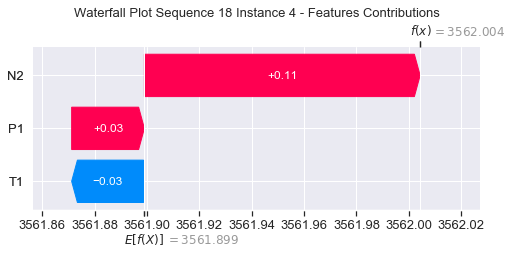

None

Contribution: [0.04539243 0.03851688 0.14228425]


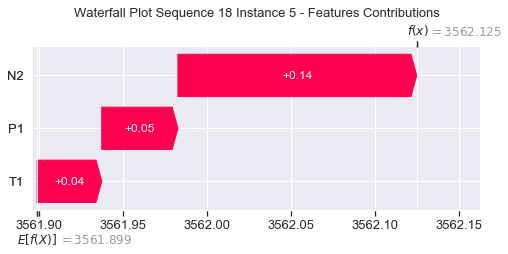

None

Contribution: [0.04220834 0.07126508 0.12822295]


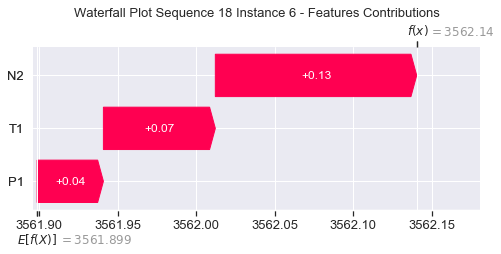

None

Contribution: [0.04074242 0.10195328 0.12757044]


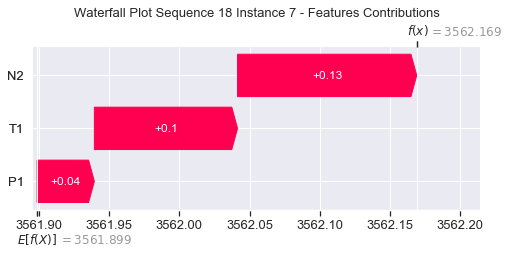

None

Contribution: [0.04740563 0.06865882 0.14561707]


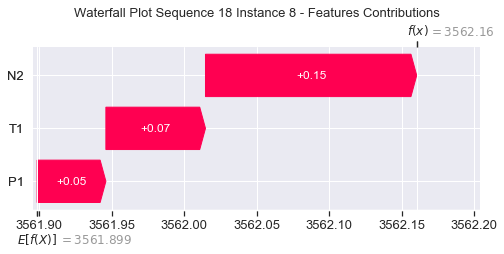

None

Contribution: [0.05015081 0.04764835 0.1641537 ]


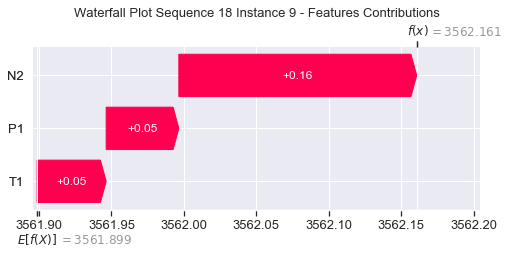

None

Contribution: [0.05862237 0.04433434 0.18242338]


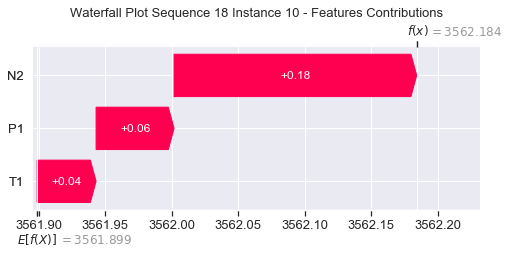

None

Contribution: [0.05971095 0.05069799 0.20668224]


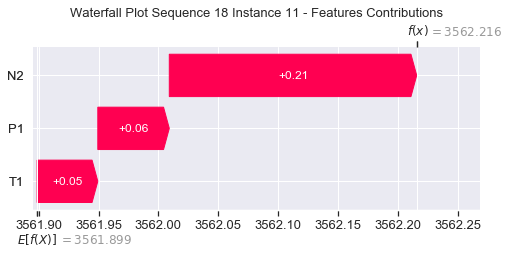

None

Contribution: [0.07649458 0.0393182  0.23610613]


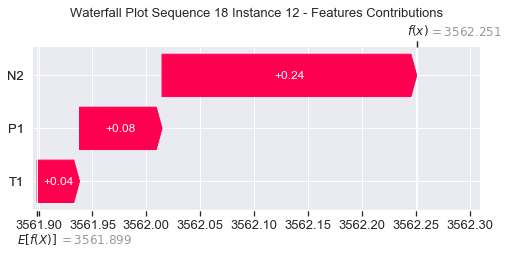

None

Contribution: [0.08665953 0.04039939 0.27189305]


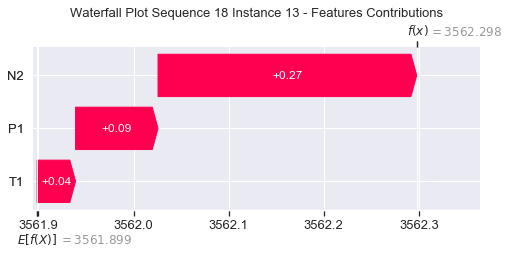

None

Contribution: [0.08730337 0.03431583 0.31324477]


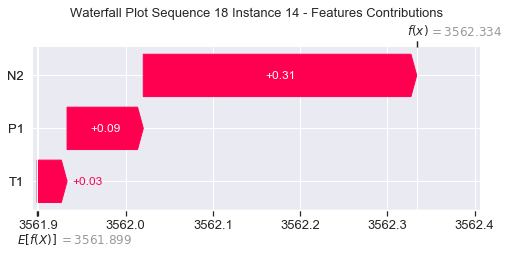

None

Contribution: [0.10865992 0.01673424 0.36959556]


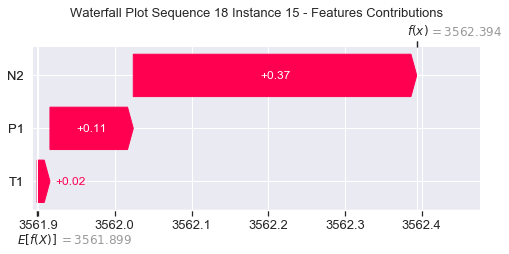

None

Contribution: [0.1086264  0.02552002 0.43400278]


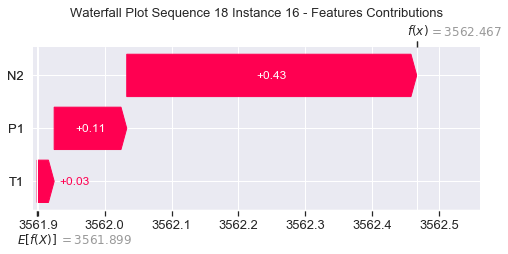

None

Contribution: [0.15141761 0.01056282 0.51934469]


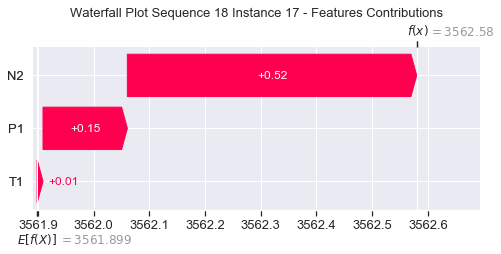

None

Contribution: [0.17560393 0.00475393 0.61736641]


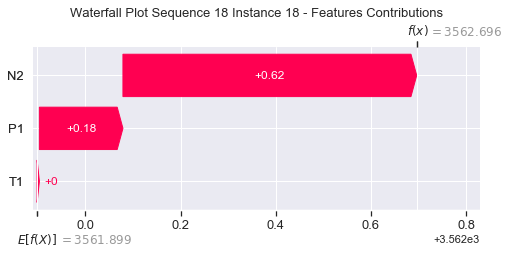

None

Contribution: [ 0.19245689 -0.01019679  0.74211543]


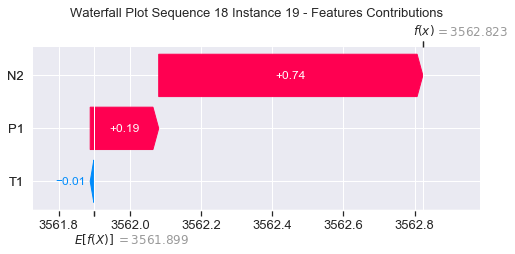

None

Contribution: [ 0.24941372 -0.02064468  0.90407233]


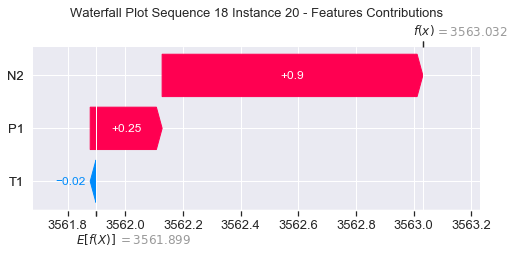

None

Contribution: [ 0.34901895 -0.12951188  1.24428536]


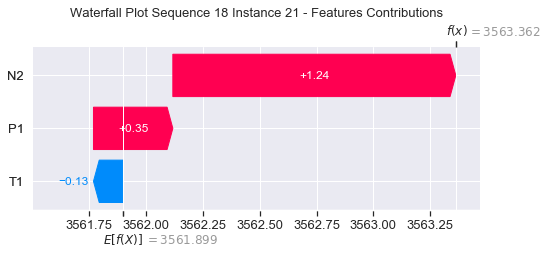

None

Contribution: [ 0.5508072  -0.88740618  2.11582458]


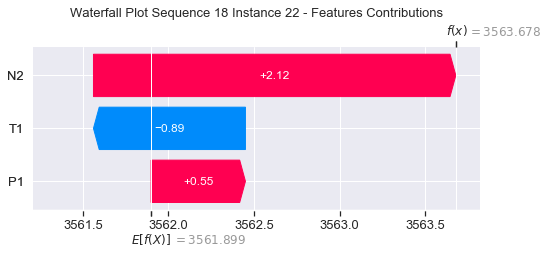

None

Contribution: [ 0.85156344 -4.04341379  4.222892  ]


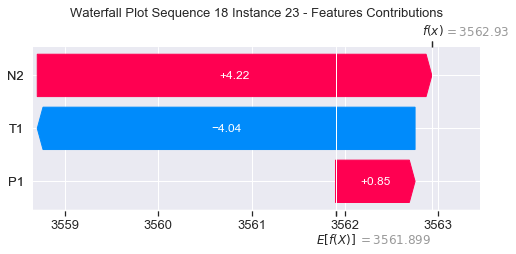

None

Contribution: [  1.67106247 -10.58468551   6.84253129]


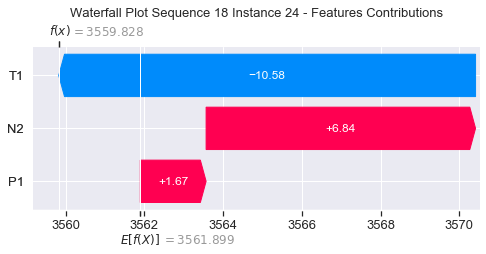

None

Contribution: [ 16.18729457 -30.46578977  34.1841351 ]


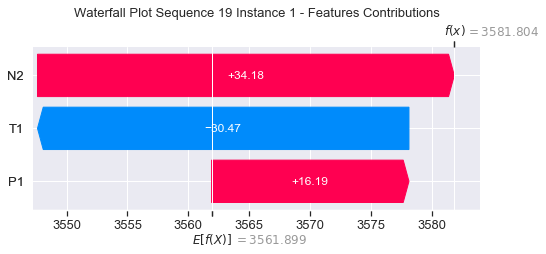

None

Contribution: [ 0.39365676 -1.69240956  1.17570094]


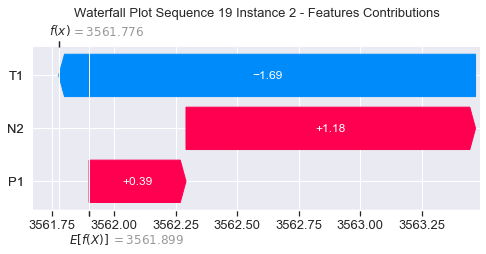

None

Contribution: [ 0.05582891 -0.12867682  0.27473402]


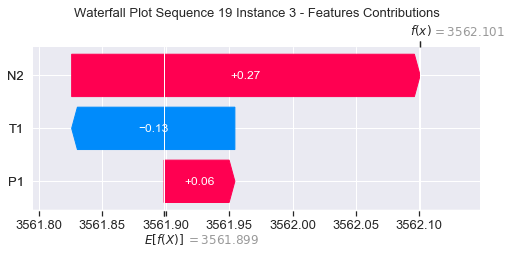

None

Contribution: [ 0.03241912 -0.01904749  0.10834589]


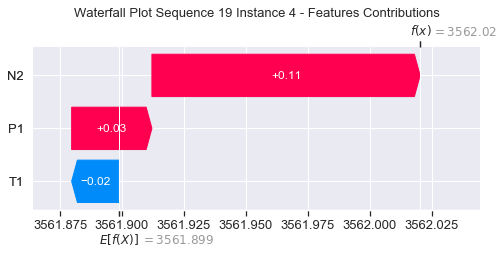

None

Contribution: [0.04724031 0.04161792 0.14387063]


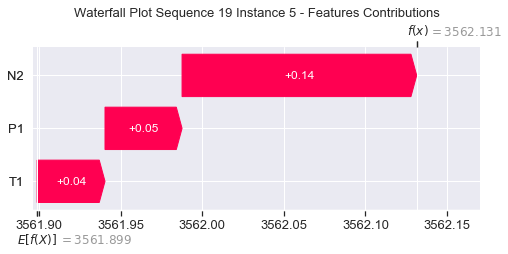

None

Contribution: [0.0416987  0.07466508 0.12886189]


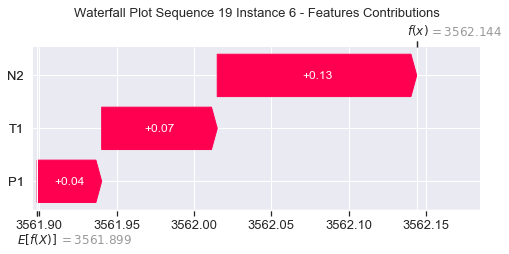

None

Contribution: [0.04095746 0.10558794 0.12930856]


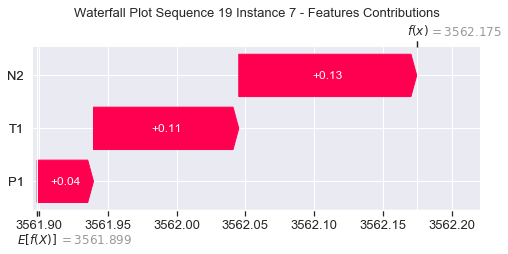

None

Contribution: [0.04701243 0.07036105 0.14634944]


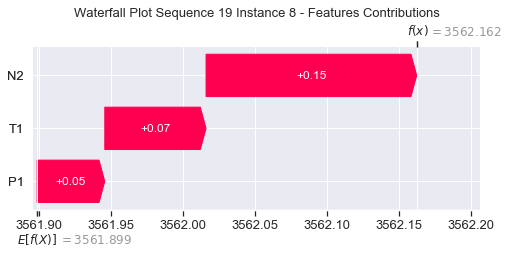

None

Contribution: [0.05071885 0.04681774 0.16560153]


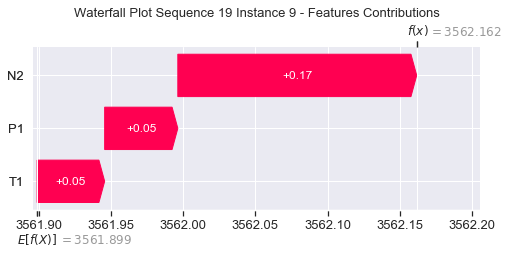

None

Contribution: [0.05638744 0.04396962 0.18380203]


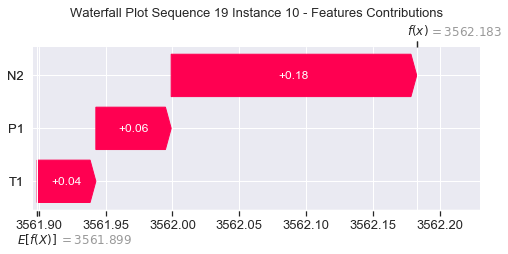

None

Contribution: [0.05708188 0.04731205 0.20645708]


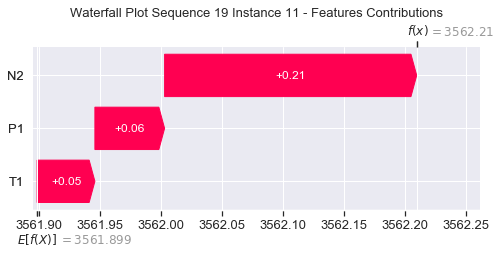

None

Contribution: [0.06883758 0.03633596 0.23334551]


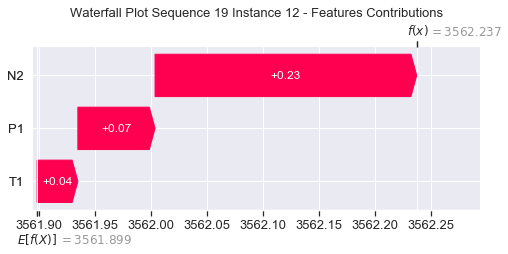

None

Contribution: [0.08017083 0.03639772 0.26927108]


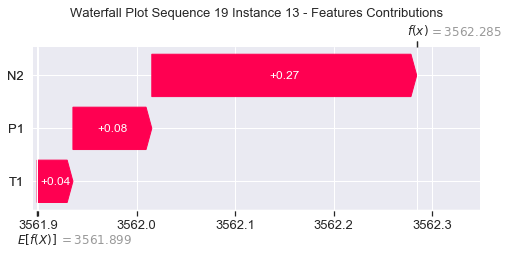

None

Contribution: [0.09341933 0.0221743  0.31672063]


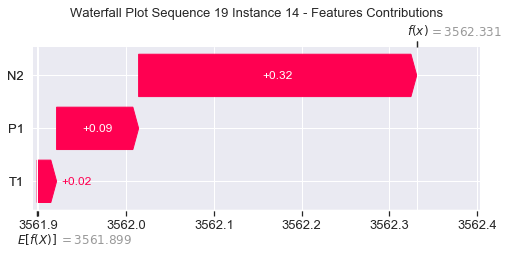

None

Contribution: [0.10449327 0.00885996 0.36618169]


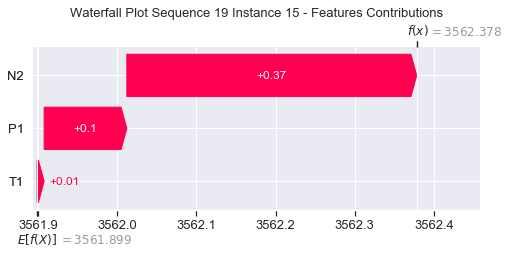

None

Contribution: [0.11295597 0.01561312 0.43601986]


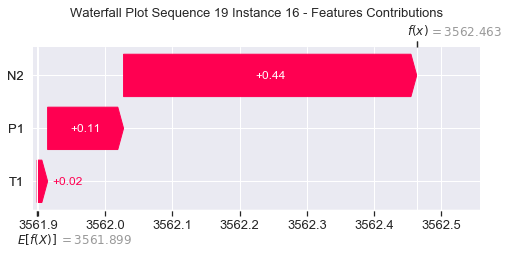

None

Contribution: [0.14755775 0.00113628 0.51440087]


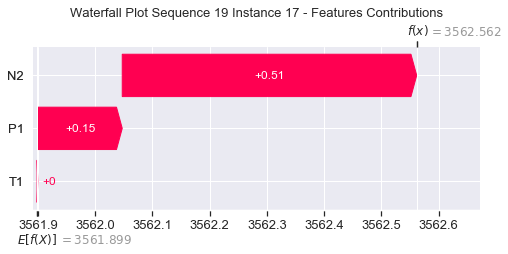

None

Contribution: [ 0.17262608 -0.00594081  0.61097208]


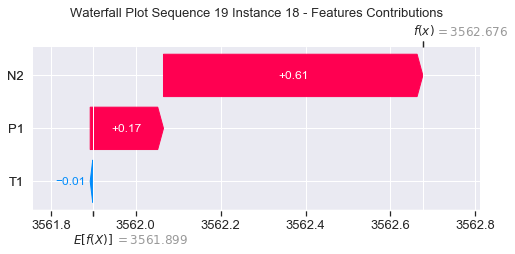

None

Contribution: [ 0.1782852  -0.01501417  0.73166565]


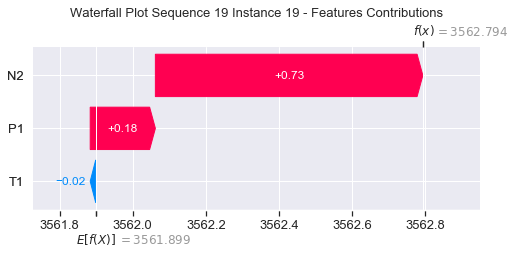

None

Contribution: [ 0.26055957 -0.01772948  0.89608901]


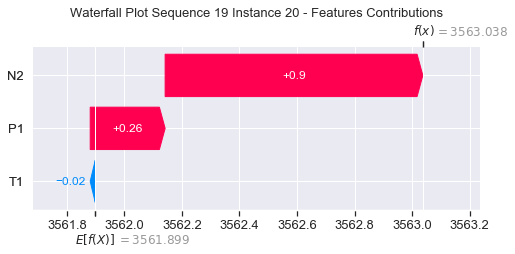

None

Contribution: [ 0.36976471 -0.12887644  1.22880249]


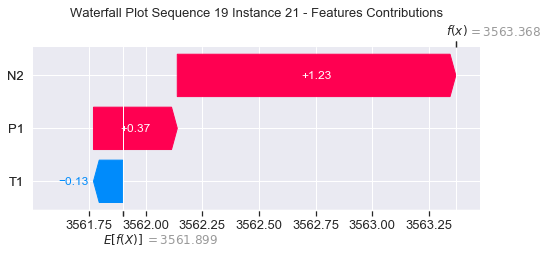

None

Contribution: [ 0.61992631 -0.91990384  2.07644335]


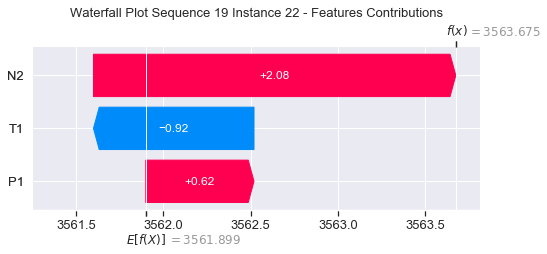

None

Contribution: [ 0.97932701 -4.34532802  4.04335282]


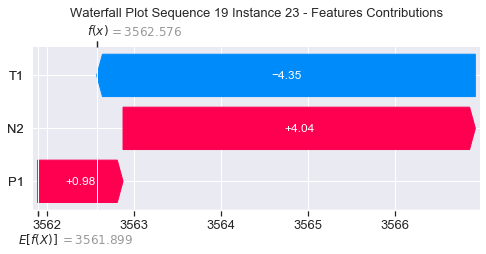

None

Contribution: [  1.69048003 -11.29643198   6.31072493]


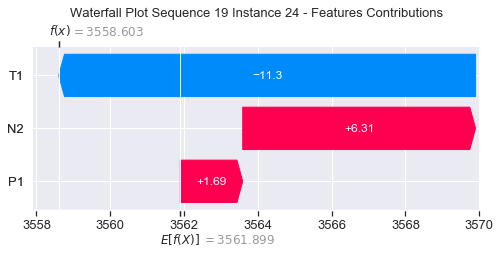

None

Contribution: [  6.39724266 -37.91017383  28.30290491]


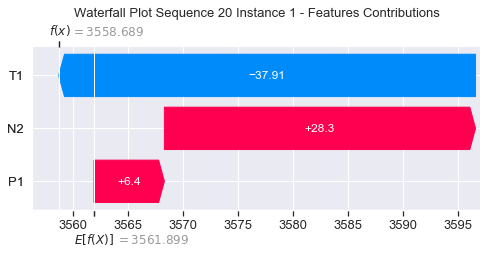

None

Contribution: [ 0.45502833 -1.87951656  1.14056292]


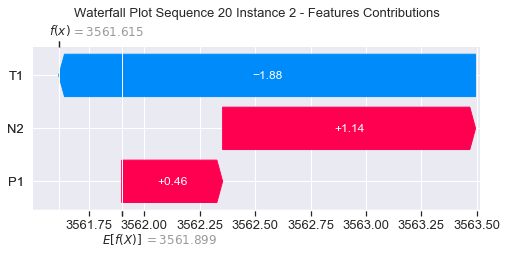

None

Contribution: [ 0.07705421 -0.1387161   0.27356841]


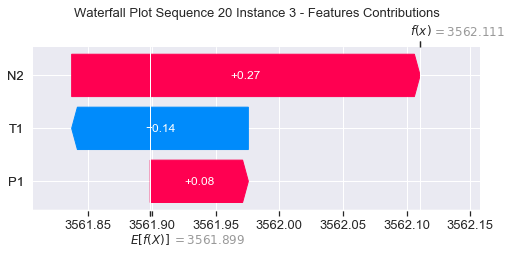

None

Contribution: [ 0.02799199 -0.02042108  0.10113889]


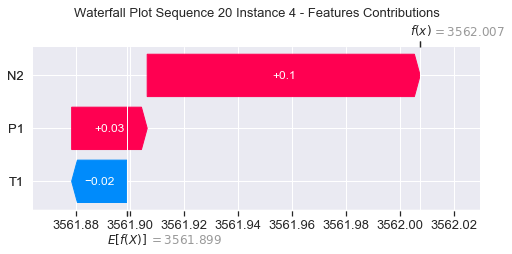

None

Contribution: [0.04912344 0.03553688 0.14093057]


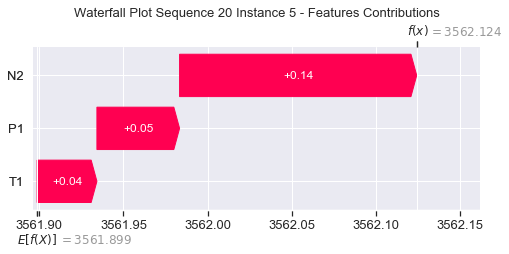

None

Contribution: [0.04153669 0.0641314  0.12673728]


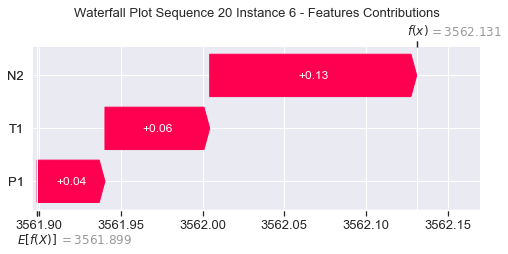

None

Contribution: [0.04060143 0.09309837 0.12724237]


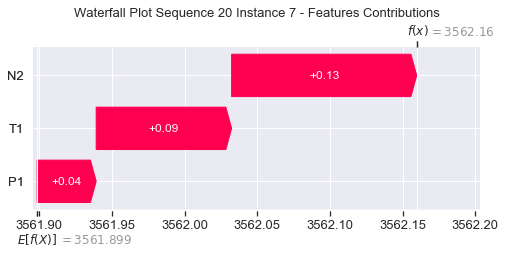

None

Contribution: [0.04671877 0.06264976 0.14410849]


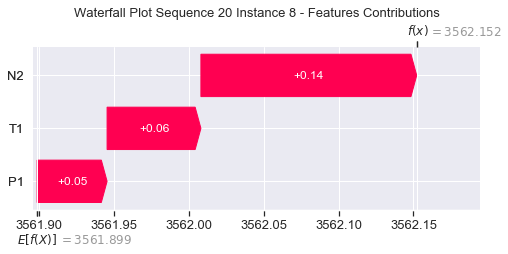

None

Contribution: [0.0472844  0.04215489 0.16250805]


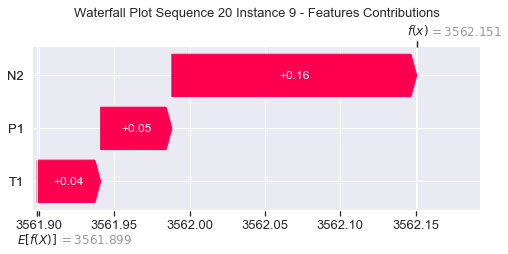

None

Contribution: [0.05848377 0.03651051 0.17893421]


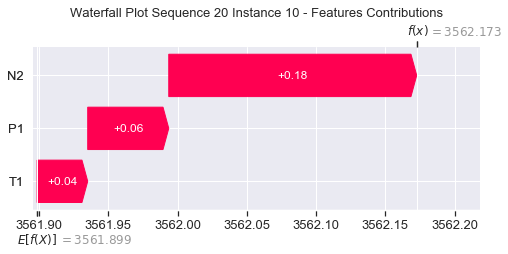

None

Contribution: [0.05375954 0.04587188 0.20153873]


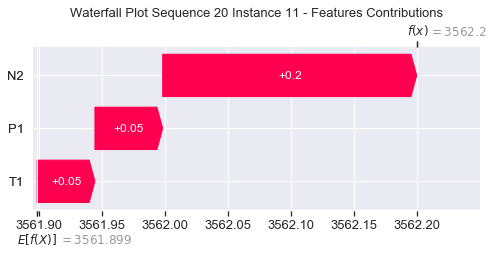

None

Contribution: [0.07053108 0.039188   0.23138416]


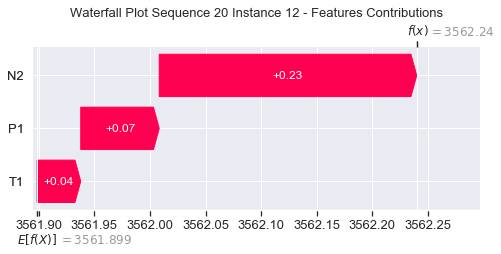

None

Contribution: [0.08202458 0.04175009 0.26765697]


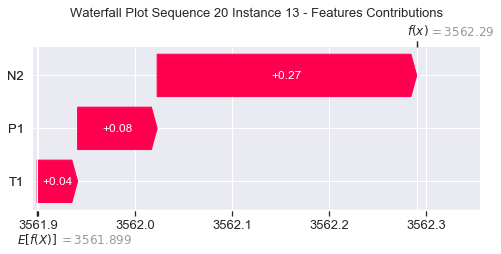

None

Contribution: [0.09045304 0.03289885 0.31133894]


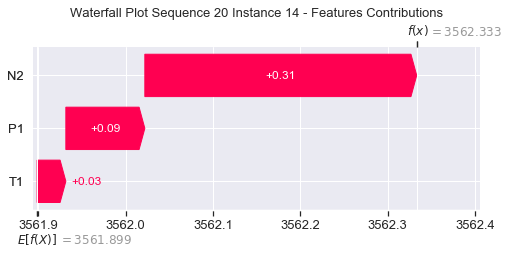

None

Contribution: [0.10479678 0.02022199 0.36440261]


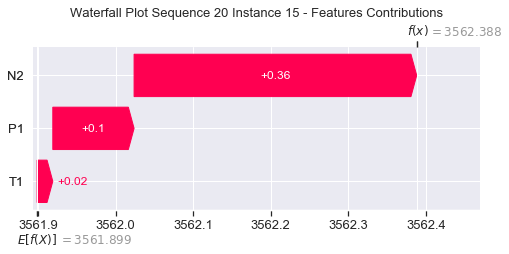

None

Contribution: [0.11409775 0.01000036 0.43499303]


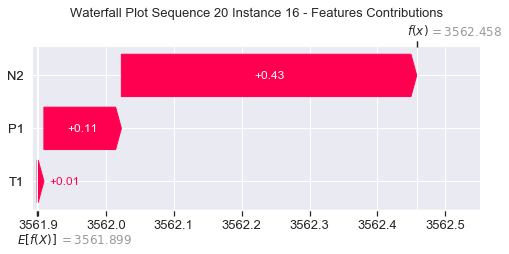

None

Contribution: [0.14679353 0.01306452 0.51267608]


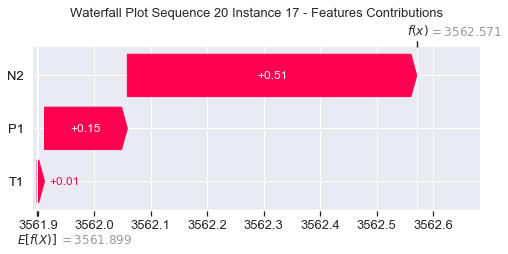

None

Contribution: [0.1714222  0.00421079 0.60868259]


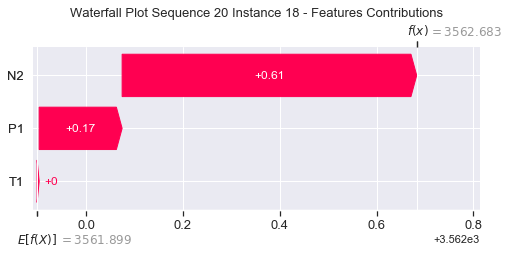

None

Contribution: [ 0.19383153 -0.00986805  0.73458292]


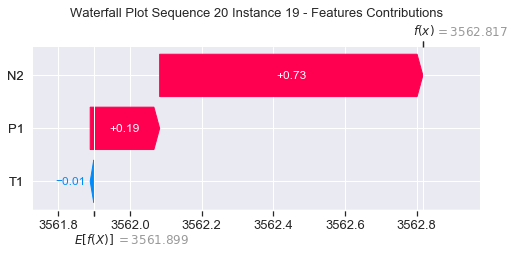

None

Contribution: [ 0.25949625 -0.02938416  0.89551469]


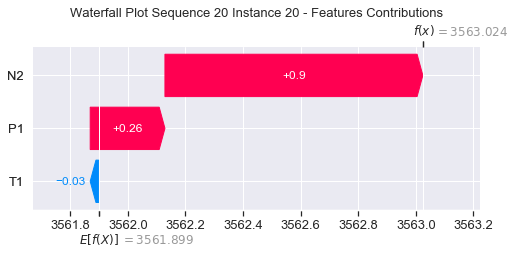

None

Contribution: [ 0.37153425 -0.14233925  1.22640336]


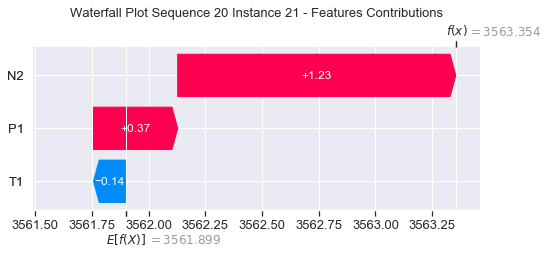

None

Contribution: [ 0.63414899 -0.8524144   2.06754724]


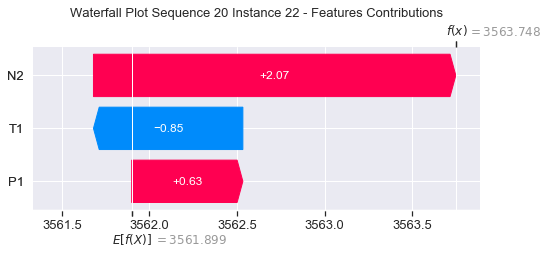

None

Contribution: [ 1.00724627 -4.01439017  4.04868478]


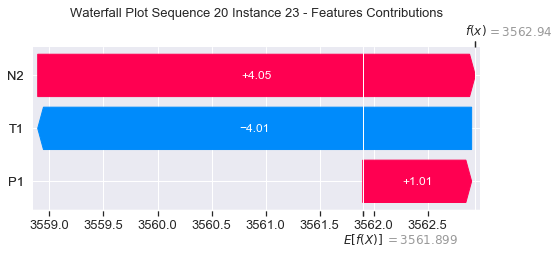

None

Contribution: [  2.05700319 -10.36387293   6.41575768]


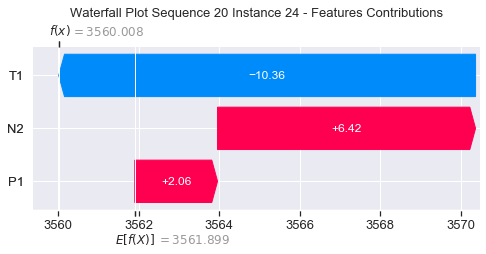

None

Contribution: [ 13.22513966 -31.19472034  29.92281379]


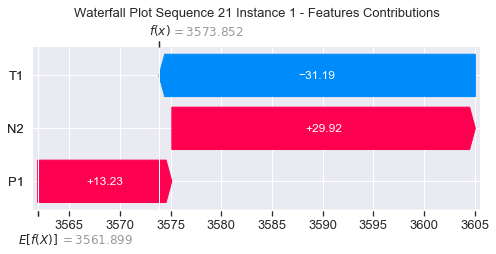

None

Contribution: [ 0.52468018 -1.51488088  1.15421634]


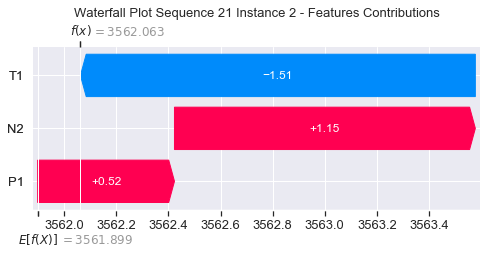

None

Contribution: [ 0.08079321 -0.07345168  0.27380217]


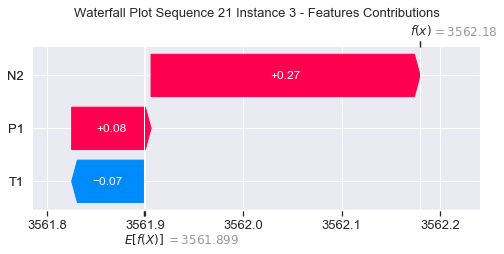

None

Contribution: [ 0.03630541 -0.00211649  0.10480368]


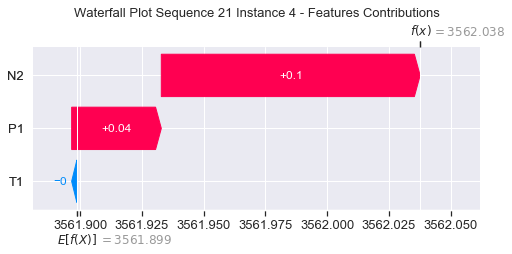

None

Contribution: [0.04812313 0.04215909 0.1421971 ]


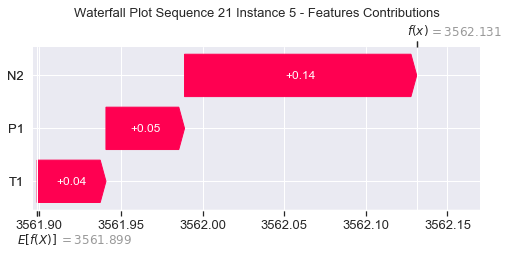

None

Contribution: [0.04380617 0.06982198 0.12868984]


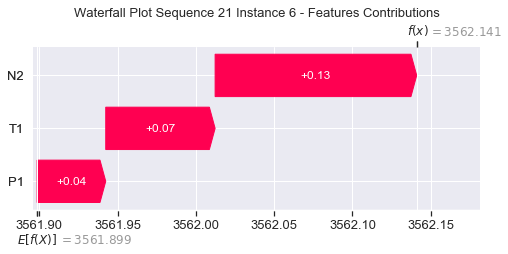

None

Contribution: [0.04103889 0.09652708 0.12908684]


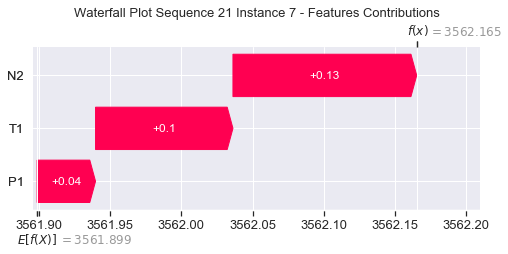

None

Contribution: [0.04939    0.06607044 0.14631232]


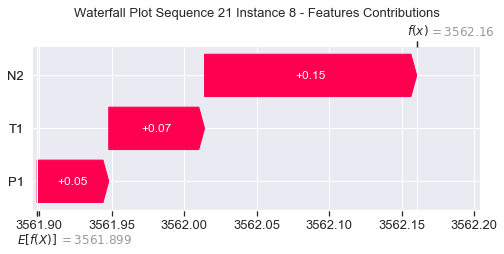

None

Contribution: [0.05386384 0.04554459 0.16424374]


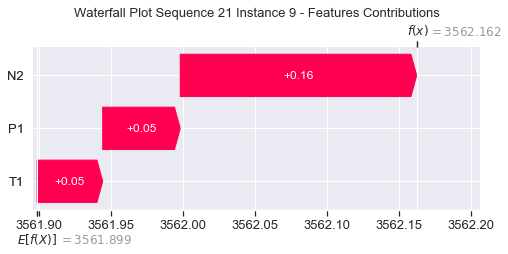

None

Contribution: [0.04627236 0.04513457 0.18120557]


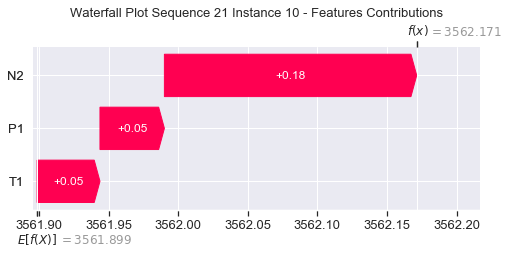

None

Contribution: [0.06639817 0.04676495 0.20738852]


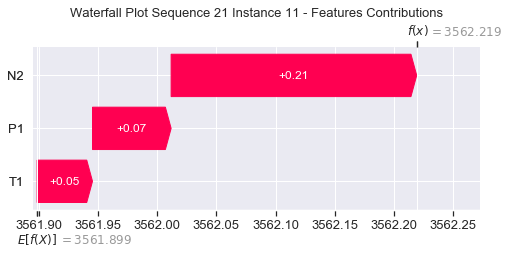

None

Contribution: [0.06972722 0.03679538 0.23421137]


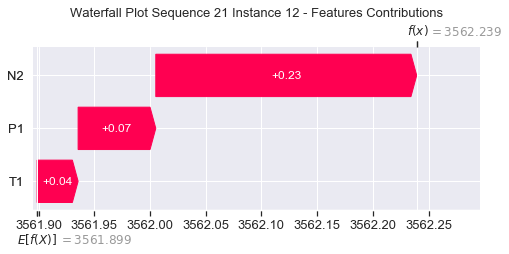

None

Contribution: [0.07985633 0.03708881 0.26992106]


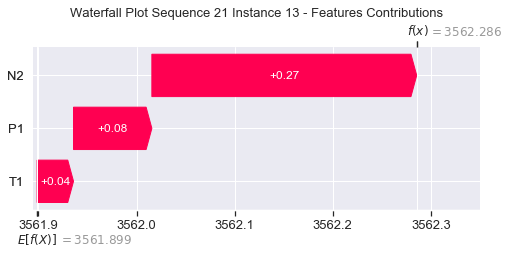

None

Contribution: [0.09860461 0.02116835 0.31623027]


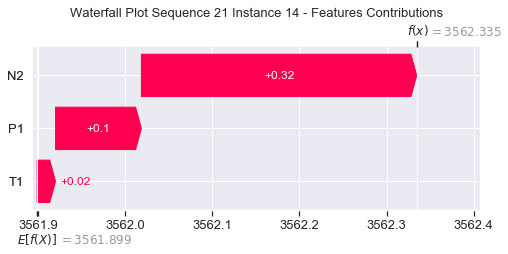

None

Contribution: [0.10657558 0.00997211 0.368839  ]


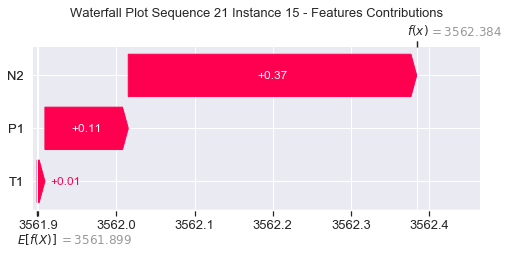

None

Contribution: [0.11829544 0.01173273 0.43974051]


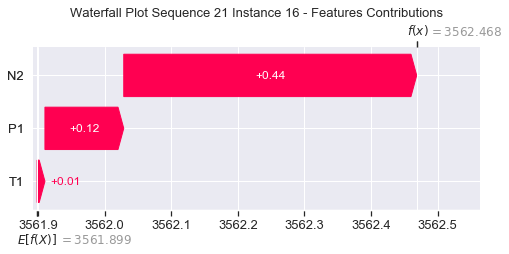

None

Contribution: [ 0.14813529 -0.00274737  0.5188104 ]


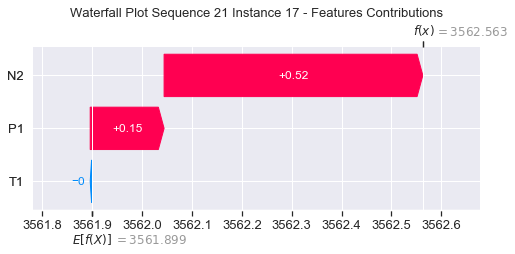

None

Contribution: [ 0.17558544 -0.0120709   0.61775616]


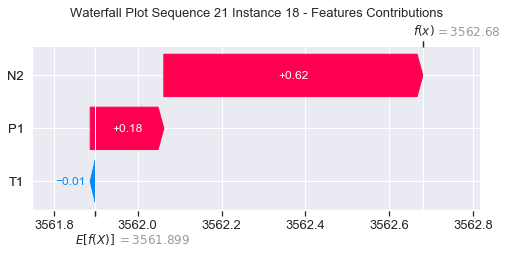

None

Contribution: [ 0.19963046 -0.03674657  0.74533629]


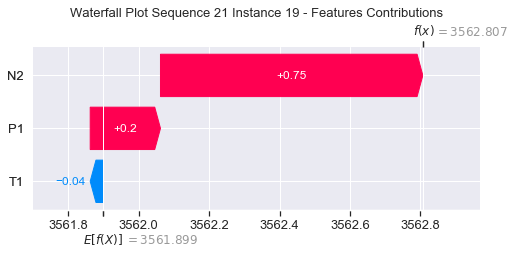

None

Contribution: [ 0.26093306 -0.05300546  0.90772886]


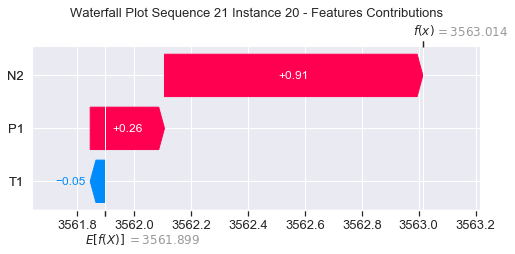

None

Contribution: [ 0.36502822 -0.21653618  1.25008066]


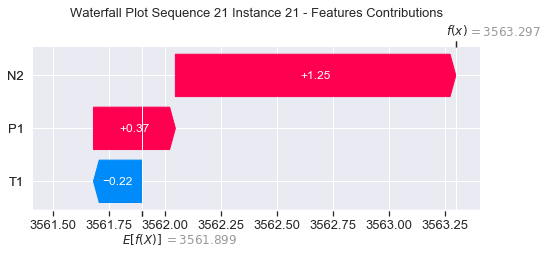

None

Contribution: [ 0.6078898  -1.1607379   2.13571017]


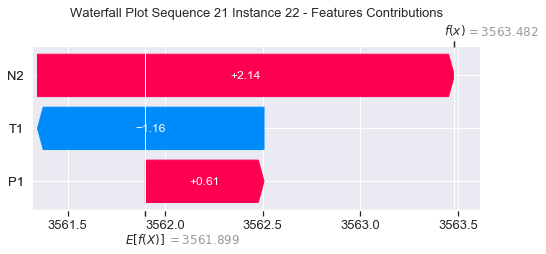

None

Contribution: [ 1.02814465 -4.91778676  4.27841474]


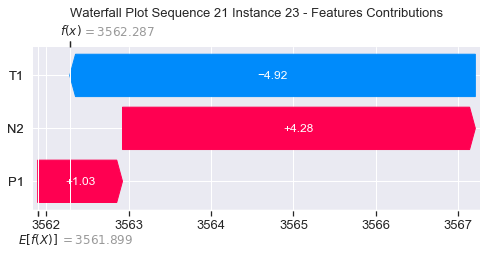

None

Contribution: [  1.67674611 -12.61717244   6.80520706]


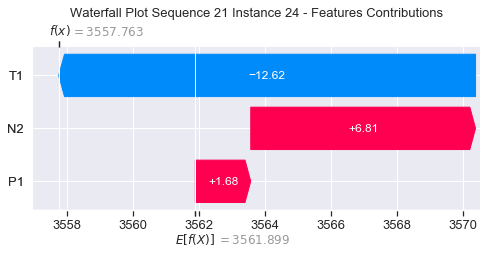

None

Contribution: [  2.19732264 -45.30760763  30.31433988]


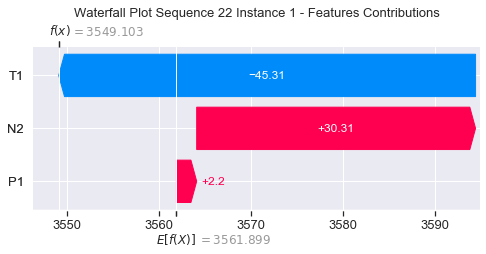

None

Contribution: [ 0.34439797 -2.39555866  1.21874404]


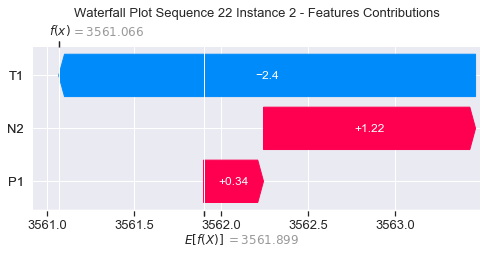

None

Contribution: [ 0.08059499 -0.1858096   0.28547183]


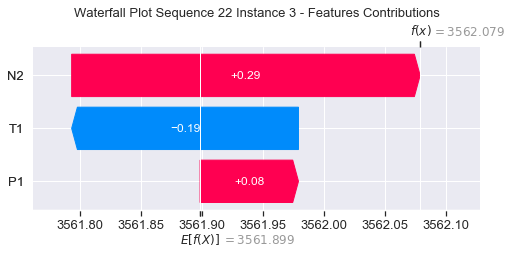

None

Contribution: [ 0.03525194 -0.04399906  0.10341731]


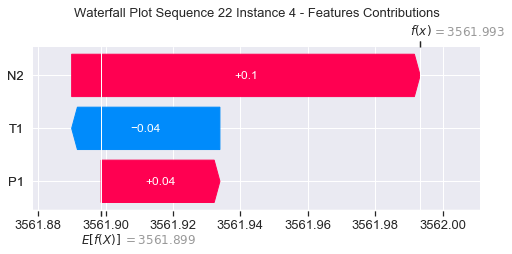

None

Contribution: [0.04690858 0.0169102  0.13794601]


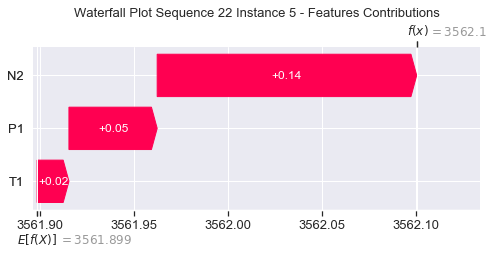

None

Contribution: [0.04174835 0.05827175 0.12510861]


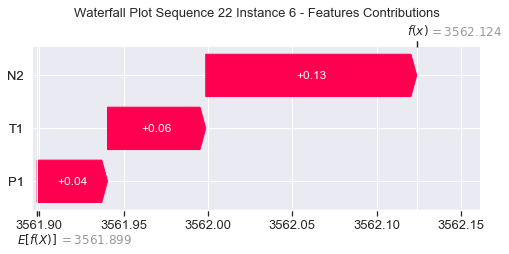

None

Contribution: [0.04045329 0.0984267  0.12636453]


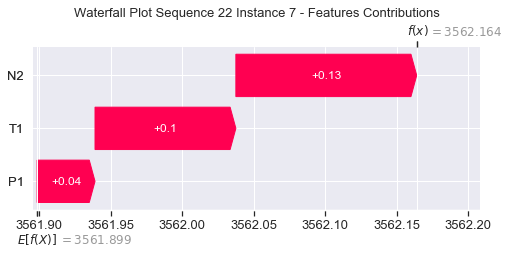

None

Contribution: [0.04679397 0.06095374 0.14192885]


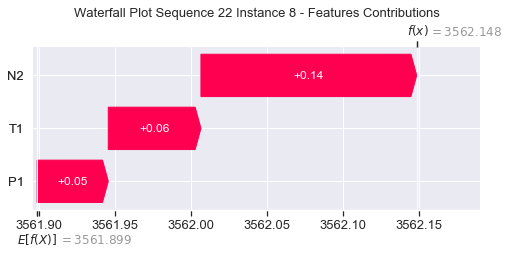

None

Contribution: [0.04852597 0.03659105 0.15777777]


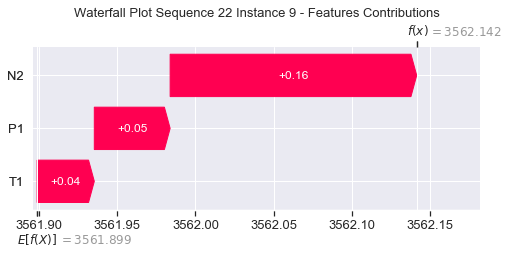

None

Contribution: [0.05569425 0.03544862 0.17770209]


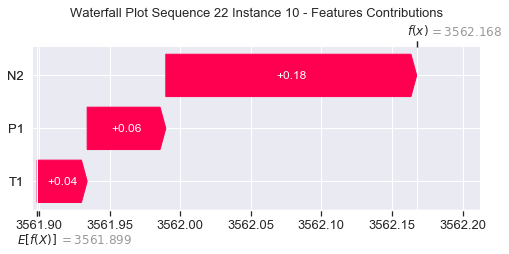

None

Contribution: [0.05377227 0.04287016 0.19870064]


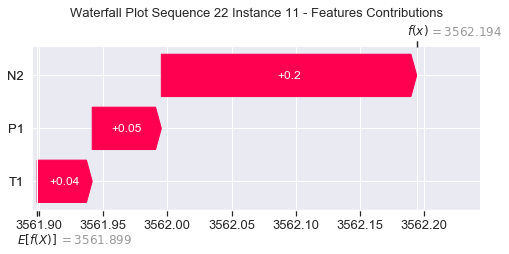

None

Contribution: [0.06843381 0.03319976 0.22938616]


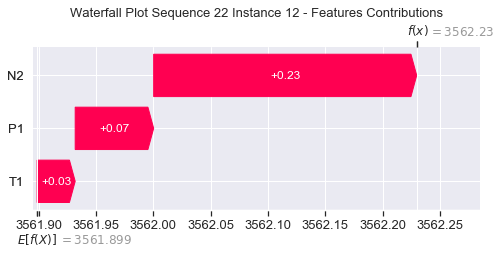

None

Contribution: [0.08016643 0.03445658 0.26530137]


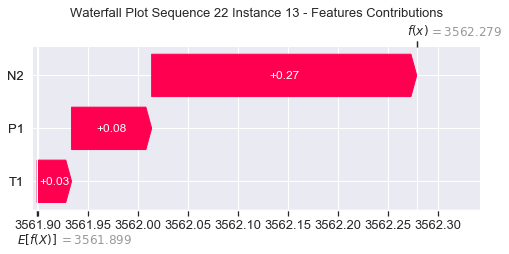

None

Contribution: [0.0884266  0.02403542 0.30971111]


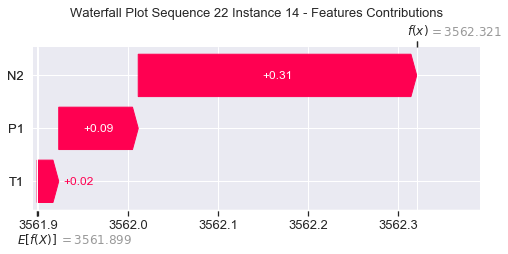

None

Contribution: [0.10452715 0.01219458 0.36206565]


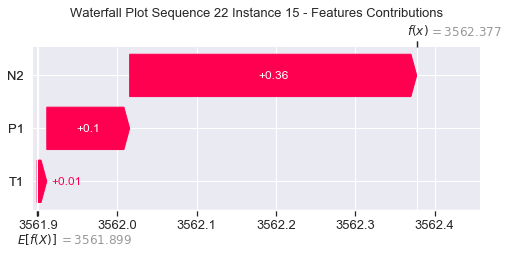

None

Contribution: [0.11964652 0.01096832 0.43461906]


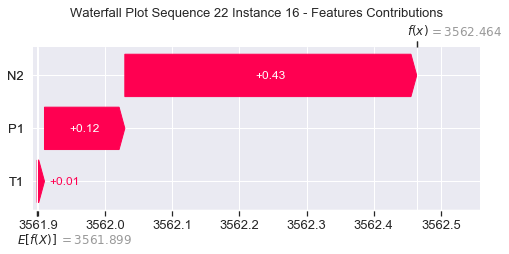

None

Contribution: [0.14890316 0.00765212 0.51021429]


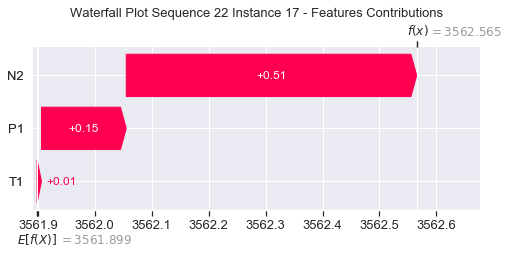

None

Contribution: [0.17476403 0.00414144 0.60756485]


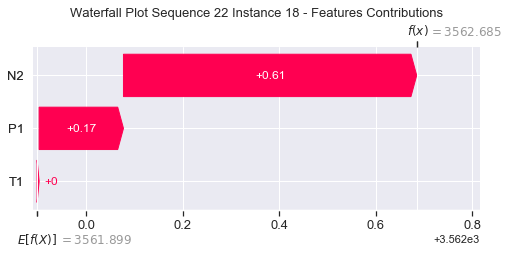

None

Contribution: [ 0.17806377 -0.01798439  0.73003849]


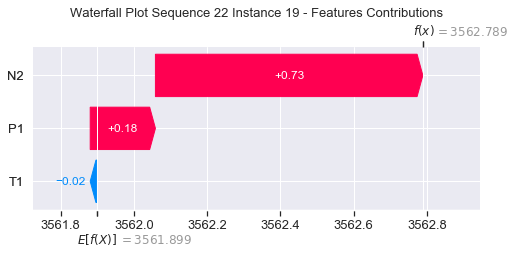

None

Contribution: [ 0.26714122 -0.03493341  0.89461293]


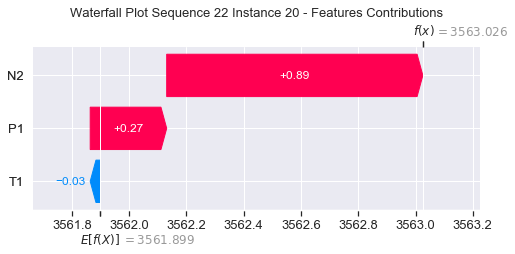

None

Contribution: [ 0.37850116 -0.14979674  1.22787057]


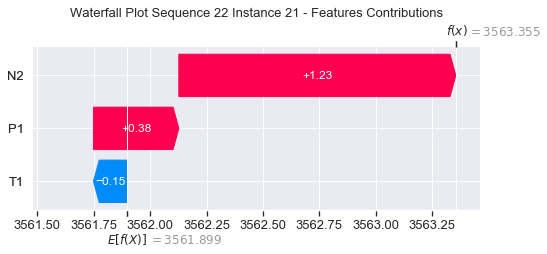

None

Contribution: [ 0.63095003 -0.82497465  2.08822168]


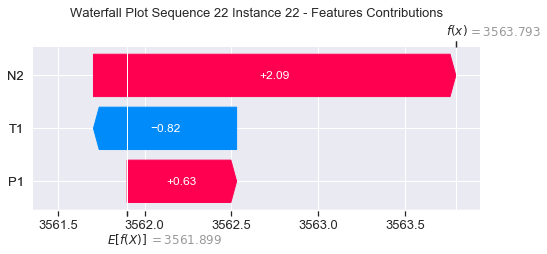

None

Contribution: [ 1.04048907 -3.4803015   4.15115631]


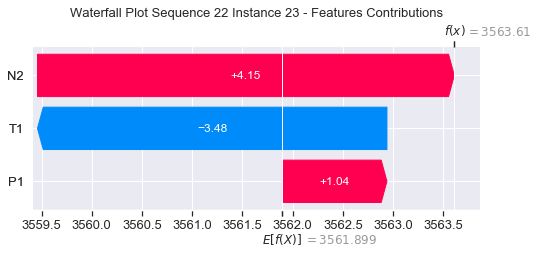

None

Contribution: [ 1.84890297 -9.60552651  6.81302645]


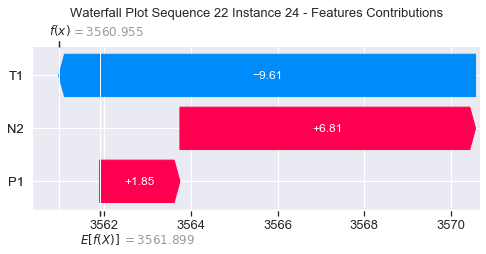

None

Contribution: [  6.64586174 -33.08692835  33.15756712]


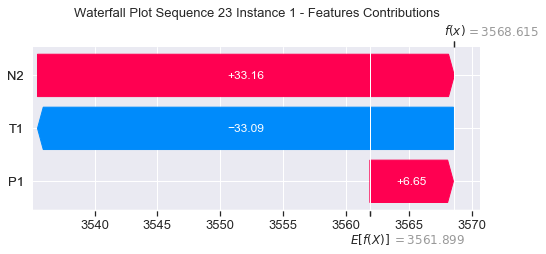

None

Contribution: [ 0.44737423 -1.38286785  1.21757958]


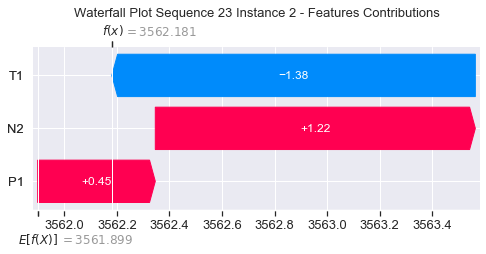

None

Contribution: [ 0.05944377 -0.1773283   0.27841462]


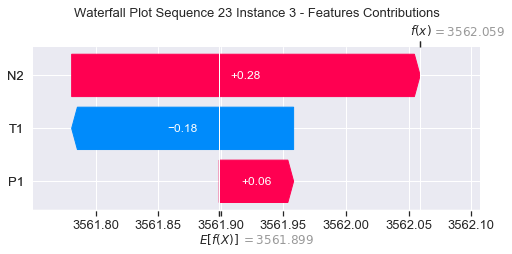

None

Contribution: [ 0.02419094 -0.03180731  0.10329052]


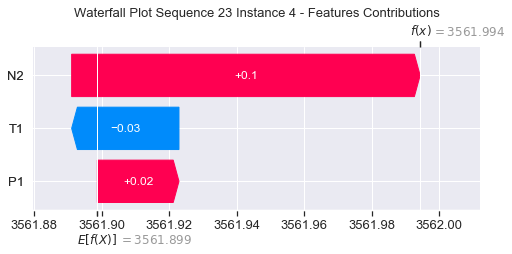

None

Contribution: [0.04739617 0.03343065 0.14183098]


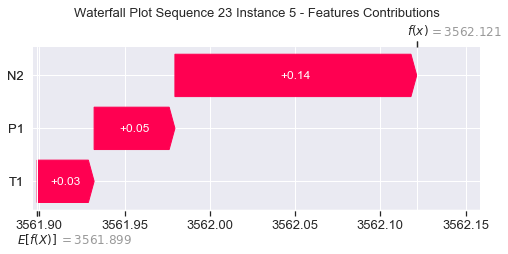

None

Contribution: [0.0430807  0.06851818 0.12784062]


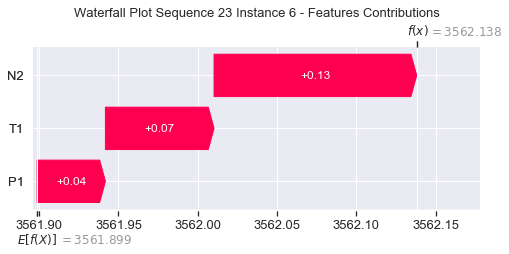

None

Contribution: [0.04080405 0.10116616 0.12762244]


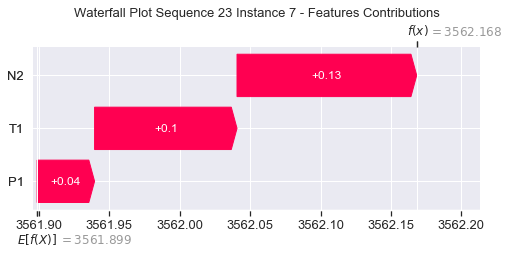

None

Contribution: [0.04838693 0.06720702 0.14516374]


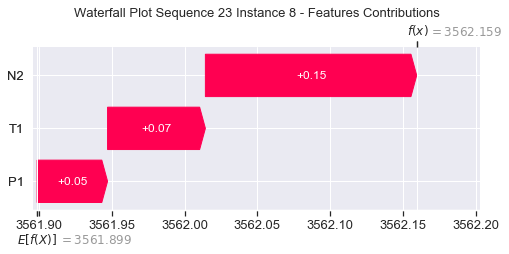

None

Contribution: [0.05334418 0.04408675 0.16445801]


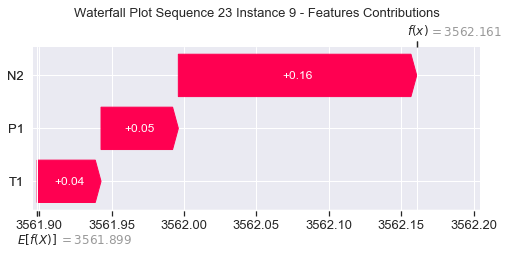

None

Contribution: [0.060657   0.04127925 0.18331227]


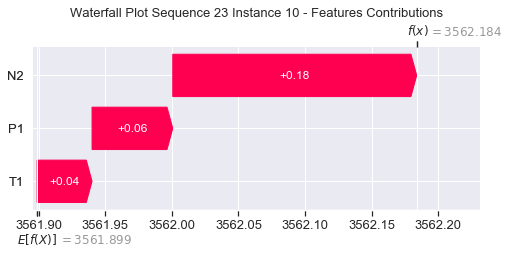

None

Contribution: [0.06177822 0.04627362 0.2059938 ]


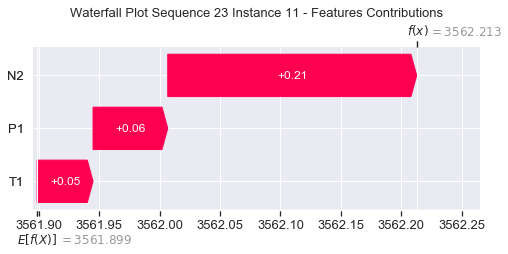

None

Contribution: [0.07225045 0.03675181 0.23397066]


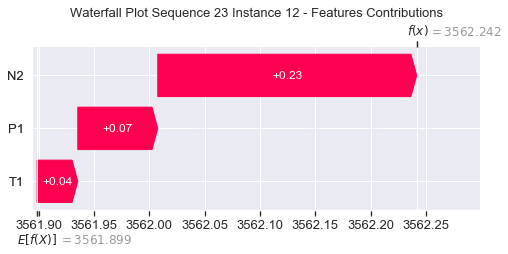

None

Contribution: [0.08315874 0.03747375 0.27003009]


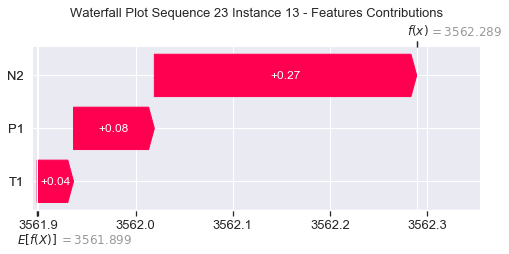

None

Contribution: [0.09395149 0.0255128  0.31613815]


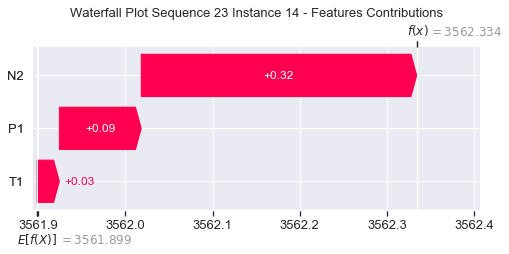

None

Contribution: [0.10749988 0.01336921 0.3681226 ]


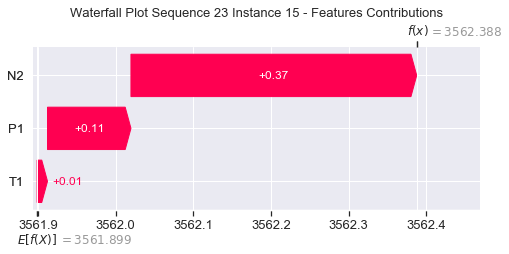

None

Contribution: [0.10772081 0.01089404 0.43526637]


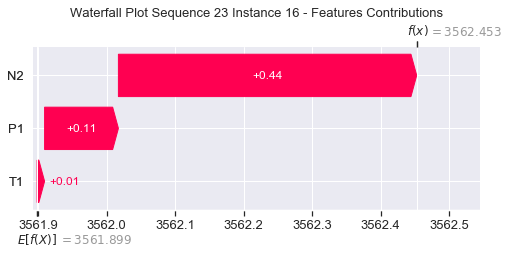

None

Contribution: [0.15106346 0.00698298 0.5175786 ]


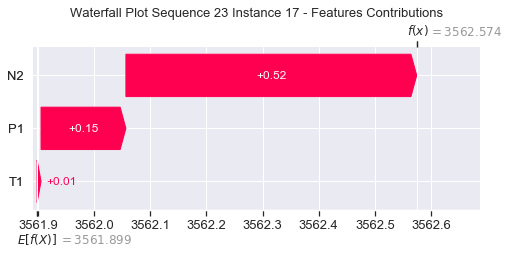

None

Contribution: [0.17692954 0.00072855 0.61535934]


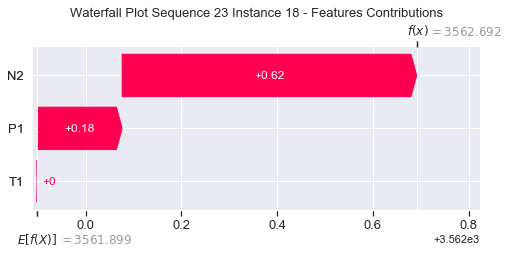

None

Contribution: [ 0.19297102 -0.02241309  0.7335537 ]


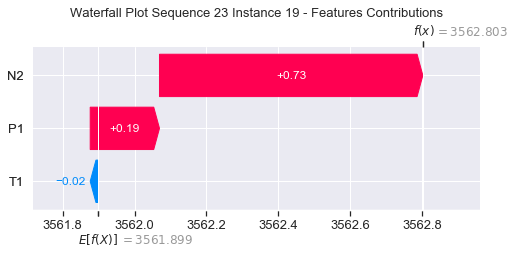

None

Contribution: [ 0.26117378 -0.02746876  0.90432311]


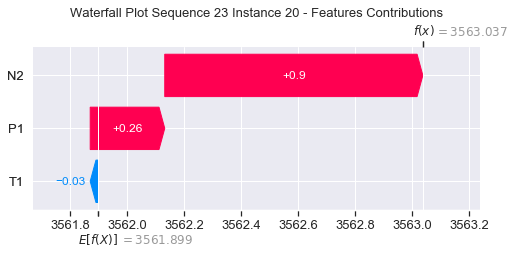

None

Contribution: [ 0.36743328 -0.14538457  1.24509811]


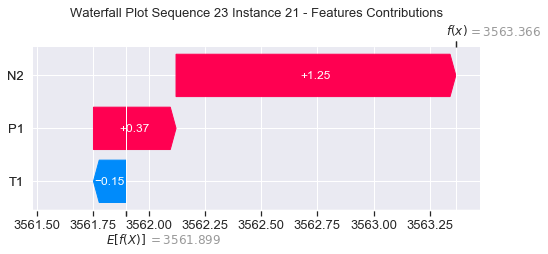

None

Contribution: [ 0.60172779 -0.91109424  2.12156951]


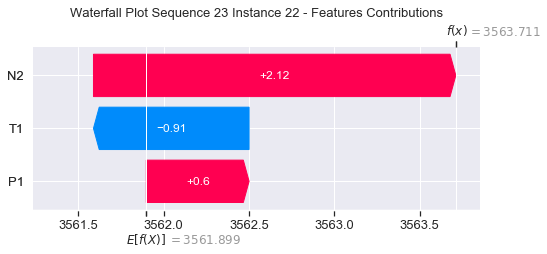

None

Contribution: [ 0.98423078 -4.05038605  4.22180597]


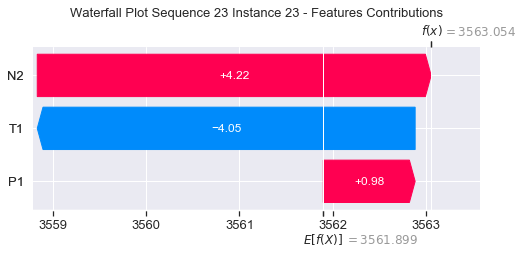

None

Contribution: [  2.20226869 -10.55492728   6.92998781]


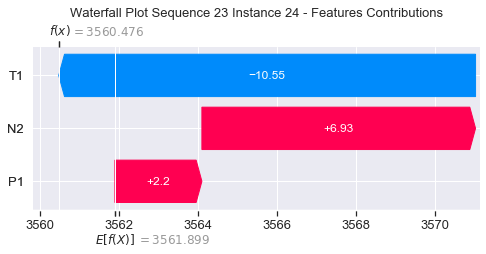

None

Contribution: [ 18.53547586 -31.95888939  34.70611421]


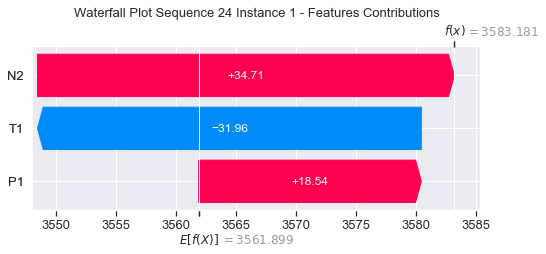

None

Contribution: [ 0.39333528 -1.72927343  1.18930928]


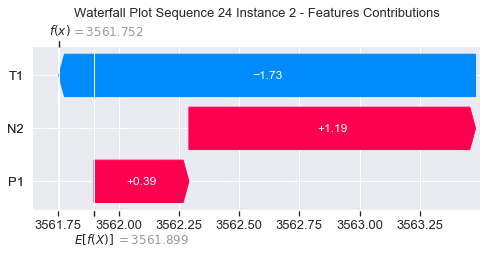

None

Contribution: [ 0.07970411 -0.13071756  0.28279886]


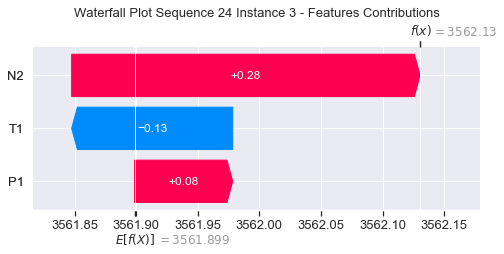

None

Contribution: [ 0.04000697 -0.02348995  0.10851298]


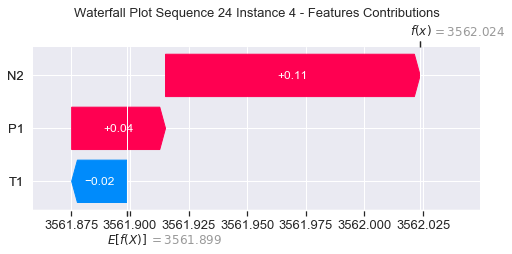

None

Contribution: [0.04910544 0.04033248 0.1432204 ]


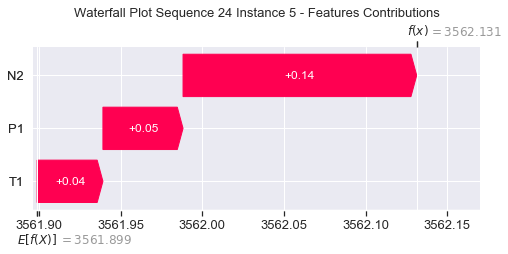

None

Contribution: [0.04301094 0.07748406 0.12871944]


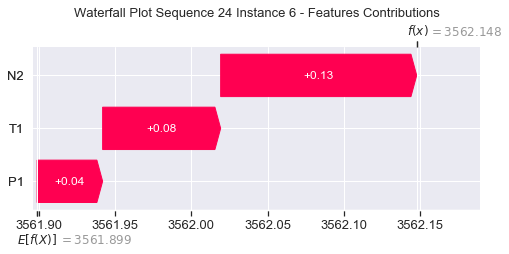

None

Contribution: [0.04072818 0.112049   0.1282863 ]


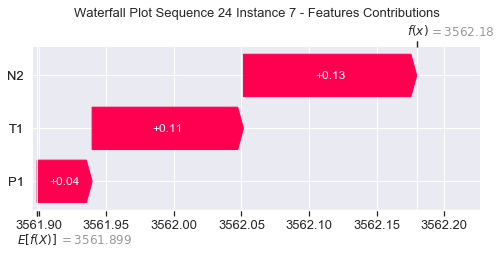

None

Contribution: [0.04864023 0.07233483 0.14618065]


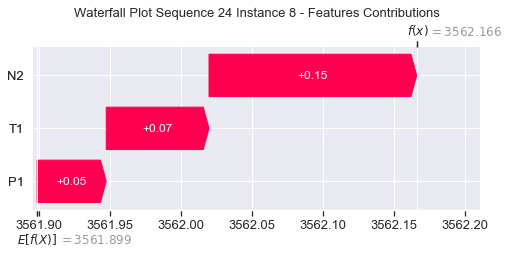

None

Contribution: [0.05053884 0.04739815 0.16394512]


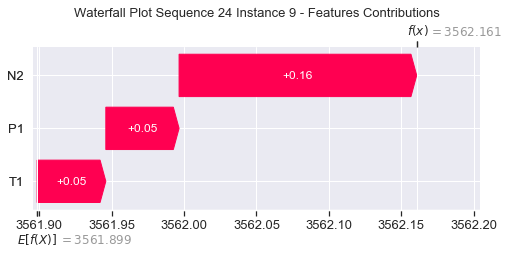

None

Contribution: [0.05797133 0.04233208 0.18250151]


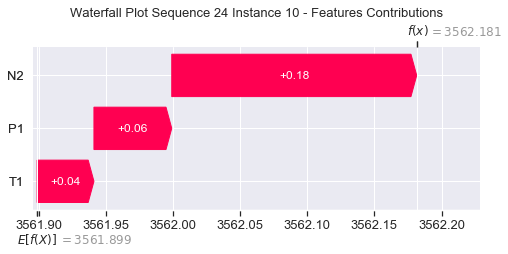

None

Contribution: [0.05983102 0.04731184 0.2050608 ]


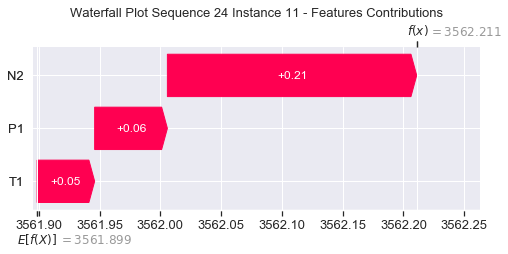

None

Contribution: [0.07457316 0.03469913 0.23459648]


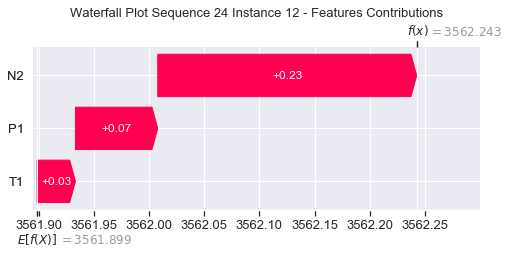

None

Contribution: [0.08554402 0.03480797 0.27047783]


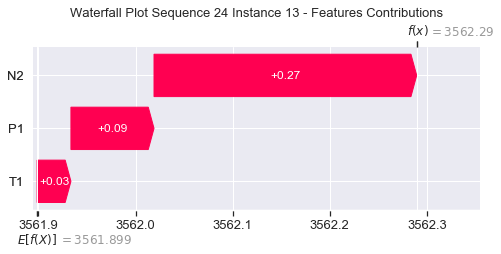

None

Contribution: [0.0904791  0.01768253 0.31160761]


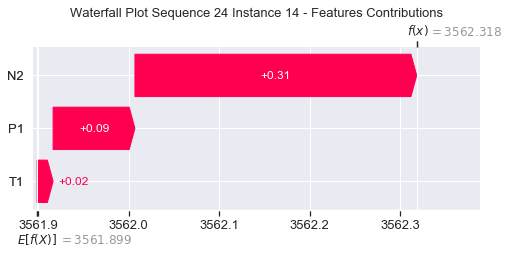

None

Contribution: [0.11110266 0.01030258 0.36837175]


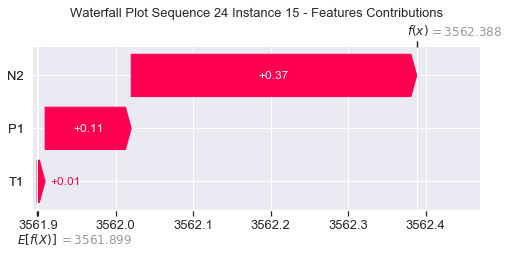

None

Contribution: [ 0.10947957 -0.00293108  0.43153182]


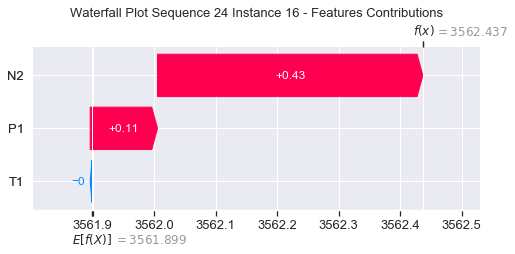

None

Contribution: [0.1540675  0.0086309  0.51712846]


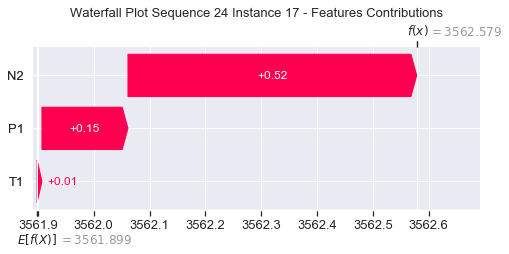

None

Contribution: [0.18012819 0.00917454 0.61470686]


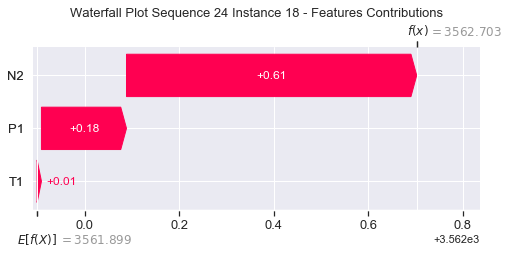

None

Contribution: [0.19193808 0.0119374  0.74821683]


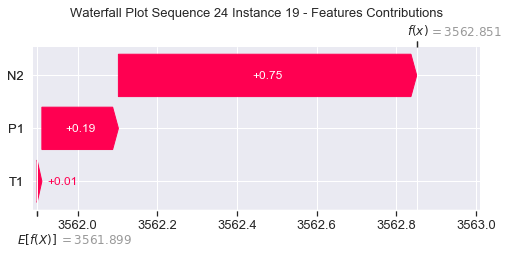

None

Contribution: [0.26782663 0.03573281 0.9036473 ]


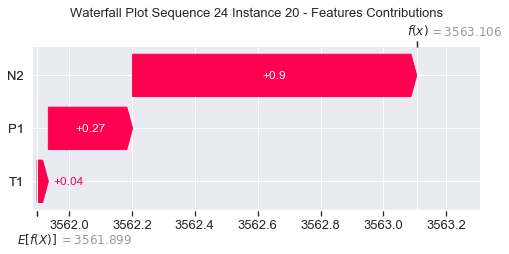

None

Contribution: [ 3.85320412e-01 -1.15436830e-03  1.24800236e+00]


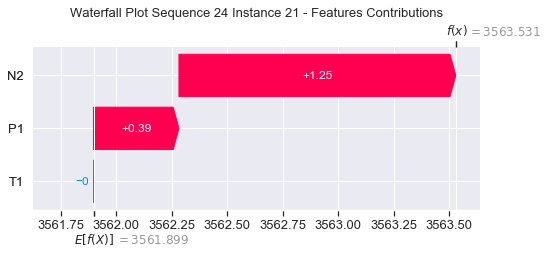

None

Contribution: [ 0.67042825 -0.50008039  2.14146499]


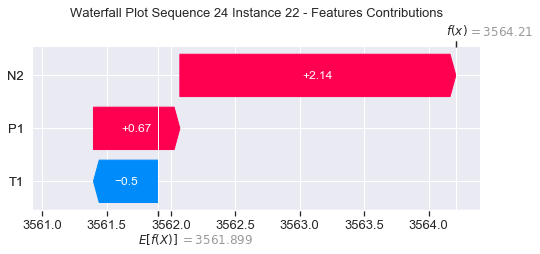

None

Contribution: [ 1.1525336  -2.93052642  4.29648263]


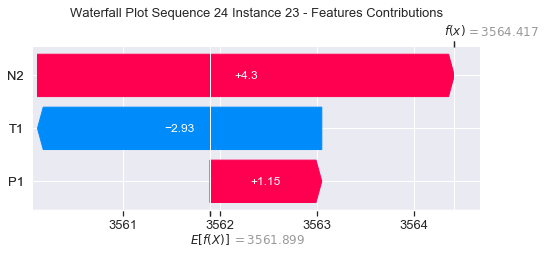

None

Contribution: [ 2.2497712  -7.75953388  6.91159147]


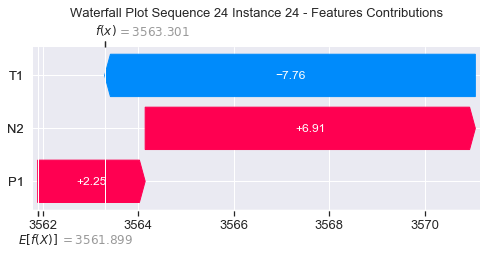

None

Contribution: [ 13.30843242 -23.87298661  32.62189888]


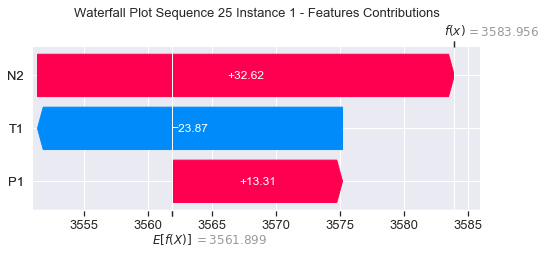

None

Contribution: [ 0.51542312 -1.24725221  1.20132522]


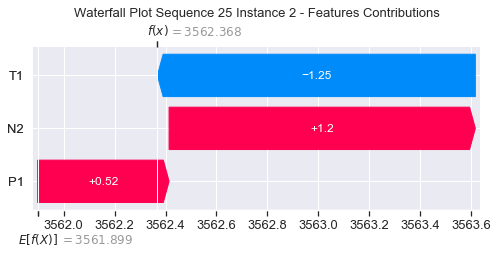

None

Contribution: [ 0.08769467 -0.1052915   0.28356614]


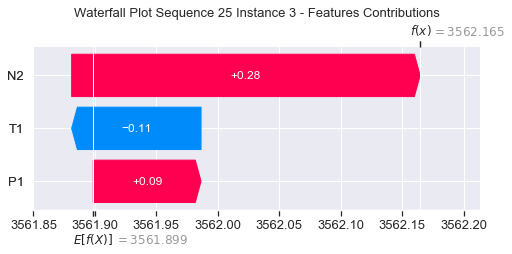

None

Contribution: [ 0.02911086 -0.01852071  0.10650771]


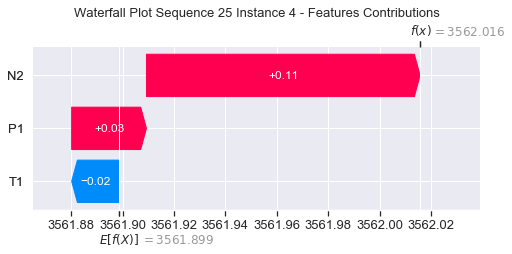

None

Contribution: [0.04639657 0.04660838 0.1427636 ]


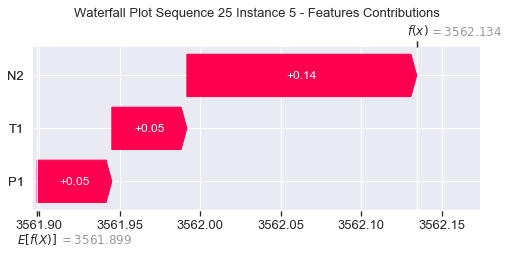

None

Contribution: [0.04151257 0.07664841 0.12871801]


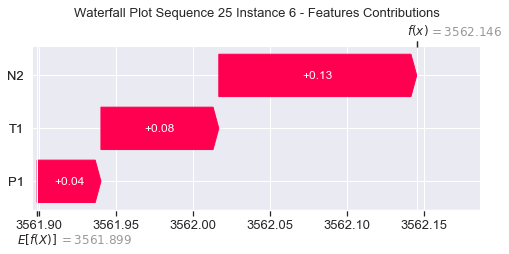

None

Contribution: [0.04078784 0.10664154 0.12878476]


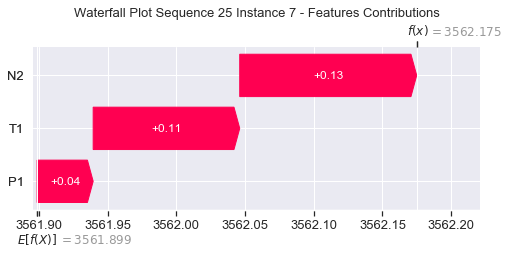

None

Contribution: [0.04682851 0.07110055 0.14608171]


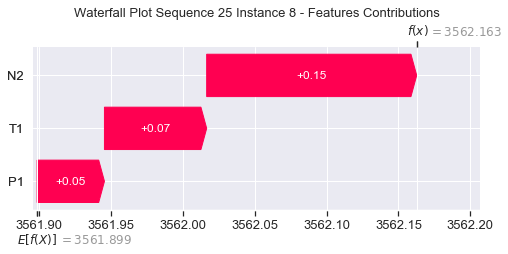

None

Contribution: [0.05286311 0.04919497 0.16542273]


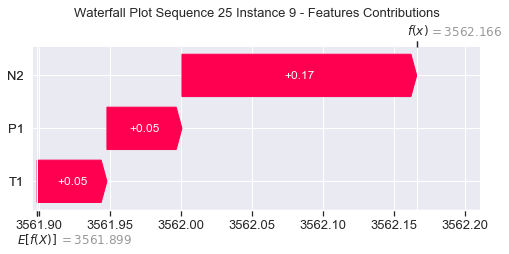

None

Contribution: [0.0463894  0.04763421 0.18020775]


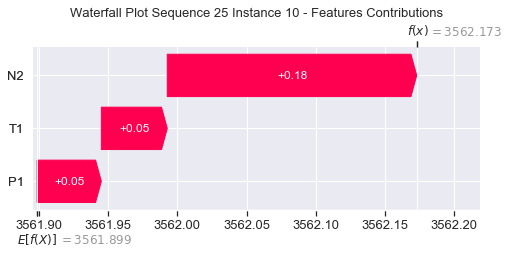

None

Contribution: [0.06364986 0.05242339 0.20779502]


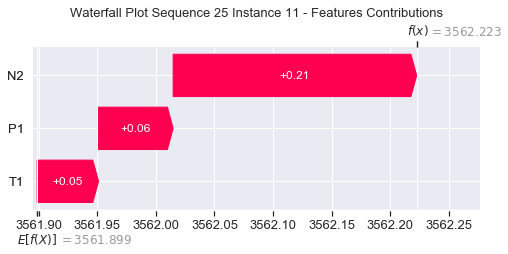

None

Contribution: [0.06991415 0.04128659 0.23407588]


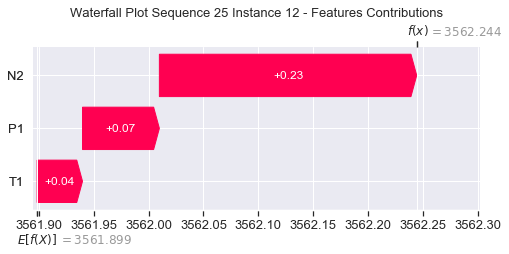

None

Contribution: [0.08013547 0.04248318 0.26957418]


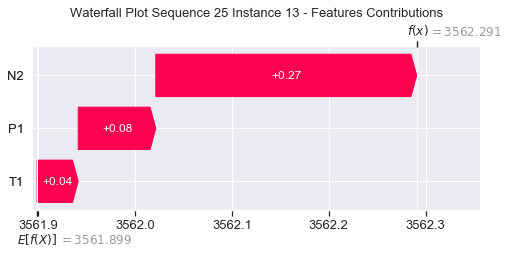

None

Contribution: [0.09300972 0.0256353  0.31167748]


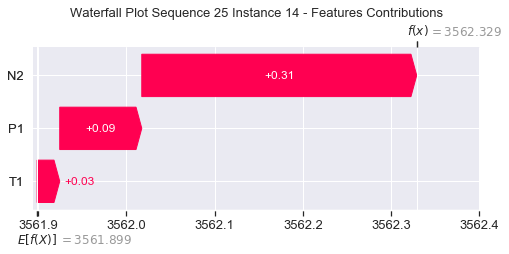

None

Contribution: [0.10412561 0.02097429 0.36726775]


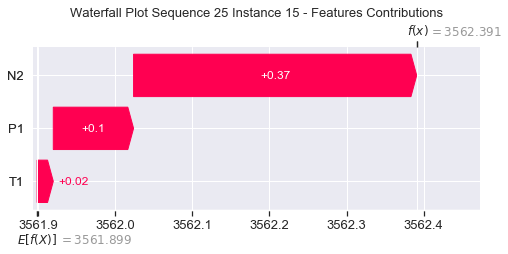

None

Contribution: [0.09877561 0.00674024 0.43054663]


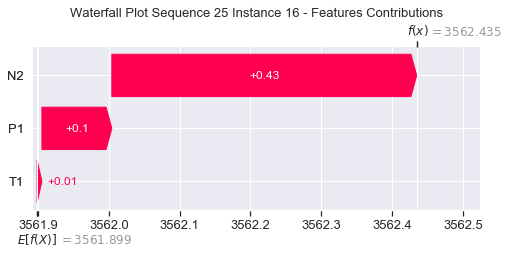

None

Contribution: [0.14466826 0.01841223 0.51552252]


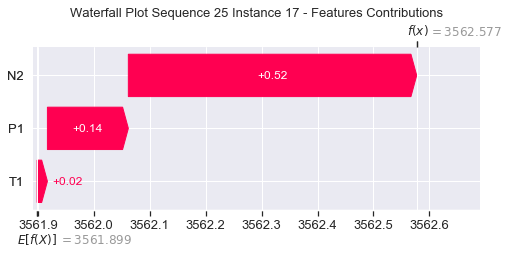

None

Contribution: [0.17000187 0.01960739 0.61304703]


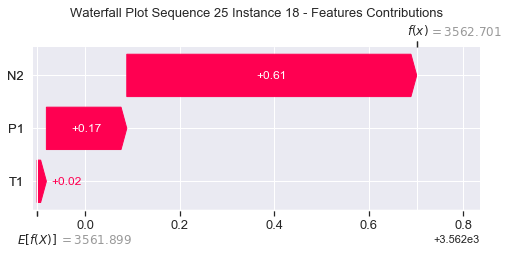

None

Contribution: [0.20229556 0.01671733 0.74143841]


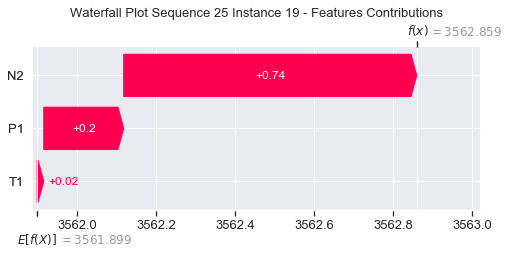

None

Contribution: [0.25236039 0.04537317 0.90114908]


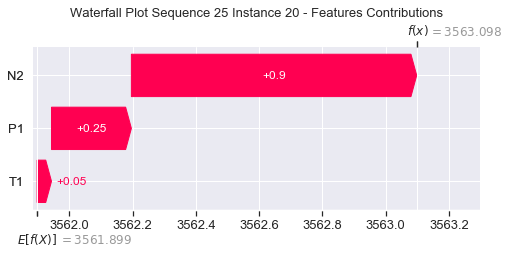

None

Contribution: [0.35905489 0.0310228  1.24605087]


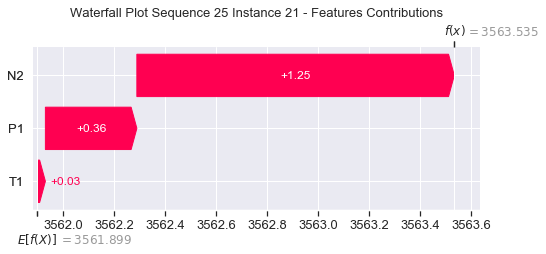

None

Contribution: [ 0.60938944 -0.36820727  2.14233161]


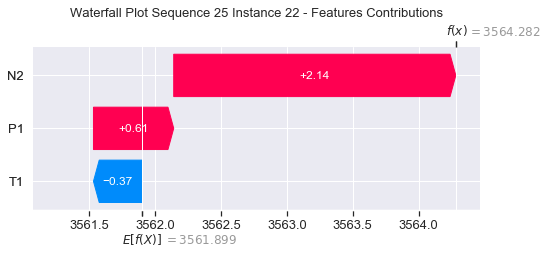

None

Contribution: [ 0.98748131 -2.61099548  4.31014531]


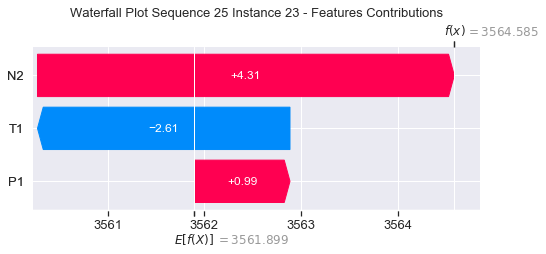

None

Contribution: [ 1.89649151 -6.97766069  7.06979402]


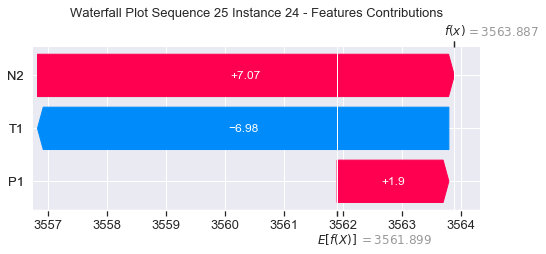

None

Contribution: [ 11.89039641 -20.26237749  35.63745751]


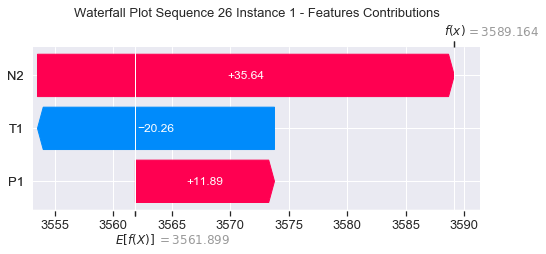

None

Contribution: [ 0.45382249 -1.00749078  1.20988124]


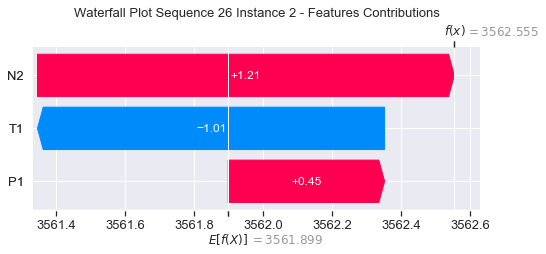

None

Contribution: [ 0.08437404 -0.06417344  0.28547757]


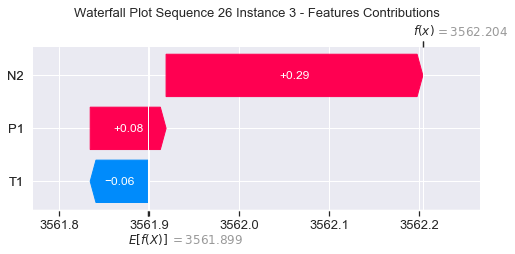

None

Contribution: [ 0.03498449 -0.00072965  0.11003397]


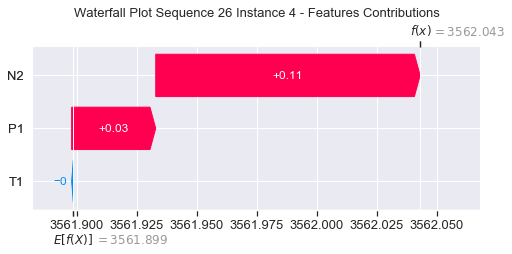

None

Contribution: [0.04808635 0.0532048  0.14435792]


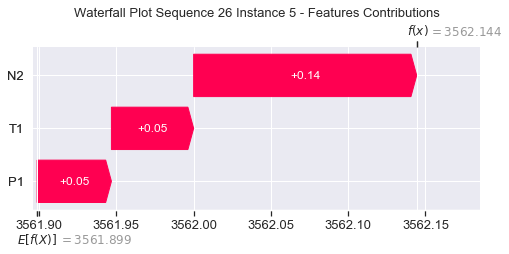

None

Contribution: [0.04157044 0.07818793 0.12900293]


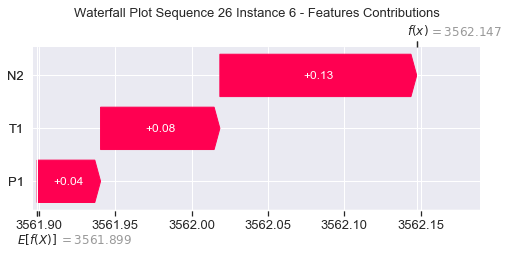

None

Contribution: [0.04083854 0.10153728 0.12866436]


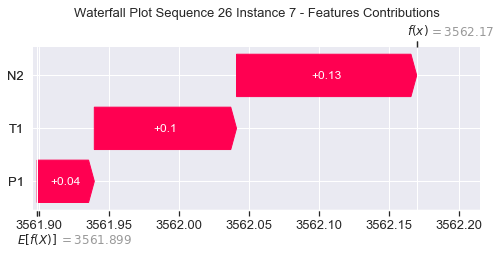

None

Contribution: [0.04704989 0.07159351 0.14656528]


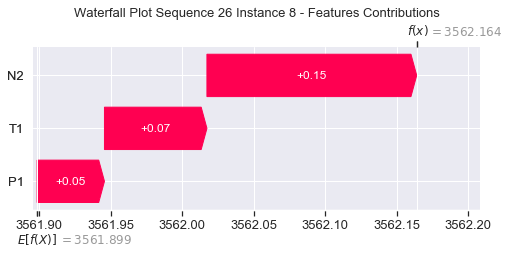

None

Contribution: [0.05088125 0.05351923 0.1646971 ]


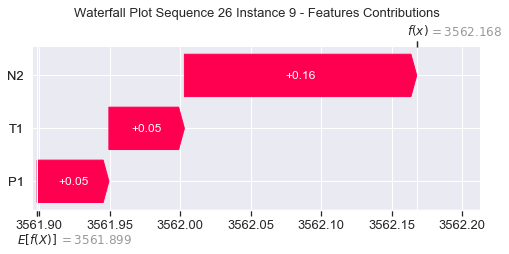

None

Contribution: [0.05502567 0.05114064 0.18322889]


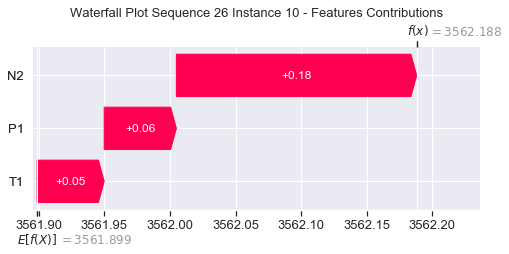

None

Contribution: [0.06247033 0.05545126 0.20648797]


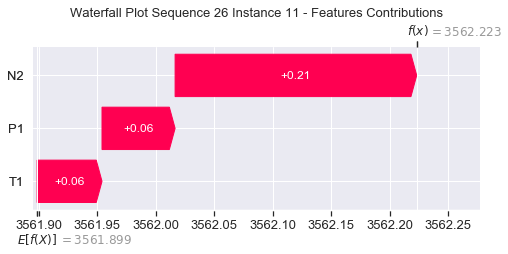

None

Contribution: [0.07564459 0.04453739 0.23526519]


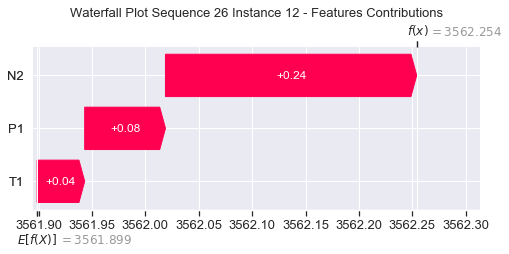

None

Contribution: [0.08578077 0.04651002 0.2708197 ]


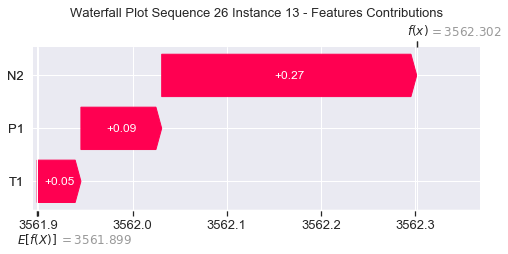

None

Contribution: [0.09244168 0.033495   0.31294271]


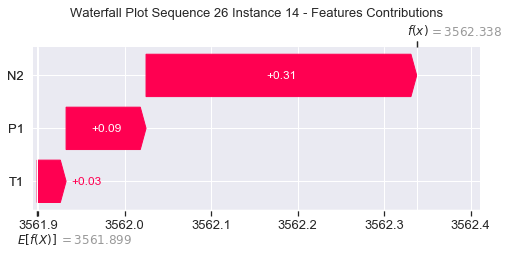

None

Contribution: [0.10803015 0.02469461 0.36790472]


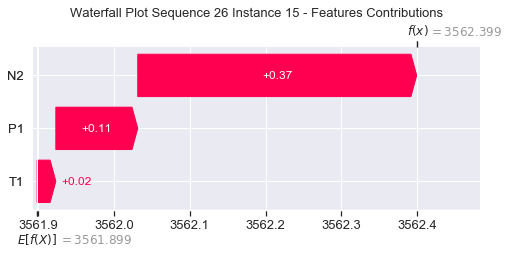

None

Contribution: [0.1141028  0.03416496 0.43767803]


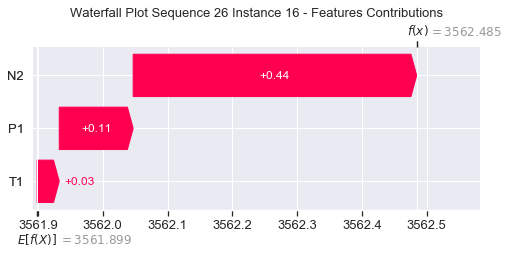

None

Contribution: [0.1478927  0.02477397 0.51669973]


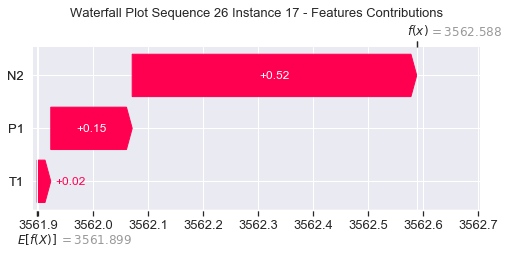

None

Contribution: [0.17153068 0.02544117 0.6139093 ]


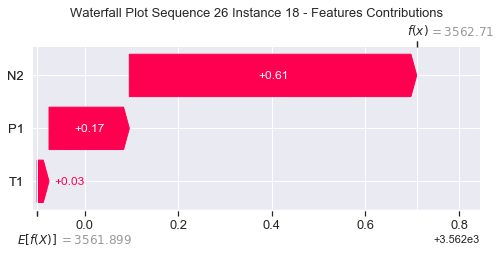

None

Contribution: [0.19036582 0.03690457 0.73775694]


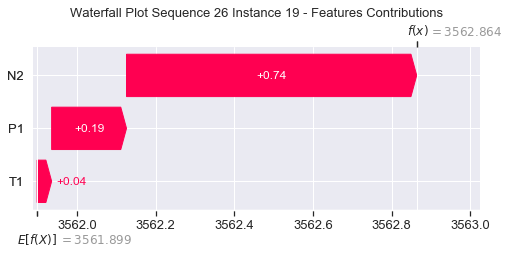

None

Contribution: [0.24873292 0.05462933 0.90103089]


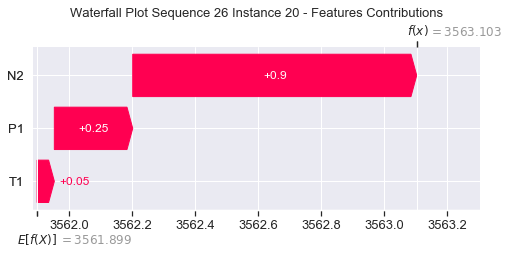

None

Contribution: [0.35942259 0.03507165 1.24701624]


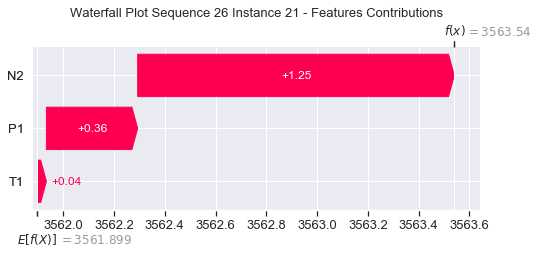

None

Contribution: [ 0.61994267 -0.4453209   2.14561615]


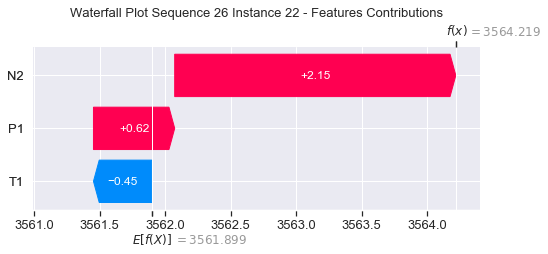

None

Contribution: [ 0.97835316 -2.95091044  4.28910927]


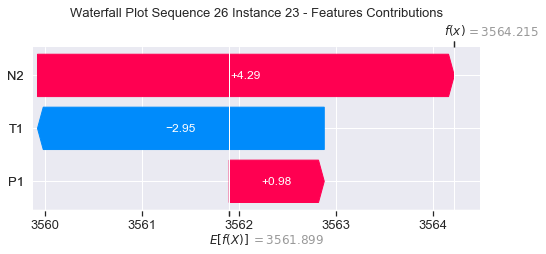

None

Contribution: [ 1.68520551 -8.06211735  6.84634285]


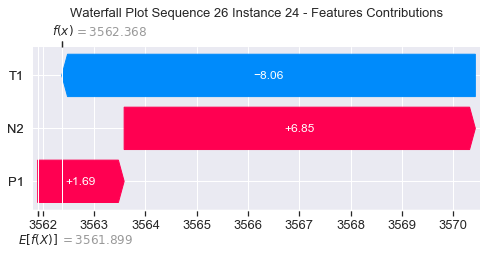

None

Contribution: [ 10.15999189 -25.06115924  32.0585472 ]


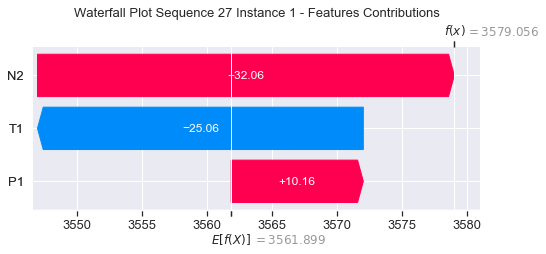

None

Contribution: [ 0.5547585  -1.24444366  1.22125851]


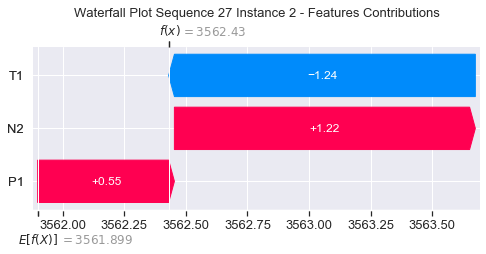

None

Contribution: [ 0.08335568 -0.11408011  0.2856159 ]


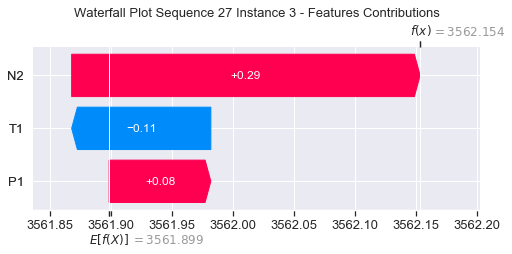

None

Contribution: [ 0.03566221 -0.00825105  0.10832068]


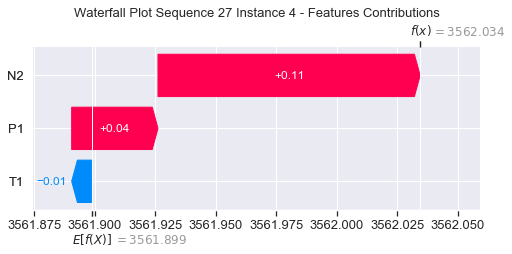

None

Contribution: [0.04365312 0.0426212  0.14180516]


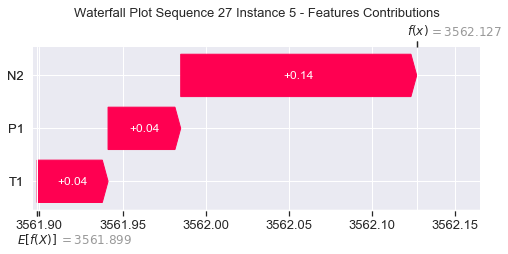

None

Contribution: [0.04190494 0.07422158 0.12840814]


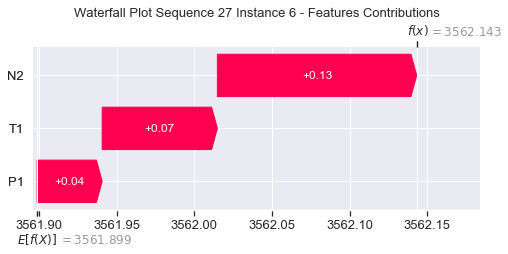

None

Contribution: [0.04073527 0.102235   0.12852099]


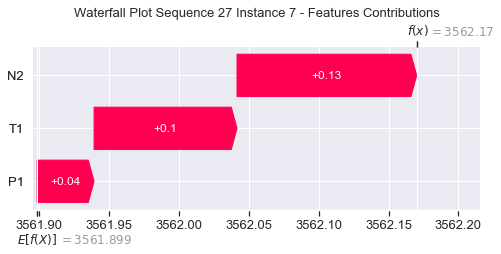

None

Contribution: [0.04670311 0.06992041 0.14560423]


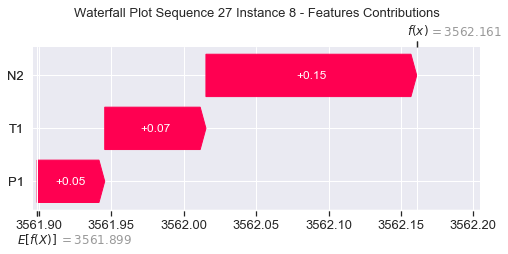

None

Contribution: [0.04802933 0.04952338 0.16342878]


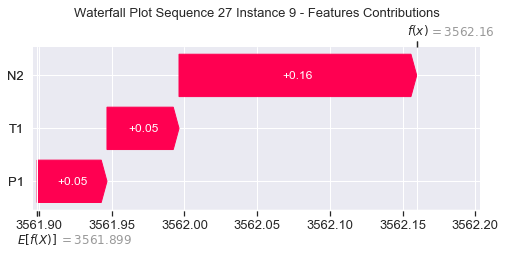

None

Contribution: [0.05226342 0.0467314  0.18156468]


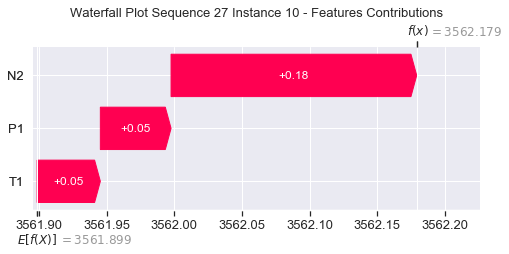

None

Contribution: [0.05766219 0.05041332 0.20453557]


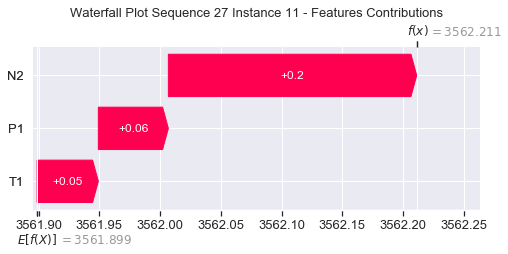

None

Contribution: [0.06596844 0.03976143 0.2310174 ]


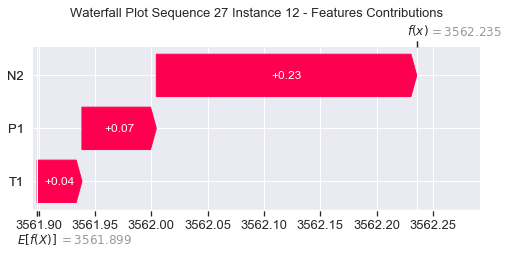

None

Contribution: [0.07596339 0.04114788 0.26629201]


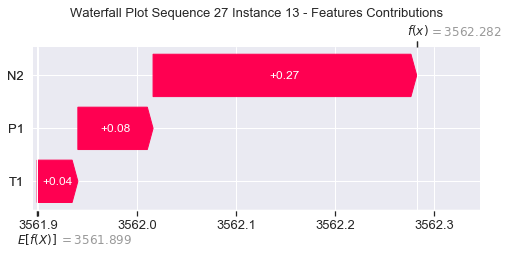

None

Contribution: [0.08530139 0.03055887 0.31021527]


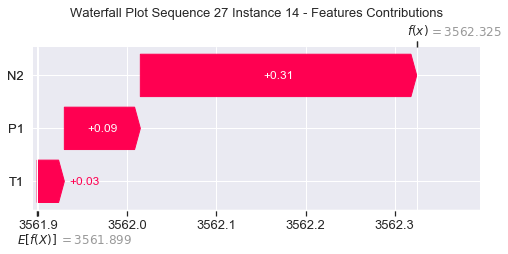

None

Contribution: [0.09944759 0.02067944 0.36311113]


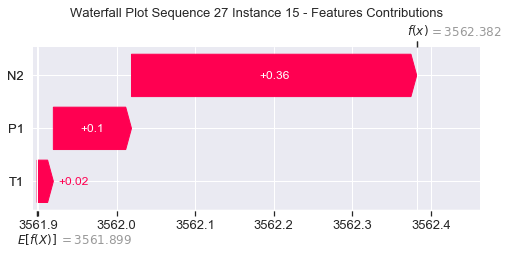

None

Contribution: [0.11426726 0.03135066 0.43460683]


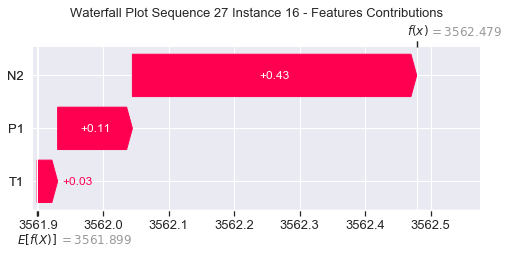

None

Contribution: [0.14256055 0.02568856 0.5118988 ]


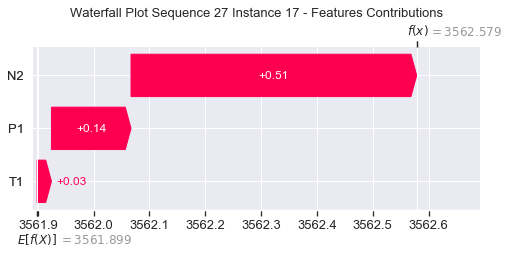

None

Contribution: [0.16949296 0.02950975 0.60971906]


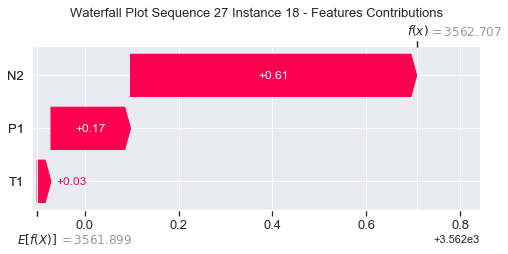

None

Contribution: [0.18610851 0.0267053  0.72969437]


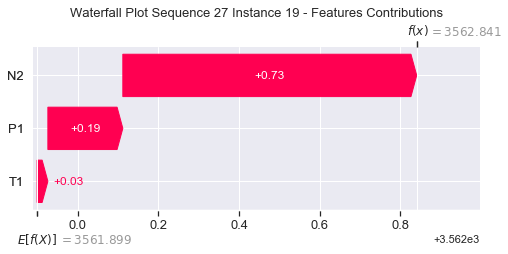

None

Contribution: [0.25082944 0.06551728 0.89646317]


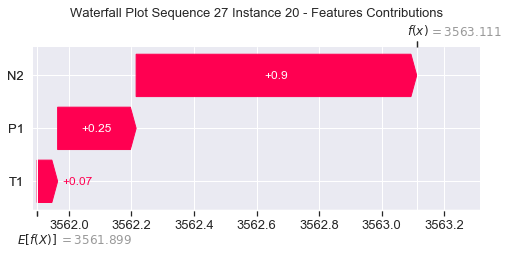

None

Contribution: [0.34518553 0.0426912  1.23278472]


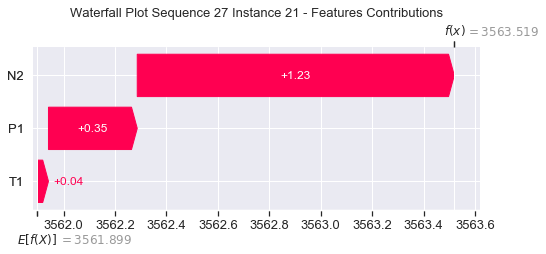

None

Contribution: [ 0.54096322 -0.42733015  2.09703369]


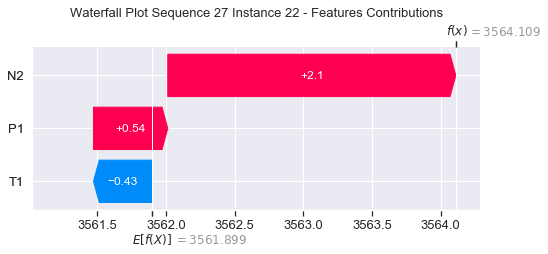

None

Contribution: [ 0.87581915 -2.6163105   4.18560558]


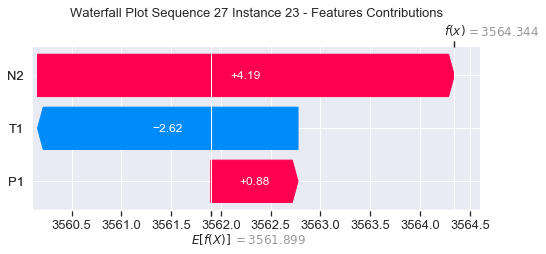

None

Contribution: [ 1.58155789 -6.85081477  6.73349314]


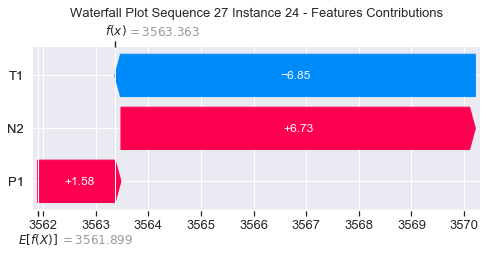

None

Contribution: [  7.15074627 -18.64558678  31.28265519]


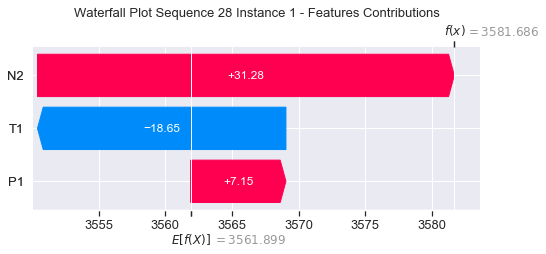

None

Contribution: [ 0.26383853 -1.31608447  1.12724657]


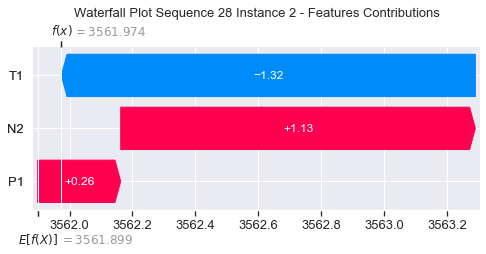

None

Contribution: [ 0.04537296 -0.10399026  0.27260507]


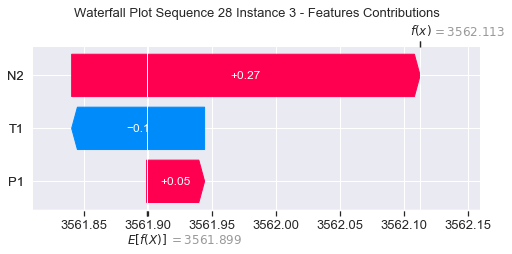

None

Contribution: [ 0.03611075 -0.00734023  0.10678487]


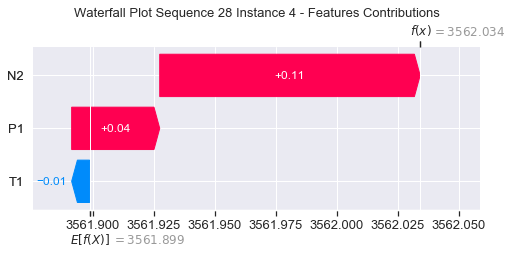

None

Contribution: [0.05212394 0.04644412 0.14374929]


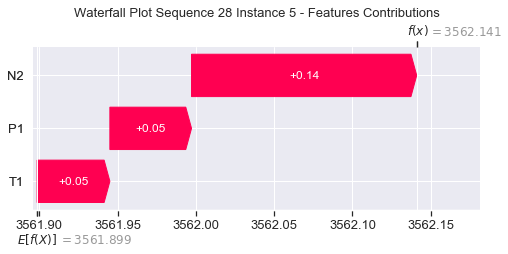

None

Contribution: [0.04328055 0.07140306 0.12914275]


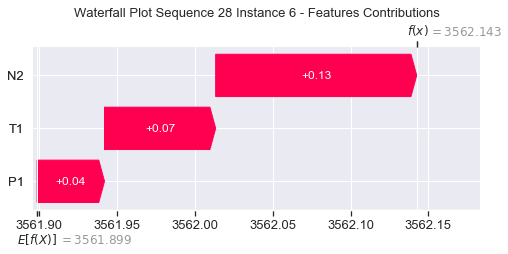

None

Contribution: [0.041092   0.08644161 0.12962208]


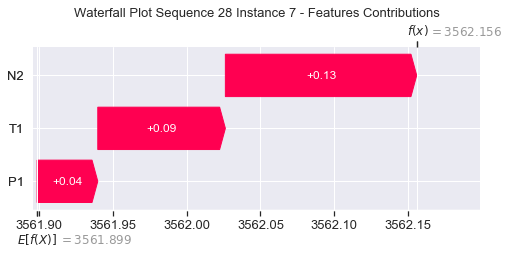

None

Contribution: [0.04928033 0.06750616 0.14697678]


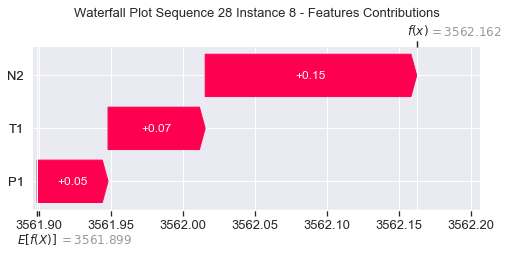

None

Contribution: [0.05231389 0.05530672 0.16893312]


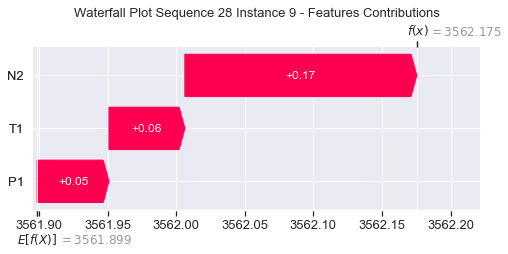

None

Contribution: [0.06565043 0.05378798 0.18852555]


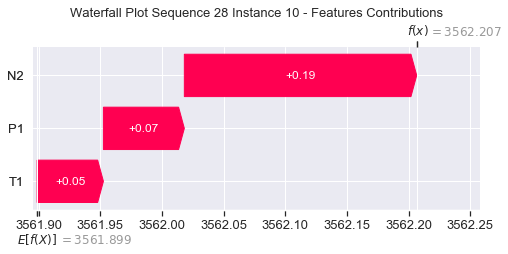

None

Contribution: [0.07118884 0.05312438 0.21012099]


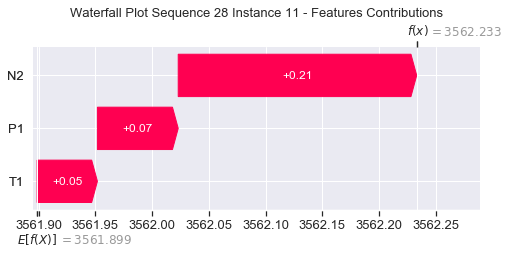

None

Contribution: [0.07617849 0.04076511 0.23639958]


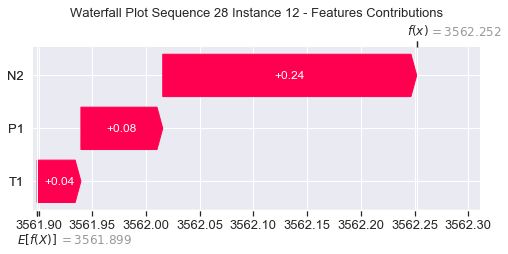

None

Contribution: [0.08703216 0.04145719 0.27308227]


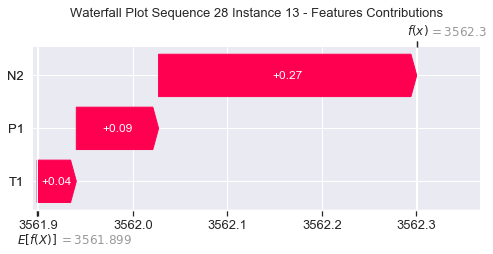

None

Contribution: [0.08702961 0.02361132 0.31386637]


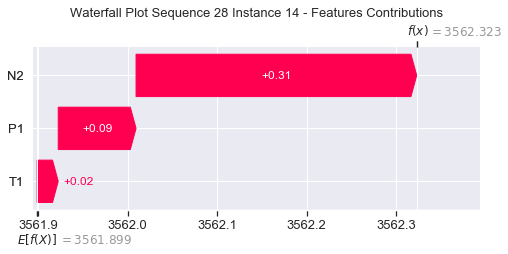

None

Contribution: [0.11461534 0.00967271 0.3705403 ]


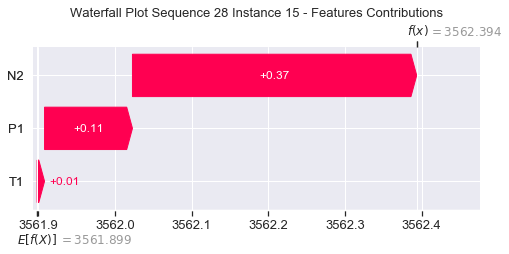

None

Contribution: [0.13670862 0.01960384 0.44515676]


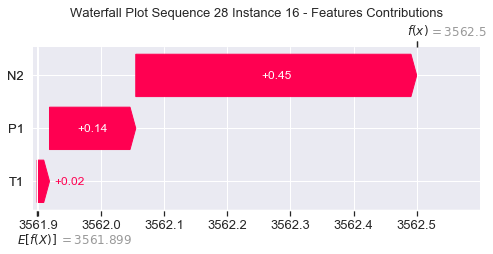

None

Contribution: [ 0.15941556 -0.0012409   0.52316008]


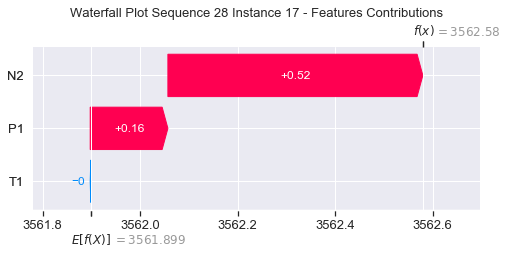

None

Contribution: [ 0.19183344 -0.02078134  0.62211861]


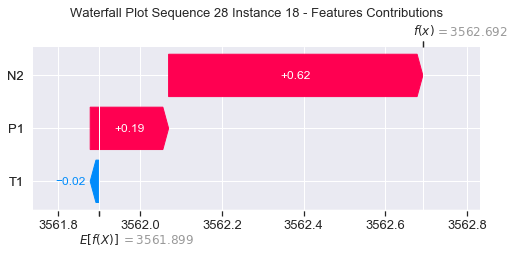

None

Contribution: [ 0.19397144 -0.04880239  0.74741676]


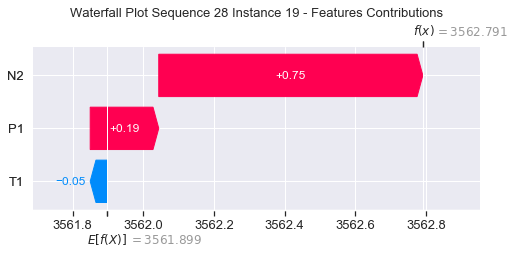

None

Contribution: [ 0.29888791 -0.09000158  0.91777833]


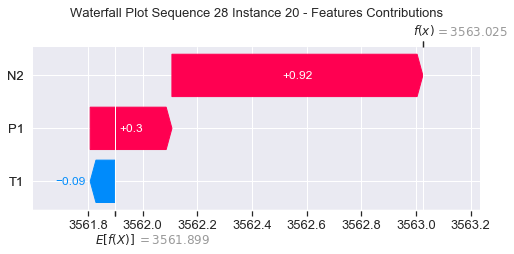

None

Contribution: [ 0.46010666 -0.34737171  1.26951277]


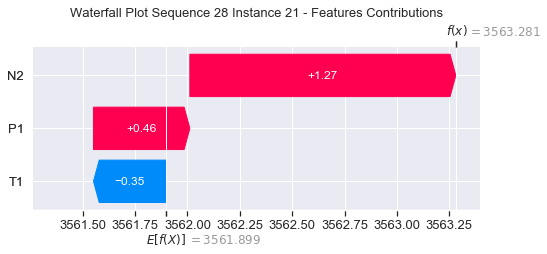

None

Contribution: [ 0.93017888 -1.8076154   2.17689938]


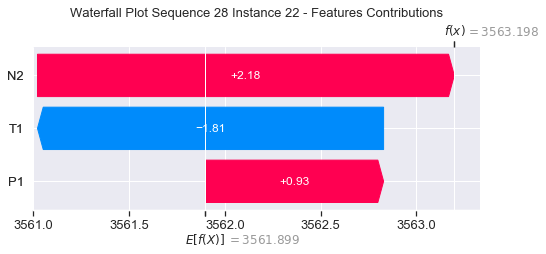

None

Contribution: [ 1.92851456 -7.01128293  4.32897085]


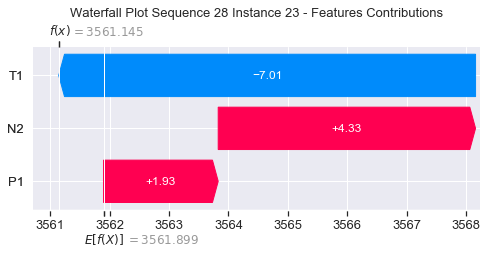

None

Contribution: [  5.79802026 -20.50058753   7.45382046]


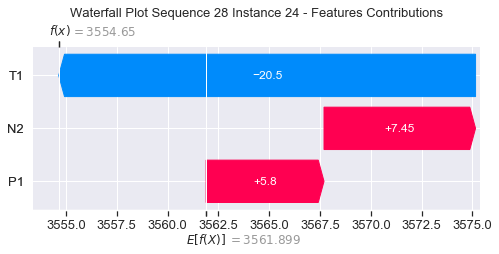

None

Contribution: [ 57.83204422 -92.39267707  43.06948382]


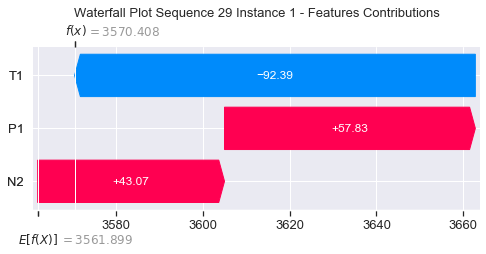

None

Contribution: [ 0.93168699 -3.66718499  1.26216777]


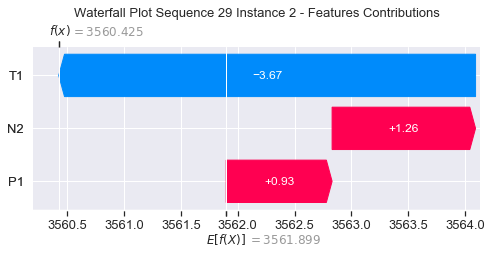

None

Contribution: [ 0.15403256 -0.40811831  0.29139677]


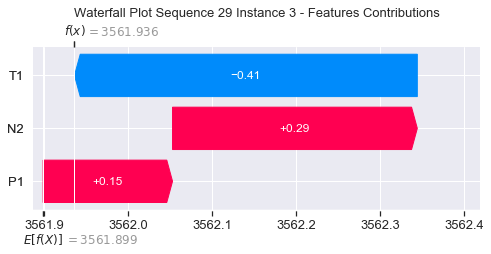

None

Contribution: [ 0.07247719 -0.1028555   0.11313618]


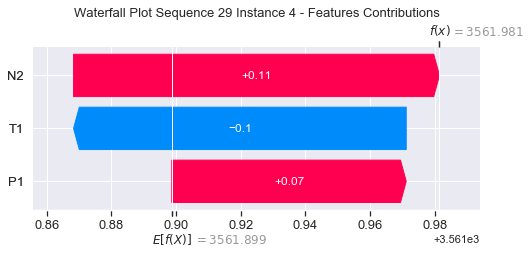

None

Contribution: [ 0.06739465 -0.0108483   0.14347856]


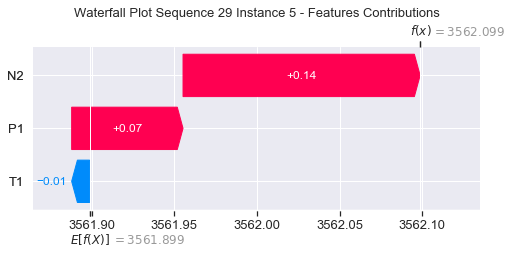

None

Contribution: [0.06395975 0.0635778  0.13003784]


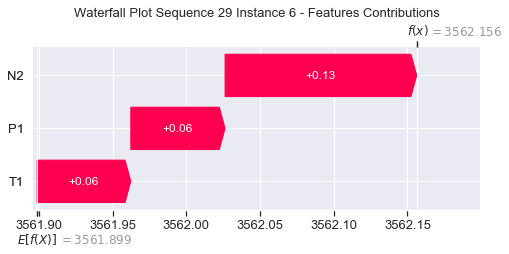

None

Contribution: [0.04491064 0.15290045 0.12683971]


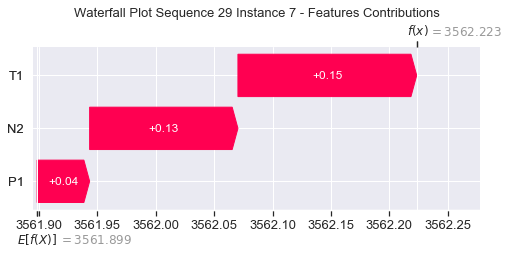

None

Contribution: [0.07202224 0.06658289 0.14776446]


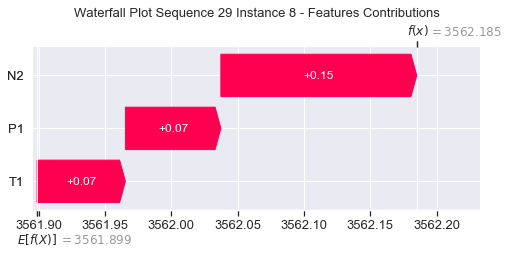

None

Contribution: [0.08552701 0.01078202 0.1669977 ]


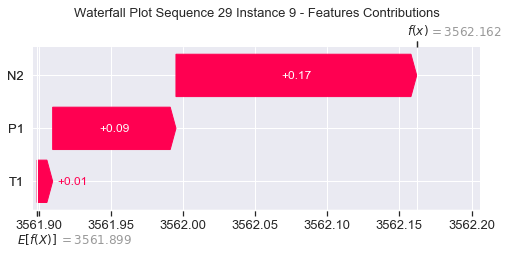

None

Contribution: [0.06779825 0.01245845 0.18214245]


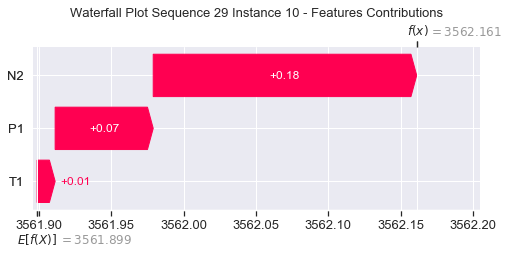

None

Contribution: [ 1.05174529e-01 -1.83747803e-04  2.13272190e-01]


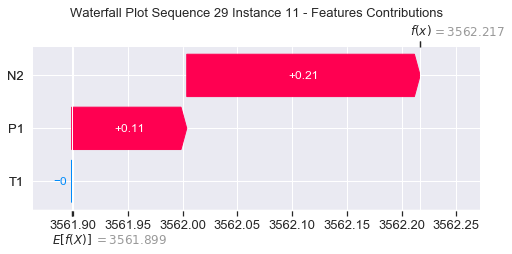

None

Contribution: [ 0.12353917 -0.01966017  0.24265357]


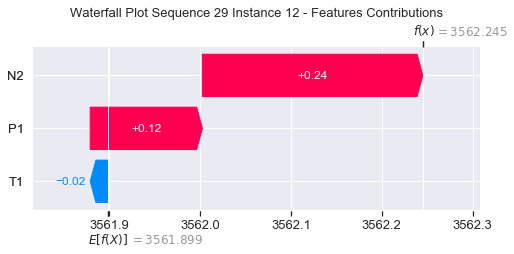

None

Contribution: [ 0.13288903 -0.02646719  0.2788515 ]


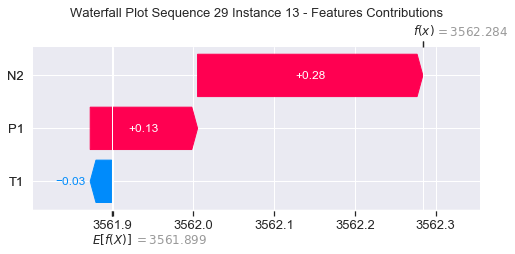

None

Contribution: [ 0.17786906 -0.06291069  0.32987808]


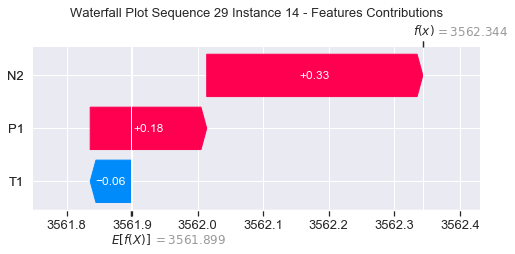

None

Contribution: [ 0.16816756 -0.08007766  0.38200756]


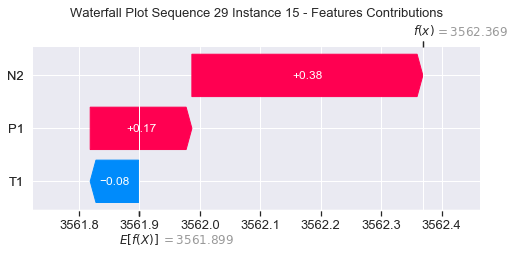

None

Contribution: [ 0.19707272 -0.1278843   0.45503798]


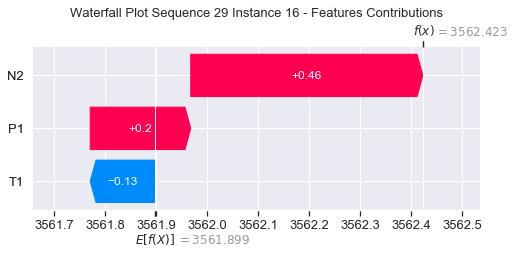

None

Contribution: [ 0.21732677 -0.11809795  0.53383508]


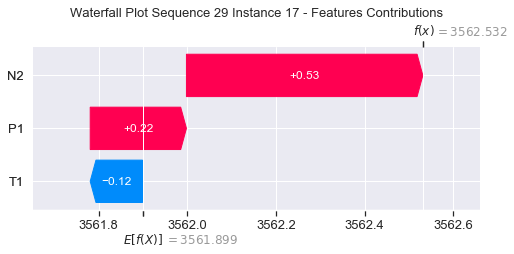

None

Contribution: [ 0.24561318 -0.13145125  0.63408616]


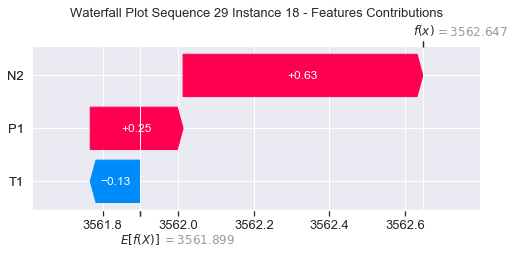

None

Contribution: [ 0.22704127 -0.09102471  0.74738487]


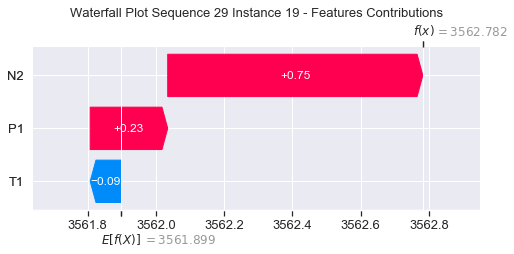

None

Contribution: [ 0.30908611 -0.18510114  0.92176922]


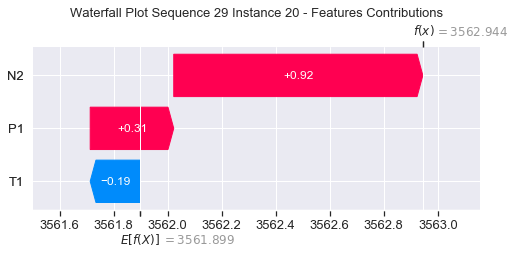

None

Contribution: [ 0.43435651 -0.44546435  1.2681152 ]


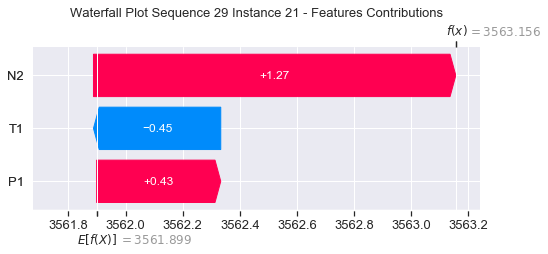

None

Contribution: [ 0.66457437 -1.50501716  2.14926295]


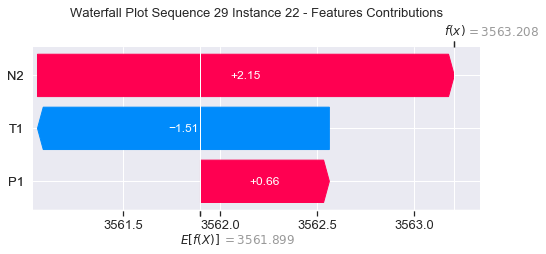

None

Contribution: [ 1.34341909 -5.63674701  4.37023618]


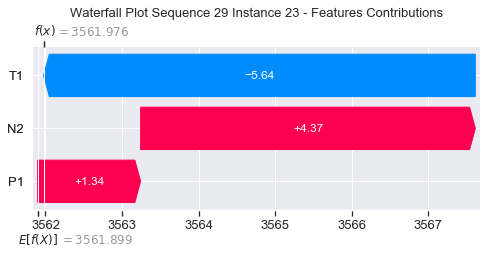

None

Contribution: [  1.57977129 -11.22422607   7.087281  ]


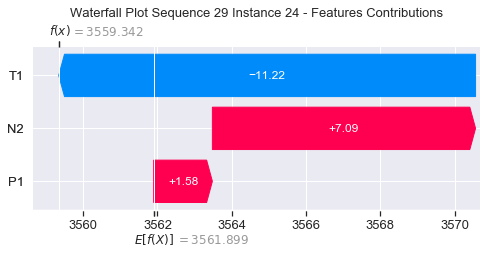

None

Contribution: [  8.18015779 -29.8673022   35.84713819]


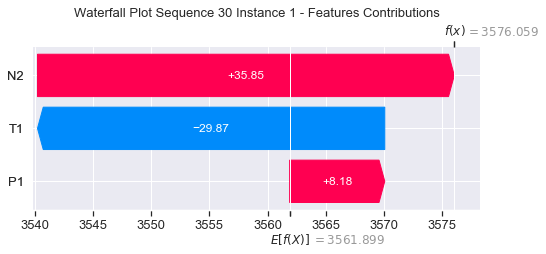

None

Contribution: [ 0.22746236 -2.10922004  1.16978893]


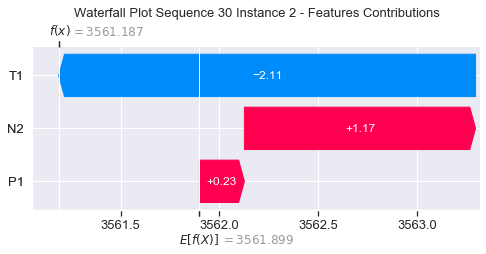

None

Contribution: [ 0.06183187 -0.18856929  0.27936058]


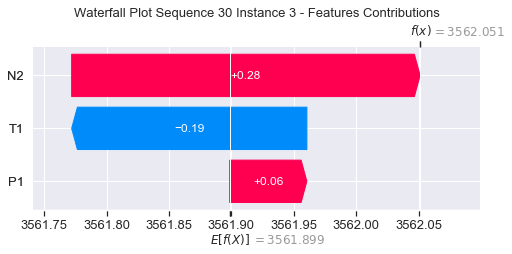

None

Contribution: [ 0.0157449  -0.04298647  0.10368872]


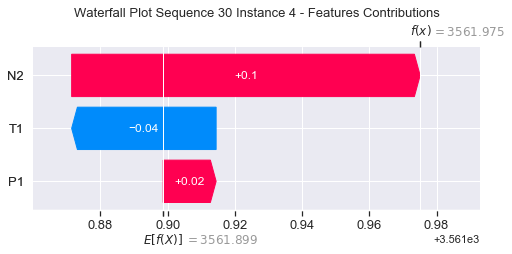

None

Contribution: [0.04741983 0.04152856 0.14291821]


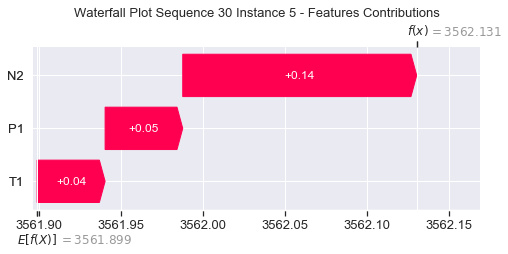

None

Contribution: [0.04176062 0.07094064 0.12839084]


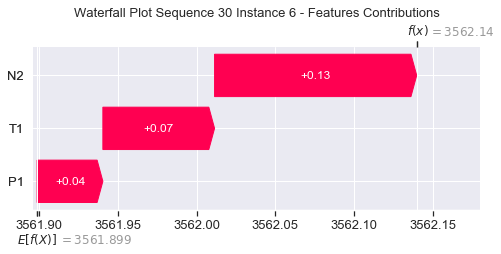

None

Contribution: [0.04075043 0.10033123 0.12819664]


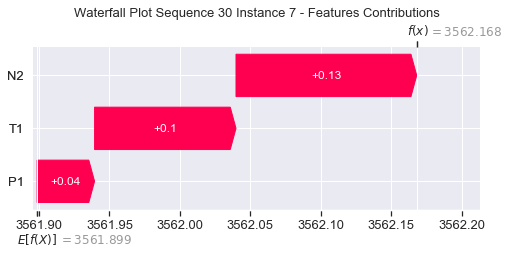

None

Contribution: [0.04668144 0.06822168 0.14581789]


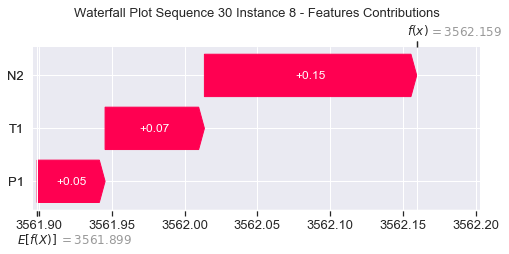

None

Contribution: [0.05023378 0.04875819 0.16413049]


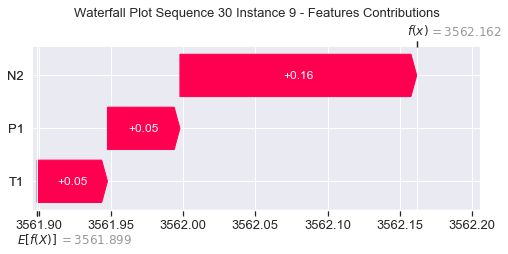

None

Contribution: [0.05633659 0.04514797 0.18337603]


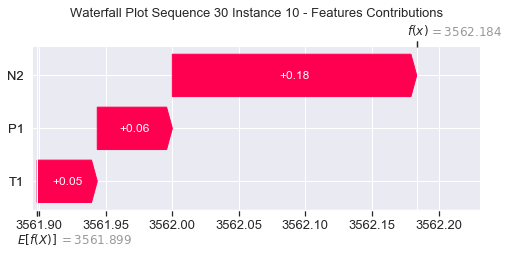

None

Contribution: [0.05782257 0.05124064 0.20693182]


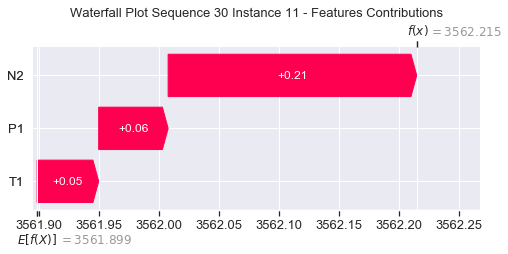

None

Contribution: [0.06511405 0.03846961 0.23382254]


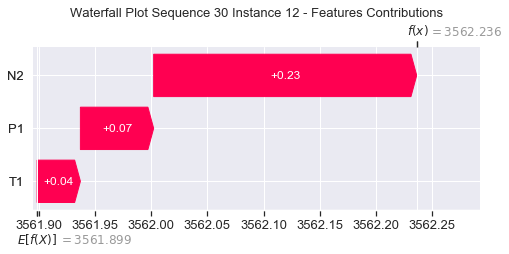

None

Contribution: [0.0757281  0.03956233 0.26938634]


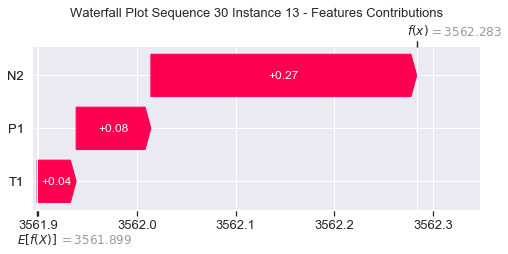

None

Contribution: [0.08672147 0.01926629 0.30978879]


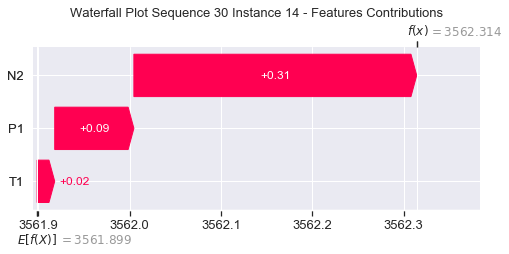

None

Contribution: [0.09786387 0.01610595 0.36670068]


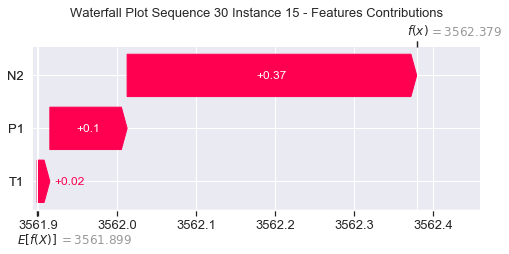

None

Contribution: [0.11754468 0.01762992 0.44005188]


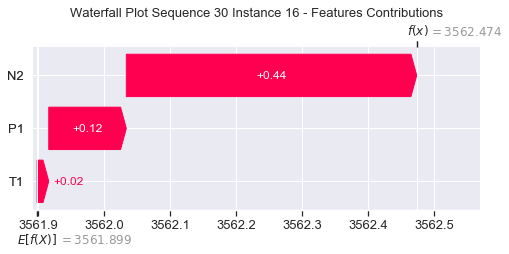

None

Contribution: [0.13711537 0.01125771 0.51417018]


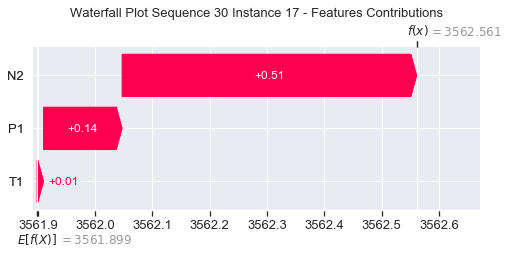

None

Contribution: [0.16128298 0.00754755 0.61138844]


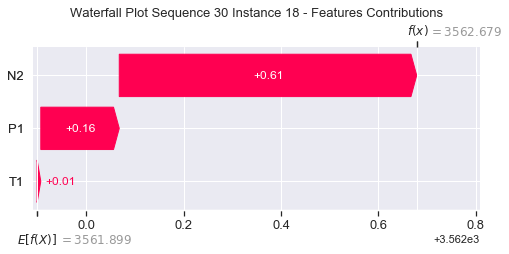

None

Contribution: [0.18790691 0.02249926 0.73777843]


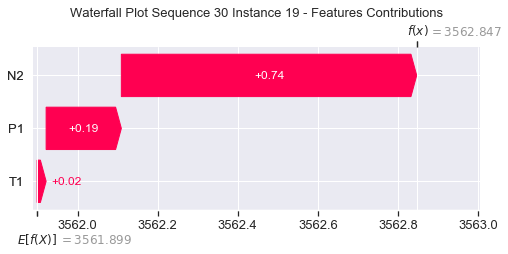

None

Contribution: [0.2409661  0.01460638 0.89711415]


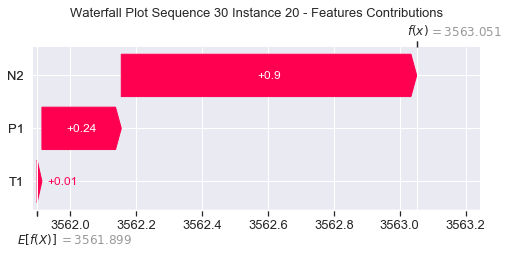

None

Contribution: [ 0.33141031 -0.05666604  1.23450529]


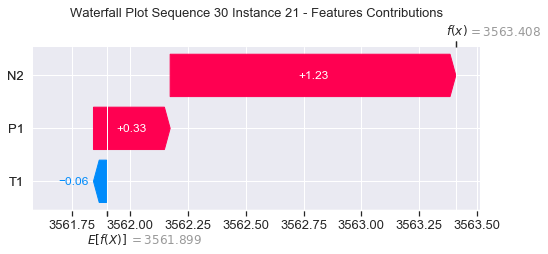

None

Contribution: [ 0.52079521 -0.65075328  2.10877964]


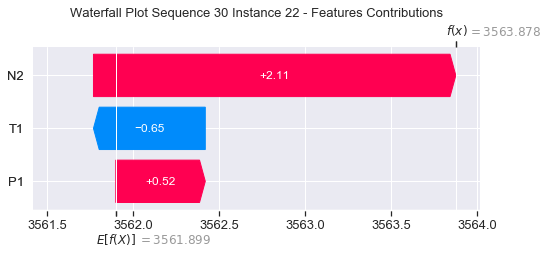

None

Contribution: [ 0.72123055 -3.44399329  4.18734078]


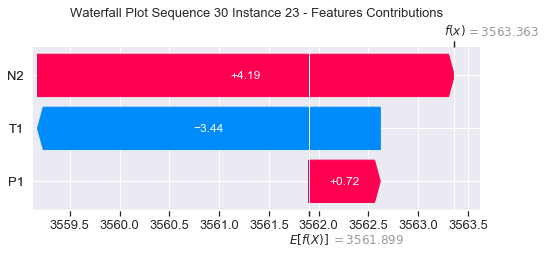

None

Contribution: [ 1.75597615 -8.41919793  6.94184915]


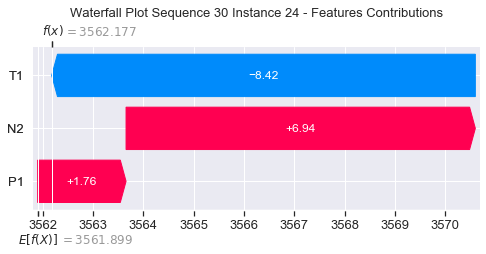

None

Contribution: [ 15.76332904 -21.82393181  35.48590296]


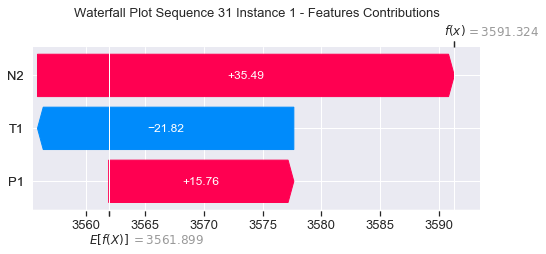

None

Contribution: [ 0.30139244 -1.4605075   1.16679511]


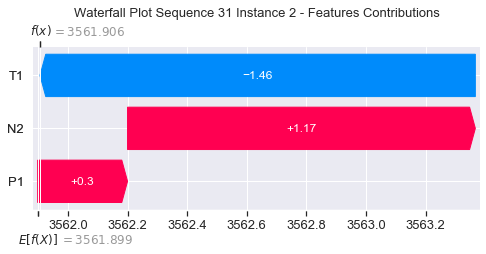

None

Contribution: [ 0.06009033 -0.09332552  0.29042001]


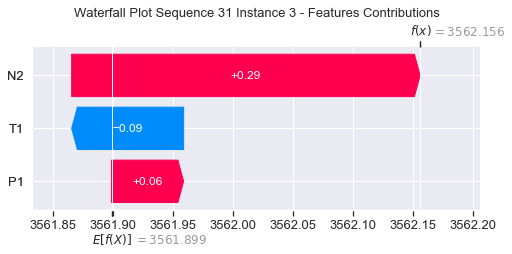

None

Contribution: [ 0.0283918  -0.00322995  0.10948593]


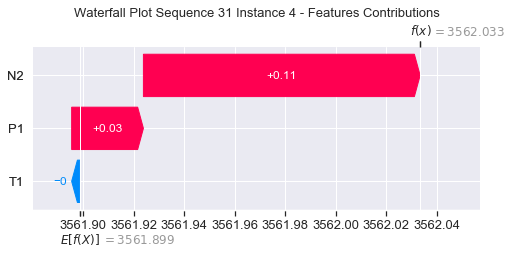

None

Contribution: [0.04776422 0.0503909  0.14660765]


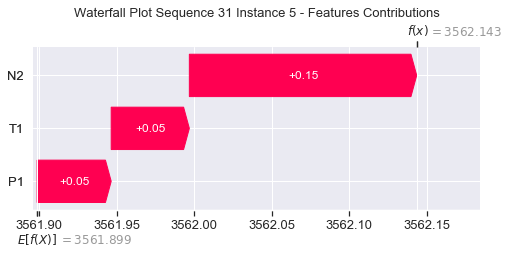

None

Contribution: [0.04091235 0.079009   0.12935871]


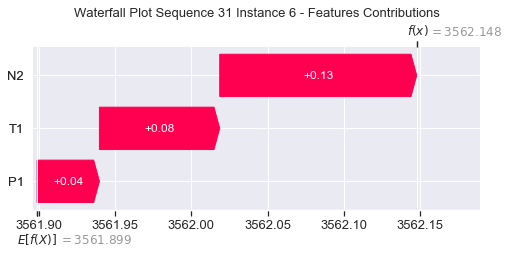

None

Contribution: [0.04107154 0.10534383 0.1281175 ]


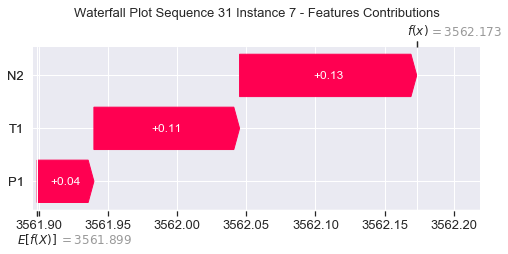

None

Contribution: [0.04661215 0.07269217 0.14729143]


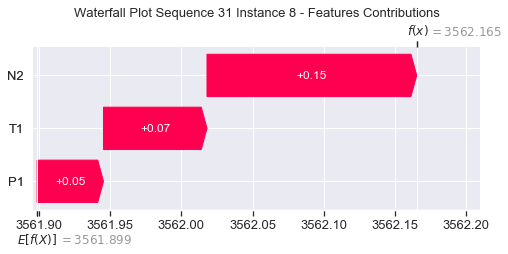

None

Contribution: [0.05764101 0.05114684 0.16730557]


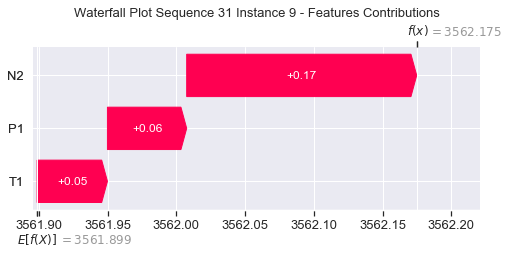

None

Contribution: [0.0577591  0.05018219 0.1850114 ]


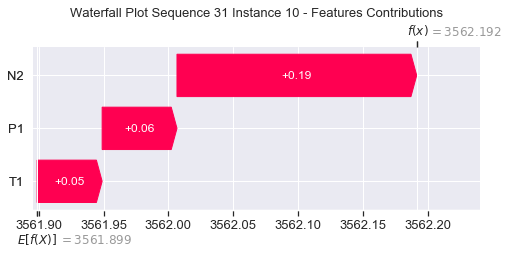

None

Contribution: [0.06408101 0.05317134 0.20919372]


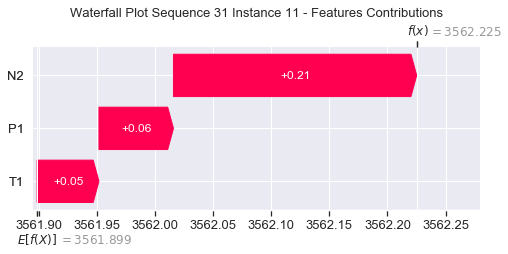

None

Contribution: [0.06418909 0.04280914 0.23449237]


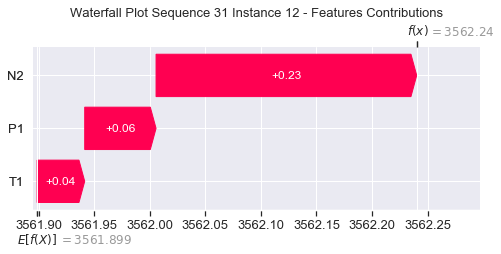

None

Contribution: [0.07575014 0.04297206 0.27054245]


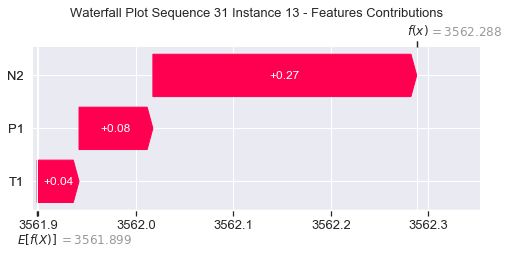

None

Contribution: [0.08349606 0.0217361  0.31349659]


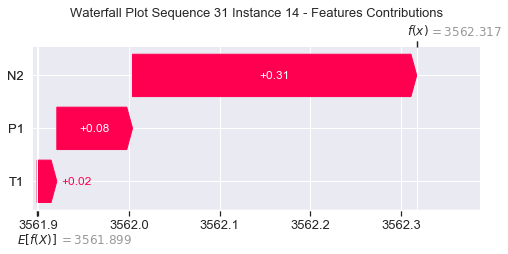

None

Contribution: [0.09715837 0.01944657 0.36731801]


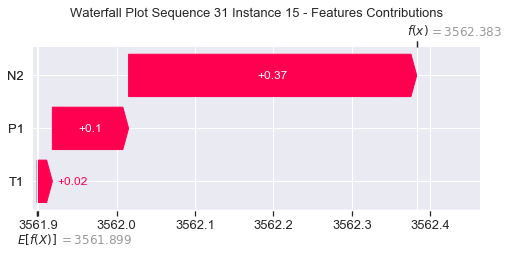

None

Contribution: [0.1151247  0.0342751  0.44343139]


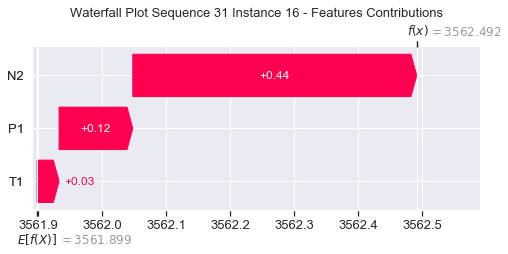

None

Contribution: [0.14027523 0.01588614 0.51653562]


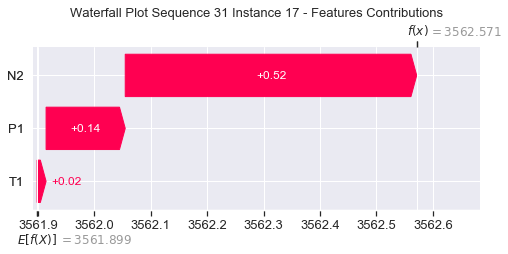

None

Contribution: [0.16528121 0.01541174 0.61439944]


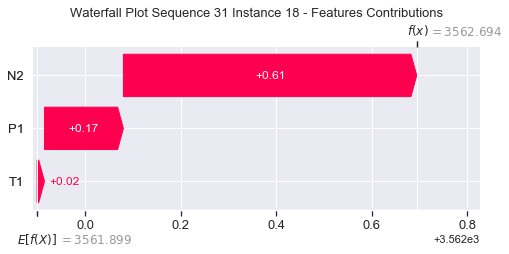

None

Contribution: [0.17567111 0.01305344 0.74510811]


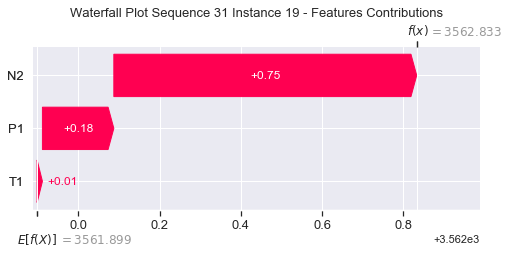

None

Contribution: [0.26034751 0.03550413 0.90722694]


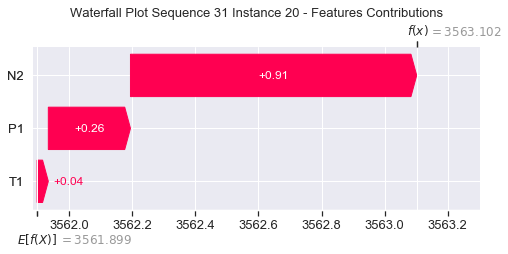

None

Contribution: [ 0.37214628 -0.00849283  1.25509869]


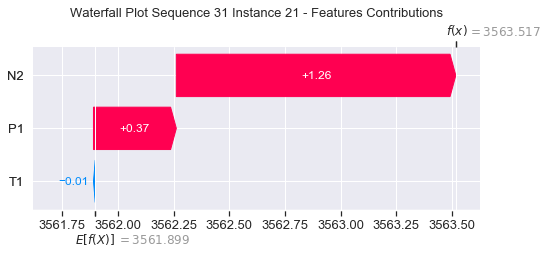

None

Contribution: [ 0.63424555 -0.569741    2.16476475]


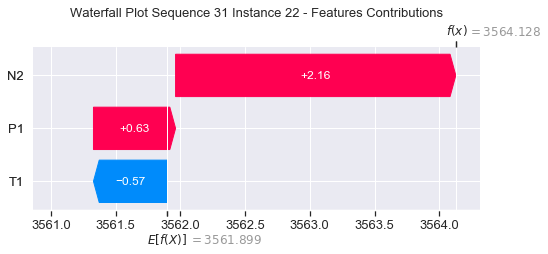

None

Contribution: [ 0.99536065 -3.30505046  4.31031127]


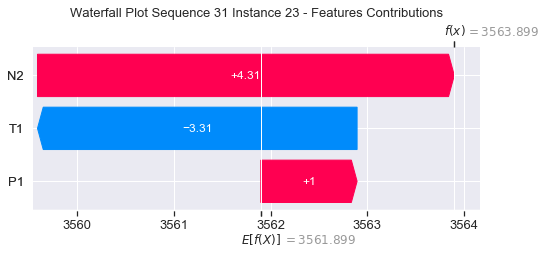

None

Contribution: [ 1.82046798 -9.33735801  7.05828149]


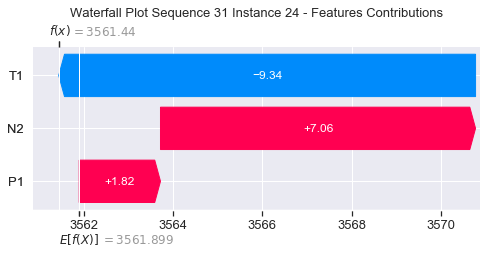

None

Contribution: [  6.8827486  -36.46015971  32.9174046 ]


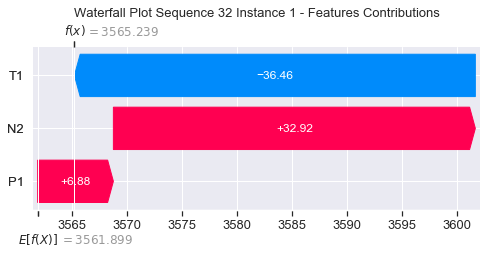

None

Contribution: [ 0.47894681 -1.508185    1.212925  ]


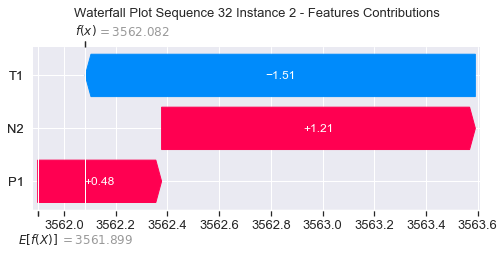

None

Contribution: [ 0.0476571  -0.11923926  0.28487471]


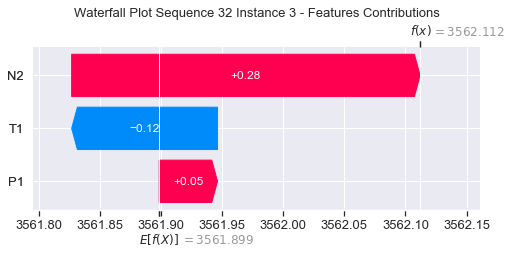

None

Contribution: [ 0.0331607  -0.01616798  0.1110565 ]


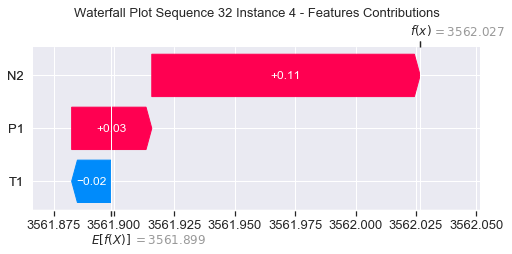

None

Contribution: [0.05147629 0.03745042 0.14716851]


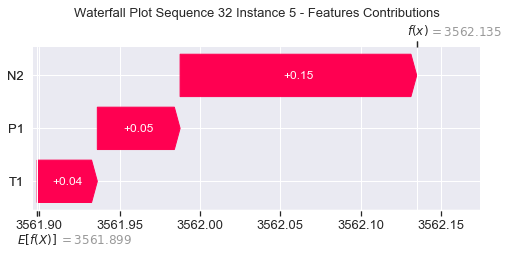

None

Contribution: [0.04398106 0.06769021 0.12896499]


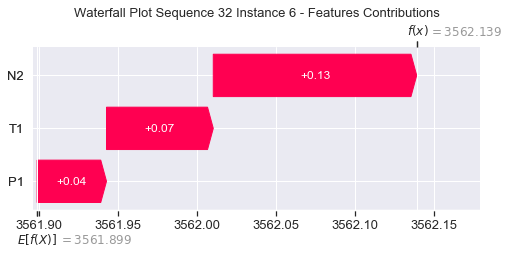

None

Contribution: [0.04094243 0.0971106  0.12529376]


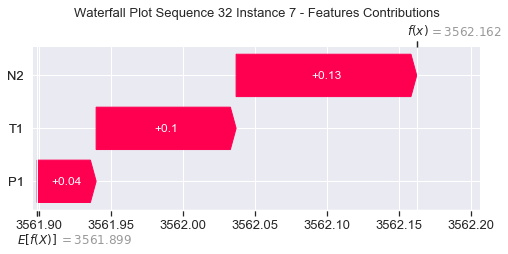

None

Contribution: [0.04904555 0.06438769 0.14729948]


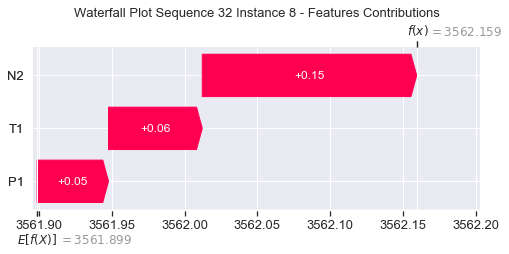

None

Contribution: [0.04445528 0.04616339 0.16449214]


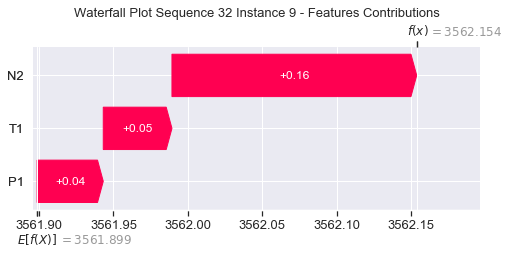

None

Contribution: [0.04334578 0.04599138 0.17960272]


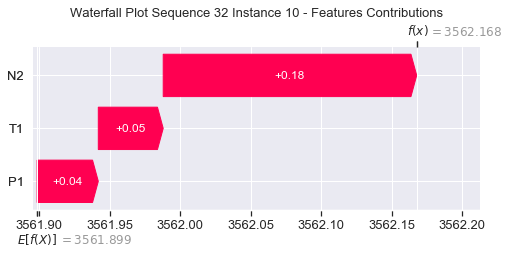

None

Contribution: [0.05535001 0.04908377 0.20704284]


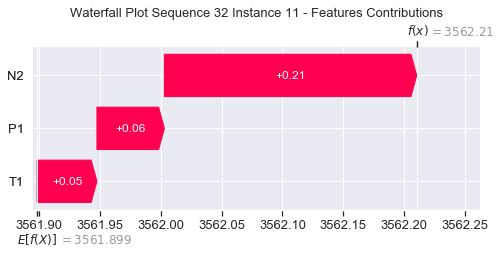

None

Contribution: [0.07479238 0.03735573 0.24111744]


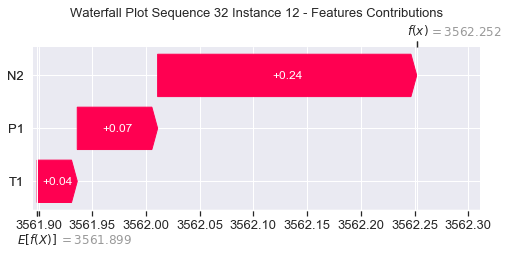

None

Contribution: [0.08488347 0.03909195 0.27804063]


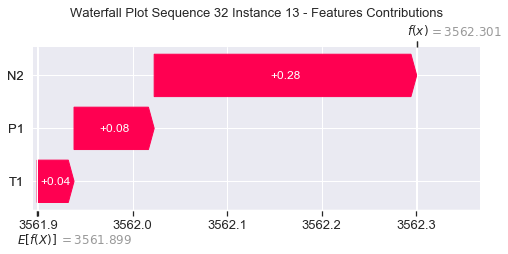

None

Contribution: [0.08860267 0.03555507 0.32257089]


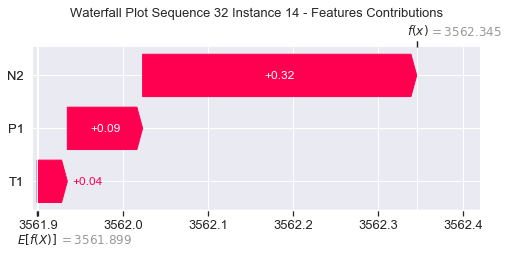

None

Contribution: [0.10656753 0.01354168 0.37878963]


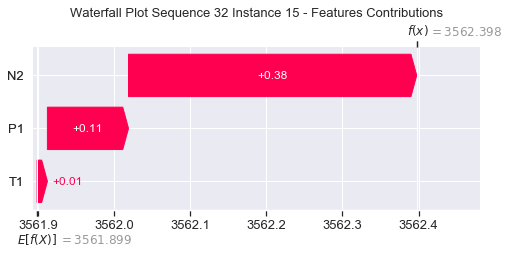

None

Contribution: [0.10725608 0.00946312 0.44709943]


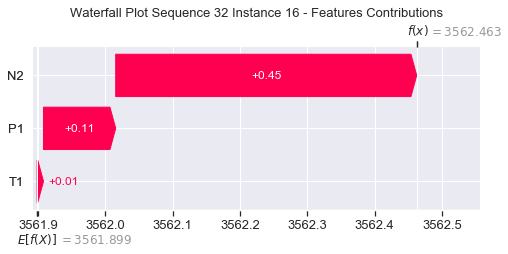

None

Contribution: [0.14688009 0.00619217 0.530906  ]


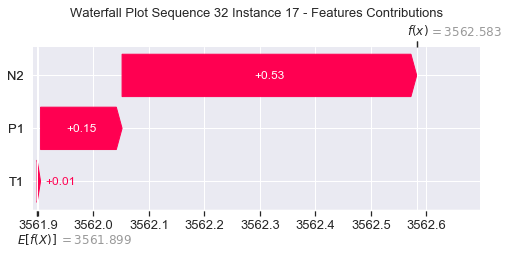

None

Contribution: [ 0.17189814 -0.00236719  0.63129796]


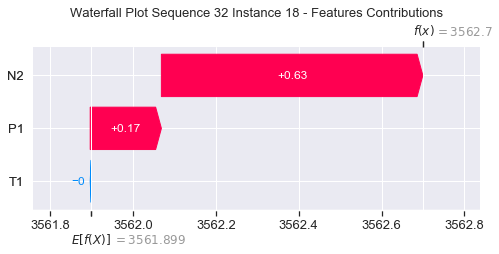

None

Contribution: [ 0.14549676 -0.05249459  0.7403342 ]


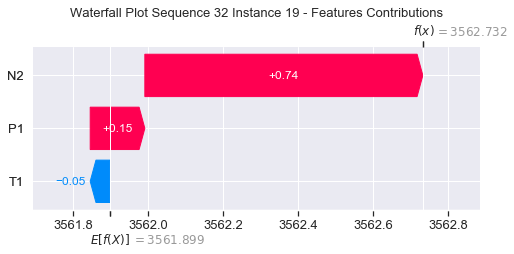

None

Contribution: [ 0.2493072  -0.03994242  0.92944765]


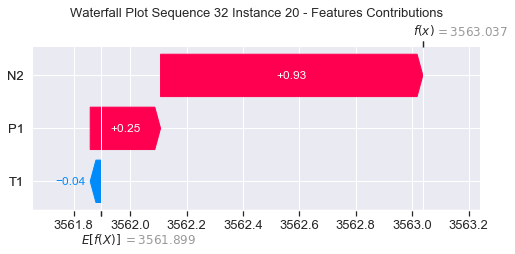

None

Contribution: [ 0.35270508 -0.16776045  1.29553796]


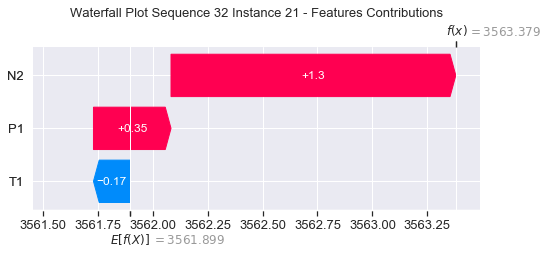

None

Contribution: [ 0.57818482 -0.97071648  2.26462821]


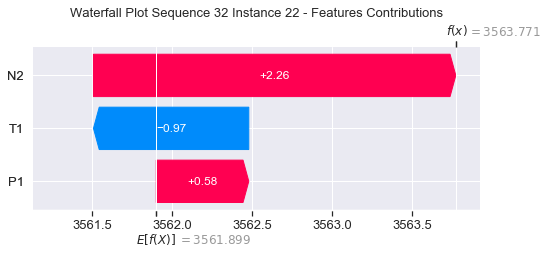

None

Contribution: [ 0.88941079 -4.31802276  4.62826764]


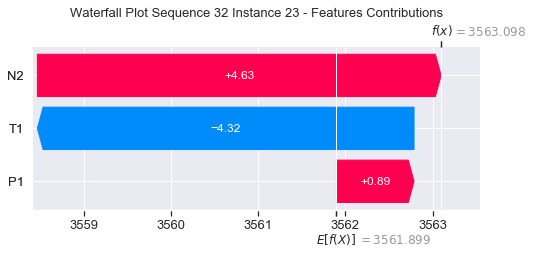

None

Contribution: [  1.74857323 -11.03750141   7.86014291]


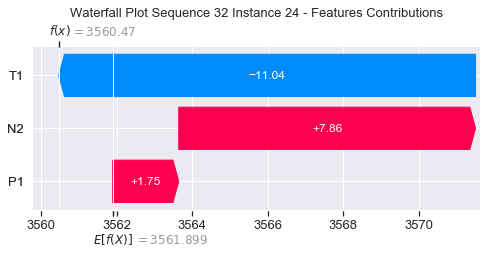

None

Contribution: [ 10.96831632 -32.67580317  39.16814933]


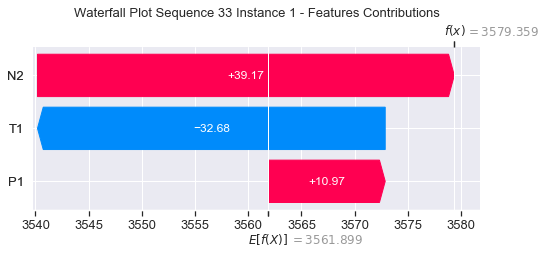

None

Contribution: [ 0.39466816 -1.76370435  1.35472942]


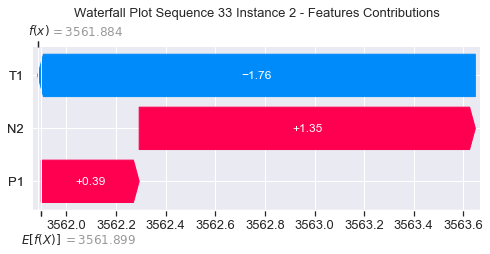

None

Contribution: [ 0.04439952 -0.16118928  0.29840435]


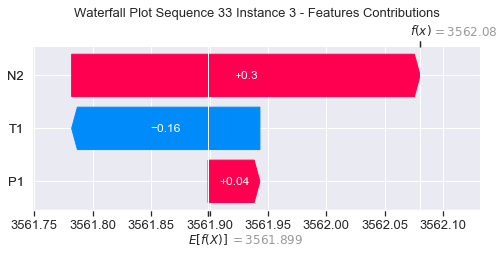

None

Contribution: [ 0.0354014  -0.01055455  0.11506228]


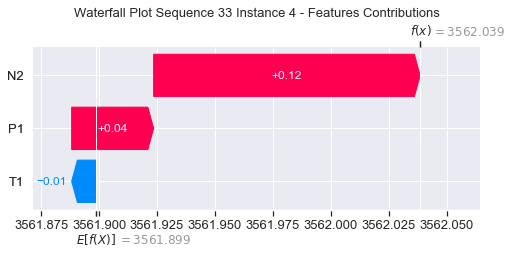

None

Contribution: [0.04309971 0.03736882 0.14711647]


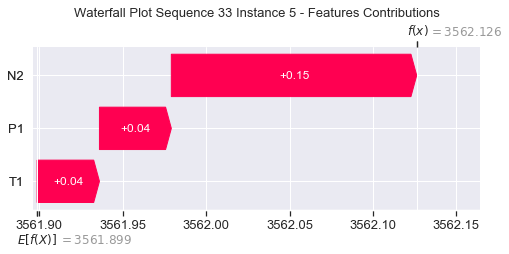

None

Contribution: [0.04261042 0.07093351 0.13058875]


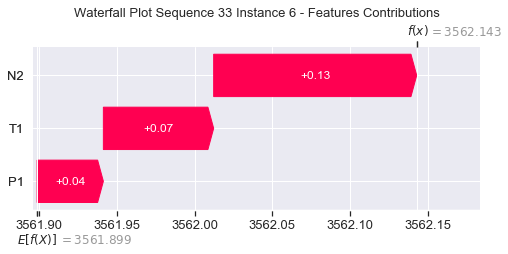

None

Contribution: [0.04125291 0.10515601 0.12836125]


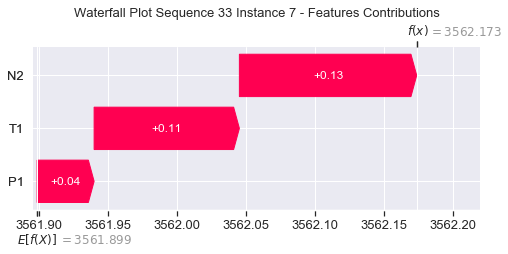

None

Contribution: [0.04627408 0.06663436 0.1489399 ]


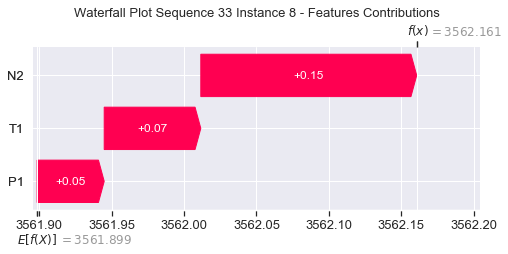

None

Contribution: [0.0370863  0.04443932 0.16650009]


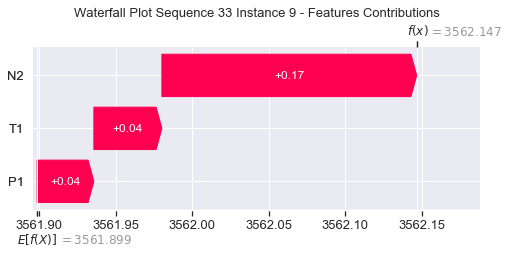

None

Contribution: [0.0450698  0.04189778 0.18365109]


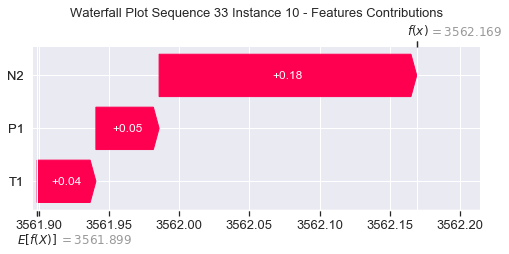

None

Contribution: [0.05436596 0.04372926 0.21249472]


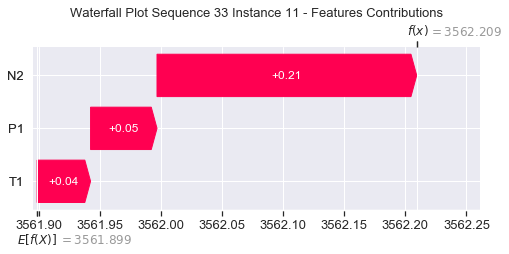

None

Contribution: [0.06971025 0.02801568 0.23947427]


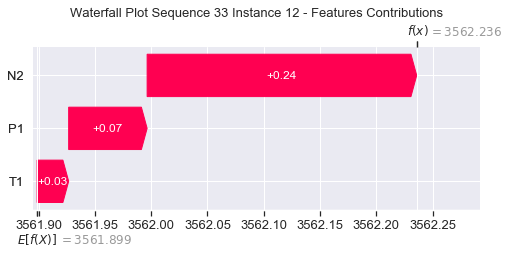

None

Contribution: [0.07726476 0.02655019 0.27551414]


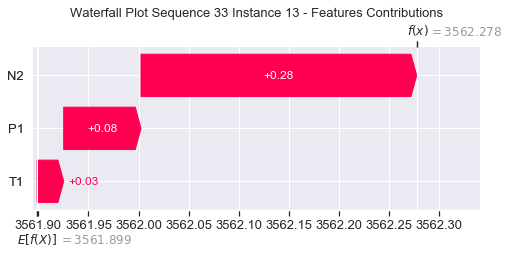

None

Contribution: [0.08549101 0.00804779 0.31651447]


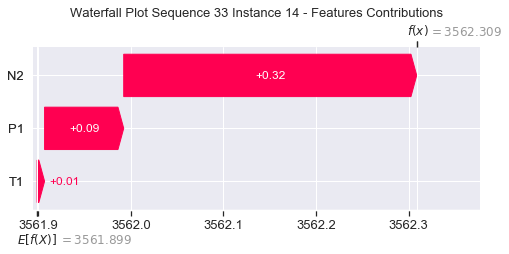

None

Contribution: [ 0.10032048 -0.00584767  0.3748404 ]


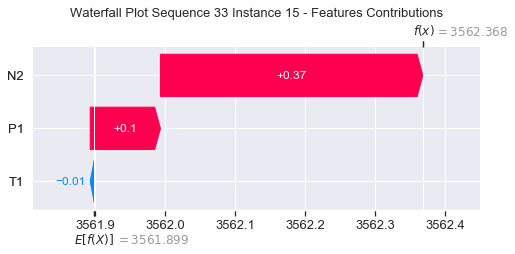

None

Contribution: [ 0.10444174 -0.00232044  0.44092718]


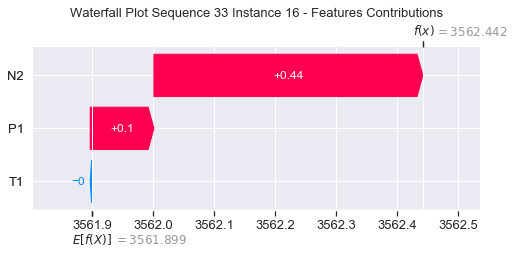

None

Contribution: [ 0.13605508 -0.02390121  0.52345836]


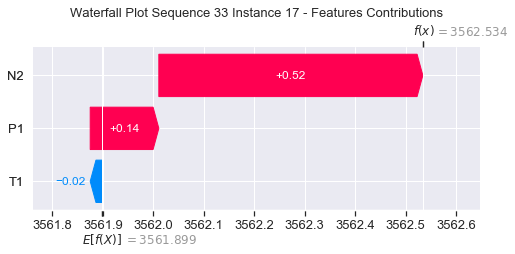

None

Contribution: [ 0.16165757 -0.03378966  0.62227146]


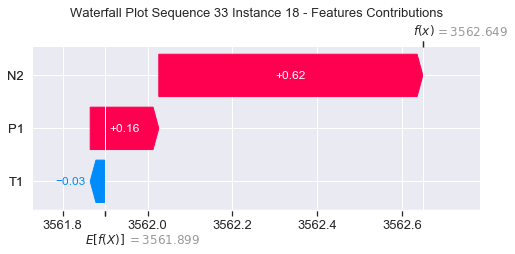

None

Contribution: [ 0.15622974 -0.05420555  0.73893543]


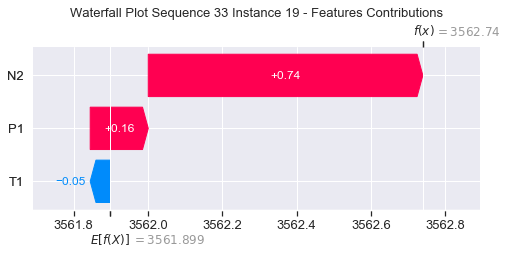

None

Contribution: [ 0.21838169 -0.08835033  0.90855676]


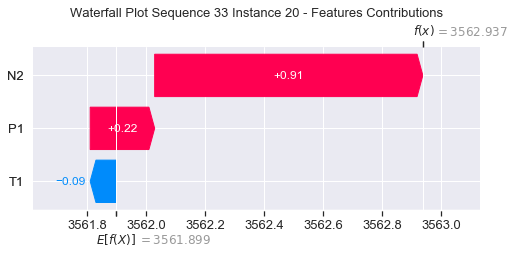

None

Contribution: [ 0.2888056  -0.29664449  1.24414849]


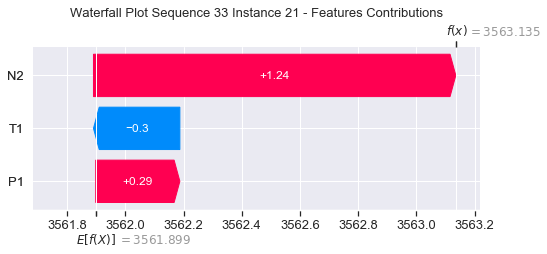

None

Contribution: [ 0.41229607 -1.38254468  2.10360304]


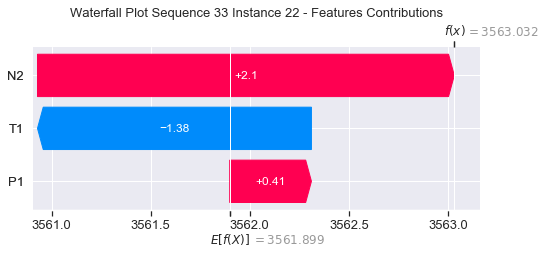

None

Contribution: [ 0.53945412 -5.49889714  4.12960104]


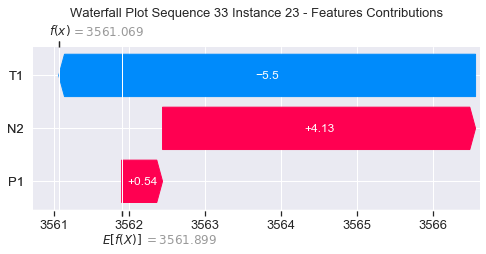

None

Contribution: [  1.12659289 -13.25867604   6.83917734]


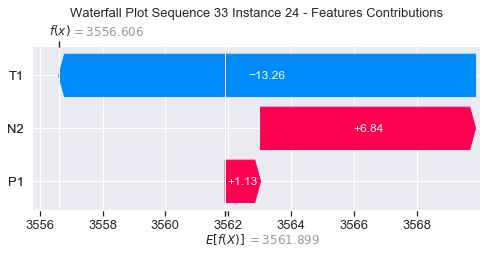

None

Contribution: [ 10.68898955 -42.68828695  35.24970541]


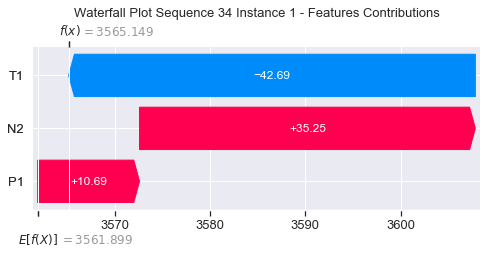

None

Contribution: [ 0.14199346 -2.65165574  1.11598529]


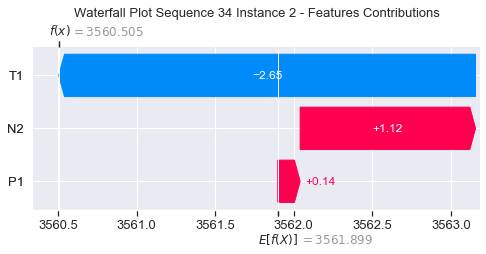

None

Contribution: [ 0.05051148 -0.23929655  0.27853474]


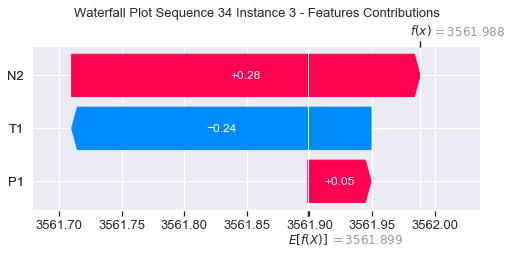

None

Contribution: [ 0.02504244 -0.05070353  0.10471671]


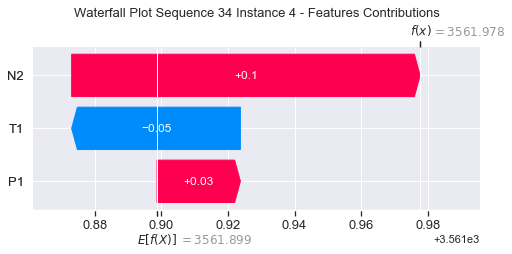

None

Contribution: [0.03871656 0.01575645 0.14079158]


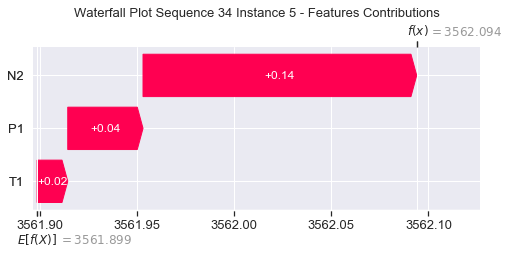

None

Contribution: [0.03771184 0.05985954 0.12839186]


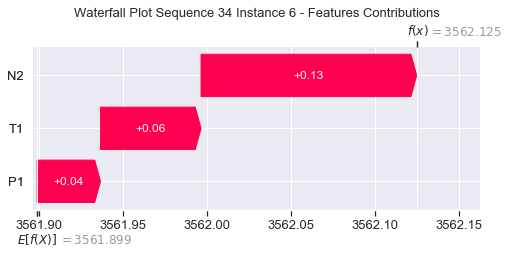

None

Contribution: [0.04011175 0.10369873 0.12908369]


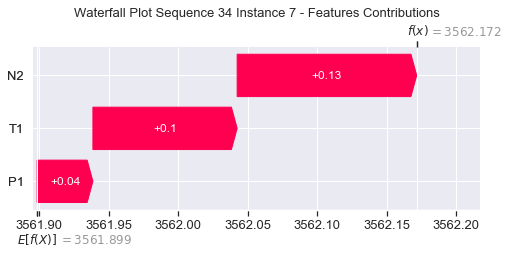

None

Contribution: [0.04055915 0.06068936 0.146143  ]


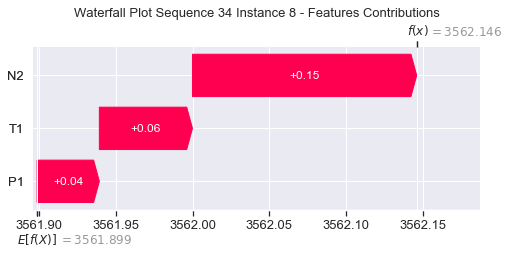

None

Contribution: [0.03249432 0.03096289 0.16499408]


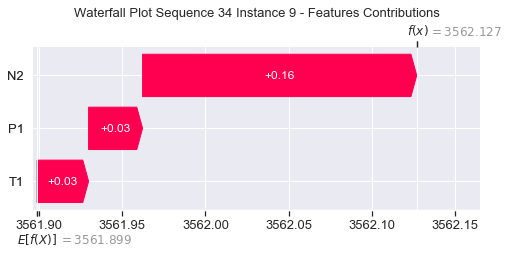

None

Contribution: [0.03316699 0.02658171 0.18400787]


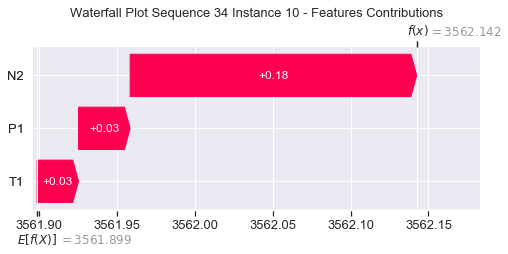

None

Contribution: [0.03709507 0.03151268 0.20876466]


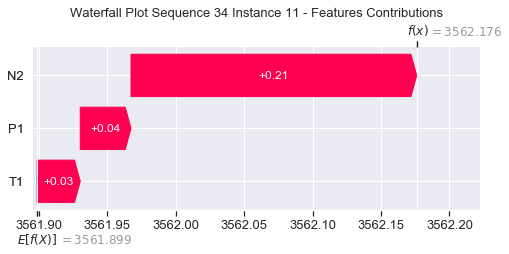

None

Contribution: [0.04963616 0.01988648 0.23727625]


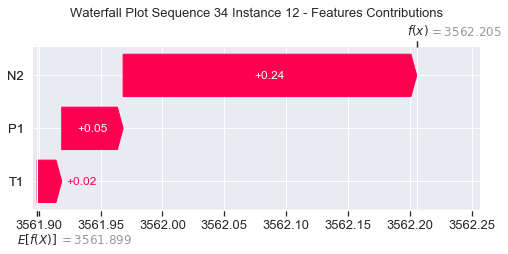

None

Contribution: [0.05933266 0.01858941 0.27399306]


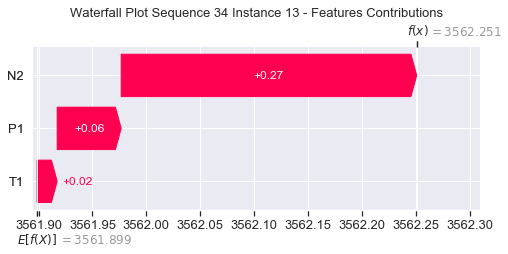

None

Contribution: [0.0519326  0.00080899 0.31711598]


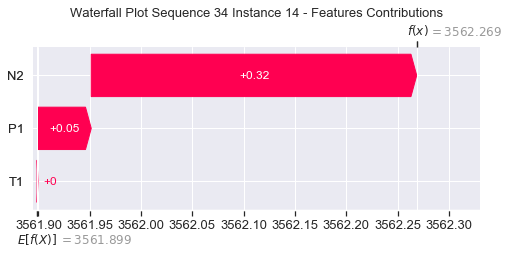

None

Contribution: [ 0.08076454 -0.01268873  0.37368923]


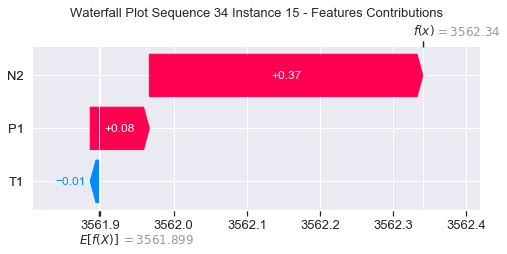

None

Contribution: [ 0.10318801 -0.03331718  0.4506908 ]


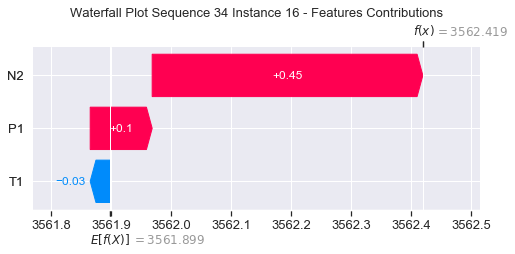

None

Contribution: [ 0.11717185 -0.03181269  0.52535073]


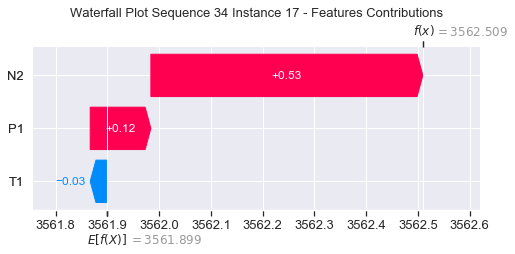

None

Contribution: [ 0.13998678 -0.04549793  0.62479807]


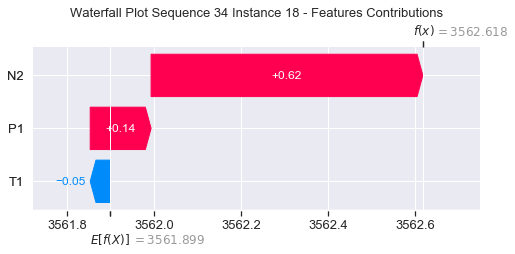

None

Contribution: [ 0.13083878 -0.09126072  0.74562697]


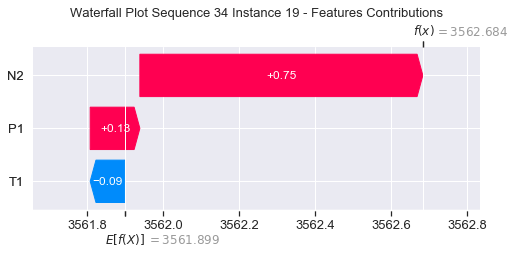

None

Contribution: [ 0.20926874 -0.12839776  0.91308563]


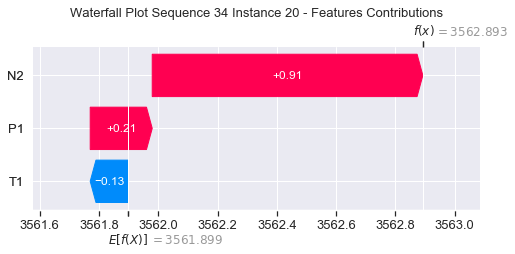

None

Contribution: [ 0.26238619 -0.37898829  1.24949243]


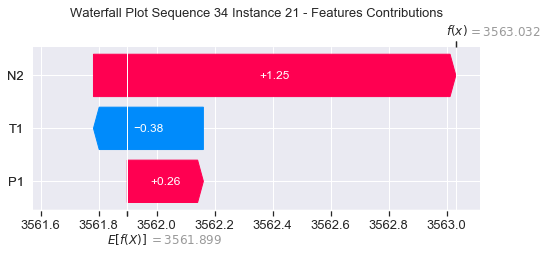

None

Contribution: [ 0.32998427 -1.5613287   2.10614432]


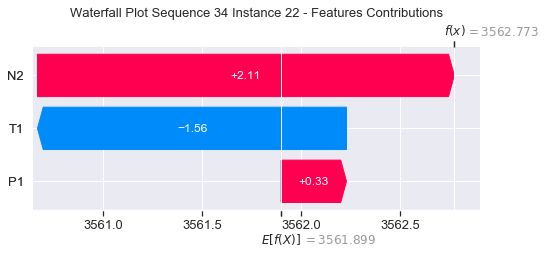

None

Contribution: [ 0.18248832 -5.9282756   4.18113305]


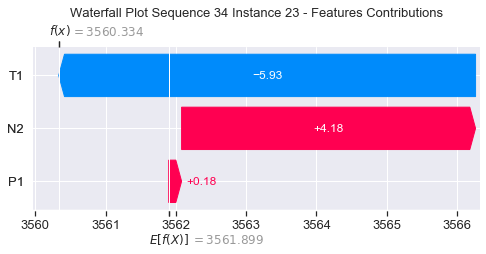

None

Contribution: [  0.61758466 -14.6028004    6.79053606]


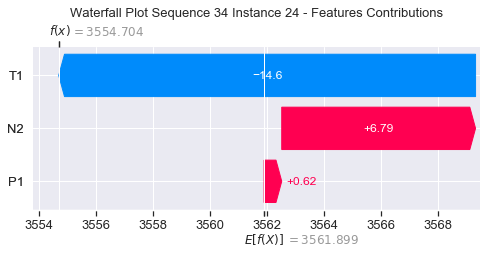

None

In [37]:
#Waterfall Plot for Consistency metric

sns.set()
instance = xtrain
instance2 = xtest
explainer = shap.DeepExplainer(model3,instance)
    
for s in range(0,34):
    instance=xtest[s:s+1]
    shap_values = explainer.shap_values(instance)
    e = explainer.expected_value
    for j in range(24):
        print("Contribution:",shap_values[0][0][j])
        plt.title("Waterfall Plot Sequence %s " %(s+1)+"Instance %i - Features Contributions" %(j+1),fontsize=13)
        waterfall_display = shap.plots._waterfall.waterfall_legacy(e[0],shap_values[0][0][j],feature_names=features,show=True)
        display(waterfall_display)